In [1]:
import os
import json
import re
import math
from datetime import datetime, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as ticker

from skimage.io import imread, imsave
from skimage.transform import warp
from scipy.optimize import curve_fit
from scipy.signal import savgol_filter, find_peaks
import scipy.stats as stats
from scipy.integrate import odeint, solve_ivp
from numba import njit, prange
from skimage.filters import gaussian
from scipy.ndimage import uniform_filter1d
from numpy.polynomial import Polynomial
from sklearn.metrics import r2_score

In [2]:
def extract_array(s):
    numbers = re.findall(r"[-+]?\d*\.?\d+e[-+]?\d+|[-+]?\d*\.?\d+", s)
    return np.array([float(num) for num in numbers])

In [3]:
def gompertz(t, A, mu, l):
    log_B = A * np.exp(-np.exp(mu * np.exp(1) / A * (l - t) + 1))
    return log_B

In [4]:
def gompertz_growth_rate(t, A, mu, l):
    gr = mu * np.exp(np.exp(1) * mu * (l - t) / A - np.exp(np.exp(1) * mu * (l - t) / A + 1) + 2)
    return gr

In [5]:
def tm_gomp(A, mu, l):
    return A / (mu * np.e) + l

In [6]:
def logistic(t, A, mu, l):
    log_B = A / (1 + np.exp(4 * mu / A * (l - t) + 2))
    return log_B

In [7]:
def logistic_growth_rate(t, A, mu, l):
    gr = 4 * mu * np.exp(4 * mu / A * (l - t) + 2) / (1 + np.exp(4 * mu / A * (l - t) + 2))**2
    return gr

In [8]:
def tm_logistic(A, mu, l):
    return A / (2 * mu) + l

### Gompertz and Logistic fit

#### $\mu m$

In [9]:
df = pd.read_excel('../data_processed.xlsx')

0
Gompertz Model:
  SSR: 0.4449
  R²: 0.9944
  AIC: -1330.0212
  BIC: -1319.8954

Logistic Model:
  SSR: 0.3205
  R²: 0.9960
  AIC: -1400.8401
  BIC: -1390.7143

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15568092e+01 3.50119496e-02 7.12219293e+01]
Logistic params are: [1.15535724e+01 2.59990040e-02 9.10414382e-17]


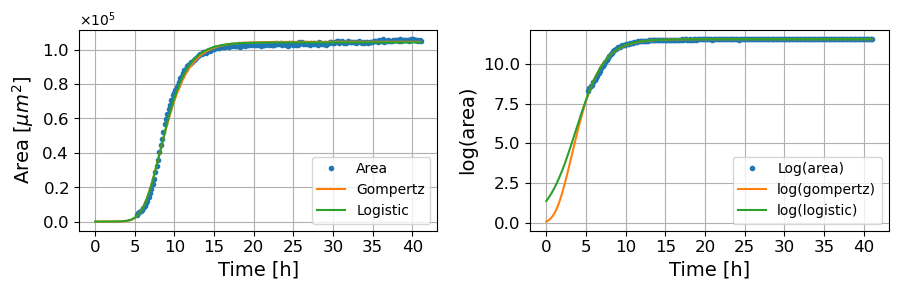

1
Gompertz Model:
  SSR: 0.2865
  R²: 0.9959
  AIC: -1425.0498
  BIC: -1414.9239

Logistic Model:
  SSR: 0.2119
  R²: 0.9970
  AIC: -1490.2632
  BIC: -1480.1373

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19136734e+01 3.72672532e-02 6.81546816e+01]
Logistic params are: [1.19100416e+01 2.77472909e-02 4.89277607e-12]


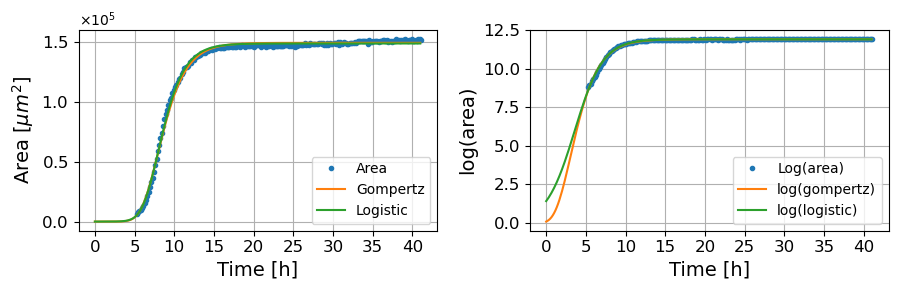

2
Gompertz Model:
  SSR: 0.2747
  R²: 0.9953
  AIC: -1434.1223
  BIC: -1423.9964

Logistic Model:
  SSR: 0.2268
  R²: 0.9961
  AIC: -1475.5361
  BIC: -1465.4102

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18424879e+01 3.77593840e-02 6.20054150e+01]
Logistic params are: [1.18379405e+01 2.84726767e-02 3.66990792e-13]


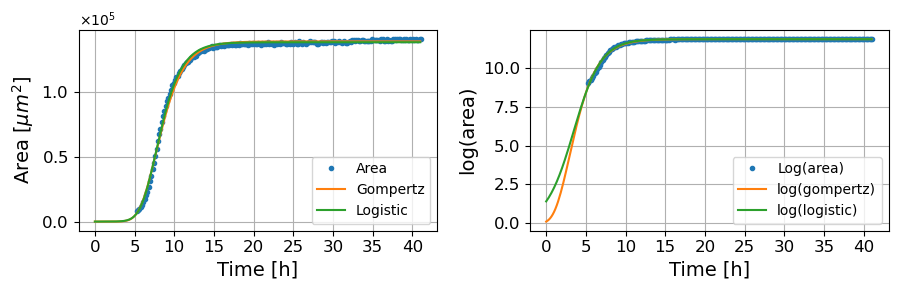

3
Gompertz Model:
  SSR: 0.1962
  R²: 0.9952
  AIC: -1506.8184
  BIC: -1496.6925

Logistic Model:
  SSR: 0.3691
  R²: 0.9910
  AIC: -1370.3456
  BIC: -1360.2197

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.52527561  0.03497658 26.82414293]
Logistic params are: [1.15142105e+01 2.90122583e-02 1.53610955e-19]


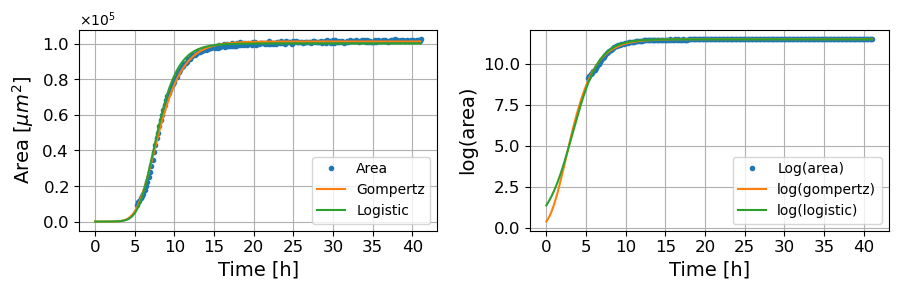

4
Gompertz Model:
  SSR: 0.3235
  R²: 0.9946
  AIC: -1398.8392
  BIC: -1388.7134

Logistic Model:
  SSR: 0.2520
  R²: 0.9958
  AIC: -1452.7677
  BIC: -1442.6419

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.17903872e+01 3.84768055e-02 7.10448825e+01]
Logistic params are: [1.17880769e+01 2.82275892e-02 4.60229002e-11]


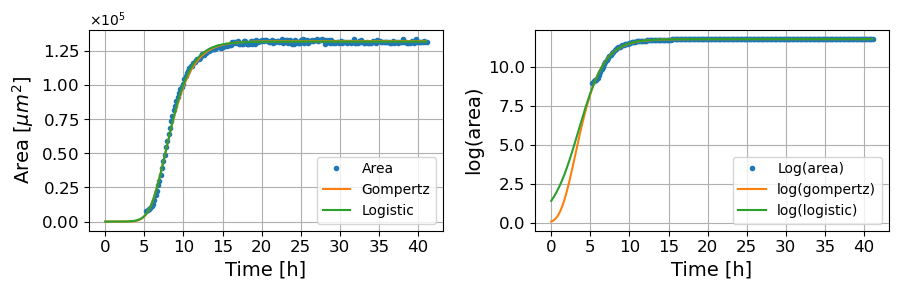

5
Gompertz Model:
  SSR: 0.2256
  R²: 0.9967
  AIC: -1476.7224
  BIC: -1466.5966

Logistic Model:
  SSR: 0.1608
  R²: 0.9976
  AIC: -1549.8696
  BIC: -1539.7438

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15632303e+01 3.66941188e-02 7.35529025e+01]
Logistic params are: [11.56089841  0.0269406   0.95517725]


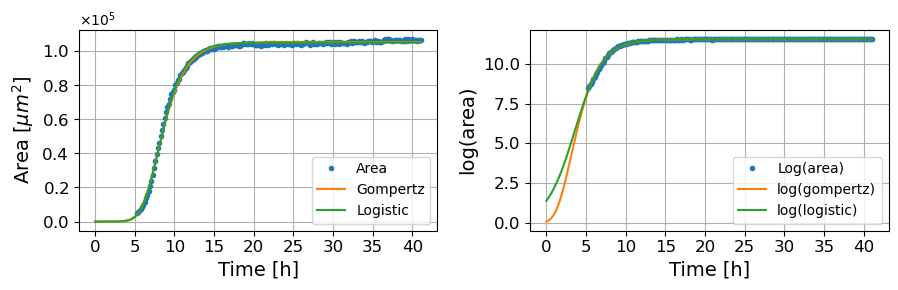

6
Gompertz Model:
  SSR: 0.8161
  R²: 0.9918
  AIC: -1198.9592
  BIC: -1188.8333

Logistic Model:
  SSR: 1.0870
  R²: 0.9891
  AIC: -1137.0342
  BIC: -1126.9083

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.09283581e+01 2.68117790e-02 2.81046701e+01]
Logistic params are: [1.09091317e+01 2.27853071e-02 2.12423083e-20]


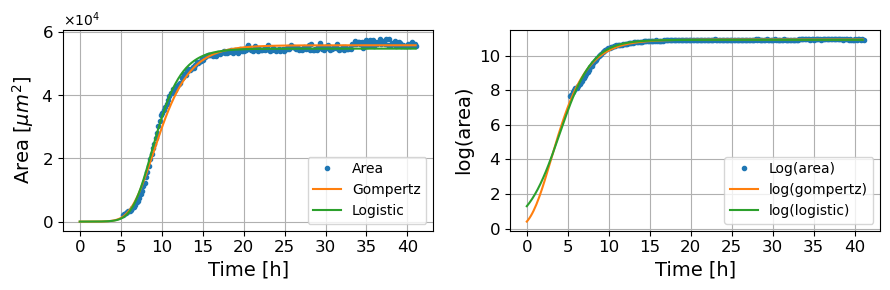

7
Gompertz Model:
  SSR: 0.3613
  R²: 0.9970
  AIC: -1374.9816
  BIC: -1364.8557

Logistic Model:
  SSR: 0.9345
  R²: 0.9923
  AIC: -1169.6833
  BIC: -1159.5574

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [10.46305832  0.02344733 21.11120987]
Logistic params are: [1.04376098e+01 2.04596068e-02 1.90236223e-15]


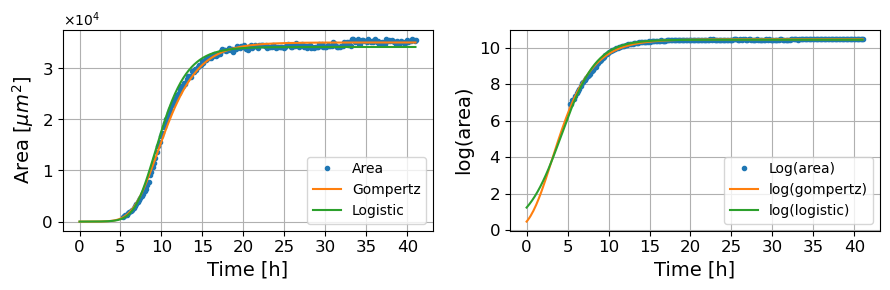

8
Gompertz Model:
  SSR: 0.2785
  R²: 0.9959
  AIC: -1431.1801
  BIC: -1421.0543

Logistic Model:
  SSR: 0.1979
  R²: 0.9971
  AIC: -1505.0010
  BIC: -1494.8752

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18950286e+01 3.79424809e-02 7.23535939e+01]
Logistic params are: [1.18926806e+01 2.78495319e-02 3.64755569e-13]


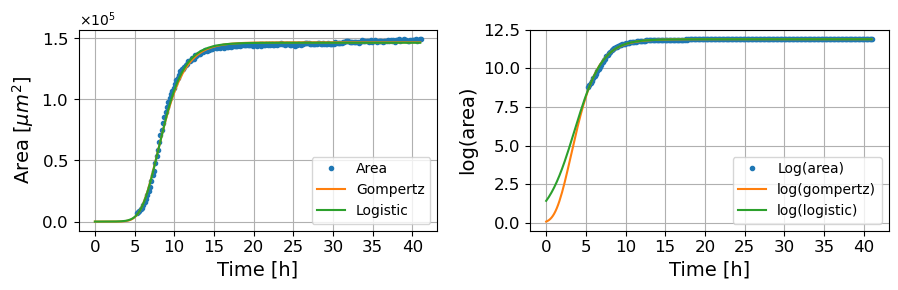

9
Gompertz Model:
  SSR: 0.1954
  R²: 0.9993
  AIC: -1507.7009
  BIC: -1497.5750

Logistic Model:
  SSR: 3.0355
  R²: 0.9885
  AIC: -915.2191
  BIC: -905.0933

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.36234355e+01 3.00594999e-02 2.68187464e-25]
Logistic params are: [1.35744059e+01 2.78592916e-02 5.37620092e-16]


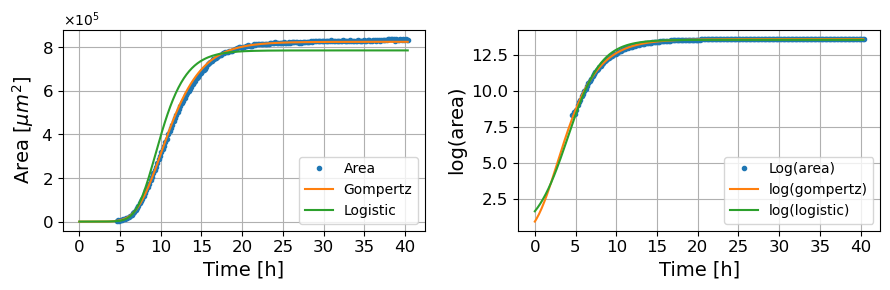

10
Gompertz Model:
  SSR: 0.8190
  R²: 0.9978
  AIC: -1198.1804
  BIC: -1188.0546

Logistic Model:
  SSR: 1.2397
  R²: 0.9967
  AIC: -1108.6485
  BIC: -1098.5227

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.34572929e+01 3.00974386e-02 4.24611102e+01]
Logistic params are: [1.34296305e+01 2.50873796e-02 2.37494411e-20]


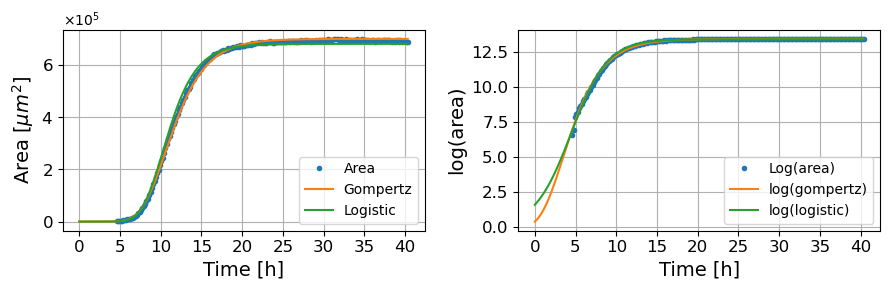

11
Gompertz Model:
  SSR: 0.6653
  R²: 0.9976
  AIC: -1243.0711
  BIC: -1232.9453

Logistic Model:
  SSR: 2.2157
  R²: 0.9920
  AIC: -983.2200
  BIC: -973.0941

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.07000264  0.02864023 10.04669501]
Logistic params are: [1.30279871e+01 2.58745711e-02 5.15366857e-18]


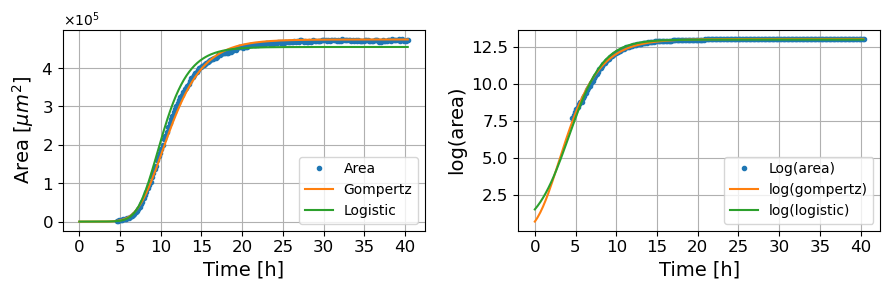

12
Gompertz Model:
  SSR: 0.2626
  R²: 0.9972
  AIC: -1443.9165
  BIC: -1433.7906

Logistic Model:
  SSR: 2.0555
  R²: 0.9783
  AIC: -999.4246
  BIC: -989.2988

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.25554970e+01 2.90665435e-02 1.09388174e-22]
Logistic params are: [1.25242204e+01 2.63716214e-02 1.29568715e-14]


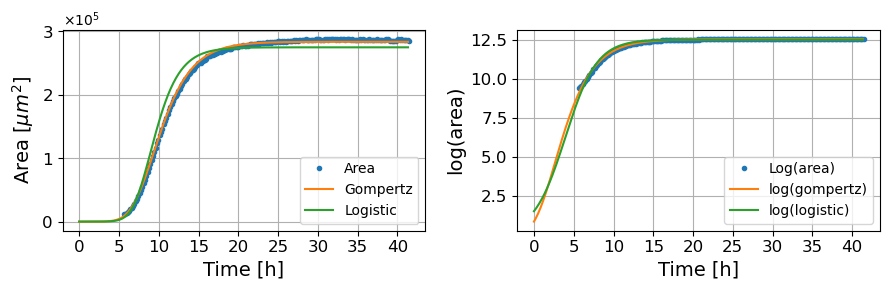

13
Gompertz Model:
  SSR: 0.1525
  R²: 0.9981
  AIC: -1561.3072
  BIC: -1551.1814

Logistic Model:
  SSR: 1.2793
  R²: 0.9844
  AIC: -1101.8565
  BIC: -1091.7307

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.28324703e+01 3.10247582e-02 1.05013164e-26]
Logistic params are: [1.28048654e+01 2.79957716e-02 2.01463127e-17]


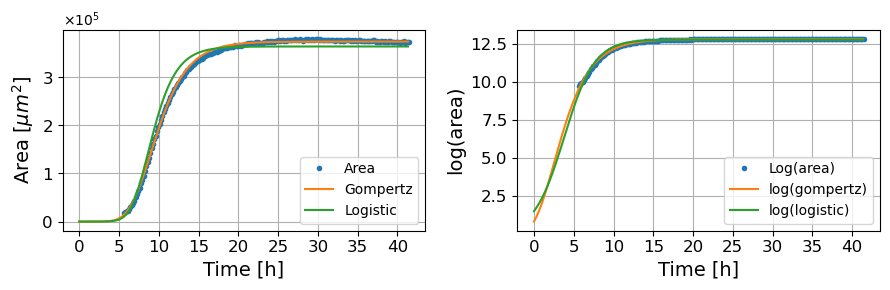

14
Gompertz Model:
  SSR: 0.1649
  R²: 0.9980
  AIC: -1544.3655
  BIC: -1534.2397

Logistic Model:
  SSR: 1.3993
  R²: 0.9827
  AIC: -1082.4912
  BIC: -1072.3654

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.29617421e+01 3.15400944e-02 6.06954114e-21]
Logistic params are: [1.29341996e+01 2.84462027e-02 9.38659585e-18]


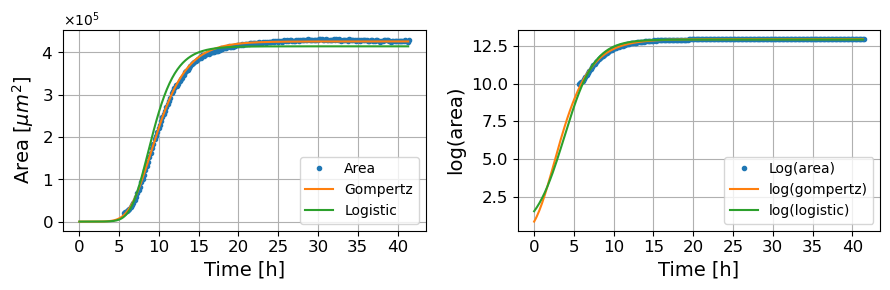

15
Gompertz Model:
  SSR: 0.2123
  R²: 0.9980
  AIC: -1489.7882
  BIC: -1479.6624

Logistic Model:
  SSR: 2.0487
  R²: 0.9807
  AIC: -1000.1420
  BIC: -990.0162

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27502930e+01 2.90022209e-02 5.20412411e-20]
Logistic params are: [1.27170323e+01 2.63598615e-02 1.29923156e-14]


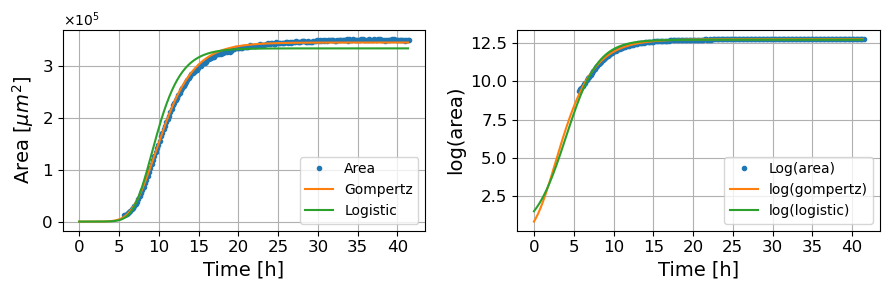

16
Gompertz Model:
  SSR: 0.2295
  R²: 0.9970
  AIC: -1472.9414
  BIC: -1462.8156

Logistic Model:
  SSR: 1.3253
  R²: 0.9825
  AIC: -1094.2307
  BIC: -1084.1048

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27801954e+01 3.13542914e-02 3.08640595e-15]
Logistic params are: [1.27538380e+01 2.82472110e-02 3.67127741e-17]


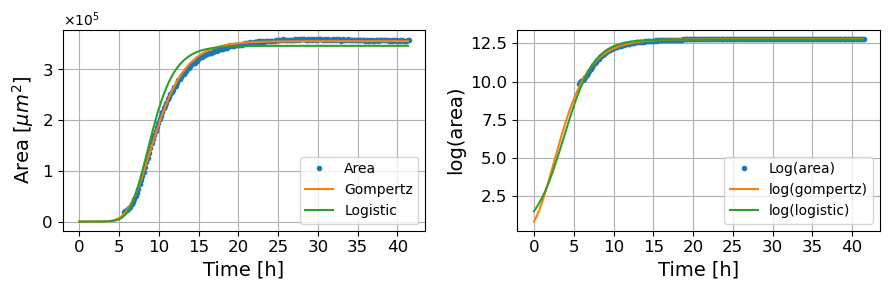

17
Gompertz Model:
  SSR: 0.2310
  R²: 0.9970
  AIC: -1471.5345
  BIC: -1461.4086

Logistic Model:
  SSR: 1.5473
  R²: 0.9797
  AIC: -1060.7730
  BIC: -1050.6472

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.28544402e+01 3.15489670e-02 3.13115655e-16]
Logistic params are: [1.28275334e+01 2.84361034e-02 2.69870843e-18]


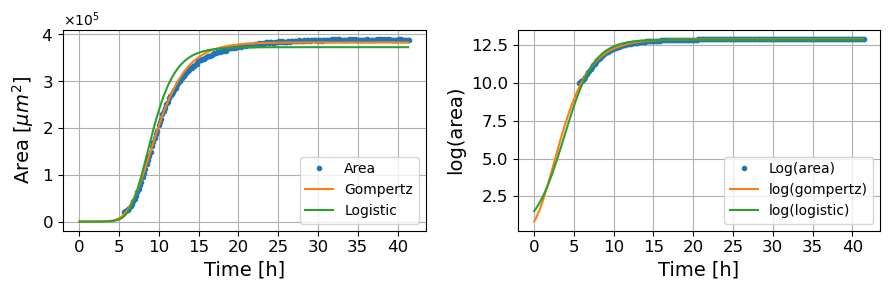

18
Gompertz Model:
  SSR: 9.5132
  R²: 0.9350
  AIC: -668.4811
  BIC: -658.3552

Logistic Model:
  SSR: 18.4966
  R²: 0.8736
  AIC: -524.8611
  BIC: -514.7353

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.35838491e+01 2.77289139e-02 6.45203956e-13]
Logistic params are: [1.35280065e+01 2.55922625e-02 6.16119446e-12]


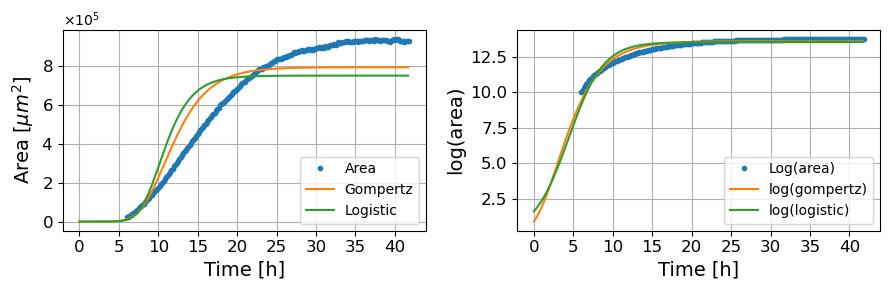

19
Gompertz Model:
  SSR: 0.0822
  R²: 0.9990
  AIC: -1694.6669
  BIC: -1684.5411

Logistic Model:
  SSR: 1.3501
  R²: 0.9842
  AIC: -1090.2254
  BIC: -1080.0996

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.34266271e+01 3.10019794e-02 4.15194772e-23]
Logistic params are: [1.33970926e+01 2.79195338e-02 5.08586122e-18]


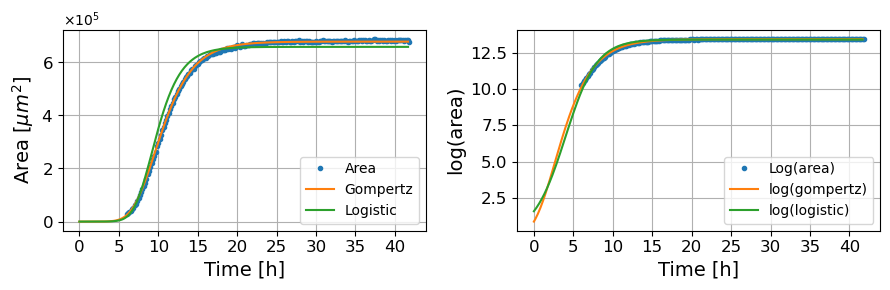

20
Gompertz Model:
  SSR: 0.3366
  R²: 0.9982
  AIC: -1390.2580
  BIC: -1380.1322

Logistic Model:
  SSR: 3.8279
  R²: 0.9791
  AIC: -865.1197
  BIC: -854.9938

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.35446842e+01 2.55637778e-02 7.71565951e-19]
Logistic params are: [1.34931513e+01 2.34584431e-02 1.54062283e-15]


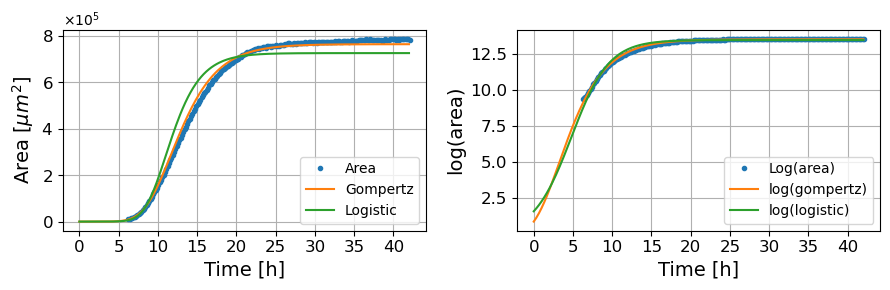

21
Gompertz Model:
  SSR: 2.1280
  R²: 0.9912
  AIC: -991.9367
  BIC: -981.8109

Logistic Model:
  SSR: 8.8751
  R²: 0.9631
  AIC: -683.4789
  BIC: -673.3530

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.38277617e+01 2.44593150e-02 7.00839210e-18]
Logistic params are: [1.37621325e+01 2.26260063e-02 1.33330355e-12]


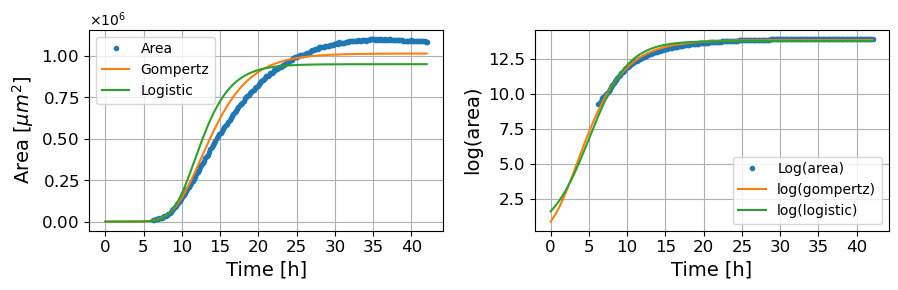

22
Gompertz Model:
  SSR: 1.5393
  R²: 0.9942
  AIC: -1061.8897
  BIC: -1051.7638

Logistic Model:
  SSR: 7.7803
  R²: 0.9708
  AIC: -711.9151
  BIC: -701.7893

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.37526264e+01 2.36364132e-02 2.30051024e-16]
Logistic params are: [1.36841323e+01 2.18971423e-02 9.65200053e-13]


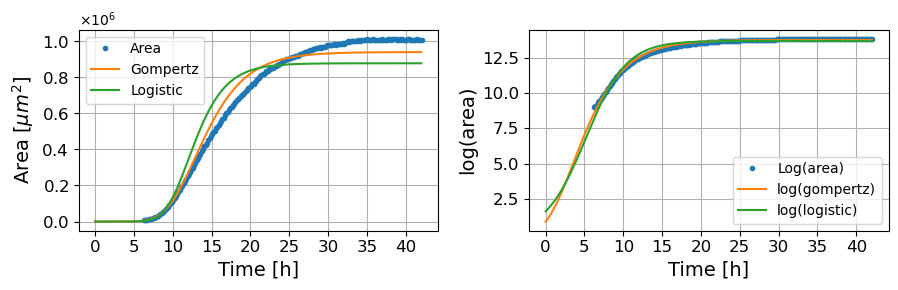

23
Gompertz Model:
  SSR: 0.3635
  R²: 0.9984
  AIC: -1373.6226
  BIC: -1363.4968

Logistic Model:
  SSR: 0.1610
  R²: 0.9993
  AIC: -1549.5829
  BIC: -1539.4570

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25796243e+01 3.05737036e-02 1.01646966e+02]
Logistic params are: [1.25724152e+01 2.32733469e-02 2.57716053e+01]


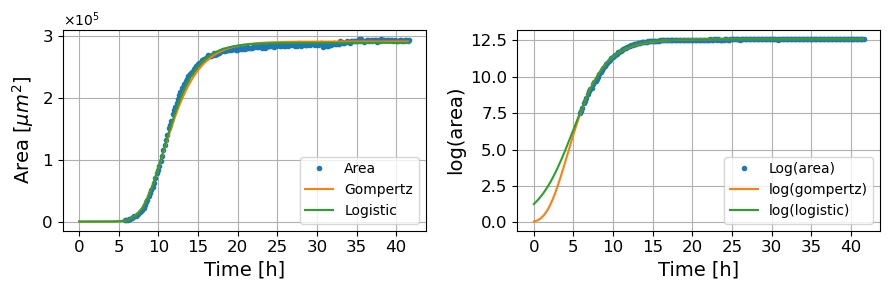

24
Gompertz Model:
  SSR: 0.7377
  R²: 0.9968
  AIC: -1220.7709
  BIC: -1210.6451

Logistic Model:
  SSR: 0.4480
  R²: 0.9980
  AIC: -1328.4817
  BIC: -1318.3558

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25906535e+01 3.08932908e-02 1.07451379e+02]
Logistic params are: [1.25832202e+01 2.35898565e-02 3.37936181e+01]


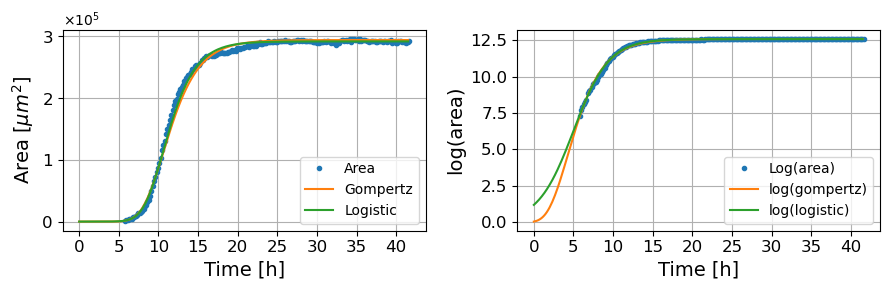

25
Gompertz Model:
  SSR: 0.1161
  R²: 0.9994
  AIC: -1620.2307
  BIC: -1610.1049

Logistic Model:
  SSR: 1.1423
  R²: 0.9943
  AIC: -1126.3265
  BIC: -1116.2007

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26292387e+01 2.56744951e-02 2.70584429e+01]
Logistic params are: [1.25940712e+01 2.22679128e-02 9.53298736e-16]


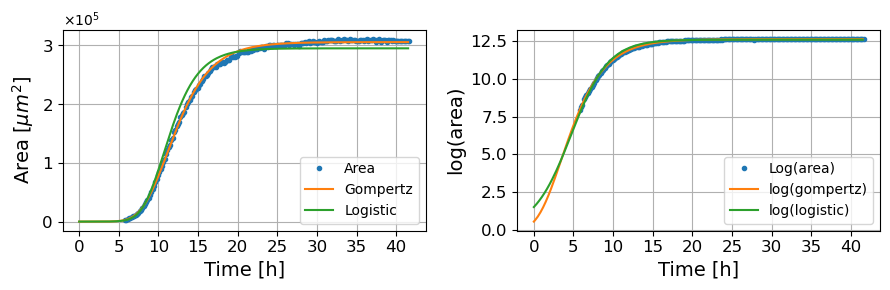

26
Gompertz Model:
  SSR: 0.2256
  R²: 0.9988
  AIC: -1476.6649
  BIC: -1466.5391

Logistic Model:
  SSR: 1.6695
  R²: 0.9914
  AIC: -1044.3508
  BIC: -1034.2250

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.63148383  0.02496518 13.53318788]
Logistic params are: [1.25901461e+01 2.23091691e-02 1.69316869e-15]


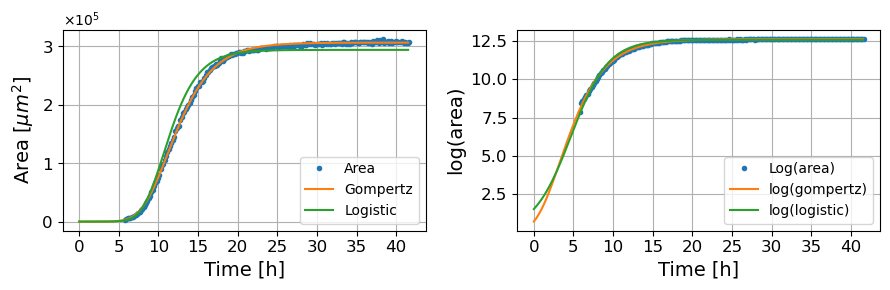

27
Gompertz Model:
  SSR: 0.1343
  R²: 0.9994
  AIC: -1588.6884
  BIC: -1578.5626

Logistic Model:
  SSR: 2.2314
  R²: 0.9901
  AIC: -981.6939
  BIC: -971.5681

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.70767826  0.02373653  4.64769733]
Logistic params are: [1.26569713e+01 2.17013978e-02 2.94294152e-17]


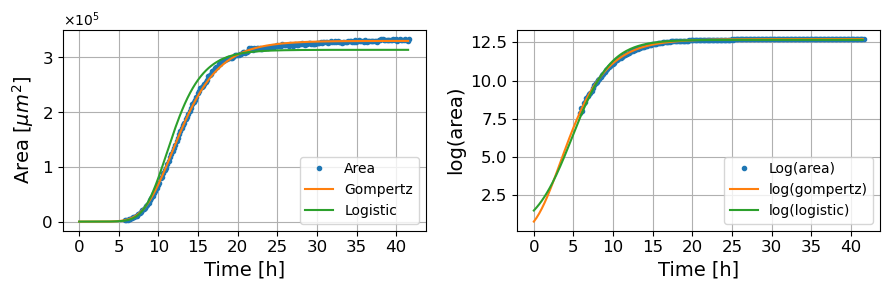

28
Gompertz Model:
  SSR: 0.1009
  R²: 0.9994
  AIC: -1650.5471
  BIC: -1640.4212

Logistic Model:
  SSR: 0.4837
  R²: 0.9972
  AIC: -1311.9319
  BIC: -1301.8060

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.30668051e+01 2.95675256e-02 4.72033373e+01]
Logistic params are: [1.30449697e+01 2.42688392e-02 1.66923354e-16]


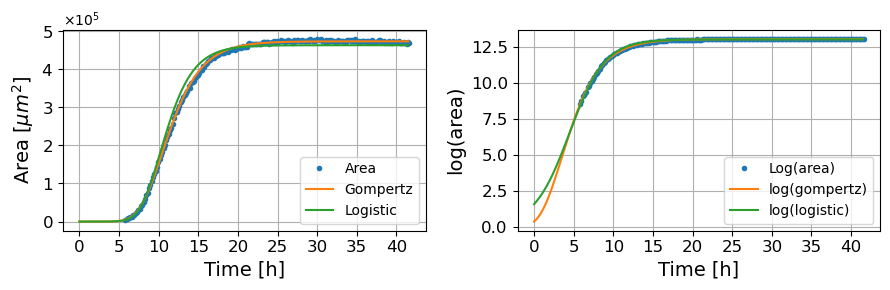

29
Gompertz Model:
  SSR: 0.2384
  R²: 0.9987
  AIC: -1464.7236
  BIC: -1454.5978

Logistic Model:
  SSR: 1.1802
  R²: 0.9938
  AIC: -1119.2694
  BIC: -1109.1436

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.44166631  0.02847337 25.25102678]
Logistic params are: [1.34082795e+01 2.46597192e-02 1.68754333e-19]


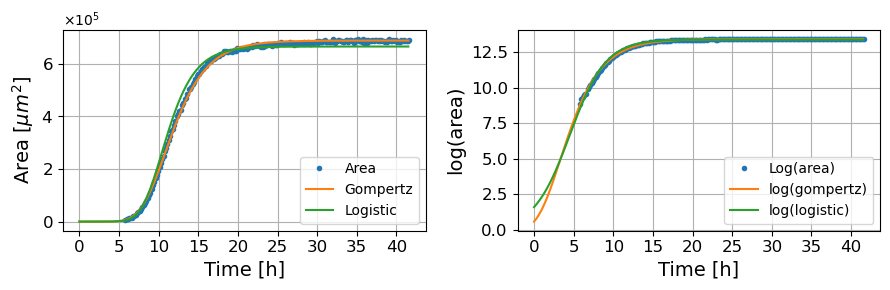

30
Gompertz Model:
  SSR: 0.1107
  R²: 0.9994
  AIC: -1630.3841
  BIC: -1620.2582

Logistic Model:
  SSR: 0.8411
  R²: 0.9955
  AIC: -1192.4479
  BIC: -1182.3221

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.25953054e+01 2.63763511e-02 3.38612639e+01]
Logistic params are: [1.25653079e+01 2.24739902e-02 2.01461171e-19]


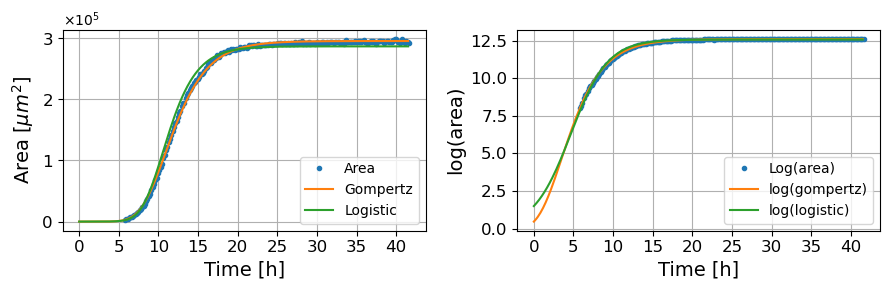

31
Gompertz Model:
  SSR: 0.1876
  R²: 0.9990
  AIC: -1516.5214
  BIC: -1506.3956

Logistic Model:
  SSR: 2.2840
  R²: 0.9880
  AIC: -976.6604
  BIC: -966.5345

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26369756e+01 2.43518342e-02 2.80010859e-13]
Logistic params are: [1.25890970e+01 2.24082223e-02 9.23815229e-17]


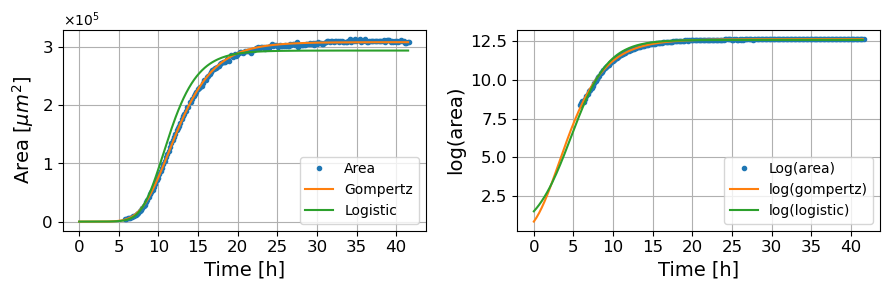

32
Gompertz Model:
  SSR: 0.3452
  R²: 0.9982
  AIC: -1384.7773
  BIC: -1374.6515

Logistic Model:
  SSR: 0.4838
  R²: 0.9975
  AIC: -1311.8735
  BIC: -1301.7477

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.32456759e+01 2.98973422e-02 5.41947775e+01]
Logistic params are: [1.32260908e+01 2.41727262e-02 1.27173679e-20]


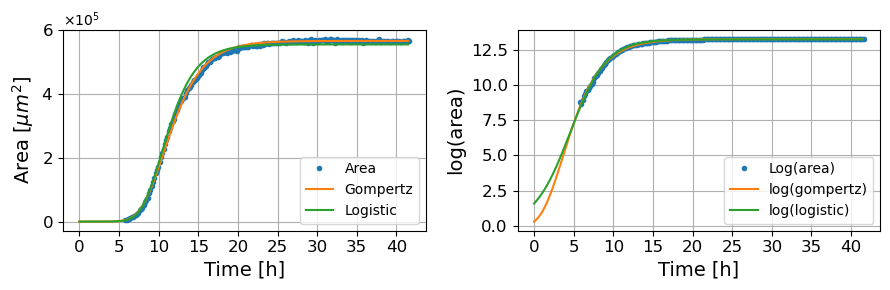

33
Gompertz Model:
  SSR: 0.2864
  R²: 0.9986
  AIC: -1425.1496
  BIC: -1415.0237

Logistic Model:
  SSR: 1.9679
  R²: 0.9905
  AIC: -1008.8386
  BIC: -998.7127

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.51667795  0.02382728  7.11049568]
Logistic params are: [1.24704397e+01 2.16306269e-02 1.00650385e-16]


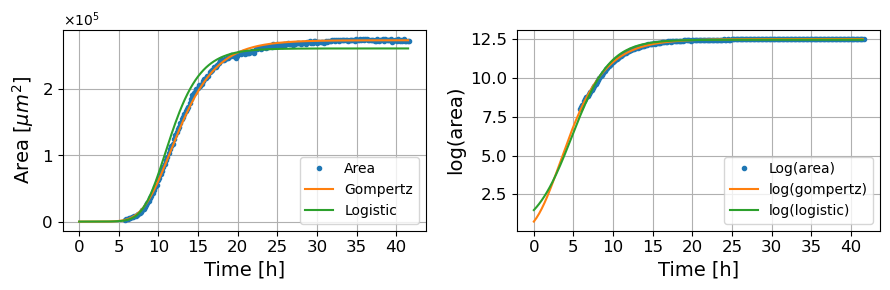

34
Gompertz Model:
  SSR: 0.0675
  R²: 0.9996
  AIC: -2401.1182
  BIC: -2390.1293

Logistic Model:
  SSR: 1.8387
  R²: 0.9892
  AIC: -1449.5274
  BIC: -1438.5385

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.71926141  0.02724527  3.29289886]
Logistic params are: [1.36890448e+01 2.46606134e-02 6.47534589e-15]


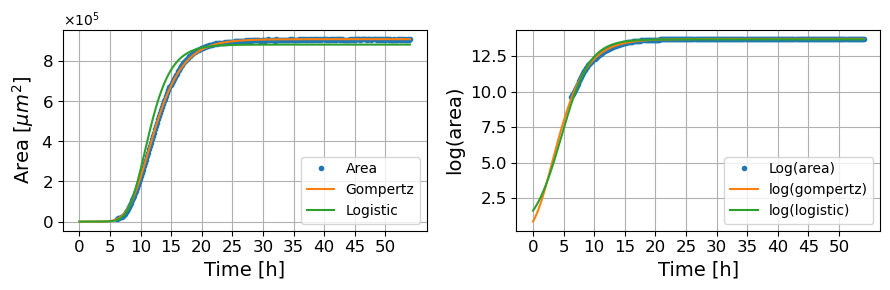

35
Gompertz Model:
  SSR: 0.2193
  R²: 0.9987
  AIC: -2061.8739
  BIC: -2050.8850

Logistic Model:
  SSR: 3.1170
  R²: 0.9811
  AIC: -1297.5173
  BIC: -1286.5284

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.33811476e+01 2.61652876e-02 4.63638114e-22]
Logistic params are: [1.33490964e+01 2.38867429e-02 3.69520522e-15]


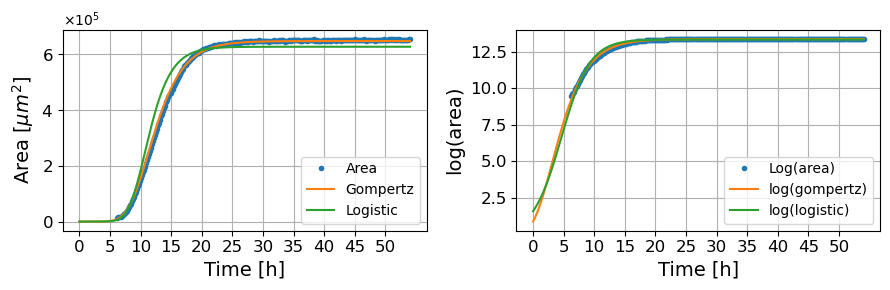

36
Gompertz Model:
  SSR: 0.2011
  R²: 0.9989
  AIC: -2086.8370
  BIC: -2075.8481

Logistic Model:
  SSR: 0.1119
  R²: 0.9994
  AIC: -2255.7826
  BIC: -2244.7938

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.35218598e+01 3.21618235e-02 8.53810139e+01]
Logistic params are: [1.35172304e+01 2.41255739e-02 2.29519459e-19]


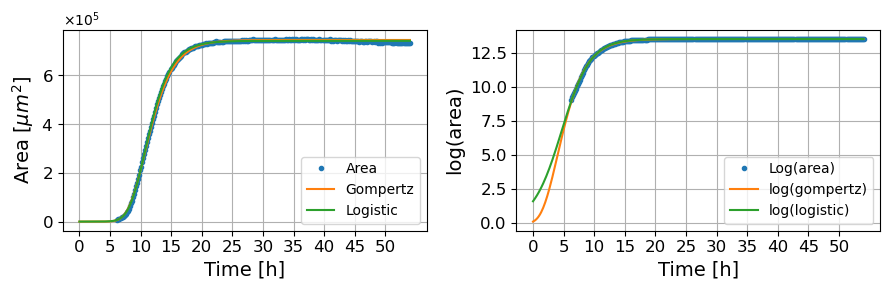

37
Gompertz Model:
  SSR: 0.0801
  R²: 0.9996
  AIC: -2352.0034
  BIC: -2341.0145

Logistic Model:
  SSR: 2.6694
  R²: 0.9877
  AIC: -1342.1536
  BIC: -1331.1647

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.35172654e+01 2.49453916e-02 1.67554654e-14]
Logistic params are: [1.34805284e+01 2.28806681e-02 1.79718915e-17]


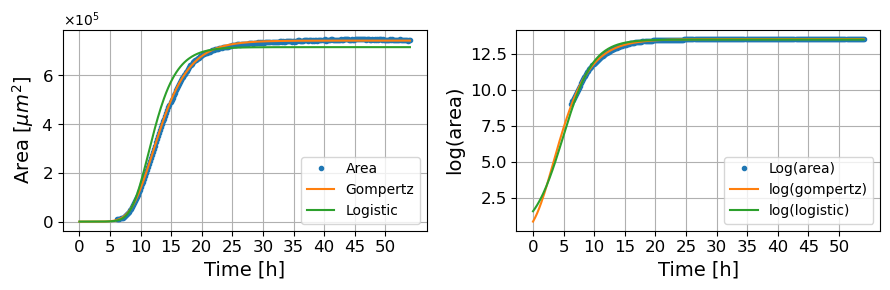

38
Gompertz Model:
  SSR: 0.1195
  R²: 0.9992
  AIC: -2236.7444
  BIC: -2225.7555

Logistic Model:
  SSR: 2.4595
  R²: 0.9841
  AIC: -1365.7503
  BIC: -1354.7615

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.29552022e+01 2.53821955e-02 1.92822418e-19]
Logistic params are: [1.29243752e+01 2.31676383e-02 1.30225715e-16]


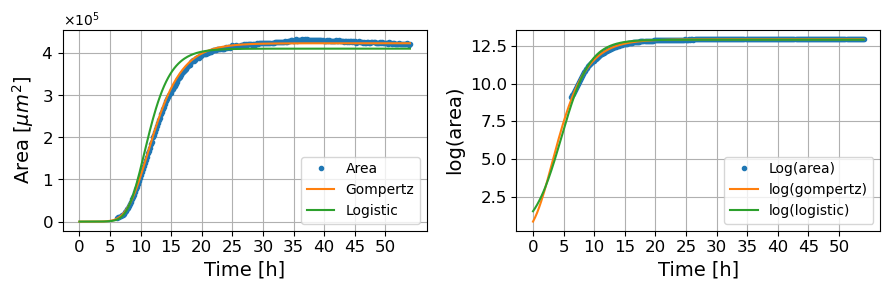

39
Gompertz Model:
  SSR: 0.1031
  R²: 0.9993
  AIC: -2279.3449
  BIC: -2268.3560

Logistic Model:
  SSR: 1.5516
  R²: 0.9901
  AIC: -1498.4257
  BIC: -1487.4368

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.37364     0.02712796  9.87903935]
Logistic params are: [1.33462799e+01 2.42123370e-02 4.69914176e-13]


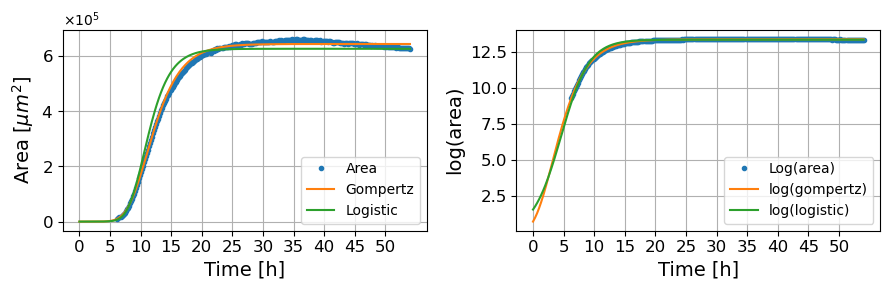

40
Gompertz Model:
  SSR: 5.0414
  R²: 0.9940
  AIC: -1159.0369
  BIC: -1148.0480

Logistic Model:
  SSR: 7.1717
  R²: 0.9915
  AIC: -1057.5329
  BIC: -1046.5440

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.67592106  0.01692697  6.52639604]
Logistic params are: [1.35999924e+01 1.56833051e-02 1.55615218e-16]


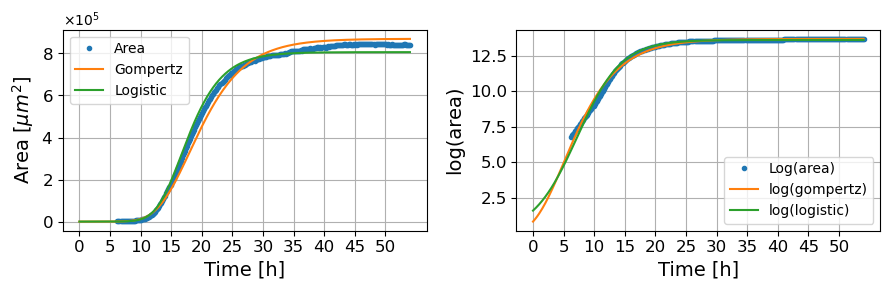

41
Gompertz Model:
  SSR: 0.2317
  R²: 0.9791
  AIC: -1470.9136
  BIC: -1460.7878

Logistic Model:
  SSR: 0.2410
  R²: 0.9783
  AIC: -1462.4613
  BIC: -1452.3355

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.18363732e+01 3.71903689e-02 9.16080319e+01]
Logistic params are: [1.18355136e+01 2.62969080e-02 9.97960853e-14]


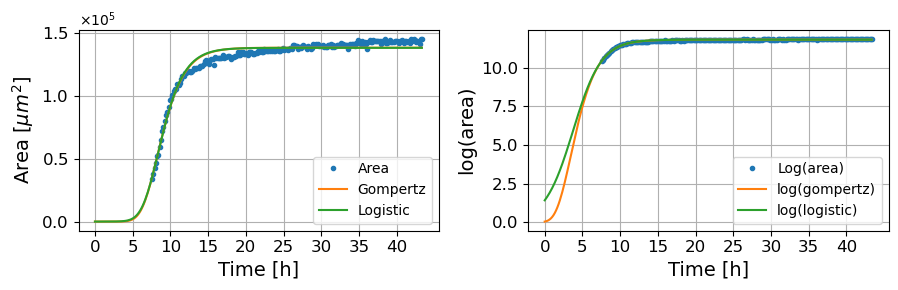

42
Gompertz Model:
  SSR: 0.1456
  R²: 0.9860
  AIC: -1571.3069
  BIC: -1561.1811

Logistic Model:
  SSR: 0.1519
  R²: 0.9854
  AIC: -1562.1116
  BIC: -1551.9857

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19656149e+01 3.85790398e-02 9.74416616e+01]
Logistic params are: [11.96520348  0.02698158  2.65431907]


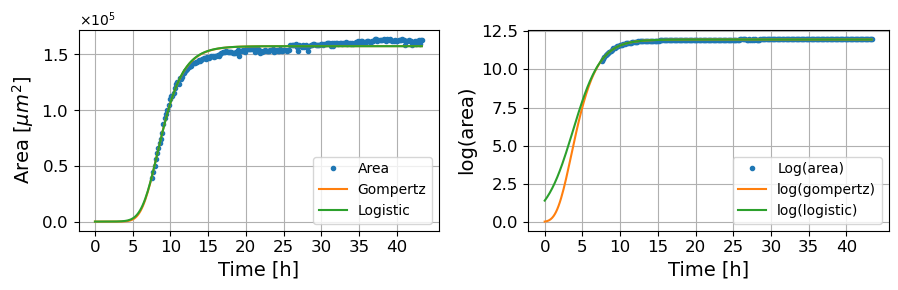

43
Gompertz Model:
  SSR: 0.0569
  R²: 0.9966
  AIC: -1774.3455
  BIC: -1764.2197

Logistic Model:
  SSR: 0.0986
  R²: 0.9940
  AIC: -1655.4322
  BIC: -1645.3063

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14979064e+01 3.10728322e-02 5.76823462e+01]
Logistic params are: [1.14924162e+01 2.40193593e-02 2.00313869e-16]


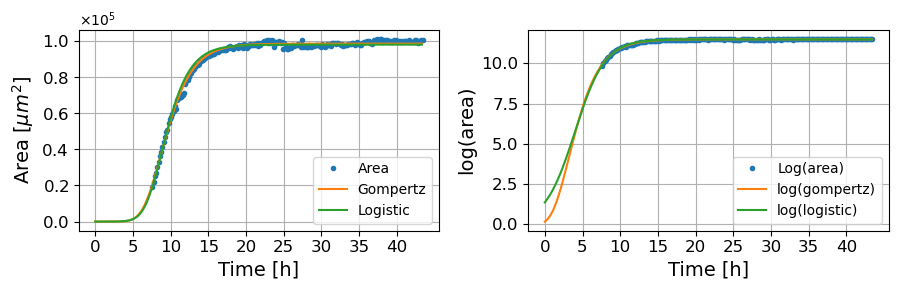

44
Gompertz Model:
  SSR: 0.1209
  R²: 0.9937
  AIC: -1611.3345
  BIC: -1601.2087

Logistic Model:
  SSR: 0.3764
  R²: 0.9805
  AIC: -1366.0945
  BIC: -1355.9686

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14079672e+01 2.66339554e-02 6.11978446e-16]
Logistic params are: [1.13938229e+01 2.32496754e-02 1.25515211e-17]


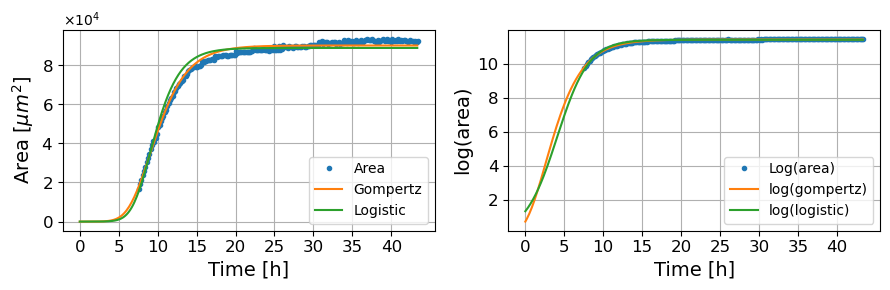

45
Gompertz Model:
  SSR: 0.0913
  R²: 0.9954
  AIC: -1672.1398
  BIC: -1662.0139

Logistic Model:
  SSR: 0.1648
  R²: 0.9916
  AIC: -1544.4593
  BIC: -1534.3334

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.13245524e+01 2.89745153e-02 4.75274232e+01]
Logistic params are: [1.13168485e+01 2.30120412e-02 2.48887536e-16]


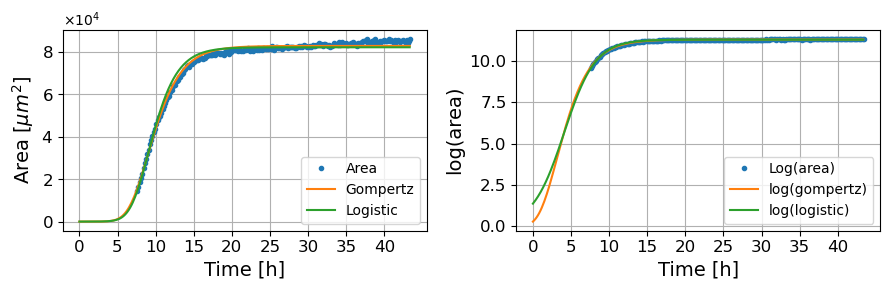

46
Gompertz Model:
  SSR: 0.0867
  R²: 0.9962
  AIC: -1683.2239
  BIC: -1673.0981

Logistic Model:
  SSR: 0.1163
  R²: 0.9950
  AIC: -1619.7757
  BIC: -1609.6498

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.13629444e+01 3.04701754e-02 8.01890716e+01]
Logistic params are: [1.13590783e+01 2.26370768e-02 1.73873696e-17]


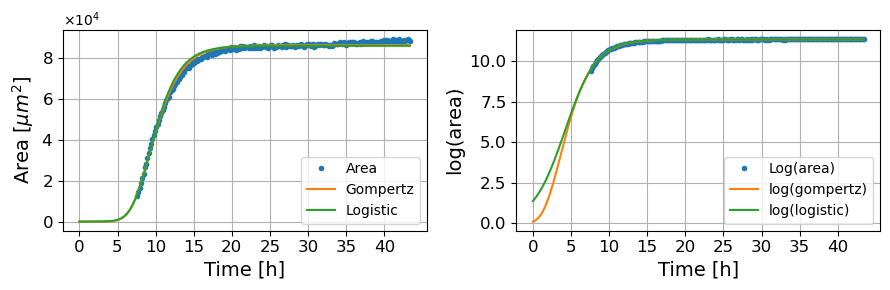

47
Gompertz Model:
  SSR: 0.0522
  R²: 0.9974
  AIC: -1792.6507
  BIC: -1782.5248

Logistic Model:
  SSR: 0.1012
  R²: 0.9950
  AIC: -1649.8580
  BIC: -1639.7321

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14129602e+01 3.00165154e-02 6.18332716e+01]
Logistic params are: [1.14070326e+01 2.31362486e-02 7.28350185e-16]


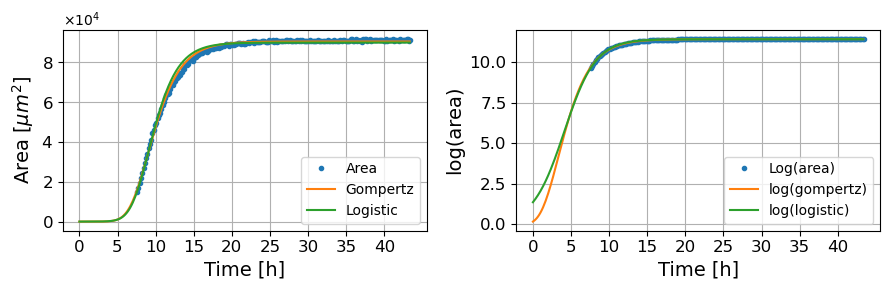

48
Gompertz Model:
  SSR: 0.1851
  R²: 0.9917
  AIC: -1519.3937
  BIC: -1509.2679

Logistic Model:
  SSR: 0.1933
  R²: 0.9914
  AIC: -1510.0913
  BIC: -1499.9655

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.15741815e+01 3.91516407e-02 1.64420400e+02]
Logistic params are: [1.15732792e+01 2.78539451e-02 8.25308510e+01]


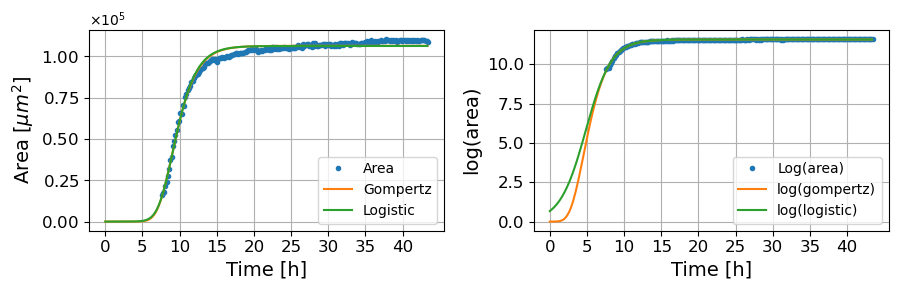

49
Gompertz Model:
  SSR: 0.2803
  R²: 0.9840
  AIC: -1429.8100
  BIC: -1419.6842

Logistic Model:
  SSR: 0.2957
  R²: 0.9832
  AIC: -1418.2330
  BIC: -1408.1072

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.18245655e+01 3.78813896e-02 1.27638122e+02]
Logistic params are: [1.18237902e+01 2.67654788e-02 3.76171575e+01]


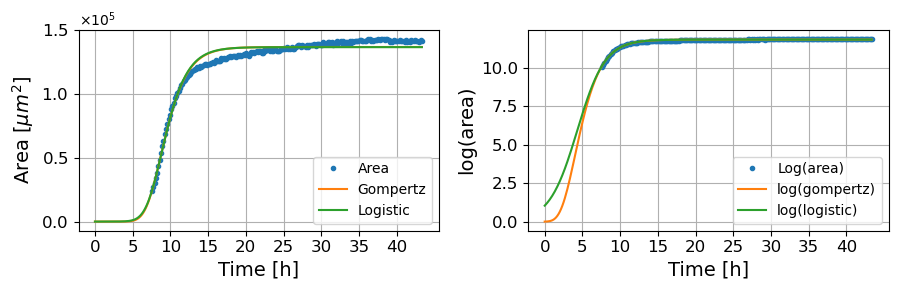

50
Gompertz Model:
  SSR: 0.0283
  R²: 0.9987
  AIC: -1925.3760
  BIC: -1915.2501

Logistic Model:
  SSR: 0.0294
  R²: 0.9987
  AIC: -1916.8751
  BIC: -1906.7492

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.18416420e+01 4.27493742e-02 1.82212719e+02]
Logistic params are: [1.18409728e+01 3.03269071e-02 1.04381468e+02]


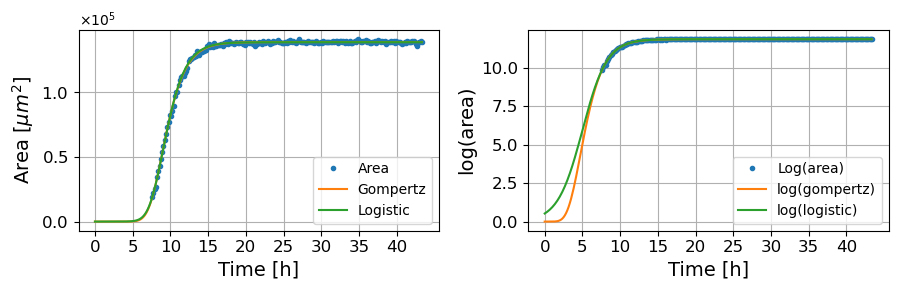

51
Gompertz Model:
  SSR: 0.1281
  R²: 0.9875
  AIC: -1598.9131
  BIC: -1588.7873

Logistic Model:
  SSR: 0.1345
  R²: 0.9868
  AIC: -1588.4661
  BIC: -1578.3403

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19693813e+01 3.81407972e-02 9.15212758e+01]
Logistic params are: [1.19686417e+01 2.69043524e-02 3.17579502e-14]


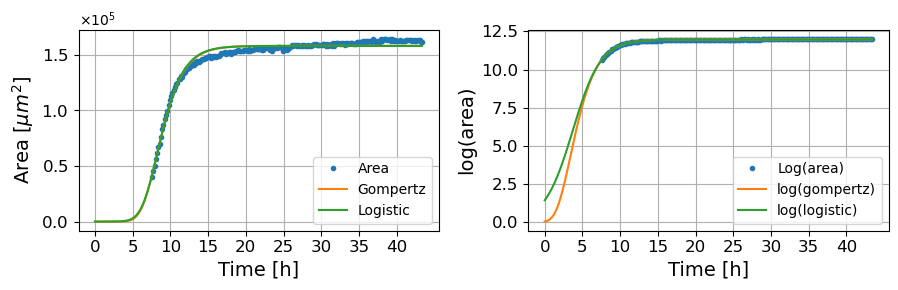

52
Gompertz Model:
  SSR: 0.1152
  R²: 0.9953
  AIC: -1621.9202
  BIC: -1611.7943

Logistic Model:
  SSR: 0.1304
  R²: 0.9947
  AIC: -1595.0230
  BIC: -1584.8972

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.07360724e+01 3.08948380e-02 1.21573669e+02]
Logistic params are: [1.07350673e+01 2.19902878e-02 2.56458675e+01]


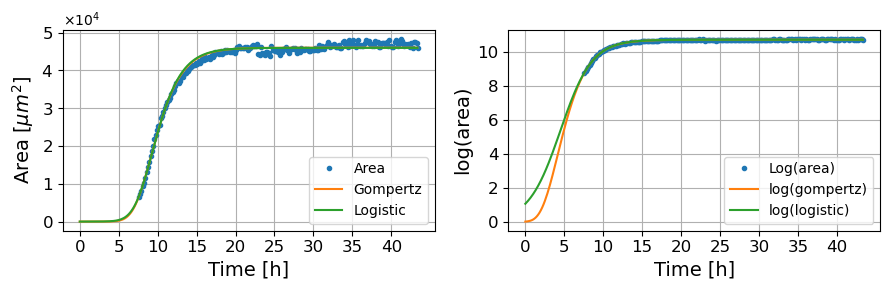

53
Gompertz Model:
  SSR: 0.0930
  R²: 0.9936
  AIC: -1668.0167
  BIC: -1657.8909

Logistic Model:
  SSR: 0.1908
  R²: 0.9869
  AIC: -1512.9138
  BIC: -1502.7880

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.53684003  0.02948798 21.62830933]
Logistic params are: [1.15277276e+01 2.44926403e-02 2.78360937e-18]


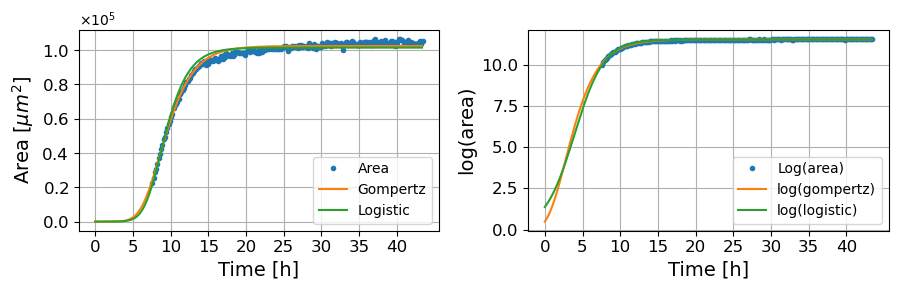

54
Gompertz Model:
  SSR: 0.1086
  R²: 0.9943
  AIC: -1634.6346
  BIC: -1624.5087

Logistic Model:
  SSR: 0.3547
  R²: 0.9814
  AIC: -1378.9209
  BIC: -1368.7950

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14095089e+01 2.66768656e-02 8.83270690e-15]
Logistic params are: [1.13954626e+01 2.32814716e-02 2.96776882e-17]


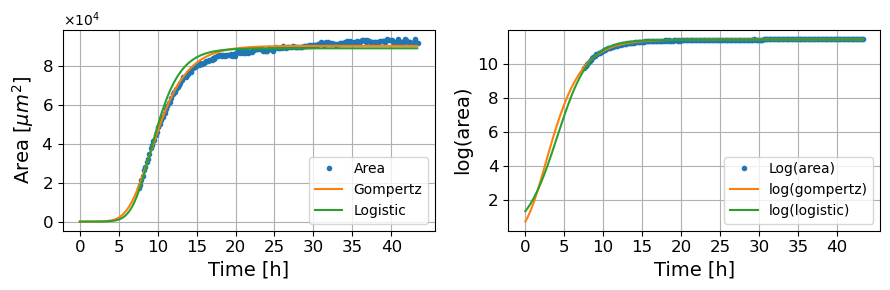

55
Gompertz Model:
  SSR: 0.1416
  R²: 0.9941
  AIC: -1577.3142
  BIC: -1567.1883

Logistic Model:
  SSR: 0.1819
  R²: 0.9925
  AIC: -1523.1490
  BIC: -1513.0231

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.09173791e+01 2.84185179e-02 7.63557972e+01]
Logistic params are: [1.09126261e+01 2.13731540e-02 1.03277901e-17]


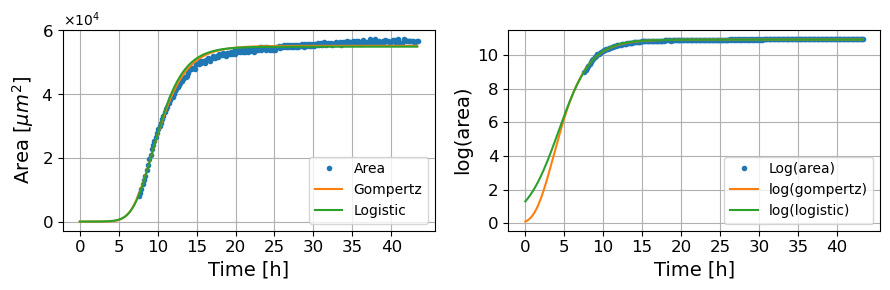

56
Gompertz Model:
  SSR: 0.4573
  R²: 0.9948
  AIC: -1324.0480
  BIC: -1313.9221

Logistic Model:
  SSR: 0.3636
  R²: 0.9959
  AIC: -1373.5599
  BIC: -1363.4341

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26877847e+01 3.25040071e-02 1.00506277e+02]
Logistic params are: [12.68460462  0.02381279  9.3052738 ]


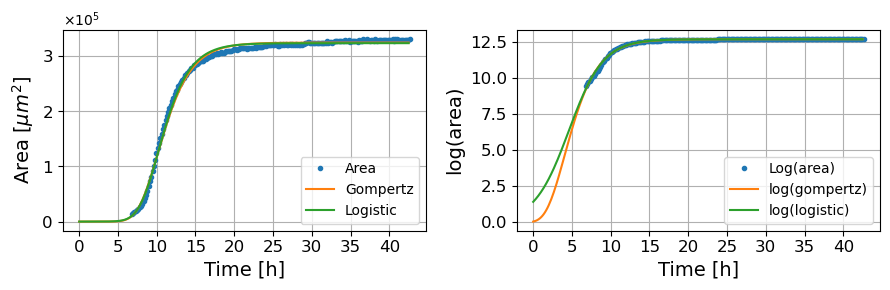

57
Gompertz Model:
  SSR: 0.2571
  R²: 0.9961
  AIC: -1448.4788
  BIC: -1438.3530

Logistic Model:
  SSR: 0.2734
  R²: 0.9959
  AIC: -1435.1438
  BIC: -1425.0179

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.28989364e+01 3.25367259e-02 6.88062240e+01]
Logistic params are: [1.28904941e+01 2.50127007e-02 9.17808588e-22]


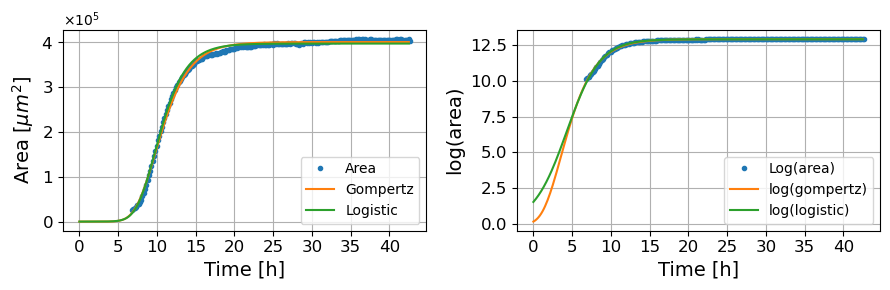

58
Gompertz Model:
  SSR: 0.4453
  R²: 0.9951
  AIC: -1329.8219
  BIC: -1319.6960

Logistic Model:
  SSR: 0.3708
  R²: 0.9959
  AIC: -1369.3426
  BIC: -1359.2167

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24191269e+01 3.22015972e-02 1.10508000e+02]
Logistic params are: [12.4156914   0.02367211 22.13456969]


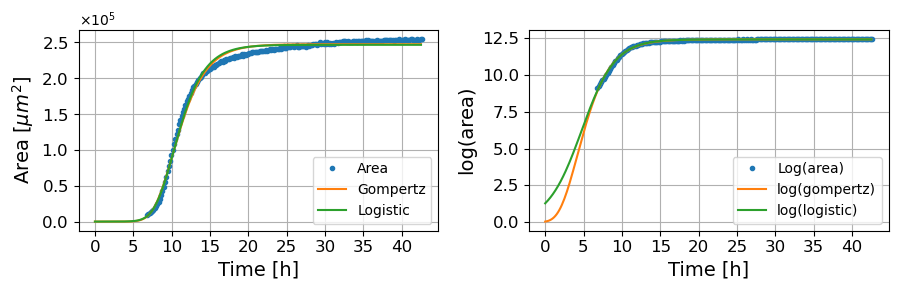

59
Gompertz Model:
  SSR: 0.4254
  R²: 0.9964
  AIC: -1339.6734
  BIC: -1329.5475

Logistic Model:
  SSR: 0.2872
  R²: 0.9976
  AIC: -1424.5392
  BIC: -1414.4134

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.31220071e+01 3.52354935e-02 1.34580167e+02]
Logistic params are: [1.31181801e+01 2.60566245e-02 5.23326371e+01]


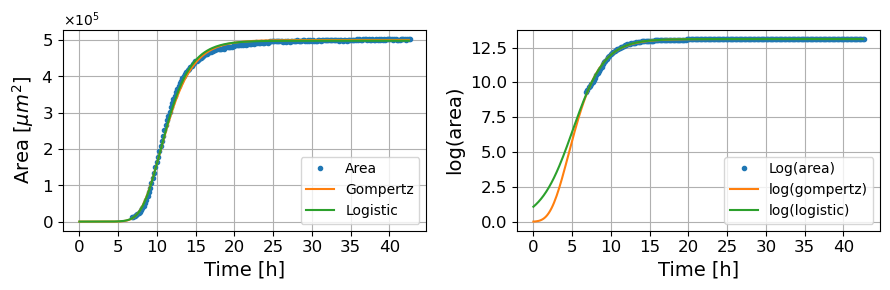

60
Gompertz Model:
  SSR: 0.4062
  R²: 0.9958
  AIC: -1349.6649
  BIC: -1339.5391

Logistic Model:
  SSR: 0.3062
  R²: 0.9968
  AIC: -1410.7117
  BIC: -1400.5859

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.27753465e+01 3.22036447e-02 1.00527749e+02]
Logistic params are: [12.77192284  0.02363905  8.91491373]


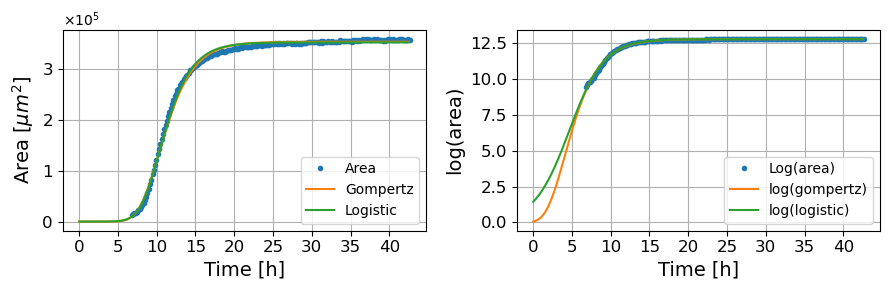

61
Gompertz Model:
  SSR: 0.2698
  R²: 0.9965
  AIC: -1438.0239
  BIC: -1427.8981

Logistic Model:
  SSR: 0.2510
  R²: 0.9967
  AIC: -1453.6312
  BIC: -1443.5053

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25835489e+01 3.11586654e-02 7.74351476e+01]
Logistic params are: [1.25763345e+01 2.36176256e-02 7.33128523e-19]


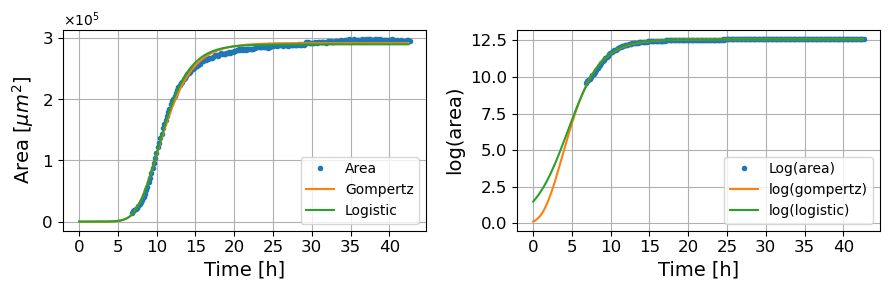

62
Gompertz Model:
  SSR: 0.2006
  R²: 0.9982
  AIC: -1502.0724
  BIC: -1491.9466

Logistic Model:
  SSR: 0.1651
  R²: 0.9985
  AIC: -1544.1846
  BIC: -1534.0587

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26406172e+01 2.91393203e-02 8.23214160e+01]
Logistic params are: [1.26322923e+01 2.21305099e-02 4.16216605e-21]


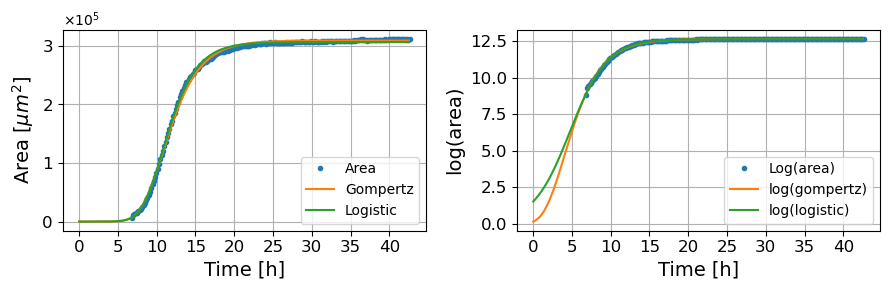

63
Gompertz Model:
  SSR: 0.0800
  R²: 0.9991
  AIC: -1700.7061
  BIC: -1690.5803

Logistic Model:
  SSR: 0.3229
  R²: 0.9962
  AIC: -1399.2100
  BIC: -1389.0841

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24421927e+01 2.79174452e-02 4.78224791e+01]
Logistic params are: [1.24251069e+01 2.27581621e-02 5.31397967e-20]


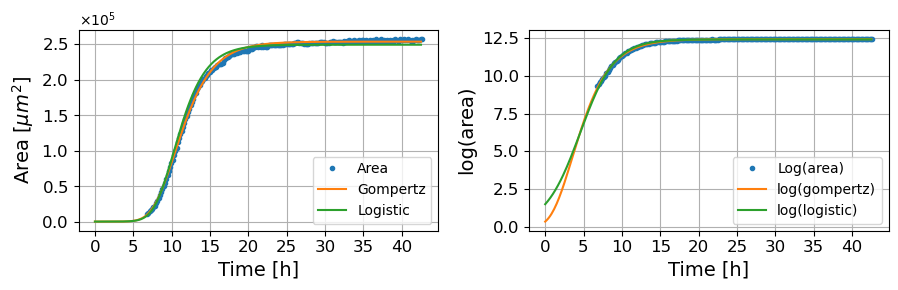

64
Gompertz Model:
  SSR: 0.1808
  R²: 0.9982
  AIC: -1524.4868
  BIC: -1514.3610

Logistic Model:
  SSR: 0.4704
  R²: 0.9953
  AIC: -1317.9520
  BIC: -1307.8262

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26172541e+01 2.72500199e-02 4.48865252e+01]
Logistic params are: [1.25973751e+01 2.24504198e-02 2.06366343e-17]


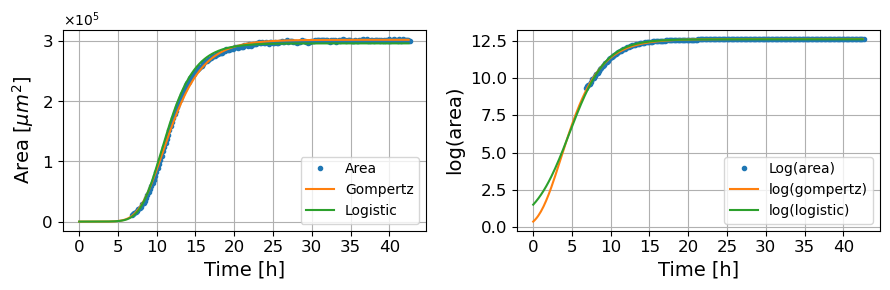

65
Gompertz Model:
  SSR: 0.4275
  R²: 0.9961
  AIC: -1338.6198
  BIC: -1328.4940

Logistic Model:
  SSR: 0.3503
  R²: 0.9968
  AIC: -1381.6112
  BIC: -1371.4853

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.27858122e+01 2.94148477e-02 7.76881107e+01]
Logistic params are: [1.27762634e+01 2.25481502e-02 3.27460125e-22]


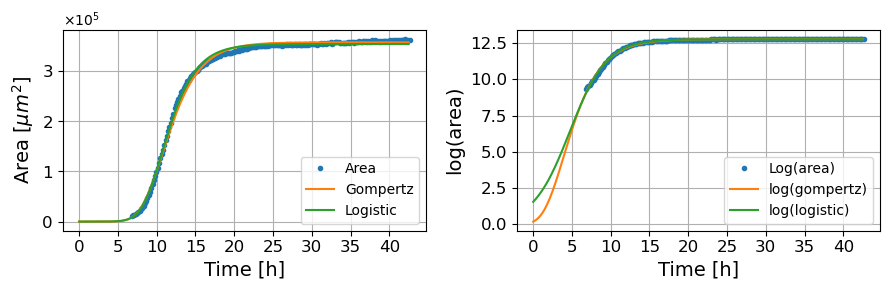

66
Gompertz Model:
  SSR: 0.3215
  R²: 0.9971
  AIC: -1400.1649
  BIC: -1390.0391

Logistic Model:
  SSR: 0.2721
  R²: 0.9975
  AIC: -1436.1924
  BIC: -1426.0666

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26364948e+01 2.87036455e-02 7.48279477e+01]
Logistic params are: [1.26258705e+01 2.21706075e-02 6.41246716e-14]


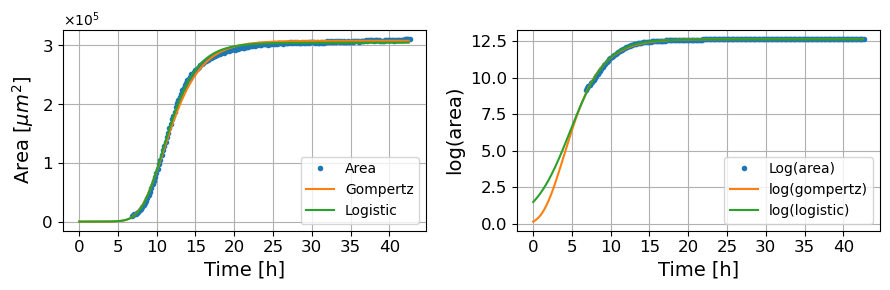

67
Gompertz Model:
  SSR: 0.2116
  R²: 0.9988
  AIC: -1490.4734
  BIC: -1480.3475

Logistic Model:
  SSR: 1.9760
  R²: 0.9889
  AIC: -1007.9509
  BIC: -997.8250

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.00068711  0.02275786  2.54617605]
Logistic params are: [1.29502699e+01 2.07401470e-02 1.06794742e-16]


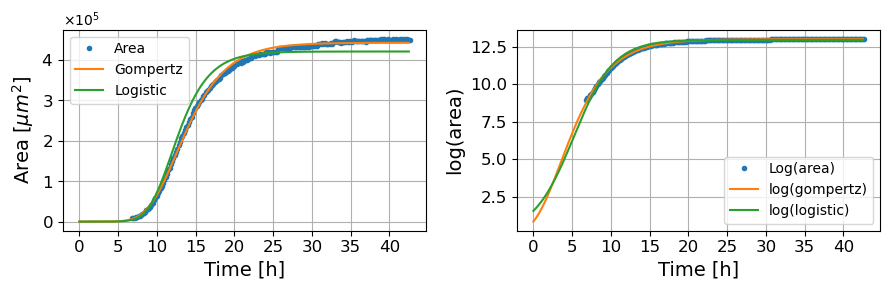

68
Gompertz Model:
  SSR: 0.2328
  R²: 0.9983
  AIC: -1469.9239
  BIC: -1459.7981

Logistic Model:
  SSR: 1.9907
  R²: 0.9854
  AIC: -1006.3445
  BIC: -996.2187

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26751285e+01 2.32058450e-02 1.07511559e-19]
Logistic params are: [1.26301533e+01 2.11650807e-02 9.56291533e-16]


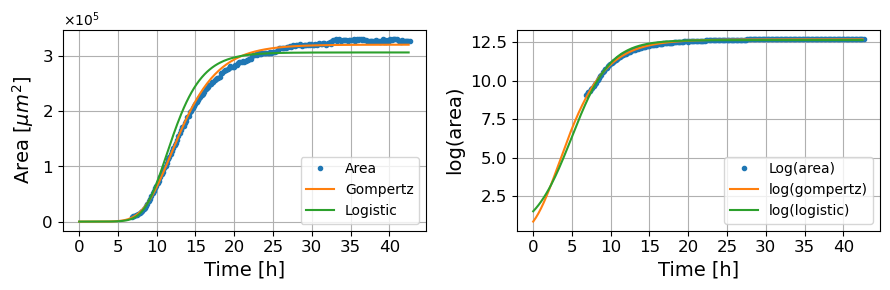

69
Gompertz Model:
  SSR: 0.2411
  R²: 0.9986
  AIC: -1462.3109
  BIC: -1452.1851

Logistic Model:
  SSR: 1.3856
  R²: 0.9922
  AIC: -1084.6229
  BIC: -1074.4971

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.8317571   0.02321596 21.00882019]
Logistic params are: [1.27903180e+01 2.04230986e-02 2.36278676e-15]


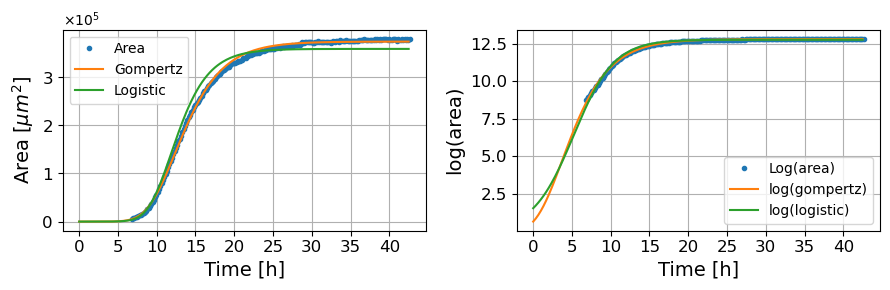

70
Gompertz Model:
  SSR: 0.3624
  R²: 0.9978
  AIC: -1374.2897
  BIC: -1364.1638

Logistic Model:
  SSR: 1.5538
  R²: 0.9907
  AIC: -1059.8663
  BIC: -1049.7405

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.86506827  0.02351235 17.75326797]
Logistic params are: [1.28234844e+01 2.07859924e-02 6.65156044e-15]


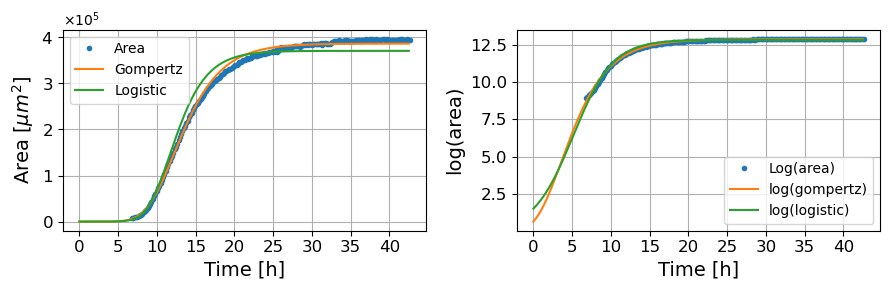

71
Gompertz Model:
  SSR: 0.3081
  R²: 0.9971
  AIC: -1409.3814
  BIC: -1399.2556

Logistic Model:
  SSR: 0.2107
  R²: 0.9980
  AIC: -1491.4161
  BIC: -1481.2902

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22632857e+01 3.40061142e-02 6.69496041e+01]
Logistic params are: [1.22566311e+01 2.59072355e-02 4.21128438e-16]


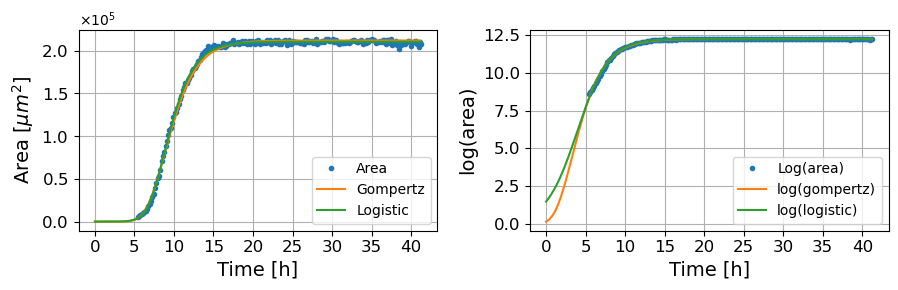

72
Gompertz Model:
  SSR: 0.4745
  R²: 0.9959
  AIC: -1316.0700
  BIC: -1305.9442

Logistic Model:
  SSR: 0.3548
  R²: 0.9969
  AIC: -1378.8836
  BIC: -1368.7578

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22480341e+01 3.28930567e-02 6.23081740e+01]
Logistic params are: [1.22393429e+01 2.54658228e-02 1.42143539e-13]


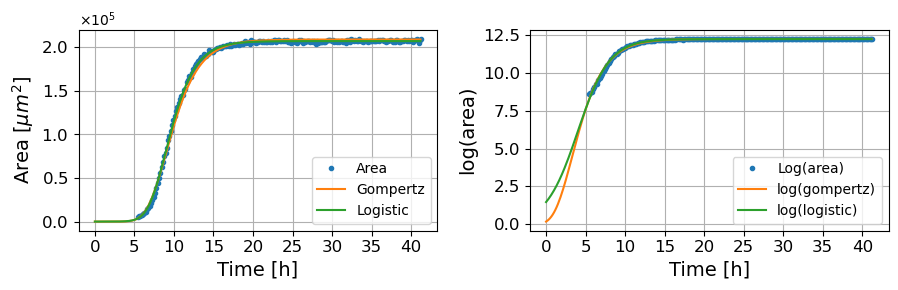

73
Gompertz Model:
  SSR: 0.6277
  R²: 0.9966
  AIC: -1255.6528
  BIC: -1245.5269

Logistic Model:
  SSR: 0.4482
  R²: 0.9975
  AIC: -1328.3939
  BIC: -1318.2681

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25079020e+01 3.31771113e-02 9.17084615e+01]
Logistic params are: [12.50218417  0.02509513 19.35743386]


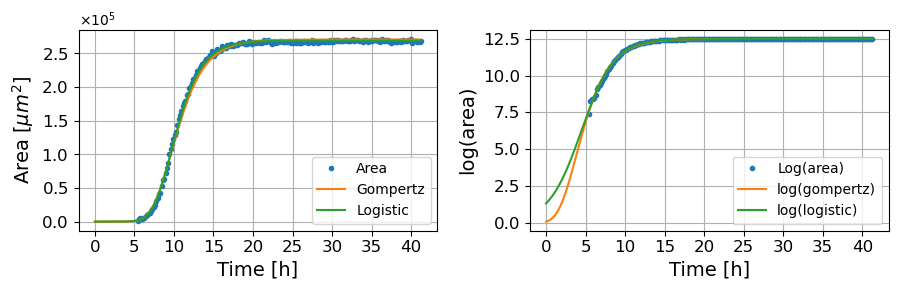

74
Gompertz Model:
  SSR: 0.6726
  R²: 0.9956
  AIC: -1240.7364
  BIC: -1230.6106

Logistic Model:
  SSR: 0.4372
  R²: 0.9972
  AIC: -1333.7706
  BIC: -1323.6448

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24568978e+01 3.30349539e-02 7.86617503e+01]
Logistic params are: [12.45163229  0.02486023  3.79627031]


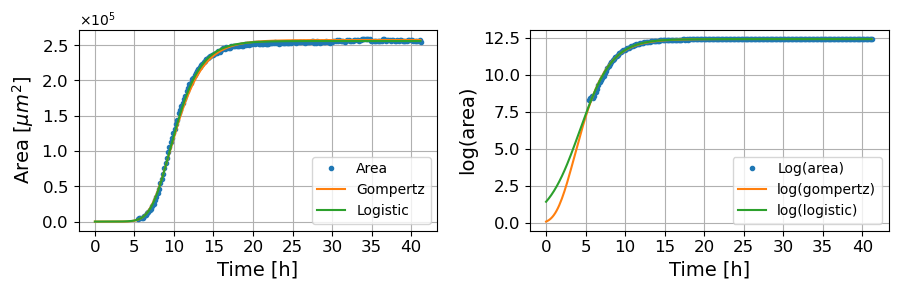

75
Gompertz Model:
  SSR: 0.3417
  R²: 0.9976
  AIC: -1386.9854
  BIC: -1376.8595

Logistic Model:
  SSR: 0.1895
  R²: 0.9987
  AIC: -1514.3941
  BIC: -1504.2682

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.27166450e+01 3.46159270e-02 7.76850623e+01]
Logistic params are: [12.7120007   0.02589144  1.99071258]


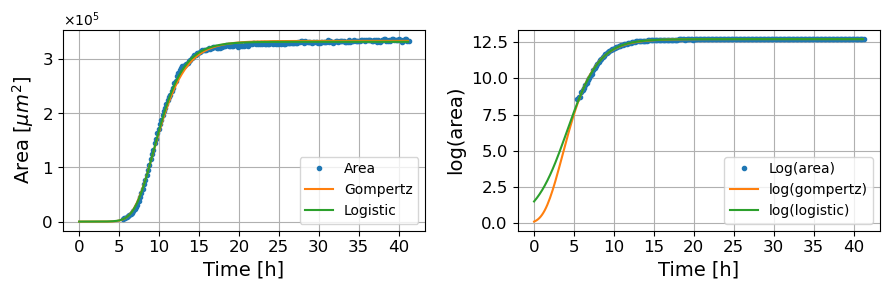

76
Gompertz Model:
  SSR: 0.3034
  R²: 0.9980
  AIC: -1412.6594
  BIC: -1402.5336

Logistic Model:
  SSR: 0.1302
  R²: 0.9992
  AIC: -1595.3884
  BIC: -1585.2626

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.28294173e+01 3.47769206e-02 8.06655136e+01]
Logistic params are: [12.82461769  0.0260572   5.51908003]


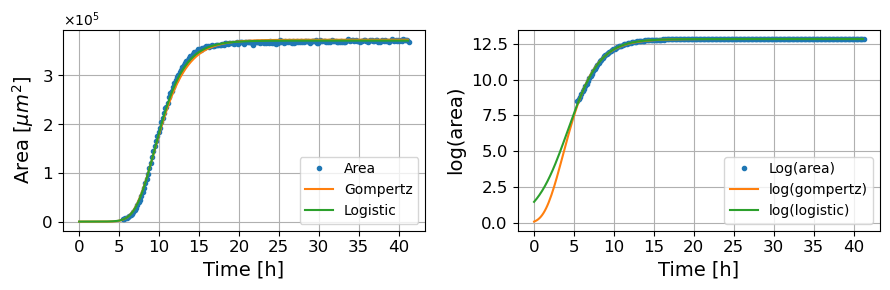

77
Gompertz Model:
  SSR: 0.4780
  R²: 0.9960
  AIC: -1314.4773
  BIC: -1304.3514

Logistic Model:
  SSR: 0.4127
  R²: 0.9965
  AIC: -1346.2156
  BIC: -1336.0898

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21208935e+01 3.16881830e-02 5.76340571e+01]
Logistic params are: [1.21100666e+01 2.49105319e-02 1.33167403e-14]


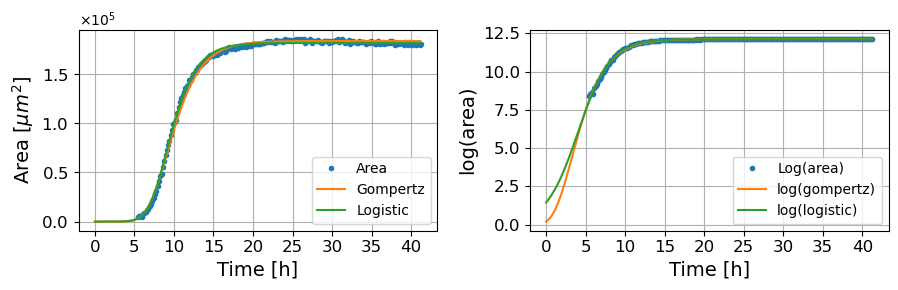

78
Gompertz Model:
  SSR: 0.4992
  R²: 0.9948
  AIC: -1305.1166
  BIC: -1294.9907

Logistic Model:
  SSR: 0.5939
  R²: 0.9938
  AIC: -1267.6177
  BIC: -1257.4919

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19679928e+01 3.15559169e-02 4.54127550e+01]
Logistic params are: [1.19544359e+01 2.55042770e-02 3.50543634e-21]


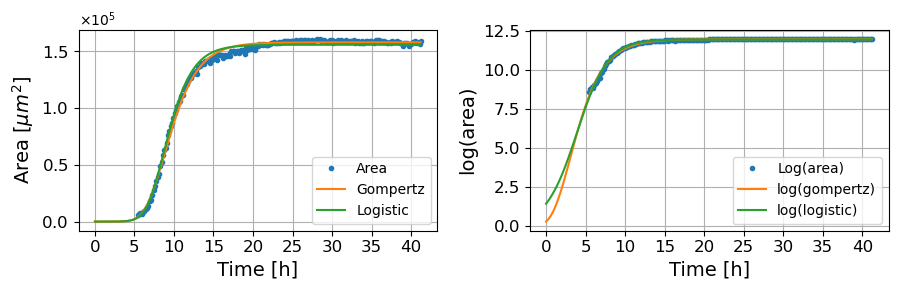

79
Gompertz Model:
  SSR: 0.2853
  R²: 0.9972
  AIC: -1425.9920
  BIC: -1415.8661

Logistic Model:
  SSR: 0.4124
  R²: 0.9960
  AIC: -1346.3889
  BIC: -1336.2631

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20066731e+01 3.14211081e-02 4.68781078e+01]
Logistic params are: [1.19930213e+01 2.53371911e-02 2.54368477e-17]


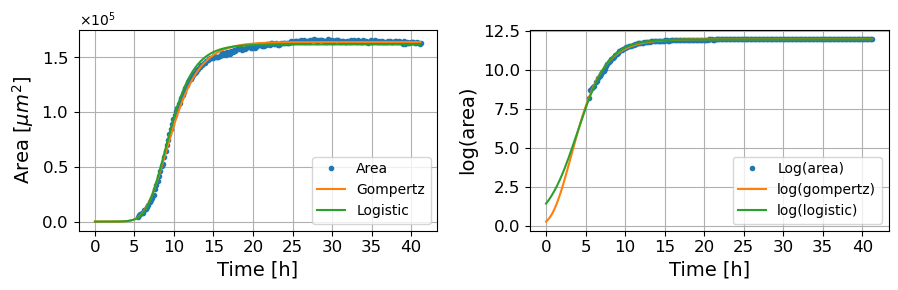

80
Gompertz Model:
  SSR: 0.1994
  R²: 0.9982
  AIC: -1503.3810
  BIC: -1493.2552

Logistic Model:
  SSR: 0.2378
  R²: 0.9979
  AIC: -1465.2752
  BIC: -1455.1494

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21918832e+01 3.26040105e-02 5.95315722e+01]
Logistic params are: [1.21818888e+01 2.54394794e-02 5.59500747e-21]


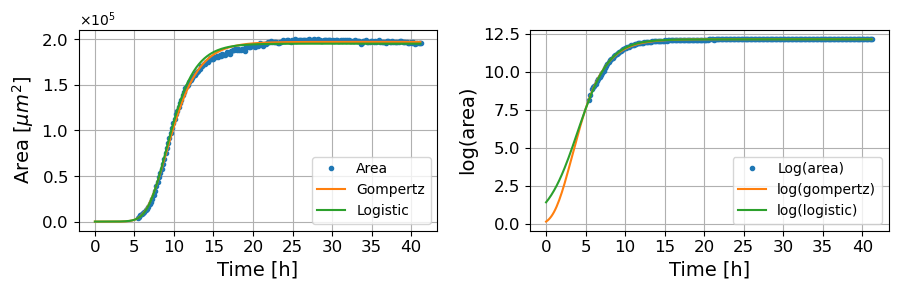

81
Gompertz Model:
  SSR: 0.9800
  R²: 0.9944
  AIC: -1159.4199
  BIC: -1149.2940

Logistic Model:
  SSR: 0.8703
  R²: 0.9951
  AIC: -1185.0698
  BIC: -1174.9440

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21975333e+01 2.84809922e-02 5.22336476e+01]
Logistic params are: [1.21807148e+01 2.30271849e-02 1.00295782e-16]


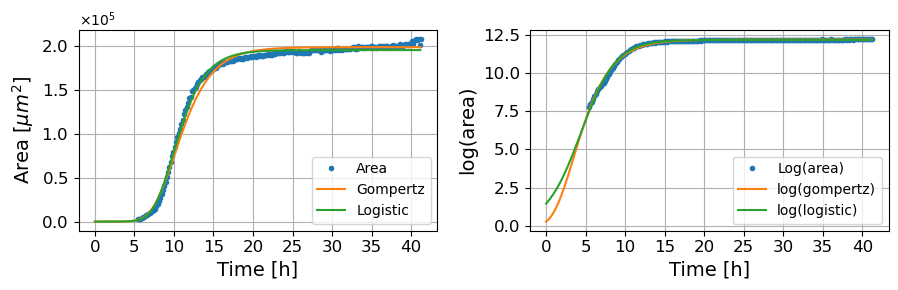

82
Gompertz Model:
  SSR: 0.9047
  R²: 0.9949
  AIC: -1176.6845
  BIC: -1166.5586

Logistic Model:
  SSR: 0.6316
  R²: 0.9964
  AIC: -1254.2989
  BIC: -1244.1731

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20507189e+01 2.89302199e-02 6.36519370e+01]
Logistic params are: [1.20390761e+01 2.27003477e-02 8.13147027e-16]


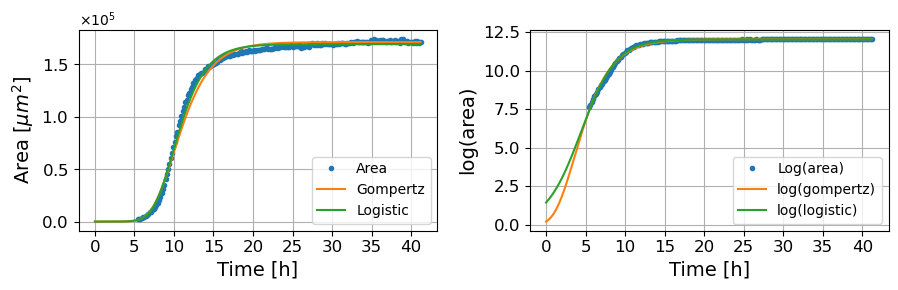

83
Gompertz Model:
  SSR: 0.9084
  R²: 0.9951
  AIC: -1175.8095
  BIC: -1165.6837

Logistic Model:
  SSR: 0.8836
  R²: 0.9952
  AIC: -1181.7937
  BIC: -1171.6679

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21720374e+01 3.11526104e-02 8.60870060e+01]
Logistic params are: [12.16619077  0.02355293 10.92043732]


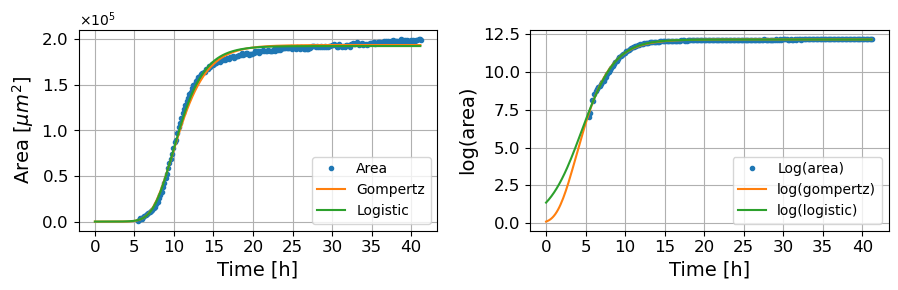

84
Gompertz Model:
  SSR: 1.3527
  R²: 0.9936
  AIC: -1089.8104
  BIC: -1079.6846

Logistic Model:
  SSR: 1.0691
  R²: 0.9949
  AIC: -1140.6320
  BIC: -1130.5062

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23476951e+01 2.99636113e-02 7.92812038e+01]
Logistic params are: [12.34094711  0.02278996  2.98956035]


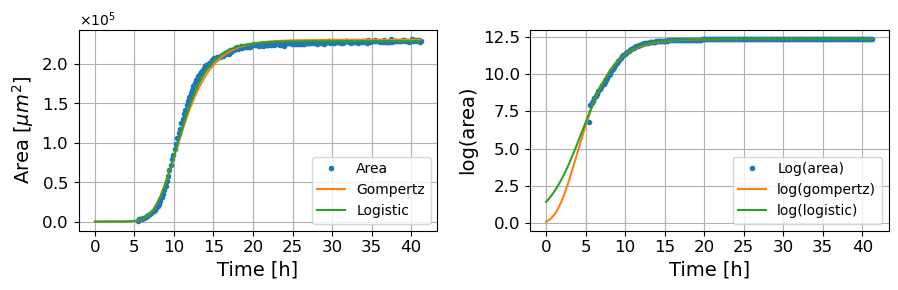

85
Gompertz Model:
  SSR: 1.7741
  R²: 0.9923
  AIC: -1031.2318
  BIC: -1021.1060

Logistic Model:
  SSR: 1.1847
  R²: 0.9949
  AIC: -1118.4539
  BIC: -1108.3280

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25143610e+01 2.86906378e-02 6.70032307e+01]
Logistic params are: [1.25022251e+01 2.24819775e-02 5.66754910e-13]


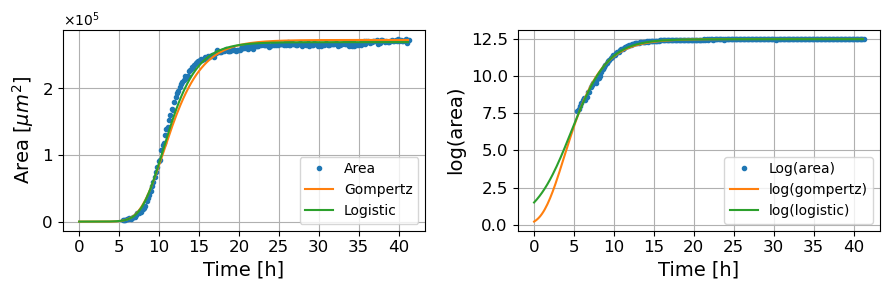

86
Gompertz Model:
  SSR: 0.8517
  R²: 0.9963
  AIC: -1189.7211
  BIC: -1179.5952

Logistic Model:
  SSR: 0.7038
  R²: 0.9970
  AIC: -1230.9214
  BIC: -1220.7956

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26768213e+01 3.21500508e-02 9.62226289e+01]
Logistic params are: [12.66983786  0.02451523 24.43416285]


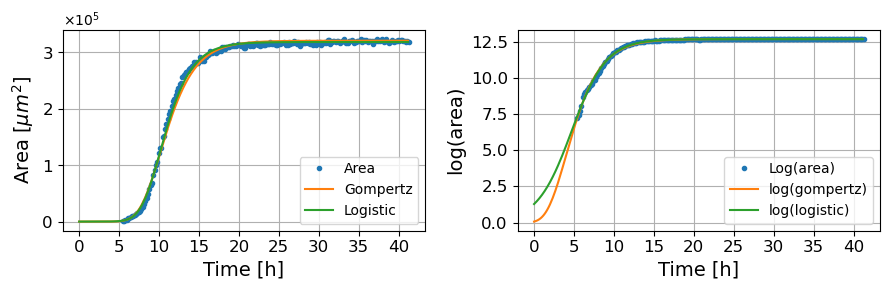

87
Gompertz Model:
  SSR: 1.0802
  R²: 0.9951
  AIC: -1138.3964
  BIC: -1128.2705

Logistic Model:
  SSR: 0.6441
  R²: 0.9971
  AIC: -1250.0816
  BIC: -1239.9558

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24265158e+01 2.86399176e-02 6.62831872e+01]
Logistic params are: [1.24141262e+01 2.24662497e-02 1.79785383e-14]


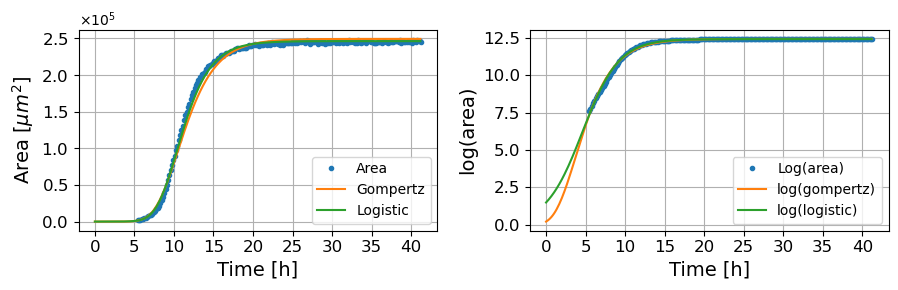

88
Gompertz Model:
  SSR: 0.9342
  R²: 0.9948
  AIC: -1169.7728
  BIC: -1159.6470

Logistic Model:
  SSR: 0.7013
  R²: 0.9961
  AIC: -1231.7114
  BIC: -1221.5855

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24052058e+01 2.95224228e-02 5.80397412e+01]
Logistic params are: [1.23910321e+01 2.34922442e-02 1.04272818e-12]


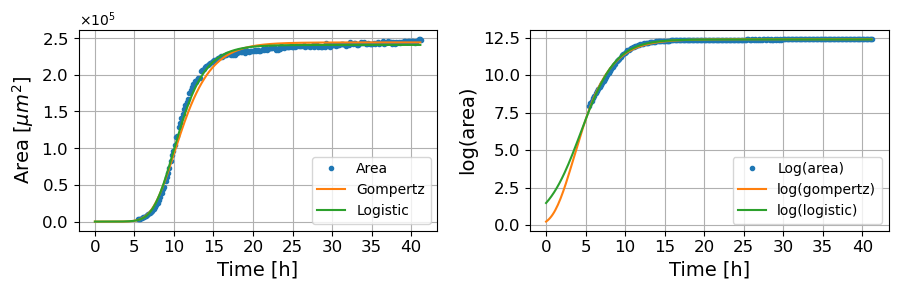

89
Gompertz Model:
  SSR: 1.8540
  R²: 0.9911
  AIC: -1021.7107
  BIC: -1011.5849

Logistic Model:
  SSR: 1.4050
  R²: 0.9932
  AIC: -1081.6169
  BIC: -1071.4911

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23831429e+01 3.30868034e-02 1.06080836e+02]
Logistic params are: [1.23773966e+01 2.52126137e-02 3.78769157e+01]


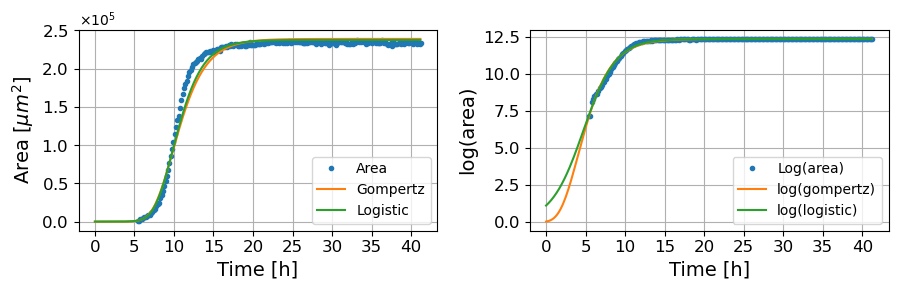

90
Gompertz Model:
  SSR: 0.7532
  R²: 0.9961
  AIC: -1216.2881
  BIC: -1206.1623

Logistic Model:
  SSR: 0.5278
  R²: 0.9973
  AIC: -1293.0869
  BIC: -1282.9611

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20772834e+01 3.31418177e-02 1.12384065e+02]
Logistic params are: [1.20719101e+01 2.51992790e-02 4.50503821e+01]


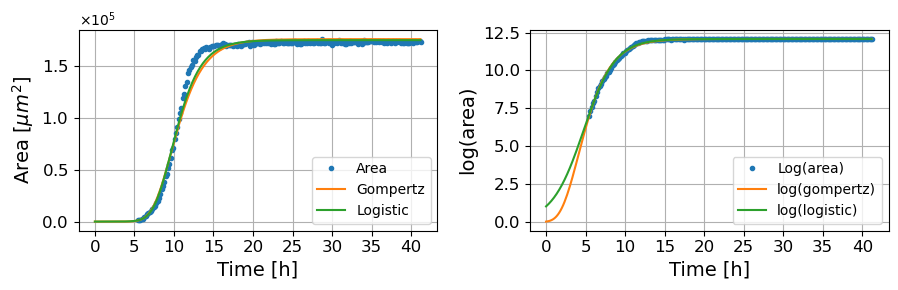

91
Gompertz Model:
  SSR: 1.8712
  R²: 0.9910
  AIC: -1019.7181
  BIC: -1009.5923

Logistic Model:
  SSR: 1.2441
  R²: 0.9940
  AIC: -1107.8888
  BIC: -1097.7629

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22328121e+01 3.02847603e-02 8.54163488e+01]
Logistic params are: [12.2262816   0.02311591 12.4024124 ]


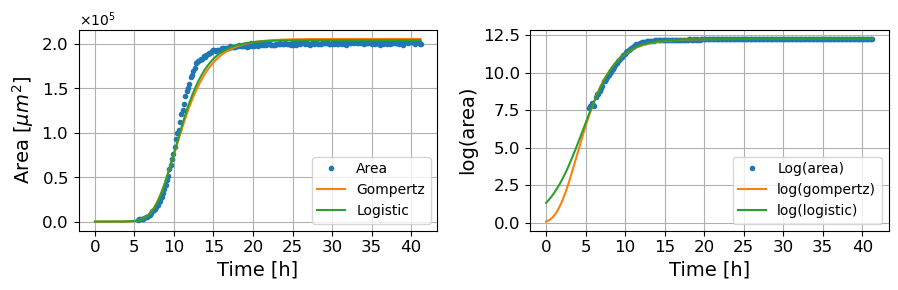

92
Gompertz Model:
  SSR: 0.2467
  R²: 0.9967
  AIC: -1457.3527
  BIC: -1447.2269

Logistic Model:
  SSR: 1.2997
  R²: 0.9825
  AIC: -1098.4447
  BIC: -1088.3188

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.17018376e+01 2.85516018e-02 2.55156268e-19]
Logistic params are: [1.16755628e+01 2.58418604e-02 2.96641810e-18]


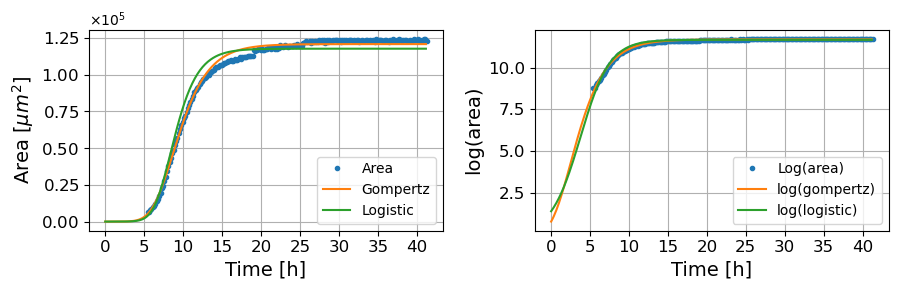

93
Gompertz Model:
  SSR: 0.8976
  R²: 0.9949
  AIC: -1178.4010
  BIC: -1168.2752

Logistic Model:
  SSR: 0.6088
  R²: 0.9965
  AIC: -1262.2525
  BIC: -1252.1267

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20371735e+01 2.91713595e-02 6.68875731e+01]
Logistic params are: [1.20270060e+01 2.26873819e-02 1.00392350e-12]


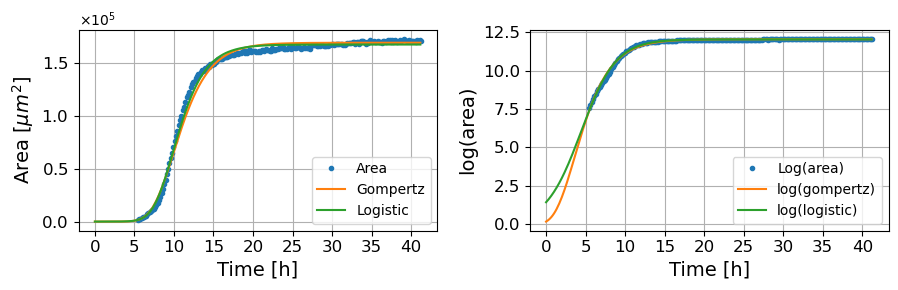

94
Gompertz Model:
  SSR: 0.7671
  R²: 0.9956
  AIC: -1212.3388
  BIC: -1202.2130

Logistic Model:
  SSR: 0.5269
  R²: 0.9970
  AIC: -1293.4540
  BIC: -1283.3282

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19623082e+01 2.86870644e-02 6.39503644e+01]
Logistic params are: [1.19507303e+01 2.24992729e-02 5.11665376e-16]


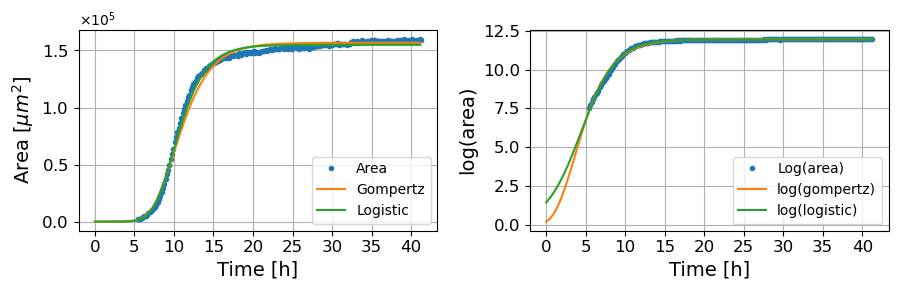

95
Gompertz Model:
  SSR: 1.0029
  R²: 0.9947
  AIC: -1154.4424
  BIC: -1144.3165

Logistic Model:
  SSR: 0.7211
  R²: 0.9962
  AIC: -1225.6951
  BIC: -1215.5693

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21839131e+01 2.95501526e-02 7.20138231e+01]
Logistic params are: [1.21753419e+01 2.27107309e-02 5.47042654e-12]


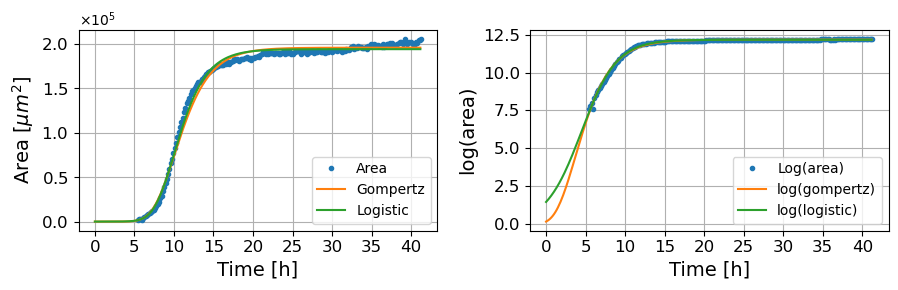

96
Gompertz Model:
  SSR: 0.1680
  R²: 0.9992
  AIC: -1540.3057
  BIC: -1530.1799

Logistic Model:
  SSR: 1.7703
  R²: 0.9912
  AIC: -1031.6929
  BIC: -1021.5671

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.23720751  0.02860385 11.3209976 ]
Logistic params are: [1.31973921e+01 2.56332886e-02 7.62222453e-13]


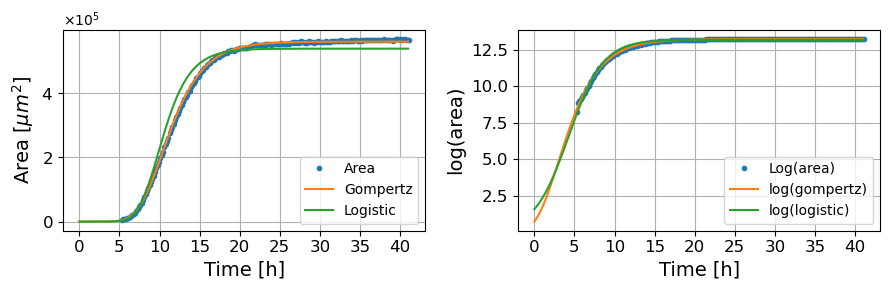

97
Gompertz Model:
  SSR: 0.1582
  R²: 0.9992
  AIC: -1553.2966
  BIC: -1543.1708

Logistic Model:
  SSR: 2.3107
  R²: 0.9876
  AIC: -974.1482
  BIC: -964.0224

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.30239802e+01 2.76268574e-02 1.51826193e-15]
Logistic params are: [1.29800597e+01 2.54141989e-02 1.46475835e-15]


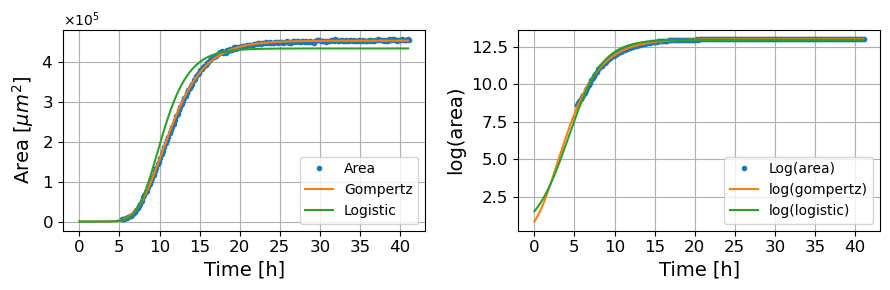

98
Gompertz Model:
  SSR: 0.2338
  R²: 0.9987
  AIC: -1468.9874
  BIC: -1458.8616

Logistic Model:
  SSR: 2.7690
  R²: 0.9845
  AIC: -935.0698
  BIC: -924.9439

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27180281e+01 2.69065964e-02 1.82844966e-19]
Logistic params are: [1.26741182e+01 2.47724923e-02 1.99703752e-16]


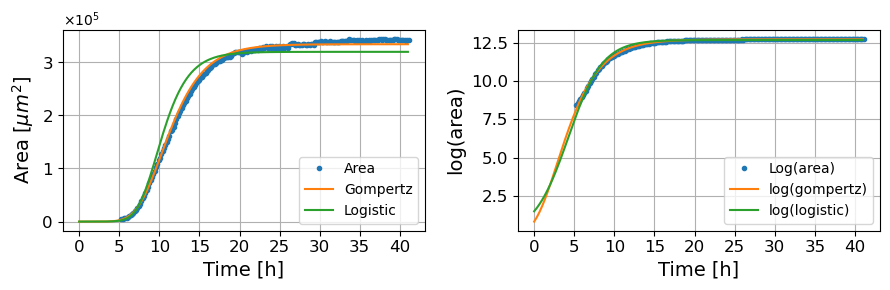

99
Gompertz Model:
  SSR: 0.2525
  R²: 0.9986
  AIC: -1452.3623
  BIC: -1442.2364

Logistic Model:
  SSR: 2.6425
  R²: 0.9858
  AIC: -945.1643
  BIC: -935.0385

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.29148757e+01 2.72738357e-02 9.16845698e-26]
Logistic params are: [1.28703850e+01 2.51086228e-02 5.22733035e-16]


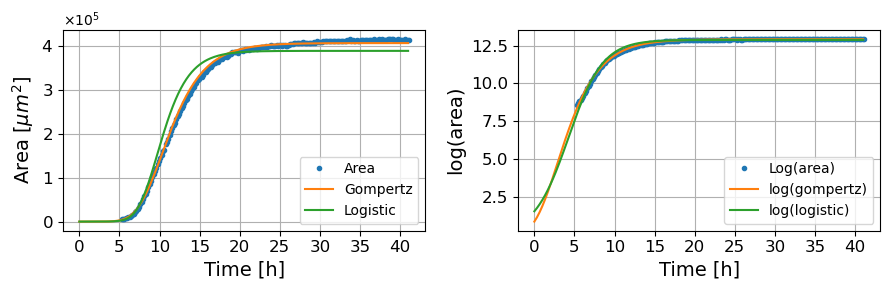

100
Gompertz Model:
  SSR: 0.5424
  R²: 0.9972
  AIC: -1287.2135
  BIC: -1277.0877

Logistic Model:
  SSR: 4.0603
  R²: 0.9792
  AIC: -852.3893
  BIC: -842.2635

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27033019e+01 2.61440778e-02 3.03912361e-20]
Logistic params are: [1.26561329e+01 2.41283425e-02 3.32738835e-11]


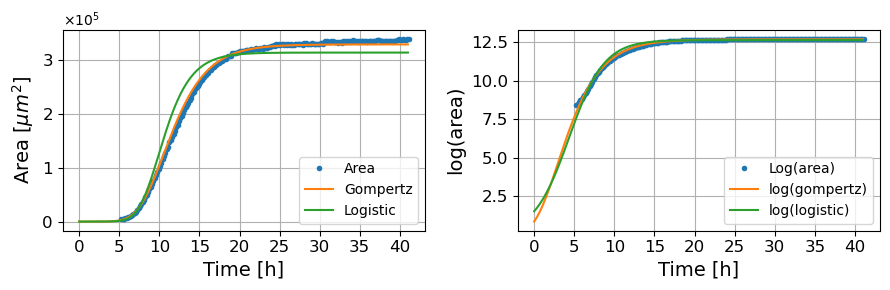

101
Gompertz Model:
  SSR: 0.8238
  R²: 0.9958
  AIC: -1196.9234
  BIC: -1186.7975

Logistic Model:
  SSR: 0.6572
  R²: 0.9966
  AIC: -1245.7401
  BIC: -1235.6143

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.27608798e+01 3.38971120e-02 8.46064455e+01]
Logistic params are: [12.75519897  0.0256385  12.45537609]


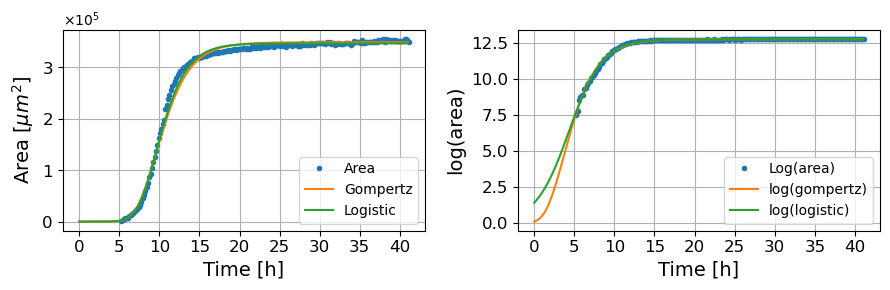

102
Gompertz Model:
  SSR: 0.8891
  R²: 0.9935
  AIC: -1180.4529
  BIC: -1170.3271

Logistic Model:
  SSR: 2.5998
  R²: 0.9810
  AIC: -948.6884
  BIC: -938.5626

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24202258e+01 2.78097320e-02 1.34675343e-23]
Logistic params are: [1.23853658e+01 2.54119926e-02 4.62383506e-16]


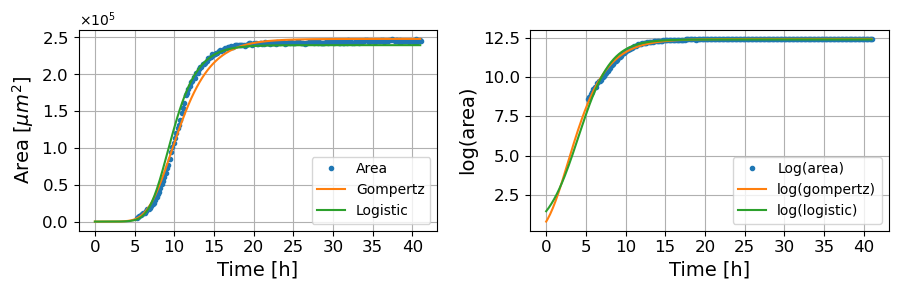

103
Gompertz Model:
  SSR: 0.6809
  R²: 0.9958
  AIC: -1238.0889
  BIC: -1227.9631

Logistic Model:
  SSR: 1.1778
  R²: 0.9928
  AIC: -1119.7154
  BIC: -1109.5896

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24215624e+01 2.90866563e-02 3.24587179e+01]
Logistic params are: [1.23975597e+01 2.46187548e-02 1.10590083e-17]


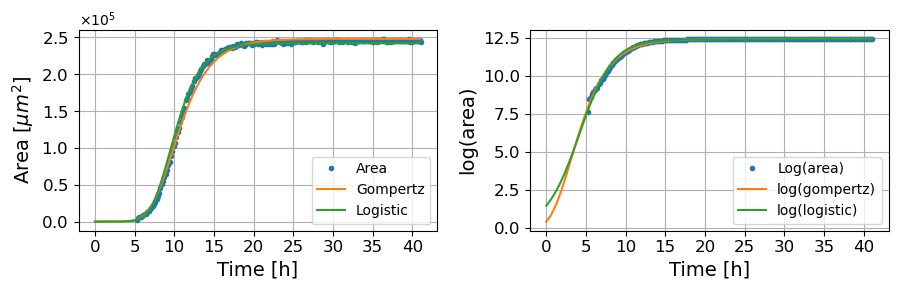

104
Gompertz Model:
  SSR: 0.9412
  R²: 0.9935
  AIC: -1168.1572
  BIC: -1158.0314

Logistic Model:
  SSR: 2.1473
  R²: 0.9851
  AIC: -989.9923
  BIC: -979.8665

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.41896627  0.02800555  6.94352823]
Logistic params are: [1.23862752e+01 2.51870706e-02 2.01026217e-16]


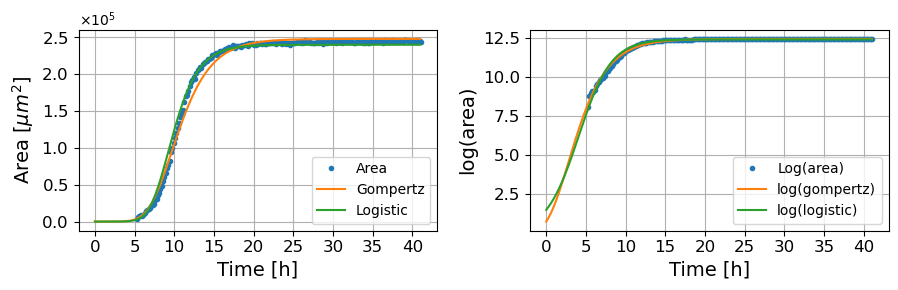

105
Gompertz Model:
  SSR: 0.6503
  R²: 0.9953
  AIC: -1248.0216
  BIC: -1237.8958

Logistic Model:
  SSR: 1.8273
  R²: 0.9869
  AIC: -1024.8445
  BIC: -1014.7187

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.17426285  0.02731652  6.12044593]
Logistic params are: [1.21412921e+01 2.46326334e-02 2.20273949e-16]


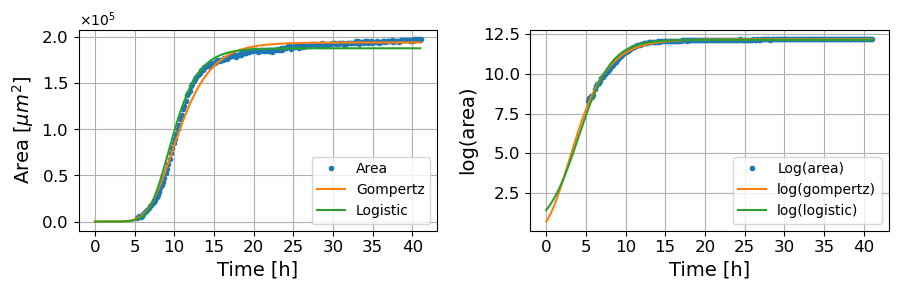

106
Gompertz Model:
  SSR: 0.6122
  R²: 0.9955
  AIC: -1261.0381
  BIC: -1250.9123

Logistic Model:
  SSR: 0.6789
  R²: 0.9951
  AIC: -1238.7193
  BIC: -1228.5935

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19646060e+01 3.00005446e-02 4.76843376e+01]
Logistic params are: [1.19492783e+01 2.43000711e-02 6.35216758e-19]


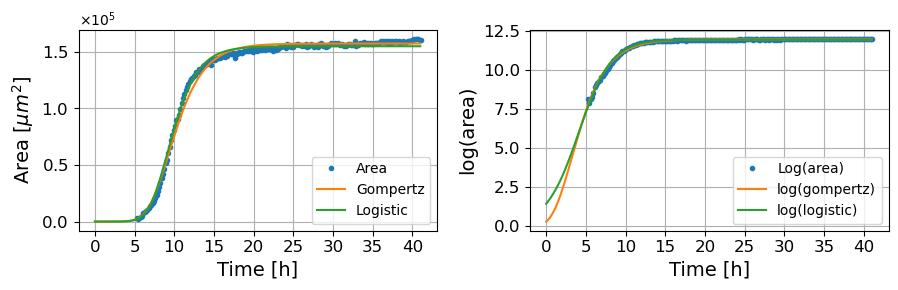

107
Gompertz Model:
  SSR: 0.8545
  R²: 0.9937
  AIC: -1189.0128
  BIC: -1178.8869

Logistic Model:
  SSR: 0.9676
  R²: 0.9929
  AIC: -1162.1763
  BIC: -1152.0505

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20521688e+01 2.97219478e-02 3.97795282e+01]
Logistic params are: [1.20341468e+01 2.45690276e-02 2.07098947e-16]


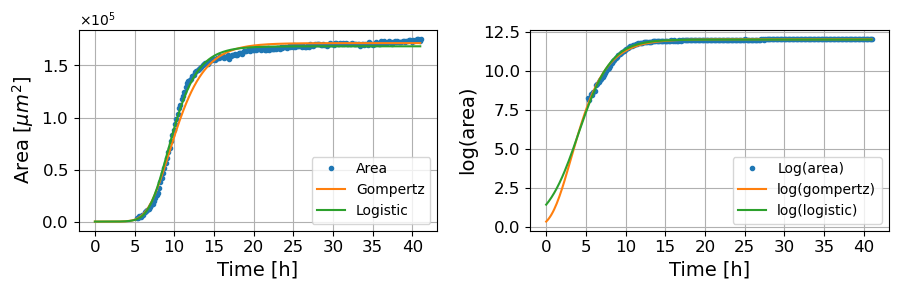

108
Gompertz Model:
  SSR: 1.8675
  R²: 0.9896
  AIC: -1020.1488
  BIC: -1010.0230

Logistic Model:
  SSR: 1.2916
  R²: 0.9928
  AIC: -1099.7908
  BIC: -1089.6650

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.28123342e+01 4.12836778e-02 1.29018752e+02]
Logistic params are: [1.28080906e+01 3.13736767e-02 7.15899445e+01]


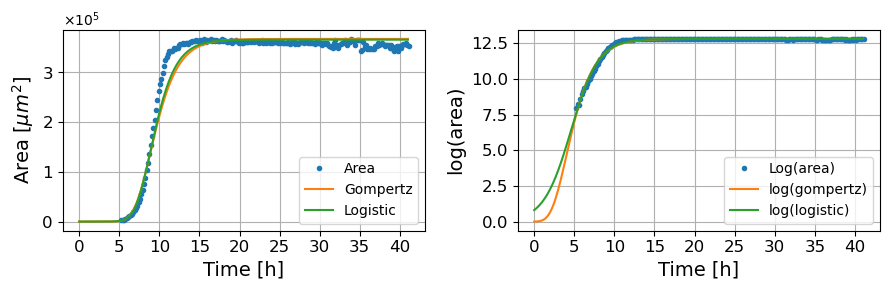

109
Gompertz Model:
  SSR: 1.0488
  R²: 0.9903
  AIC: -1144.7690
  BIC: -1134.6431

Logistic Model:
  SSR: 0.7844
  R²: 0.9927
  AIC: -1207.5106
  BIC: -1197.3847

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20769119e+01 3.65255992e-02 8.52822803e+01]
Logistic params are: [12.07391035  0.02716634 15.06388916]


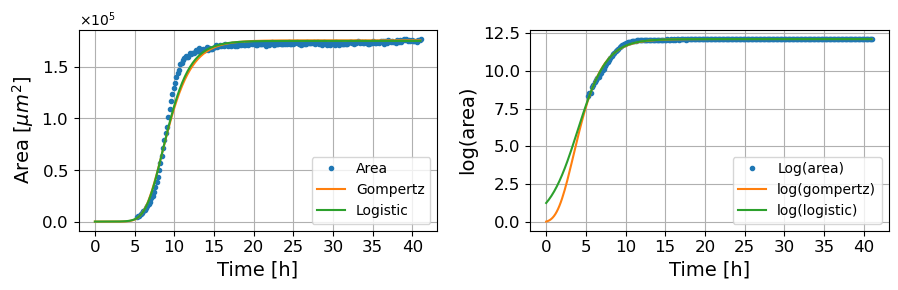

110
Gompertz Model:
  SSR: 0.7735
  R²: 0.9937
  AIC: -1210.5338
  BIC: -1200.4080

Logistic Model:
  SSR: 0.5375
  R²: 0.9956
  AIC: -1289.1657
  BIC: -1279.0399

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20971268e+01 3.80245249e-02 1.04904969e+02]
Logistic params are: [1.20937773e+01 2.84584336e-02 3.98997974e+01]


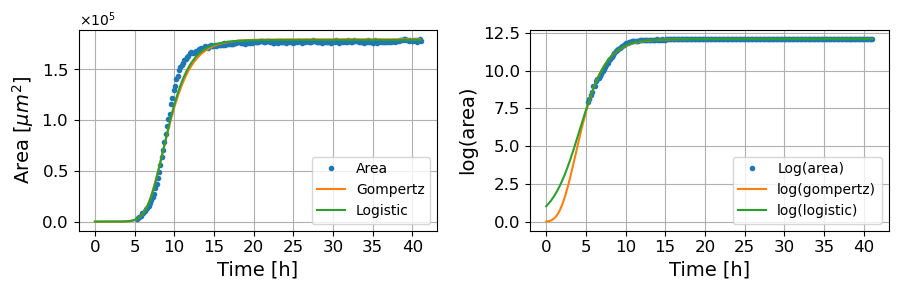

111
Gompertz Model:
  SSR: 1.6635
  R²: 0.9782
  AIC: -1045.1358
  BIC: -1035.0099

Logistic Model:
  SSR: 2.5007
  R²: 0.9673
  AIC: -957.0792
  BIC: -946.9534

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21962224e+01 3.10532726e-02 1.14160318e-09]
Logistic params are: [1.21731284e+01 2.79727091e-02 3.54797556e-19]


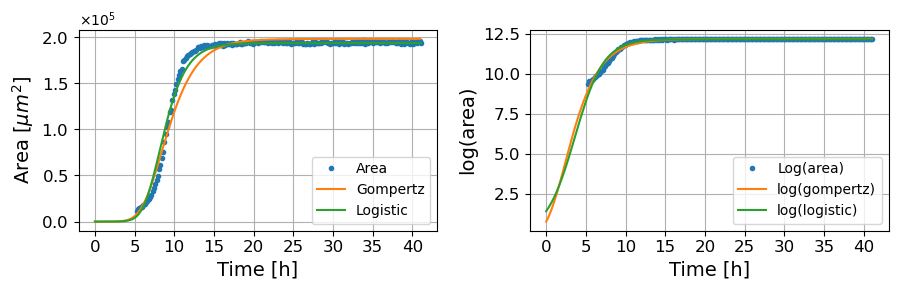

112
Gompertz Model:
  SSR: 1.4098
  R²: 0.9891
  AIC: -1080.8733
  BIC: -1070.7475

Logistic Model:
  SSR: 1.0191
  R²: 0.9921
  AIC: -1150.9806
  BIC: -1140.8548

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26907518e+01 3.97957801e-02 1.00776719e+02]
Logistic params are: [1.26874262e+01 2.97689680e-02 3.54342866e+01]


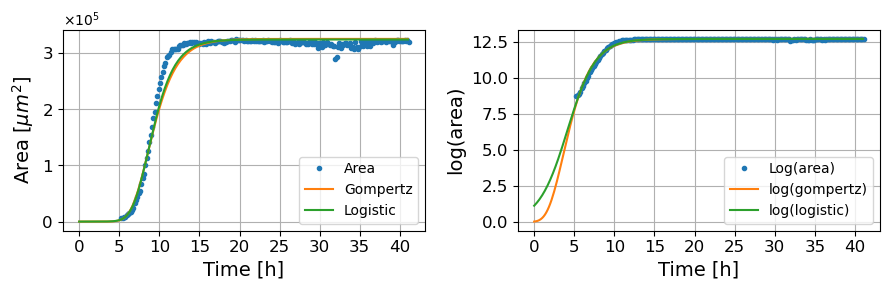

113
Gompertz Model:
  SSR: 1.0369
  R²: 0.9915
  AIC: -1147.2429
  BIC: -1137.1171

Logistic Model:
  SSR: 0.7811
  R²: 0.9936
  AIC: -1208.4293
  BIC: -1198.3035

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23749649e+01 3.96409032e-02 1.05801920e+02]
Logistic params are: [1.23719464e+01 2.95768635e-02 4.08763930e+01]


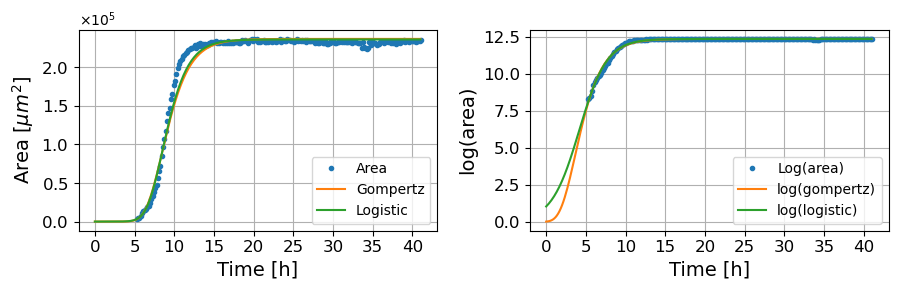

114
Gompertz Model:
  SSR: 0.6050
  R²: 0.9964
  AIC: -1263.6110
  BIC: -1253.4852

Logistic Model:
  SSR: 0.8985
  R²: 0.9946
  AIC: -1178.1871
  BIC: -1168.0613

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24203873e+01 2.97639724e-02 4.27115245e+01]
Logistic params are: [1.24006160e+01 2.45387425e-02 6.85211604e-18]


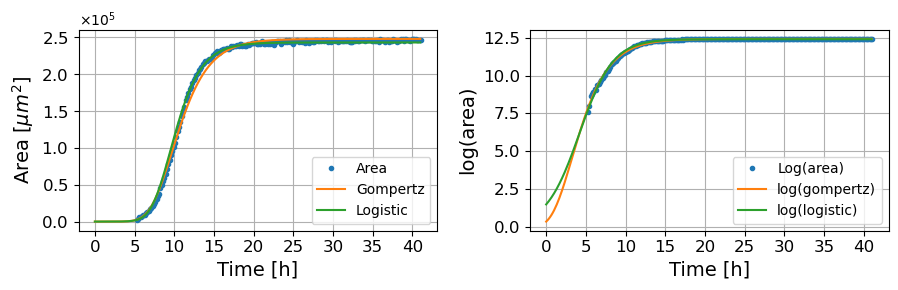

115
Gompertz Model:
  SSR: 0.9225
  R²: 0.9930
  AIC: -1172.4758
  BIC: -1162.3500

Logistic Model:
  SSR: 1.6555
  R²: 0.9874
  AIC: -1046.1676
  BIC: -1036.0418

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.80046099  0.02724458 17.07141375]
Logistic params are: [1.17729777e+01 2.39121566e-02 1.19219975e-19]


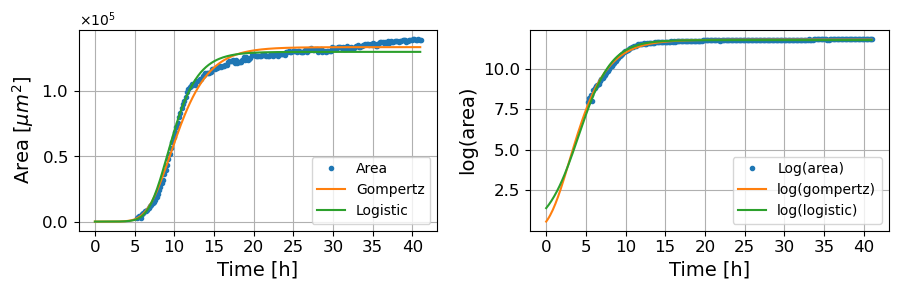

116
Gompertz Model:
  SSR: 0.3490
  R²: 0.9964
  AIC: -2795.5481
  BIC: -2783.5887

Logistic Model:
  SSR: 0.2479
  R²: 0.9975
  AIC: -2931.6352
  BIC: -2919.6758

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23017451e+01 3.27189244e-02 8.57554218e+01]
Logistic params are: [1.23001861e+01 2.40599815e-02 2.11276577e-09]


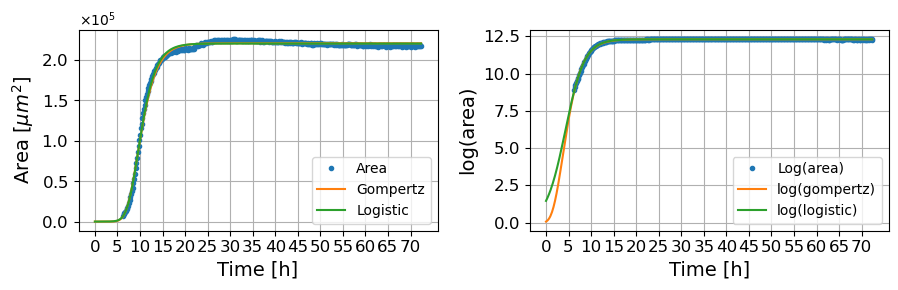

117
Gompertz Model:
  SSR: 0.4678
  R²: 0.9953
  AIC: -2678.9591
  BIC: -2666.9998

Logistic Model:
  SSR: 0.3445
  R²: 0.9965
  AIC: -2800.7684
  BIC: -2788.8091

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23682001e+01 3.49051113e-02 1.05814022e+02]
Logistic params are: [12.36676279  0.02567886 25.3030952 ]


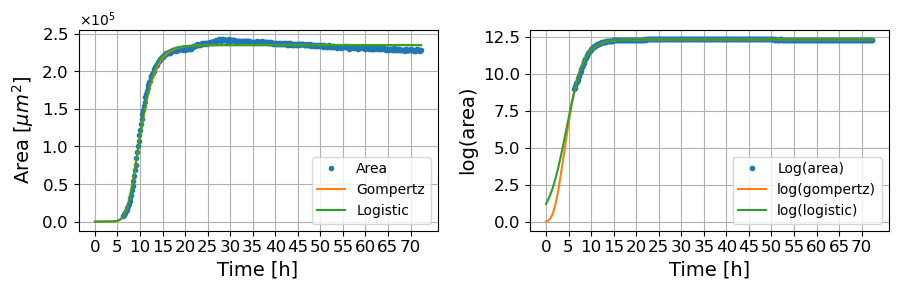

118
Gompertz Model:
  SSR: 0.5851
  R²: 0.9955
  AIC: -2589.9469
  BIC: -2577.9875

Logistic Model:
  SSR: 0.3803
  R²: 0.9971
  AIC: -2761.3853
  BIC: -2749.4259

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24615411e+01 3.36610721e-02 1.11785371e+02]
Logistic params are: [1.24596800e+01 2.50041653e-02 3.24504743e+01]


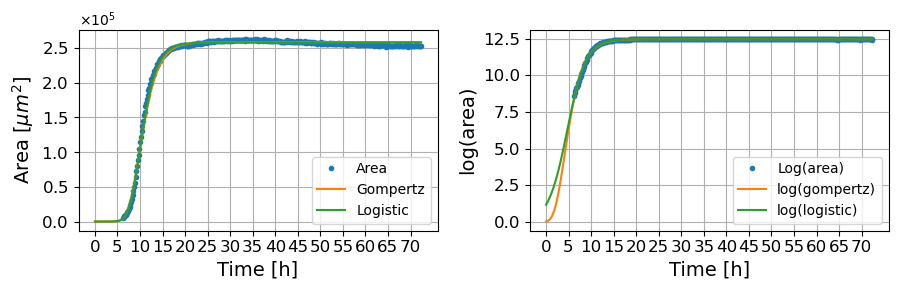

119
Gompertz Model:
  SSR: 0.6379
  R²: 0.9946
  AIC: -2555.5210
  BIC: -2543.5616

Logistic Model:
  SSR: 0.4408
  R²: 0.9963
  AIC: -2702.6511
  BIC: -2690.6917

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22319522e+01 3.47547387e-02 1.23486989e+02]
Logistic params are: [1.22302440e+01 2.58079333e-02 4.79164358e+01]


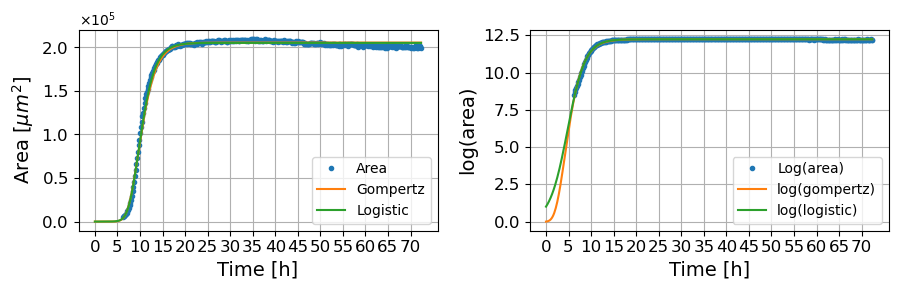

120
Gompertz Model:
  SSR: 1.4492
  R²: 0.9925
  AIC: -2228.9564
  BIC: -2216.9971

Logistic Model:
  SSR: 0.9627
  R²: 0.9950
  AIC: -2391.7473
  BIC: -2379.7879

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20355996e+01 3.09254173e-02 1.33657391e+02]
Logistic params are: [1.20328329e+01 2.34744628e-02 6.08578213e+01]


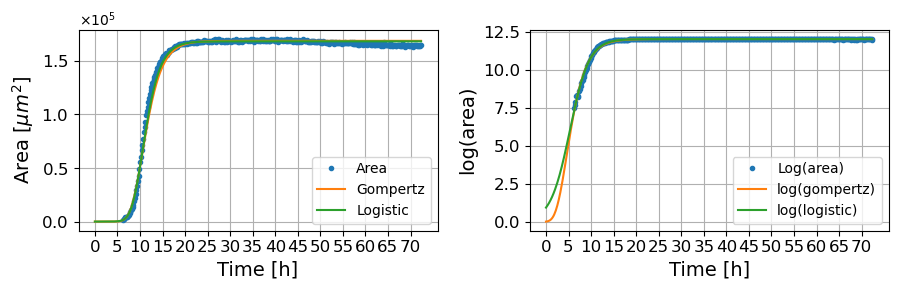

121
Gompertz Model:
  SSR: 1.0509
  R²: 0.9949
  AIC: -2356.8478
  BIC: -2344.8885

Logistic Model:
  SSR: 0.6803
  R²: 0.9967
  AIC: -2529.9206
  BIC: -2517.9612

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24758095e+01 2.72814388e-02 7.68136828e+01]
Logistic params are: [1.24705446e+01 2.10946425e-02 1.50650919e-14]


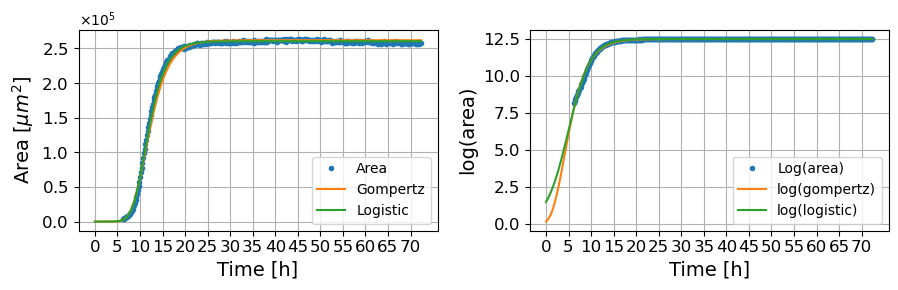

122
Gompertz Model:
  SSR: 0.4525
  R²: 0.9969
  AIC: -2692.2455
  BIC: -2680.2862

Logistic Model:
  SSR: 0.2916
  R²: 0.9980
  AIC: -2867.1032
  BIC: -2855.1439

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26757914e+01 3.05902899e-02 7.95406683e+01]
Logistic params are: [1.26722221e+01 2.31690297e-02 1.36957124e-15]


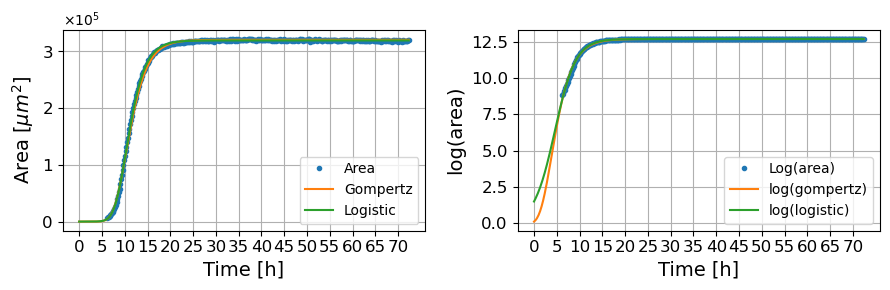

123
Gompertz Model:
  SSR: 0.6607
  R²: 0.9962
  AIC: -2541.5616
  BIC: -2529.6023

Logistic Model:
  SSR: 0.3950
  R²: 0.9978
  AIC: -2746.2862
  BIC: -2734.3268

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.28077813e+01 3.19818713e-02 1.05272459e+02]
Logistic params are: [12.80525777  0.02395434 23.64138481]


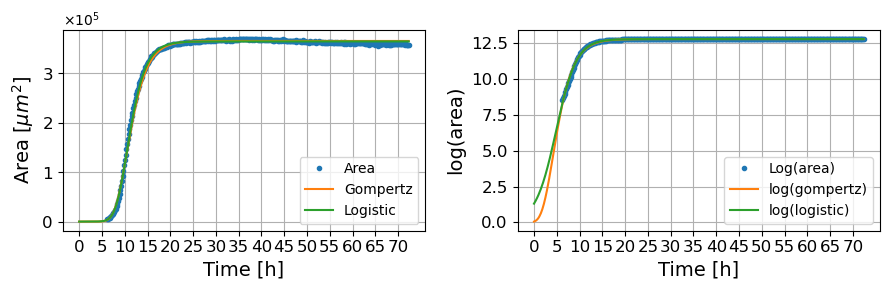

124
Gompertz Model:
  SSR: 0.4928
  R²: 0.9965
  AIC: -2658.2687
  BIC: -2646.3094

Logistic Model:
  SSR: 0.3146
  R²: 0.9978
  AIC: -2836.9001
  BIC: -2824.9408

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.27534654e+01 3.24767700e-02 9.38203182e+01]
Logistic params are: [12.75140864  0.02410125  9.09333165]


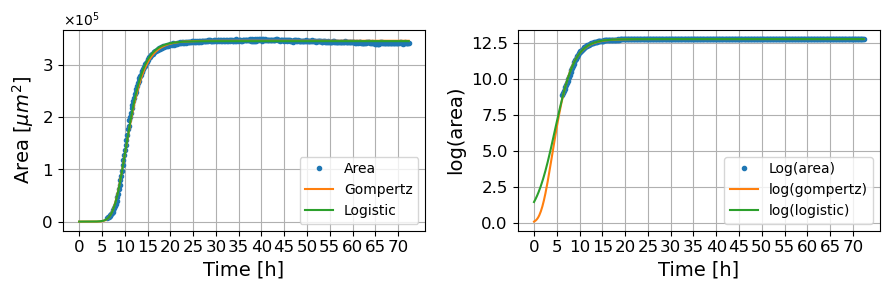

125
Gompertz Model:
  SSR: 7.5740
  R²: 0.9876
  AIC: -1570.7694
  BIC: -1558.8100

Logistic Model:
  SSR: 6.1349
  R²: 0.9900
  AIC: -1654.6358
  BIC: -1642.6764

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16594709e+01 1.57407691e-02 3.30600801e+01]
Logistic params are: [1.16321697e+01 1.38690416e-02 8.18631372e-13]


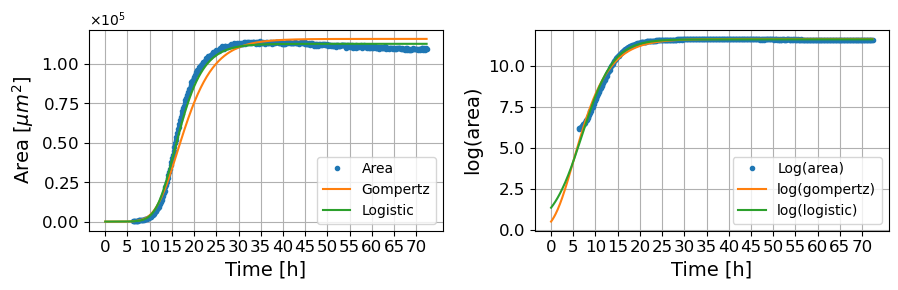

126
Gompertz Model:
  SSR: 3.8035
  R²: 0.9902
  AIC: -1844.9116
  BIC: -1832.9523

Logistic Model:
  SSR: 6.5928
  R²: 0.9829
  AIC: -1625.9894
  BIC: -1614.0300

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20623148e+01 1.81648957e-02 1.03139214e-09]
Logistic params are: [1.20314518e+01 1.68133893e-02 9.37893192e-16]


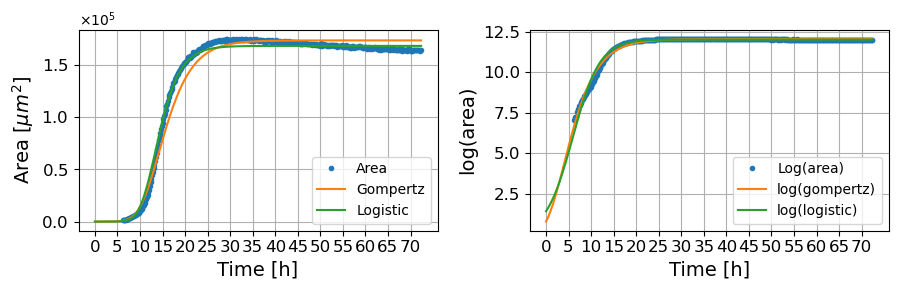

127
Gompertz Model:
  SSR: 2.6363
  R²: 0.9929
  AIC: -1990.7896
  BIC: -1978.8302

Logistic Model:
  SSR: 4.2993
  R²: 0.9884
  AIC: -1796.1426
  BIC: -1784.1832

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.23404008  0.01935843 13.90569807]
Logistic params are: [1.22074635e+01 1.74559825e-02 1.53351014e-18]


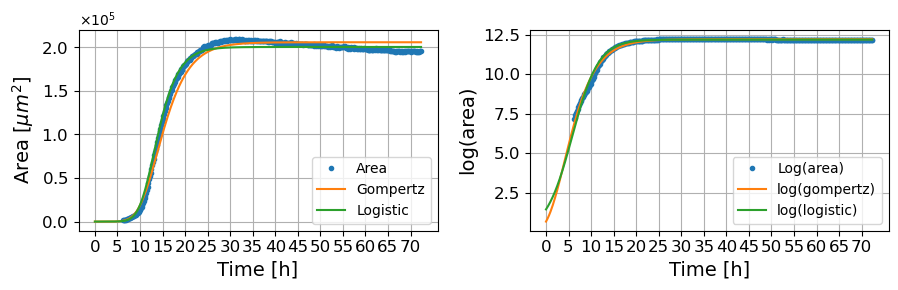

128
Gompertz Model:
  SSR: 2.3000
  R²: 0.9940
  AIC: -2045.1121
  BIC: -2033.1528

Logistic Model:
  SSR: 2.5345
  R²: 0.9934
  AIC: -2006.4676
  BIC: -1994.5082

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.22676766e+01 2.03817293e-02 4.02030331e+01]
Logistic params are: [1.22483923e+01 1.74757115e-02 1.04457230e-15]


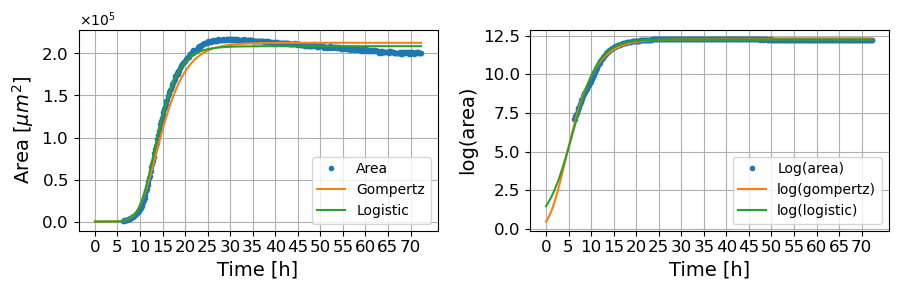

129
Gompertz Model:
  SSR: 2.7725
  R²: 0.9957
  AIC: -1970.7526
  BIC: -1958.7933

Logistic Model:
  SSR: 11.9923
  R²: 0.9815
  AIC: -1387.8694
  BIC: -1375.9101

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.30156143e+01 1.72213949e-02 1.58649668e-17]
Logistic params are: [1.29688889e+01 1.60948518e-02 1.18436459e-16]


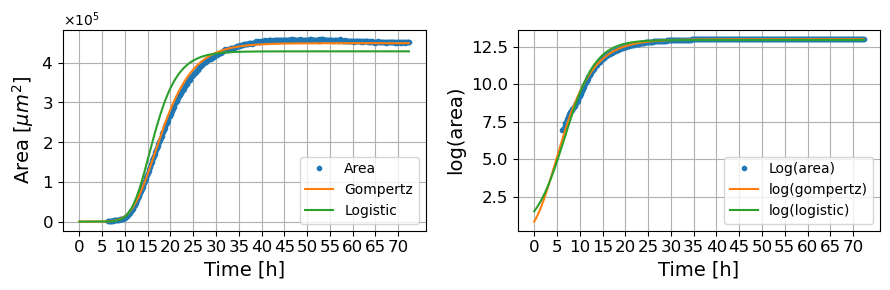

130
Gompertz Model:
  SSR: 2.7898
  R²: 0.9957
  AIC: -1968.2746
  BIC: -1956.3153

Logistic Model:
  SSR: 7.2866
  R²: 0.9888
  AIC: -1586.1650
  BIC: -1574.2057

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27156425e+01 1.67310848e-02 4.77944237e-10]
Logistic params are: [1.26702228e+01 1.56374392e-02 7.84995189e-16]


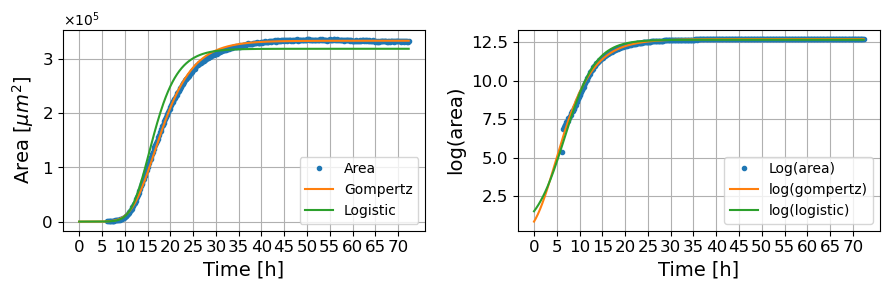

131
Gompertz Model:
  SSR: 2.3263
  R²: 0.9964
  AIC: -2040.5838
  BIC: -2028.6245

Logistic Model:
  SSR: 7.0799
  R²: 0.9890
  AIC: -1597.6159
  BIC: -1585.6566

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.71087081  0.01691254  3.19083478]
Logistic params are: [1.26664992e+01 1.57275493e-02 1.18381182e-12]


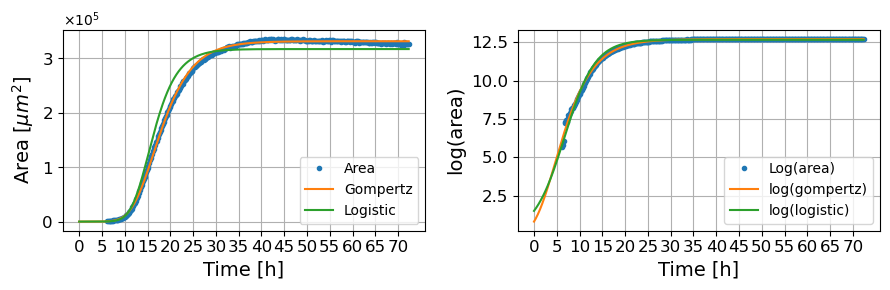

132
Gompertz Model:
  SSR: 3.5932
  R²: 0.9946
  AIC: -1867.5442
  BIC: -1855.5848

Logistic Model:
  SSR: 6.8236
  R²: 0.9898
  AIC: -1612.2943
  BIC: -1600.3349

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.87170769  0.01746341 16.16489782]
Logistic params are: [1.28332799e+01 1.58611041e-02 1.69669885e-14]


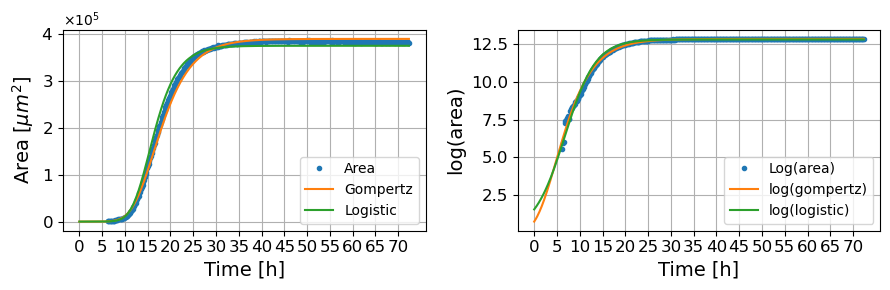

133
Gompertz Model:
  SSR: 3.1204
  R²: 0.9950
  AIC: -1923.7011
  BIC: -1911.7417

Logistic Model:
  SSR: 10.0149
  R²: 0.9841
  AIC: -1459.5867
  BIC: -1447.6274

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.32195954e+01 1.79368250e-02 2.74429494e-13]
Logistic params are: [1.31764323e+01 1.67142006e-02 1.76649548e-17]


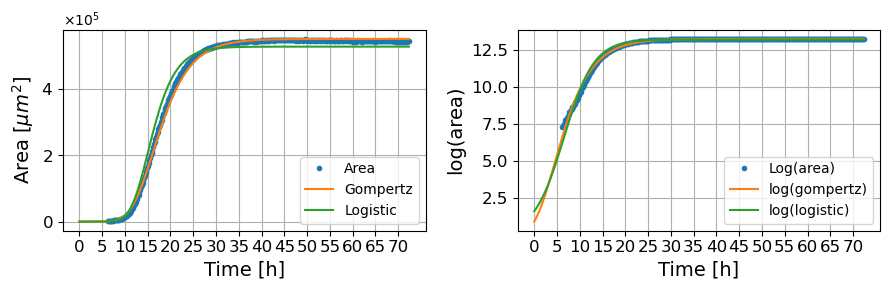

134
Gompertz Model:
  SSR: 3.3297
  R²: 0.9945
  AIC: -1897.8643
  BIC: -1885.9050

Logistic Model:
  SSR: 8.1897
  R²: 0.9866
  AIC: -1539.6615
  BIC: -1527.7021

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.32335543e+01 1.82111657e-02 7.39808830e-12]
Logistic params are: [1.31923549e+01 1.69475873e-02 4.31195875e-15]


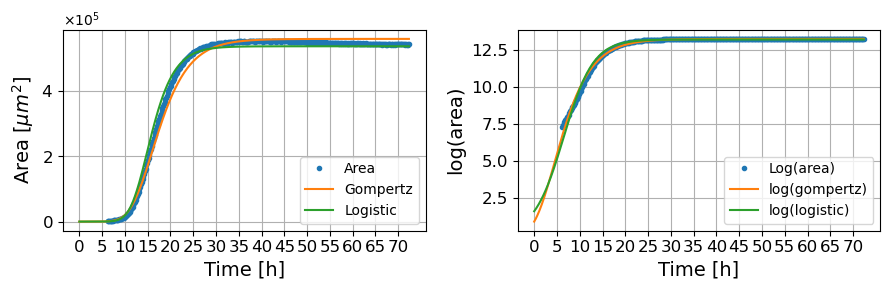

135
Gompertz Model:
  SSR: 0.8368
  R²: 0.9944
  AIC: -2447.5066
  BIC: -2435.5473

Logistic Model:
  SSR: 0.5512
  R²: 0.9963
  AIC: -2613.6635
  BIC: -2601.7042

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23943413e+01 3.45194855e-02 1.32572780e+02]
Logistic params are: [1.23922424e+01 2.58585698e-02 5.95214171e+01]


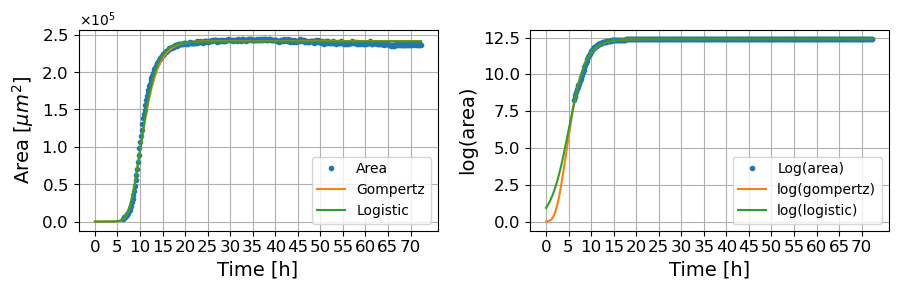

136
Gompertz Model:
  SSR: 0.2765
  R²: 0.9976
  AIC: -2954.4849
  BIC: -2942.4659

Logistic Model:
  SSR: 0.3096
  R²: 0.9973
  AIC: -2908.6119
  BIC: -2896.5929

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.22164381e+01 3.61190167e-02 4.99753175e+01]
Logistic params are: [1.22116050e+01 2.84584549e-02 1.54272466e-16]


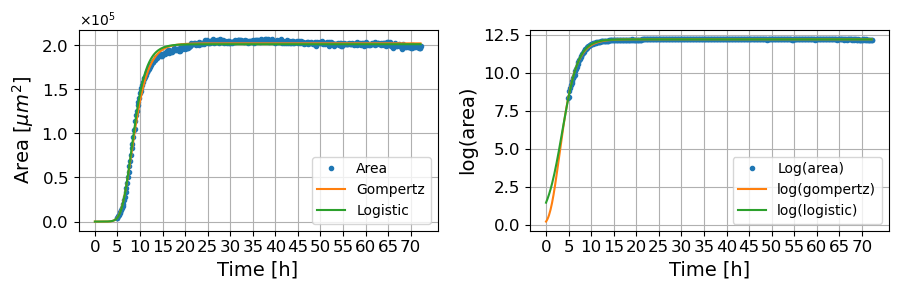

137
Gompertz Model:
  SSR: 0.3034
  R²: 0.9967
  AIC: -2916.8522
  BIC: -2904.8331

Logistic Model:
  SSR: 1.3008
  R²: 0.9857
  AIC: -2325.8166
  BIC: -2313.7975

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21220516e+01 3.23075852e-02 2.32041613e-11]
Logistic params are: [1.21097268e+01 2.92654684e-02 2.26776686e-17]


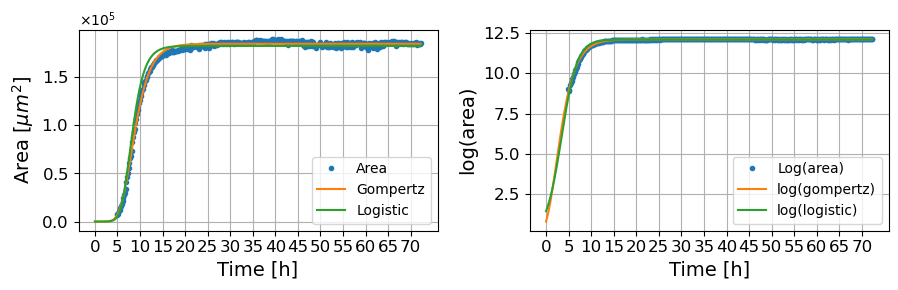

138
Gompertz Model:
  SSR: 0.4670
  R²: 0.9958
  AIC: -2741.7114
  BIC: -2729.6924

Logistic Model:
  SSR: 0.5147
  R²: 0.9954
  AIC: -2702.2362
  BIC: -2690.2171

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.22880616e+01 3.58119772e-02 4.25623949e+01]
Logistic params are: [1.22821868e+01 2.88206288e-02 9.21944491e-21]


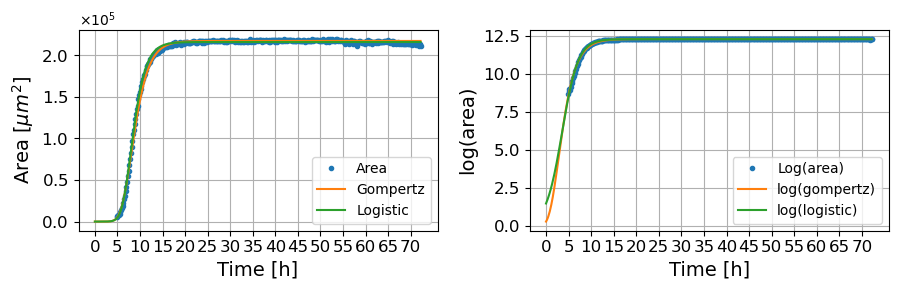

139
Gompertz Model:
  SSR: 0.4817
  R²: 0.9955
  AIC: -2729.1431
  BIC: -2717.1241

Logistic Model:
  SSR: 1.0917
  R²: 0.9898
  AIC: -2396.9483
  BIC: -2384.9293

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.38512664  0.03367466 16.33836233]
Logistic params are: [1.23748860e+01 2.92189760e-02 3.98056916e-15]


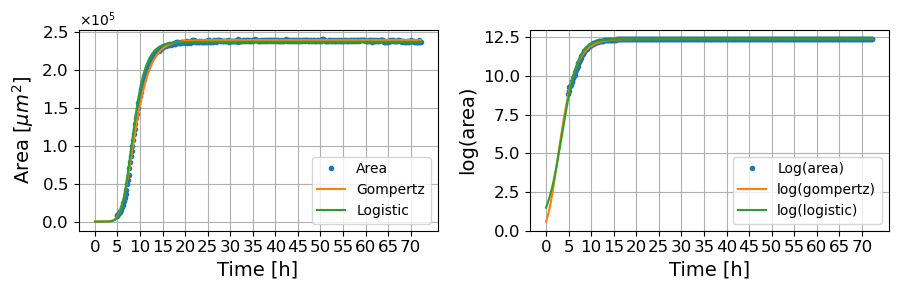

140
Gompertz Model:
  SSR: 1.0086
  R²: 0.9935
  AIC: -2429.1049
  BIC: -2417.0858

Logistic Model:
  SSR: 0.8439
  R²: 0.9946
  AIC: -2501.4825
  BIC: -2489.4634

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21667324e+01 3.32911349e-02 5.00006717e+01]
Logistic params are: [1.21610320e+01 2.65025291e-02 2.07816060e-19]


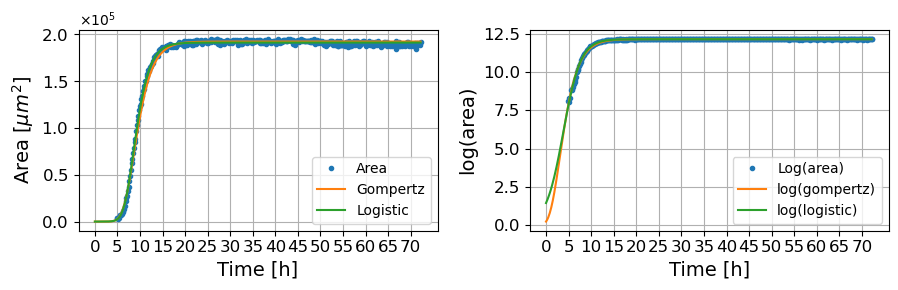

141
Gompertz Model:
  SSR: 0.7164
  R²: 0.9950
  AIC: -2568.0104
  BIC: -2555.9914

Logistic Model:
  SSR: 0.7521
  R²: 0.9948
  AIC: -2548.2473
  BIC: -2536.2282

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21760099e+01 3.29461670e-02 4.03222982e+01]
Logistic params are: [1.21687175e+01 2.69253312e-02 3.53409686e-27]


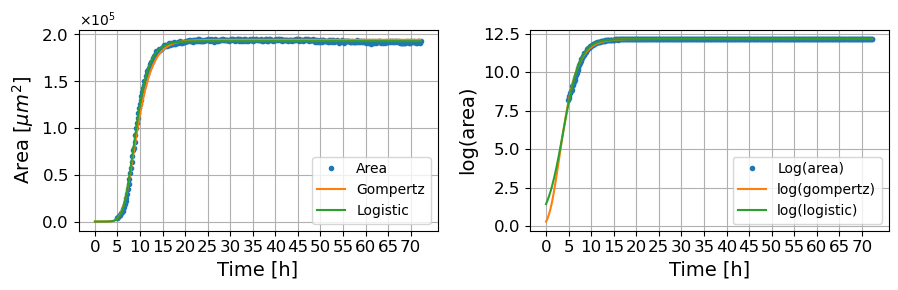

142
Gompertz Model:
  SSR: 0.2954
  R²: 0.9973
  AIC: -2927.6866
  BIC: -2915.6675

Logistic Model:
  SSR: 0.1849
  R²: 0.9983
  AIC: -3117.9730
  BIC: -3105.9539

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.28831796e+01 4.20308895e-02 6.83928711e+01]
Logistic params are: [12.88171909  0.0311067   1.20538701]


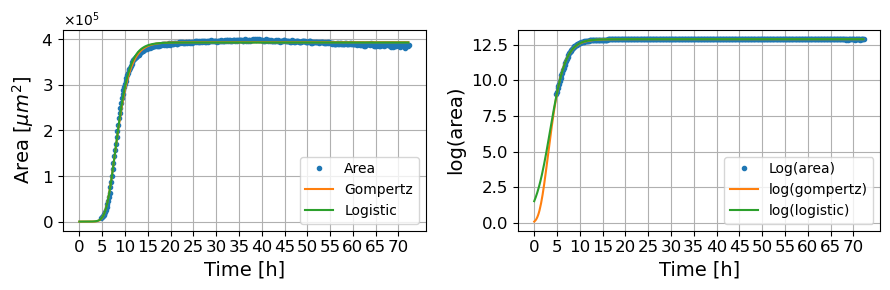

143
Gompertz Model:
  SSR: 0.3065
  R²: 0.9970
  AIC: -2912.6516
  BIC: -2900.6325

Logistic Model:
  SSR: 0.1883
  R²: 0.9982
  AIC: -3110.5123
  BIC: -3098.4932

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26898449e+01 4.20370982e-02 6.97238303e+01]
Logistic params are: [12.68850883  0.0310612   2.94692241]


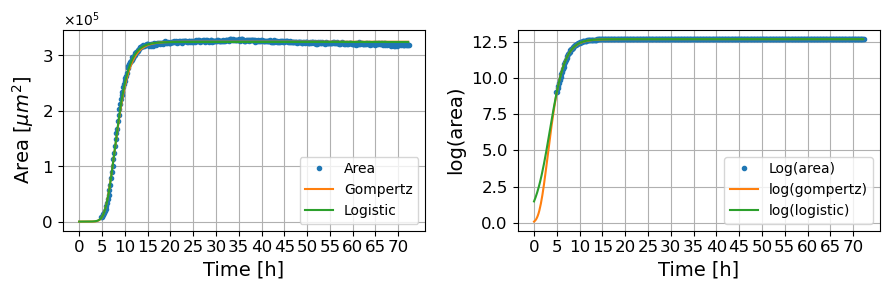

144
Gompertz Model:
  SSR: 0.5458
  R²: 0.9958
  AIC: -2678.4096
  BIC: -2666.3906

Logistic Model:
  SSR: 0.3611
  R²: 0.9972
  AIC: -2846.1681
  BIC: -2834.1490

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24243902e+01 3.77848558e-02 6.53936991e+01]
Logistic params are: [1.24221625e+01 2.84309098e-02 3.67447963e-15]


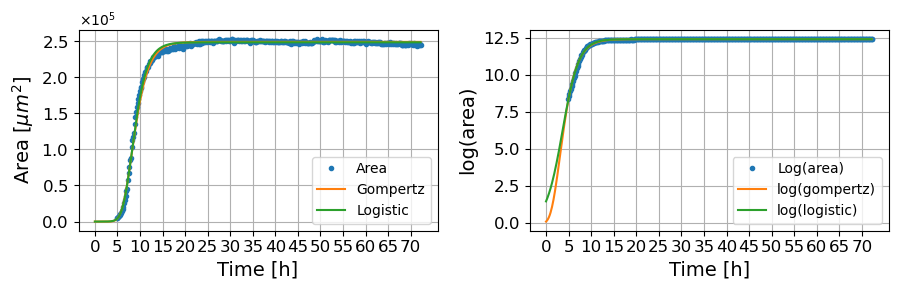

145
Gompertz Model:
  SSR: 5.3976
  R²: 0.9910
  AIC: -1748.0842
  BIC: -1736.0652

Logistic Model:
  SSR: 9.6963
  R²: 0.9839
  AIC: -1510.2513
  BIC: -1498.2322

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27131017e+01 2.05301099e-02 1.34675343e-23]
Logistic params are: [1.26805341e+01 1.91401719e-02 1.01279376e-14]


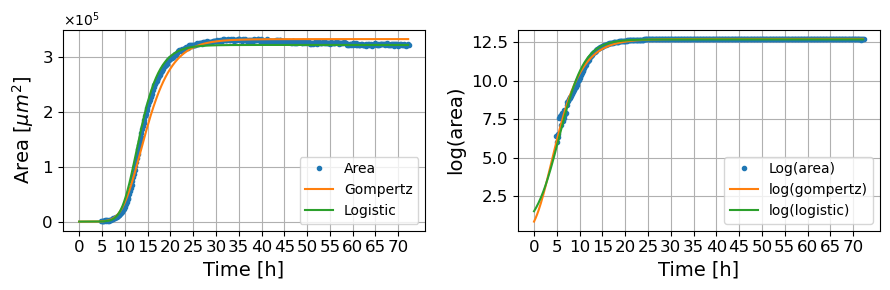

146
Gompertz Model:
  SSR: 18.6532
  R²: 0.9707
  AIC: -1236.4594
  BIC: -1224.4552

Logistic Model:
  SSR: 20.7848
  R²: 0.9674
  AIC: -1192.7454
  BIC: -1180.7412

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.18846792e+01 1.98807938e-02 5.43492068e+01]
Logistic params are: [1.18685368e+01 1.66121887e-02 1.79390879e-13]


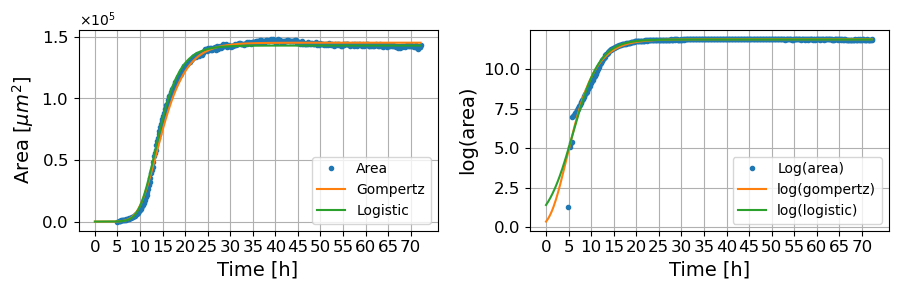

147
Gompertz Model:
  SSR: 11.1714
  R²: 0.9723
  AIC: -1443.5748
  BIC: -1431.5705

Logistic Model:
  SSR: 22.1160
  R²: 0.9452
  AIC: -1167.6651
  BIC: -1155.6609

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.15118561e+01 1.86782303e-02 1.05593635e-17]
Logistic params are: [1.14817281e+01 1.73884570e-02 4.19936106e-16]


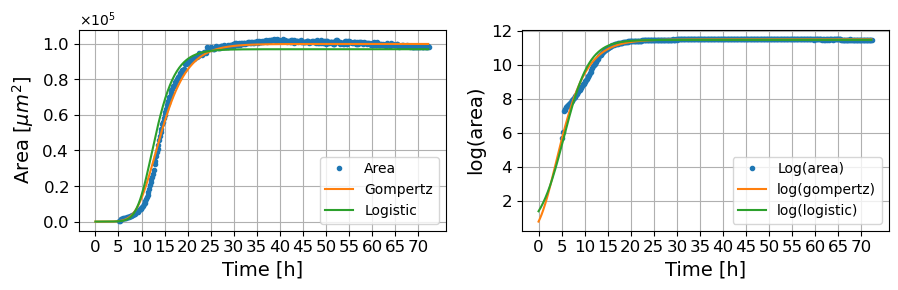

148
Gompertz Model:
  SSR: 20.0818
  R²: 0.9561
  AIC: -1214.6554
  BIC: -1202.6363

Logistic Model:
  SSR: 37.1591
  R²: 0.9188
  AIC: -964.8049
  BIC: -952.7859

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.15503188e+01 1.86162835e-02 8.09447928e-22]
Logistic params are: [1.15188773e+01 1.73599009e-02 4.39100539e-16]


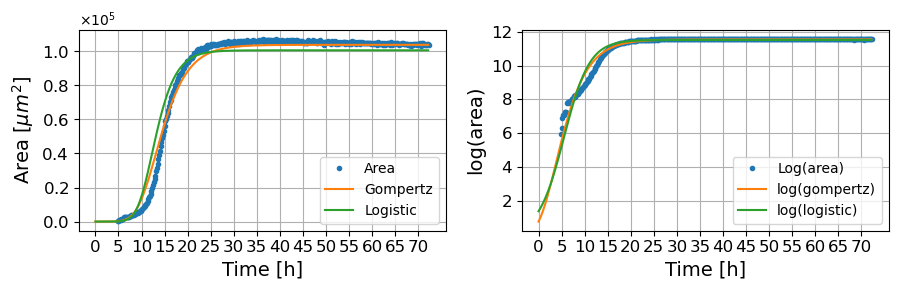

149
Gompertz Model:
  SSR: 2.1054
  R²: 0.9915
  AIC: -2005.5764
  BIC: -1993.7089

Logistic Model:
  SSR: 1.4543
  R²: 0.9941
  AIC: -2148.3905
  BIC: -2136.5230

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18237628e+01 2.03872715e-02 1.26946816e+02]
Logistic params are: [1.18193796e+01 1.54440138e-02 1.67963703e+01]


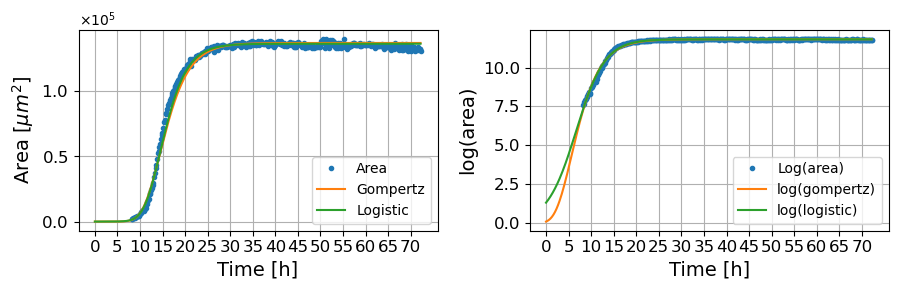

150
Gompertz Model:
  SSR: 6.1008
  R²: 0.9896
  AIC: -1698.3607
  BIC: -1686.3417

Logistic Model:
  SSR: 12.6045
  R²: 0.9785
  AIC: -1403.7536
  BIC: -1391.7346

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19628737e+01 1.84850139e-02 4.52750198e-16]
Logistic params are: [1.19307294e+01 1.72347029e-02 1.28746757e-16]


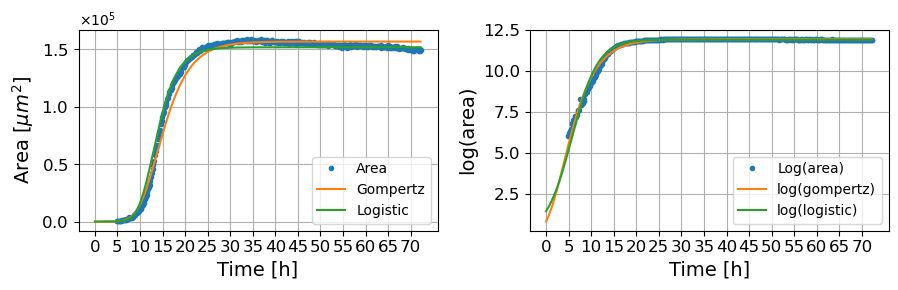

151
Gompertz Model:
  SSR: 7.8223
  R²: 0.9855
  AIC: -1597.4484
  BIC: -1585.4293

Logistic Model:
  SSR: 10.2850
  R²: 0.9810
  AIC: -1486.3209
  BIC: -1474.3018

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.23145536e+01 2.02935716e-02 1.60475686e-18]
Logistic params are: [1.22854166e+01 1.88772733e-02 1.31296395e-12]


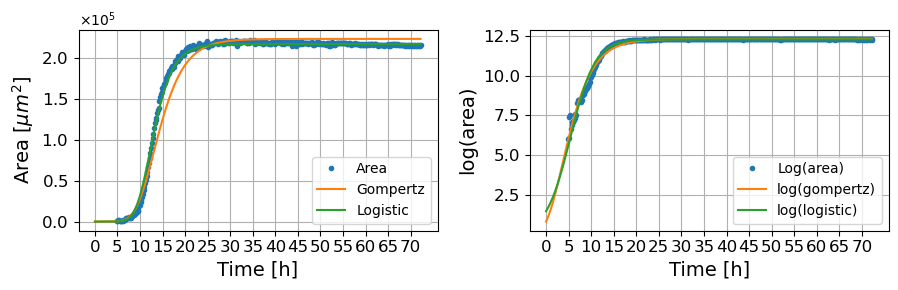

152
Gompertz Model:
  SSR: 7.7710
  R²: 0.9854
  AIC: -1590.2114
  BIC: -1578.2071

Logistic Model:
  SSR: 7.3801
  R²: 0.9861
  AIC: -1611.0613
  BIC: -1599.0570

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20829856e+01 2.06001117e-02 3.45951044e+01]
Logistic params are: [1.20637966e+01 1.78384665e-02 2.62064256e-14]


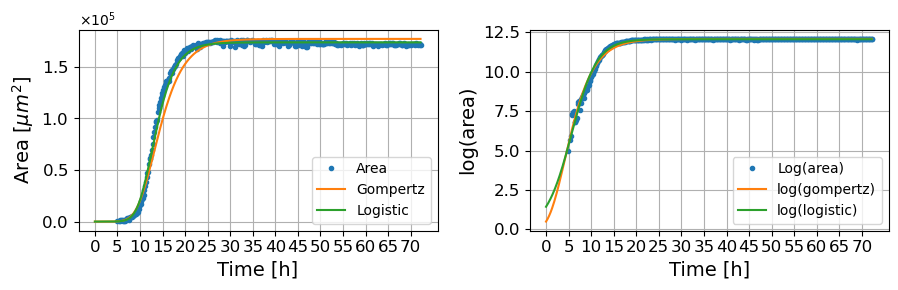

153
Gompertz Model:
  SSR: 27.8479
  R²: 0.9654
  AIC: -1067.2174
  BIC: -1055.2281

Logistic Model:
  SSR: 33.5377
  R²: 0.9584
  AIC: -992.4805
  BIC: -980.4911

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20121080e+01 2.75605241e-02 1.90281737e+02]
Logistic params are: [1.20024281e+01 2.26313495e-02 1.45681473e+02]


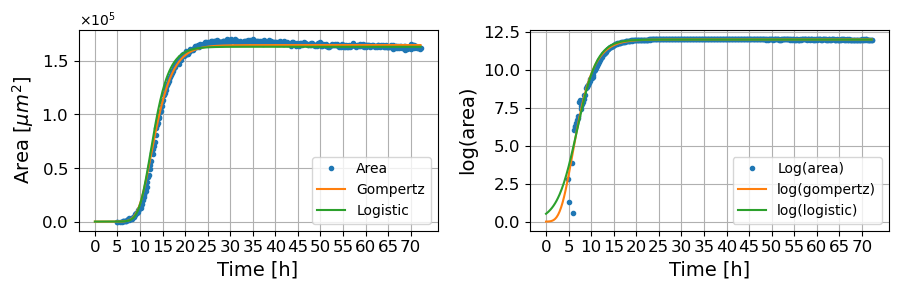

154
Gompertz Model:
  SSR: 3.5530
  R²: 0.9874
  AIC: -1917.8576
  BIC: -1905.8385

Logistic Model:
  SSR: 8.3992
  R²: 0.9702
  AIC: -1568.5573
  BIC: -1556.5383

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19423355e+01 2.35392425e-02 4.86793979e-12]
Logistic params are: [1.19197067e+01 2.17860808e-02 2.03891039e-15]


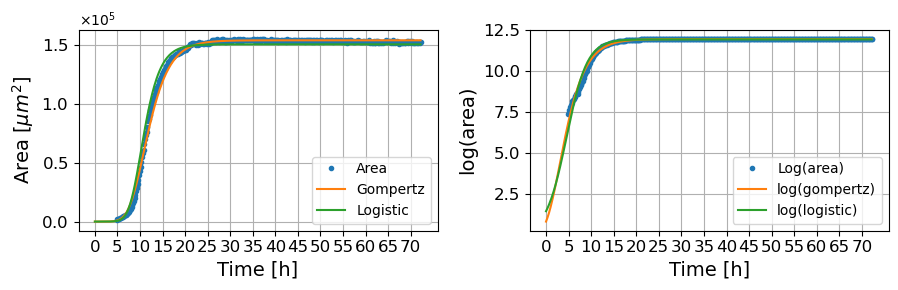

155
Gompertz Model:
  SSR: 3.0840
  R²: 0.9887
  AIC: -1975.3258
  BIC: -1963.3067

Logistic Model:
  SSR: 7.2223
  R²: 0.9736
  AIC: -1629.8484
  BIC: -1617.8293

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20913311e+01 2.42640351e-02 9.00208843e-16]
Logistic params are: [1.20693624e+01 2.24299275e-02 3.13476513e-18]


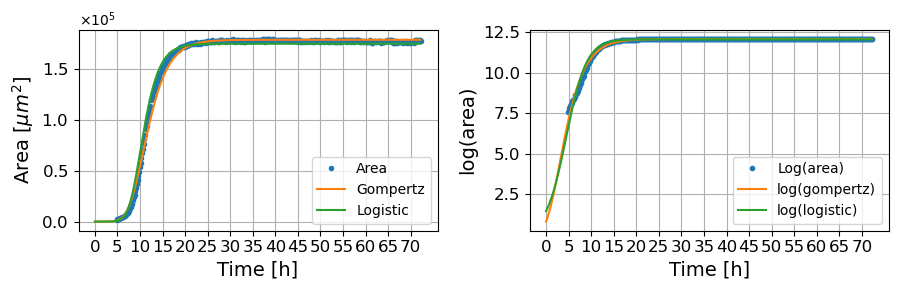

156
Gompertz Model:
  SSR: 3.2580
  R²: 0.9901
  AIC: -1953.0502
  BIC: -1941.0311

Logistic Model:
  SSR: 7.2786
  R²: 0.9778
  AIC: -1626.6939
  BIC: -1614.6748

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21765388e+01 2.33356792e-02 1.34327080e-12]
Logistic params are: [1.21523144e+01 2.16324577e-02 3.31192712e-16]


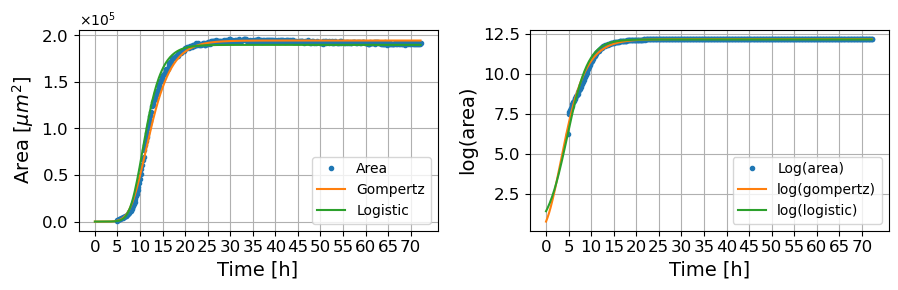

157
Gompertz Model:
  SSR: 0.5265
  R²: 0.9955
  AIC: -2693.0359
  BIC: -2681.0169

Logistic Model:
  SSR: 0.8533
  R²: 0.9928
  AIC: -2496.9806
  BIC: -2484.9615

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.27636405  0.03369309 28.27979034]
Logistic params are: [1.22676859e+01 2.83448258e-02 3.91552957e-17]


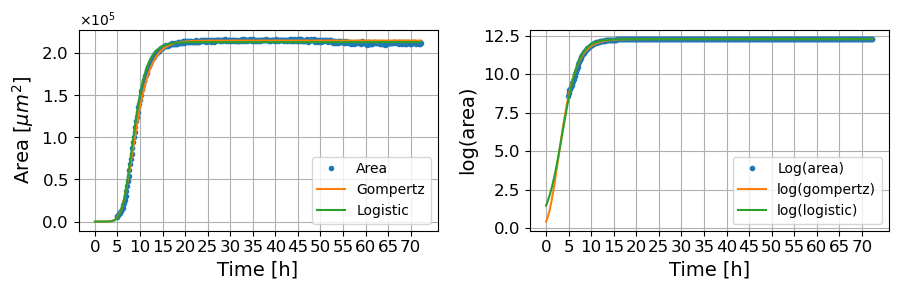

158
Gompertz Model:
  SSR: 12.4795
  R²: 0.9761
  AIC: -1407.8013
  BIC: -1395.7823

Logistic Model:
  SSR: 20.5842
  R²: 0.9605
  AIC: -1204.6224
  BIC: -1192.6033

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21745361e+01 1.97832714e-02 2.05684039e-12]
Logistic params are: [1.21450964e+01 1.83951336e-02 1.12403864e-15]


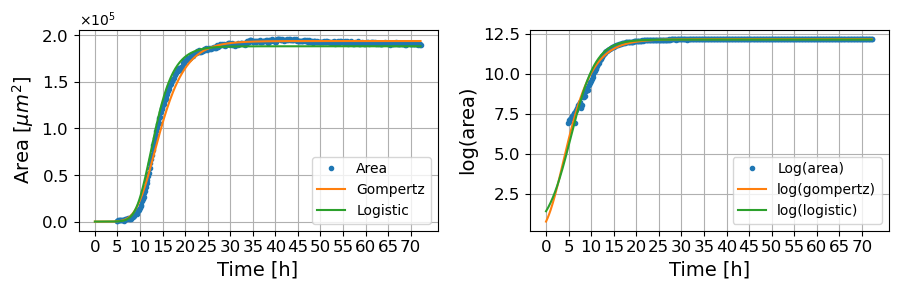

159
Gompertz Model:
  SSR: 42.0150
  R²: 0.8736
  AIC: -914.9402
  BIC: -902.9211

Logistic Model:
  SSR: 65.2683
  R²: 0.8037
  AIC: -736.1060
  BIC: -724.0870

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.06380361e+01 1.78058624e-02 2.49700579e-14]
Logistic params are: [1.06073393e+01 1.66397634e-02 1.83878302e-14]


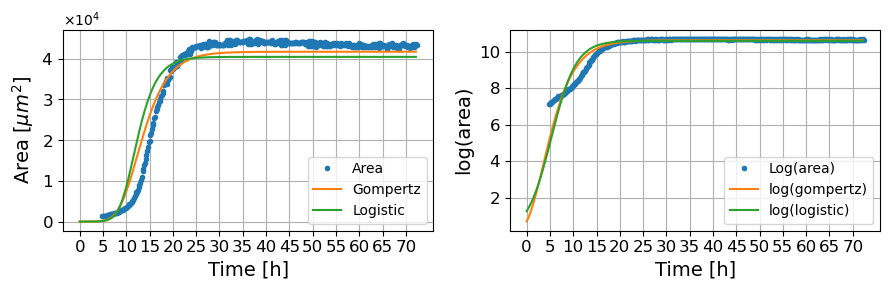

In [10]:
aic_gomp = 0
aic_log = 0
bic_gomp = 0
bic_log = 0

gomp_params = np.zeros((len(df.index.values),3))
log_params = np.zeros((len(df.index.values),3))

# index 4 is for thesis figure
#for i in [4]:#df.index.values:

for i in df.index.values:
    print(i)
    # Fit the model
    incub_time_s = datetime.strptime(df.loc[i,'t_im'], '%H:%M:%S') - datetime.strptime(df.loc[i,'t_incub'], '%H:%M:%S')
    incub_time_n = incub_time_s.seconds / 60
    #area = extract_array(df.loc[i,'area'])
    area = extract_array(df.loc[i,'area_px']) * df.loc[i,'um_px']**2
    time_points = np.arange(0, df.loc[i, 'exp length'])*10 + incub_time_n

    # this is for positions i in [146,147,149,152,153] that contain area = 0 then log(a) = inf
    valid_indices = area > 0
    time_points = time_points[valid_indices]
    area = area[valid_indices]
    
    #p0_gomp=[area[-1], 200, incub_time_n]
    #p0_log=[np.log(area[-1]), 0.1, incub_time_n]

    p0_gomp=[np.log(area[-1]), 0.02, 300]
    p0_log=[np.log(area[-1]), 0.02, 300]

    # Fit both models   
    ## gomp
    bounds_gomp = ([0, 0, 0], [np.inf, np.inf, np.inf])
    bounds_log = ([0, 0, 0], [np.inf, np.inf, np.inf])
    
    #try:
    params_gompertz, cov_gompertz = curve_fit(gompertz, time_points, np.log(area), p0_gomp, bounds=bounds_gomp, maxfev=10000)
    #except:
    #    idx = np.where(np.isfinite(np.log(area)))[0]
    #    params_gompertz, cov_gompertz = curve_fit(gompertz, time_points[idx], np.log(area)[idx], p0_gomp, bounds=bounds_gomp, maxfev = 10000)#, bounds=([1, 0, 0], [np.inf, np.inf, np.inf]), max_nfev=10000)
    
    ## logistic
    #try:
    params_logistic, cov_logistic = curve_fit(logistic, time_points, np.log(area), p0_log, bounds=bounds_log, maxfev=10000)     
    #except:
    #    idx = np.where(np.isfinite(np.log(area)))[0]
    #    params_logistic, cov_logistic = curve_fit(logistic, time_points[idx], np.log(area)[idx], p0_log, bounds=bounds_log, maxfev=10000)#, bounds=([1, 0, 0], [np.inf, np.inf, np.inf]), max_nfev=10000)

    gomp_params[i,:] = params_gompertz
    log_params[i,:] = params_logistic
    
     # Calculate predicted values
    pred_gompertz = gompertz(time_points, *params_gompertz)
    pred_logistic = logistic(time_points, *params_logistic)
    
    # Calculate residuals
    residuals_gompertz = np.log(area) - pred_gompertz
    residuals_logistic = np.log(area) - pred_logistic
    
    # Calculate SSR (Sum of Squared Residuals)
    ssr_gompertz = np.sum(residuals_gompertz**2)
    ssr_logistic = np.sum(residuals_logistic**2)
    
    # Calculate R²
    r2_gompertz = r2_score(np.log(area), pred_gompertz)
    r2_logistic = r2_score(np.log(area), pred_logistic)
    
    # Calculate AIC
    n = len(area)
    aic_gompertz = n * np.log(ssr_gompertz/n) + 2 * len(params_gompertz)
    aic_logistic = n * np.log(ssr_logistic/n) + 2 * len(params_logistic)
    
    # Calculate BIC
    bic_gompertz = n * np.log(ssr_gompertz/n) + len(params_gompertz) * np.log(n)
    bic_logistic = n * np.log(ssr_logistic/n) + len(params_logistic) * np.log(n)
    
    # Print results
    print("Gompertz Model:")
    print(f"  SSR: {ssr_gompertz:.4f}")
    print(f"  R²: {r2_gompertz:.4f}")
    print(f"  AIC: {aic_gompertz:.4f}")
    print(f"  BIC: {bic_gompertz:.4f}")
    
    print("\nLogistic Model:")
    print(f"  SSR: {ssr_logistic:.4f}")
    print(f"  R²: {r2_logistic:.4f}")
    print(f"  AIC: {aic_logistic:.4f}")
    print(f"  BIC: {bic_logistic:.4f}")
    
    # Determine which model is better
    if aic_gompertz < aic_logistic:
        print("\nThe Gompertz model is preferred based on AIC.")
        aic_gomp = aic_gomp + 1
        
    else:
        print("\nThe Logistic model is preferred based on AIC.")
        aic_log = aic_log + 1
    
    if bic_gompertz < bic_logistic:
        print("The Gompertz model is preferred based on BIC.")
        bic_gomp = bic_gomp + 1
        
    else:
        print("The Logistic model is preferred based on BIC.")
        bic_log = bic_log + 1

    print(f"Gompertz params are: {params_gompertz}")
    print(f"Logistic params are: {params_logistic}")

    ## store fitting results in data_processed file
    pars_gomp_dict = {'A': params_gompertz[0], 'mu_m': params_gompertz[1], 'lambda': params_gompertz[2]}
    pars_log_dict = {'A': params_logistic[0], 'mu_m': params_logistic[1], 'lambda': params_logistic[2]}
    df.at[i, 'gompertz_params_um'] = json.dumps(pars_gomp_dict)
    df.at[i, 'logistic_params_um'] = json.dumps(pars_log_dict)

    time = np.arange(0, time_points[-1], 10, like=time_points)
    #params = list(json.loads(df.loc[i,'logistic_params']).values())
    #params_gomp = list(json.loads(df.loc[i,'gomp_params']).values())
    
    gompertz_full = gompertz(time, *params_gompertz)
    logistic_full = logistic(time, *params_logistic)

    # create subplots
    fig, axes = plt.subplots(1, 2, figsize=(10,3))
    plt.subplots_adjust(wspace=10)  # Increase the spacing between the two plots
    # Set xticks to be every 30 minutes
    x_minutes = time / 60    
    tick_positions = np.arange(0, max(x_minutes), 5)  # Every 5 hours
  
    # Plot data for Area
    axes[0].plot(time_points, area, '.', label='Area')
    axes[0].plot(time, np.exp(gompertz_full), label='Gompertz')
    axes[0].plot(time, np.exp(logistic_full), label='Logistic')
    axes[0].set_xlabel('Time [h]', fontsize=14)
    axes[0].set_xticks(tick_positions * 60)  # Convert tick positions back to seconds for plotting
    axes[0].set_xticklabels([f'{int(tick)}' for tick in tick_positions], fontsize=12)  # No decimal values
    axes[0].set_ylabel('Area [$\mu m^2$]', fontsize=14)  # Change the ylabel size
    axes[0].yaxis.set_major_formatter(ticker.ScalarFormatter(useMathText=True))
    axes[0].ticklabel_format(axis='y', style='sci', scilimits=(0, 0))  # Ensure scientific notation for y-axis
    axes[0].tick_params(axis='y', labelsize=12)  # Adjust the y-axis tick label size
    axes[0].grid(True)
    axes[0].legend()
    
    # Plot data for log(Area)
    axes[1].plot(time_points, np.log(area), '.', label='Log(area)')
    axes[1].plot(time, gompertz_full, label='log(gompertz)')
    axes[1].plot(time, logistic_full, label='log(logistic)')
    axes[1].set_xlabel('Time [h]', fontsize=14)
    axes[1].set_ylabel('log(area)', fontsize=14)  # Change the ylabel size
    axes[1].set_xticks(tick_positions * 60)  # Apply to the second plot
    axes[1].set_xticklabels([f'{int(tick)}' for tick in tick_positions], fontsize=12)
    axes[1].tick_params(axis='y', labelsize=12)  # Adjust the y-axis tick label size
    axes[1].grid(True)
    axes[1].legend()

    #plt.suptitle('Growth dynamics', fontsize=16)
    plt.tight_layout()
    #plt.savefig('growth_dynamics.png', dpi=300)
    plt.show()

In [49]:
#df.to_excel('../data_processed.xlsx', index=False)

In [11]:
aic_gomp

99

In [12]:
bic_gomp

99

In [10]:
gomp_params_um = np.zeros((160,3))
log_params_um = np.zeros((160,3))
for i in df.index.values:
    gomp_um = json.loads(df.loc[i,'gompertz_params_um'])
    gomp_params_um[i,0] = gomp_um['A']
    gomp_params_um[i,1] = gomp_um['mu_m']
    gomp_params_um[i,2] = gomp_um['lambda']

    log_um = json.loads(df.loc[i,'logistic_params_um'])
    log_params_um[i,0] = log_um['A']
    log_params_um[i,1] = log_um['mu_m']
    log_params_um[i,2] = log_um['lambda']

In [11]:
stacked = np.hstack((gomp_params_um, log_params_um))

# Convert to DataFrame
df_gomp_log = pd.DataFrame(stacked, columns=['A_gomp', 'mu_gomp', 'l_gomp',
    'A_log', 'mu_log', 'l_log'
])

df_joined = df_gomp_log.join(pd.DataFrame(df['Dilution']))
df_joined.head()

grouped_df = df_joined.groupby('Dilution').agg(['mean', 'std'])
grouped_df

A_gomp             mu_gomp               l_gomp            \
               mean       std      mean       std       mean       std   
Dilution                                                                 
10^(-5)   12.234114  0.543963  0.029596  0.006252  51.443247  44.69781   
10^(-6)   13.113745  0.442856  0.027737  0.003943  37.293515  42.49082   

              A_log              mu_log              l_log             
               mean       std      mean       std     mean        std  
Dilution                                                               
10^(-5)   12.217536  0.539285  0.023952  0.003818  8.60324  21.594717  
10^(-6)   13.083715  0.429310  0.023330  0.002368  3.08958  10.352982

In [12]:
df_joined

,A_gomp,mu_gomp,l_gomp,A_log,mu_log,l_log,Dilution
0,11.556809,0.035012,7.122193e+01,11.553572,0.025999,9.104144e-17,10^(-5)
1,11.913673,0.037267,6.815468e+01,11.910042,0.027747,4.892776e-12,10^(-5)
2,11.842488,0.037759,6.200541e+01,11.837941,0.028473,3.669908e-13,10^(-5)
3,11.525276,0.034977,2.682414e+01,11.514210,0.029012,1.536110e-19,10^(-5)
4,11.790387,0.038477,7.104488e+01,11.788077,0.028228,4.602290e-11,10^(-5)
...,...,...,...,...,...,...,...
155,12.091331,0.024264,9.002088e-16,12.069362,0.022430,3.134765e-18,10^(-5)
156,12.176539,0.023336,1.343271e-12,12.152314,0.021632,3.311927e-16,10^(-5)
157,12.276364,0.033693,2.827979e+01,12.267686,0.028345,3.915530e-17,10^(-5)
158,12.174536,0.019783,2.056840e-12,12.145096,0.018395,1.124039e-15,10^(-5)


In [13]:
np.exp(grouped_df['A_gomp']['mean'])

Dilution
10^(-5)    205687.550183
10^(-6)    495709.152483
Name: mean, dtype: float64

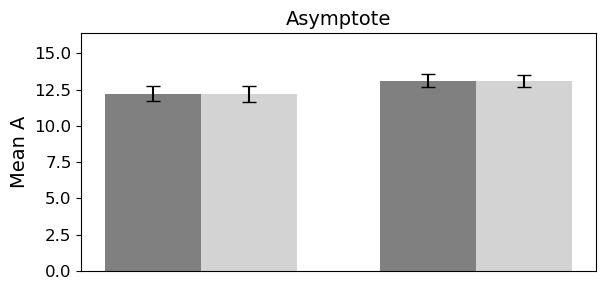

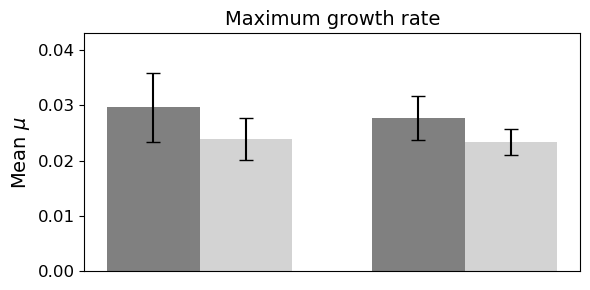

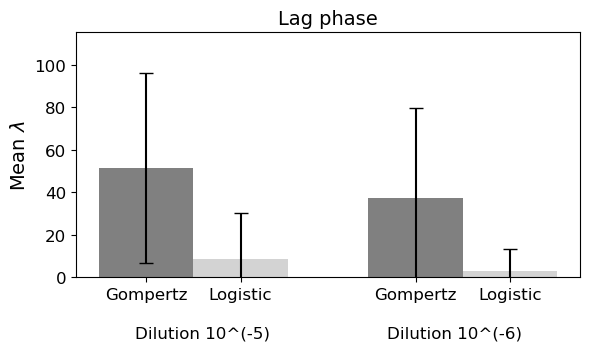

In [15]:
def create_bar_plot(df, parameter1, parameter2, leg1, leg2, title, ylabel, filename, last_plot=False):
    # Adjust figure size - slightly decrease width of the last plot further
    fig_width = 6 if not last_plot else 6  # Reduce width for the last plot slightly
    fig_height = 3 if not last_plot else 3.7
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))

    # Use gray colors
    colors = ['gray', 'lightgray']

    # Get dilutions from the DataFrame index
    dilutions = df.index

    # Plot the data
    bar_width = 0.35  # width of the bars
    x = np.arange(len(dilutions))  # the label locations

    # Plot parameter1 means with error bars
    ax.bar(x - bar_width / 2, df[(parameter1[0], 'mean')], yerr=df[(parameter1[0], 'std')],
           capsize=5, color=colors[0], width=bar_width)

    # Plot parameter2 means with error bars
    ax.bar(x + bar_width / 2, df[(parameter2[0], 'mean')], yerr=df[(parameter2[0], 'std')],
           capsize=5, color=colors[1], width=bar_width)

    # Set the labels
    ax.set_ylabel(ylabel, fontsize=14)

    # Remove x-axis labels for all but the last plot
    if last_plot:
        # Set custom x-ticks with 'Gompertz' and 'Logistic' below each bar
        xtick_labels = ['Gompertz', 'Logistic', 'Gompertz', 'Logistic']
        ax.set_xticks([0 - bar_width / 2, 0 + bar_width / 2, 1 - bar_width / 2, 1 + bar_width / 2])
        ax.set_xticklabels(xtick_labels, rotation=0, ha="center", fontsize=12)
        
        # Add Dilution labels centered below each pair of bars
        dilution_labels = ['10^(-5)', '10^(-6)']
        ax.text(0.25, -0.2, f'Dilution {dilution_labels[0]}', ha='center', va='top', fontsize=12, transform=ax.transAxes)
        ax.text(0.75, -0.2, f'Dilution {dilution_labels[1]}', ha='center', va='top', fontsize=12, transform=ax.transAxes)
    else:
        # Remove x-axis ticks and labels
        ax.set_xticks([])
        ax.set_xlabel('')

    # Adjust y-axis tick label size
    ax.tick_params(axis='y', labelsize=12)

    # Adjust y-axis limits individually based on data in each plot
    max_value = max(
        df[(parameter1[0], 'mean')].max() + df[(parameter1[0], 'std')].max(),
        df[(parameter2[0], 'mean')].max() + df[(parameter2[0], 'std')].max()
    )
    ax.set_ylim(0, max_value * 1.2)  # Add a 20% margin
    ax.set_title(title, fontsize=14)

    # Ensure consistent figure size and layout
    plt.tight_layout()

    # Save the plot
    plt.savefig(filename, dpi=300)

    # Show the plot
    plt.show()

# Create the three plots, set last_plot=True for the last one
create_bar_plot(grouped_df, ('A_gomp', 'mean'), ('A_log', 'mean'),
                'A Gompertz', 'A Logistic', 'Asymptote',
                'Mean A', 'A_gomp_A_log_comparison.png')

create_bar_plot(grouped_df, ('mu_gomp', 'mean'), ('mu_log', 'mean'),
                '$\mu$ Gompertz', '$\mu$ Logistic', 'Maximum growth rate',
                'Mean $\mu$', 'mu_gomp_mu_log_comparison.png')

create_bar_plot(grouped_df, ('l_gomp', 'mean'), ('l_log', 'mean'),
                '$\lambda$ Gompertz', '$\lambda$ Logistic', 'Lag phase',
                'Mean $\lambda$', 'l_gomp_l_log_comparison.png', last_plot=True)


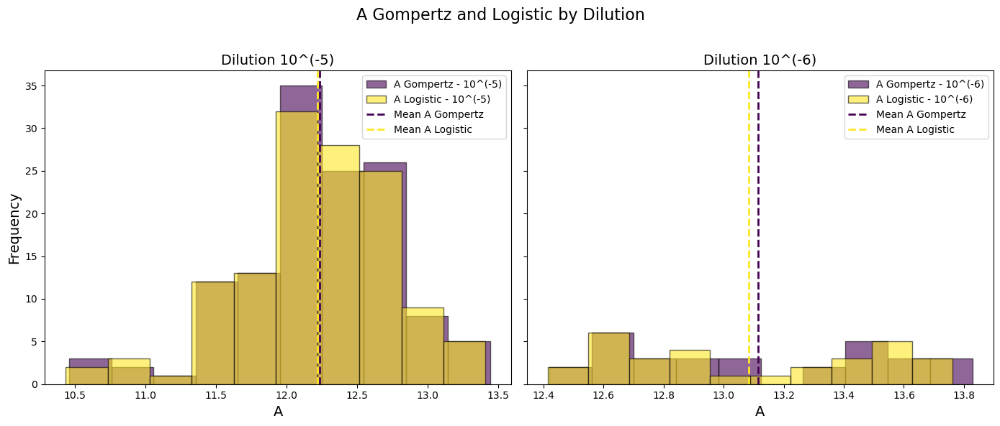

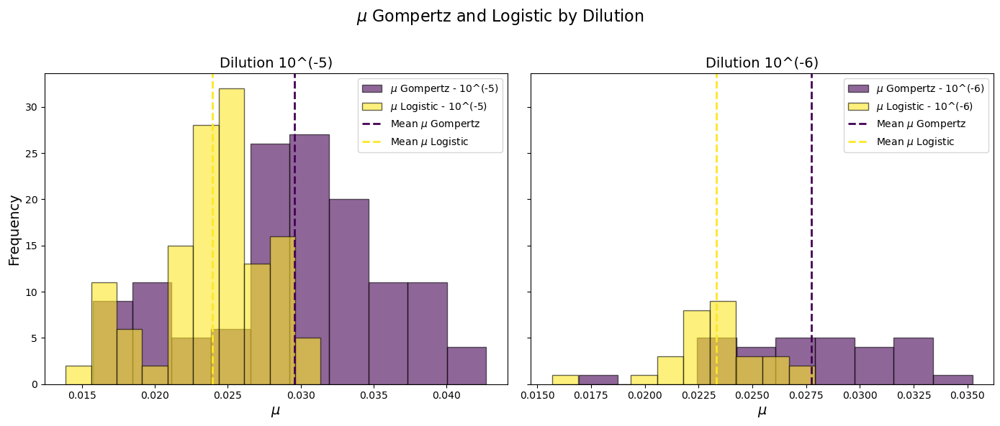

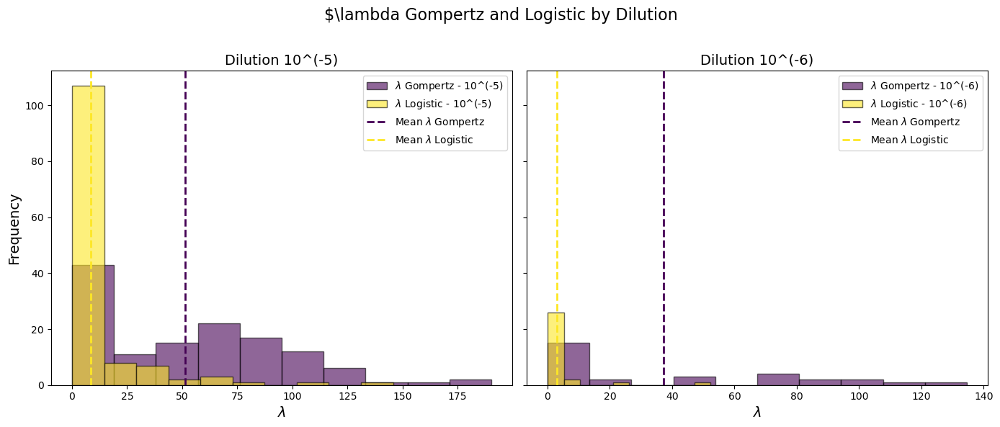

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Function to plot overlaid histograms for each parameter and dilution
def create_param_histogram(df, parameter_gomp, parameter_log, leg_gomp, leg_log, title, xlabel, filename):
    # Filter data by dilution
    dilution_5 = df[df['Dilution'] == '10^(-5)']
    dilution_6 = df[df['Dilution'] == '10^(-6)']

    # Create a colormap
    colors = plt.cm.viridis(np.linspace(0, 1, 2))  # Using only 2 colors for the two parameters

    # Create a figure with two subplots, one for each dilution
    fig, ax = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    # Plot histograms for dilution 10^(-5)
    ax[0].hist(dilution_5[parameter_gomp], bins=10, alpha=0.6, color=colors[0], edgecolor='black', label=f'{leg_gomp} - 10^(-5)')
    ax[0].hist(dilution_5[parameter_log], bins=10, alpha=0.6, color=colors[1], edgecolor='black', label=f'{leg_log} - 10^(-5)')
    ax[0].set_title(f'Dilution 10^(-5)', fontsize=14)
    ax[0].set_xlabel(xlabel, fontsize=14)
    ax[0].set_ylabel('Frequency', fontsize=14)

    # Add mean lines for dilution 10^(-5)
    ax[0].axvline(dilution_5[parameter_gomp].mean(), color=colors[0], linestyle='dashed', linewidth=2, label=f'Mean {leg_gomp}')
    ax[0].axvline(dilution_5[parameter_log].mean(), color=colors[1], linestyle='dashed', linewidth=2, label=f'Mean {leg_log}')
    ax[0].legend(fontsize=10)

    # Plot histograms for dilution 10^(-6)
    ax[1].hist(dilution_6[parameter_gomp], bins=10, alpha=0.6, color=colors[0], edgecolor='black', label=f'{leg_gomp} - 10^(-6)')
    ax[1].hist(dilution_6[parameter_log], bins=10, alpha=0.6, color=colors[1], edgecolor='black', label=f'{leg_log} - 10^(-6)')
    ax[1].set_title(f'Dilution 10^(-6)', fontsize=14)
    ax[1].set_xlabel(xlabel, fontsize=14)

    # Add mean lines for dilution 10^(-6)
    ax[1].axvline(dilution_6[parameter_gomp].mean(), color=colors[0], linestyle='dashed', linewidth=2, label=f'Mean {leg_gomp}')
    ax[1].axvline(dilution_6[parameter_log].mean(), color=colors[1], linestyle='dashed', linewidth=2, label=f'Mean {leg_log}')
    ax[1].legend(fontsize=10)

    # Set the main title for the figure
    fig.suptitle(title, fontsize=16)

    # Adjust layout for better fit
    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Save the plot
    plt.savefig(filename, dpi=300)

    # Show the plot
    plt.show()

# Create the histogram plots for A, mu, and lambda
create_param_histogram(df_joined, 'A_gomp', 'A_log', 'A Gompertz', 'A Logistic', 'A Gompertz and Logistic by Dilution', 'A', 'hist_A_gomp_A_log.png')
create_param_histogram(df_joined, 'mu_gomp', 'mu_log', '$\mu$ Gompertz', '$\mu$ Logistic', '$\mu$ Gompertz and Logistic by Dilution', '$\mu$', 'hist_mu_gomp_mu_log.png')
create_param_histogram(df_joined, 'l_gomp', 'l_log', '$\lambda$ Gompertz', '$\lambda$ Logistic', '$\lambda Gompertz and Logistic by Dilution', '$\lambda$', 'hist_l_gomp_l_log.png')

In [152]:
grouped_df

A_gomp             mu_gomp               l_gomp            \
               mean       std      mean       std       mean       std   
Dilution                                                                 
10^(-5)   12.234114  0.543963  0.029596  0.006252  51.443247  44.69781   
10^(-6)   13.113745  0.442856  0.027737  0.003943  37.293515  42.49082   

              A_log              mu_log              l_log             
               mean       std      mean       std     mean        std  
Dilution                                                               
10^(-5)   12.217536  0.539285  0.023952  0.003818  8.60324  21.594717  
10^(-6)   13.083715  0.429310  0.023330  0.002368  3.08958  10.352982

#### Pixels

In [69]:
df = pd.read_excel('../data_processed.xlsx')

0
Gompertz Model:
  SSR: 0.4405
  R²: 0.9945
  AIC: -1332.1265
  BIC: -1322.0007

Logistic Model:
  SSR: 0.3137
  R²: 0.9961
  AIC: -1405.4876
  BIC: -1395.3617

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.12946715e+01 3.42966594e-02 7.50828185e+01]
Logistic params are: [11.29185479  0.02538485  2.80632795]


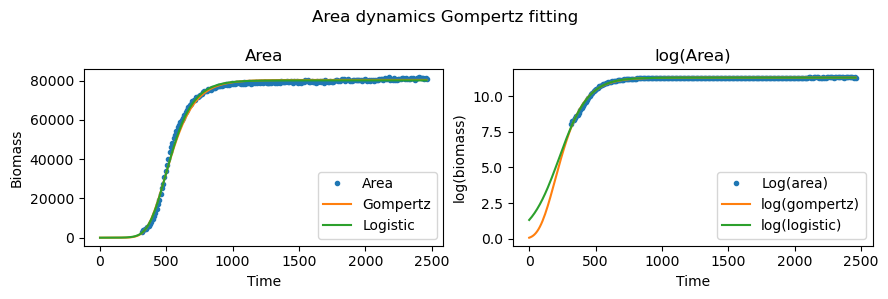

1
Gompertz Model:
  SSR: 0.2839
  R²: 0.9960
  AIC: -1427.0574
  BIC: -1416.9316

Logistic Model:
  SSR: 0.2043
  R²: 0.9971
  AIC: -1498.0545
  BIC: -1487.9287

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16515508e+01 3.65208066e-02 7.17035742e+01]
Logistic params are: [1.16488361e+01 2.69331363e-02 2.01020365e-11]


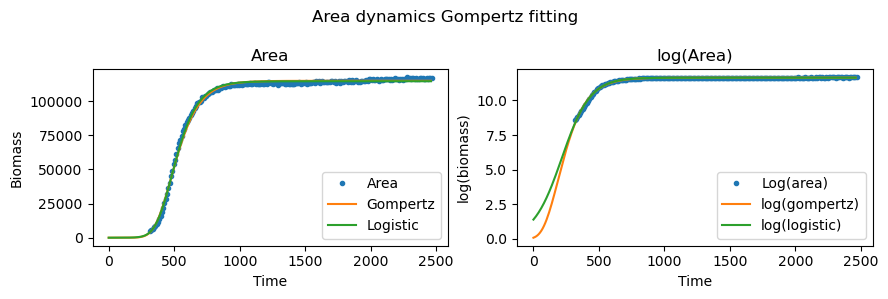

2
Gompertz Model:
  SSR: 0.2726
  R²: 0.9953
  AIC: -1435.7892
  BIC: -1425.6633

Logistic Model:
  SSR: 0.2144
  R²: 0.9963
  AIC: -1487.6376
  BIC: -1477.5118

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15803773e+01 3.69917672e-02 6.54432688e+01]
Logistic params are: [1.15766337e+01 2.76386440e-02 1.24001281e-15]


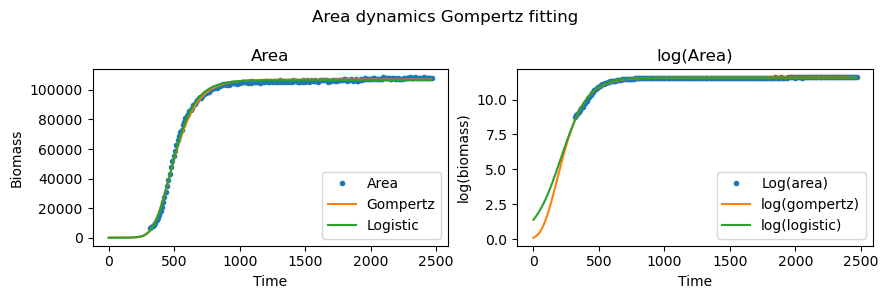

3
Gompertz Model:
  SSR: 0.1950
  R²: 0.9952
  AIC: -1508.1143
  BIC: -1497.9884

Logistic Model:
  SSR: 0.3372
  R²: 0.9918
  AIC: -1389.8725
  BIC: -1379.7466

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.26317914  0.03423451 30.40648262]
Logistic params are: [1.12528244e+01 2.81455114e-02 1.01468261e-18]


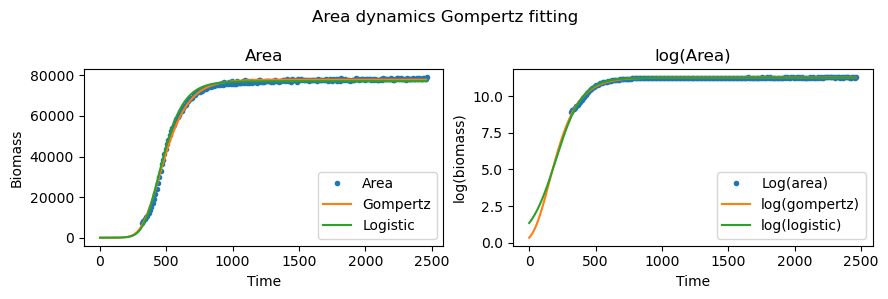

4
Gompertz Model:
  SSR: 0.3211
  R²: 0.9946
  AIC: -1400.4305
  BIC: -1390.3047

Logistic Model:
  SSR: 0.2483
  R²: 0.9958
  AIC: -1455.9555
  BIC: -1445.8296

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15282749e+01 3.76935025e-02 7.44408536e+01]
Logistic params are: [11.52623615  0.02758671  2.66450021]


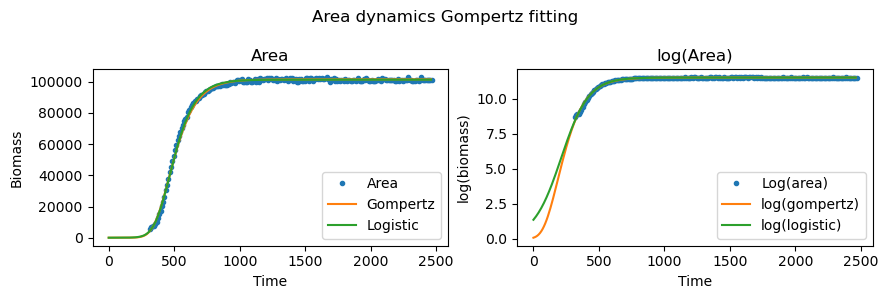

5
Gompertz Model:
  SSR: 0.2232
  R²: 0.9967
  AIC: -1478.9640
  BIC: -1468.8382

Logistic Model:
  SSR: 0.1577
  R²: 0.9977
  AIC: -1553.9609
  BIC: -1543.8351

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.13011062e+01 3.59379971e-02 7.71691916e+01]
Logistic params are: [11.29871967  0.02643601  5.53800146]


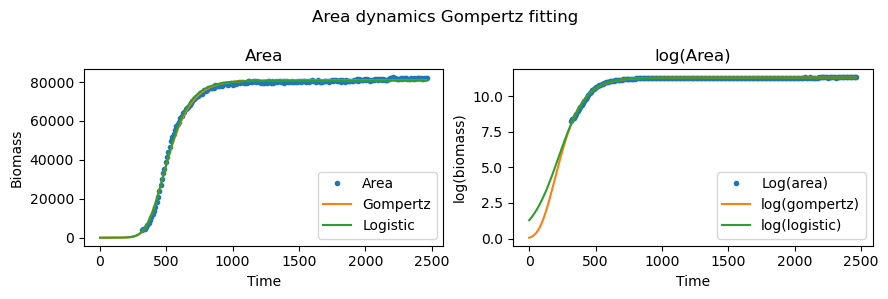

6
Gompertz Model:
  SSR: 0.8088
  R²: 0.9919
  AIC: -1200.8930
  BIC: -1190.7672

Logistic Model:
  SSR: 0.9769
  R²: 0.9902
  AIC: -1160.1001
  BIC: -1149.9743

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.06661699e+01 2.62405127e-02 3.32791281e+01]
Logistic params are: [1.06486262e+01 2.20280959e-02 1.23086543e-19]


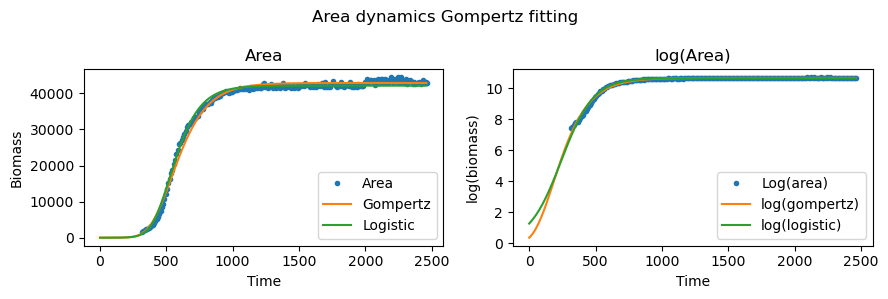

7
Gompertz Model:
  SSR: 0.3549
  R²: 0.9971
  AIC: -1378.8071
  BIC: -1368.6812

Logistic Model:
  SSR: 0.7759
  R²: 0.9936
  AIC: -1209.8531
  BIC: -1199.7272

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.02008212e+01 2.29323066e-02 2.71679608e+01]
Logistic params are: [1.01776184e+01 1.97342775e-02 2.83198765e-20]


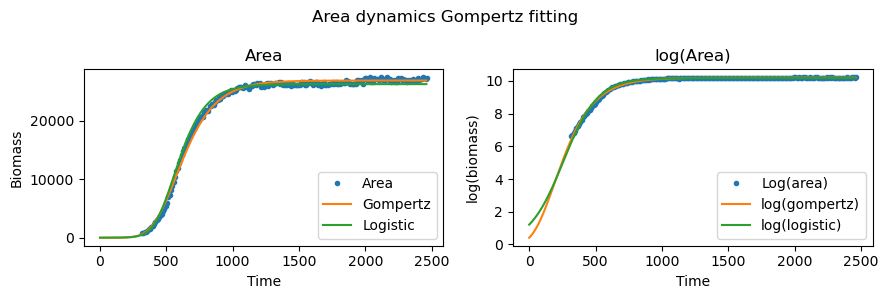

8
Gompertz Model:
  SSR: 0.2758
  R²: 0.9960
  AIC: -1433.2694
  BIC: -1423.1436

Logistic Model:
  SSR: 0.1941
  R²: 0.9972
  AIC: -1509.1877
  BIC: -1499.0618

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16329090e+01 3.71807721e-02 7.58348216e+01]
Logistic params are: [11.63060682  0.02730825  3.94648256]


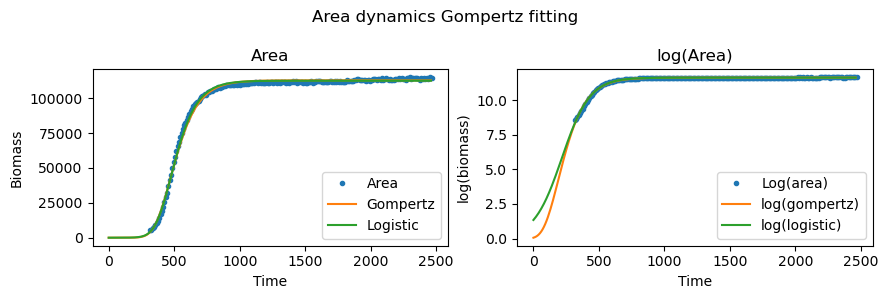

9
Gompertz Model:
  SSR: 0.1863
  R²: 0.9993
  AIC: -1518.0615
  BIC: -1507.9357

Logistic Model:
  SSR: 2.2311
  R²: 0.9916
  AIC: -981.7194
  BIC: -971.5935

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.02487156  0.02863516  7.48775434]
Logistic params are: [1.29803605e+01 2.60679491e-02 1.63680103e-15]


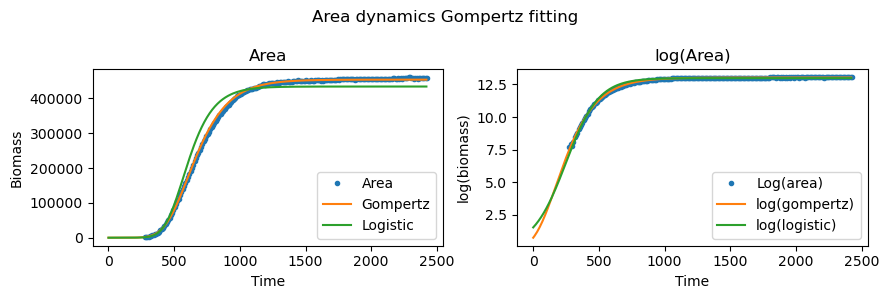

10
Gompertz Model:
  SSR: 0.8056
  R²: 0.9979
  AIC: -1201.7601
  BIC: -1191.6342

Logistic Model:
  SSR: 0.8978
  R²: 0.9976
  AIC: -1178.3523
  BIC: -1168.2264

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.28562285e+01 2.89969457e-02 5.45275941e+01]
Logistic params are: [1.28365171e+01 2.34360906e-02 1.70967893e-22]


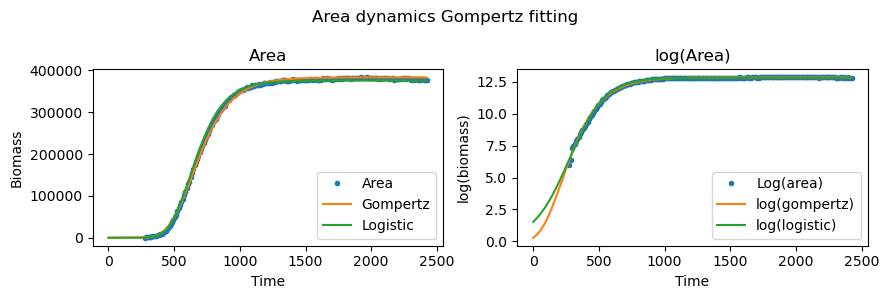

11
Gompertz Model:
  SSR: 0.6309
  R²: 0.9977
  AIC: -1254.5637
  BIC: -1244.4379

Logistic Model:
  SSR: 1.4191
  R²: 0.9949
  AIC: -1079.4578
  BIC: -1069.3319

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.46909191  0.02753392 22.29092118]
Logistic params are: [1.24342316e+01 2.41345245e-02 4.44524969e-16]


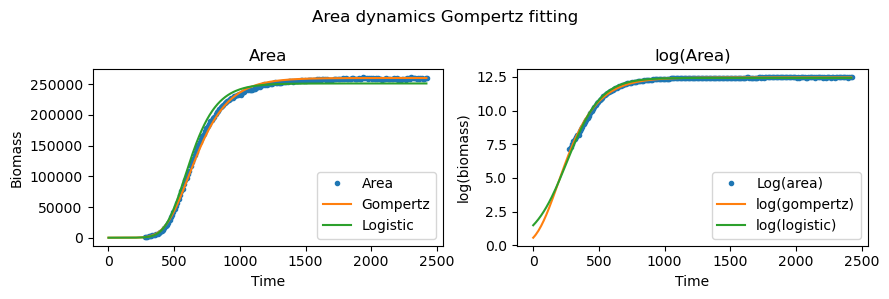

12
Gompertz Model:
  SSR: 0.2273
  R²: 0.9976
  AIC: -1475.0498
  BIC: -1464.9240

Logistic Model:
  SSR: 1.9002
  R²: 0.9800
  AIC: -1016.3982
  BIC: -1006.2724

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.22948330e+01 2.82133284e-02 1.35374311e-20]
Logistic params are: [1.22636016e+01 2.56170285e-02 1.37716349e-14]


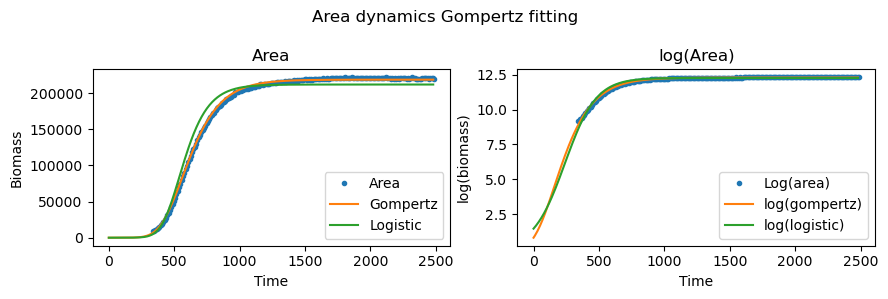

13
Gompertz Model:
  SSR: 0.1436
  R²: 0.9982
  AIC: -1574.2001
  BIC: -1564.0743

Logistic Model:
  SSR: 1.1774
  R²: 0.9856
  AIC: -1119.7795
  BIC: -1109.6537

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.25715387e+01 3.01451615e-02 2.03446073e-12]
Logistic params are: [1.25439613e+01 2.72231637e-02 2.38588098e-17]


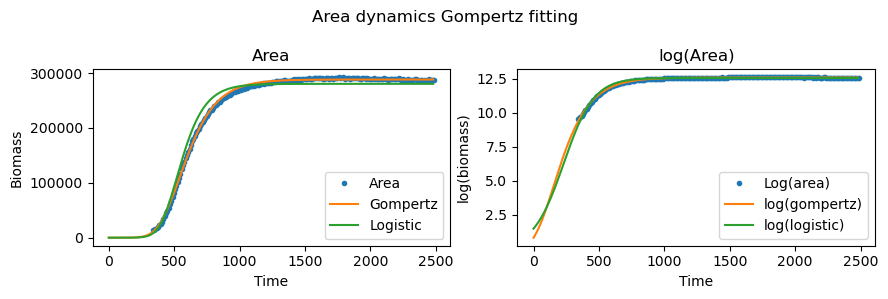

14
Gompertz Model:
  SSR: 0.1512
  R²: 0.9981
  AIC: -1563.1077
  BIC: -1552.9818

Logistic Model:
  SSR: 1.2951
  R²: 0.9840
  AIC: -1099.2063
  BIC: -1089.0804

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27007938e+01 3.06556815e-02 3.78653235e-29]
Logistic params are: [1.26732784e+01 2.76698247e-02 1.04562586e-17]


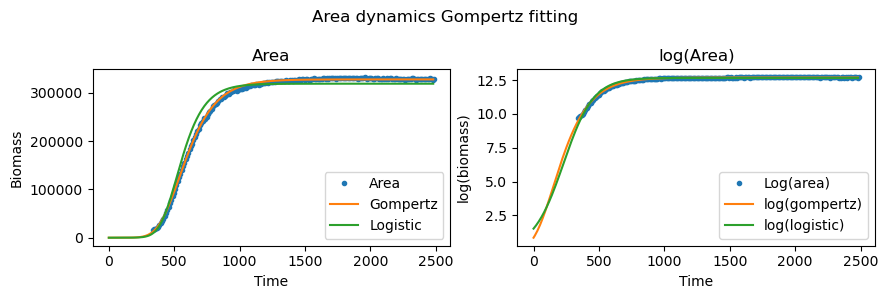

15
Gompertz Model:
  SSR: 0.1810
  R²: 0.9983
  AIC: -1524.2865
  BIC: -1514.1607

Logistic Model:
  SSR: 1.8846
  R²: 0.9823
  AIC: -1018.1798
  BIC: -1008.0539

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24897139e+01 2.81605485e-02 3.53818235e-18]
Logistic params are: [1.24564984e+01 2.56139785e-02 1.43014286e-14]


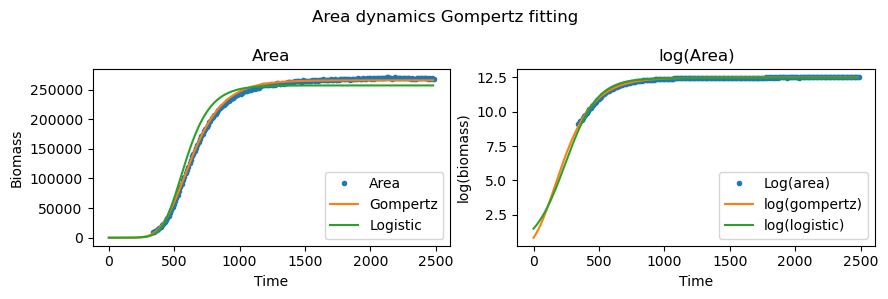

16
Gompertz Model:
  SSR: 0.2186
  R²: 0.9971
  AIC: -1483.5316
  BIC: -1473.4058

Logistic Model:
  SSR: 1.2290
  R²: 0.9838
  AIC: -1110.5247
  BIC: -1100.3989

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.25192052e+01 3.04646874e-02 3.89356499e-25]
Logistic params are: [1.24928713e+01 2.74673426e-02 4.12085285e-17]


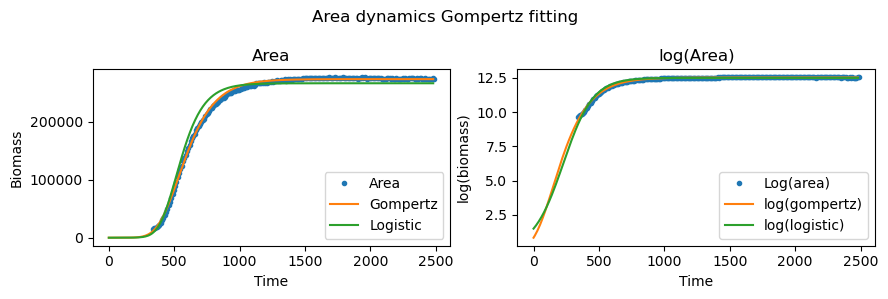

17
Gompertz Model:
  SSR: 0.2110
  R²: 0.9972
  AIC: -1491.1064
  BIC: -1480.9805

Logistic Model:
  SSR: 1.4425
  R²: 0.9810
  AIC: -1075.9151
  BIC: -1065.7892

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.25934742e+01 3.06579915e-02 1.17614743e-24]
Logistic params are: [1.25665883e+01 2.76547433e-02 2.83372047e-18]


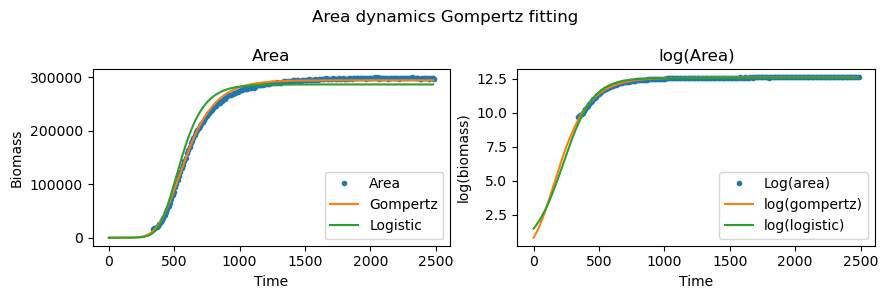

18
Gompertz Model:
  SSR: 8.7131
  R²: 0.9405
  AIC: -687.4585
  BIC: -677.3326

Logistic Model:
  SSR: 17.3876
  R²: 0.8812
  AIC: -538.2164
  BIC: -528.0906

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.29900498e+01 2.59388314e-02 3.46779494e-13]
Logistic params are: [1.29340008e+01 2.39822974e-02 2.61853632e-12]


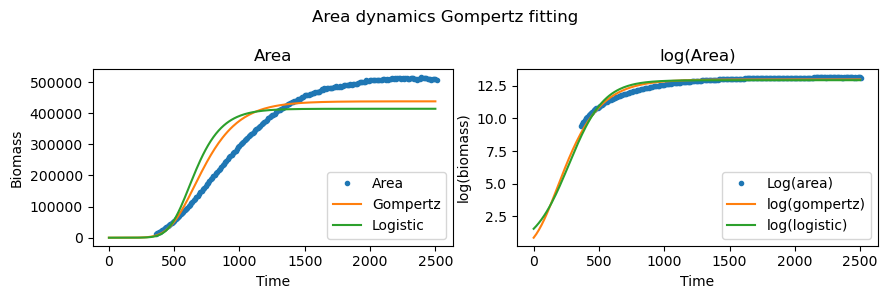

19
Gompertz Model:
  SSR: 0.0619
  R²: 0.9993
  AIC: -1755.8741
  BIC: -1745.7483

Logistic Model:
  SSR: 1.1189
  R²: 0.9869
  AIC: -1130.7998
  BIC: -1120.6740

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.28290454e+01 2.90937909e-02 1.68219537e-13]
Logistic params are: [1.27995581e+01 2.62466542e-02 7.42560289e-18]


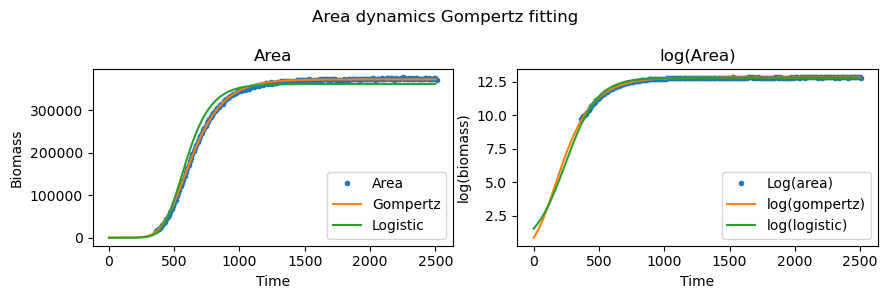

20
Gompertz Model:
  SSR: 0.2674
  R²: 0.9985
  AIC: -1439.9283
  BIC: -1429.8025

Logistic Model:
  SSR: 3.5349
  R²: 0.9807
  AIC: -882.3213
  BIC: -872.1954

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.32850052e+01 2.48483782e-02 4.38247435e-17]
Logistic params are: [1.32334920e+01 2.28174739e-02 1.69127130e-15]


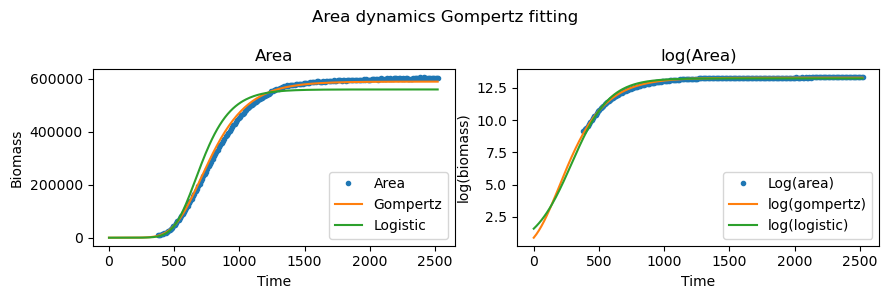

21
Gompertz Model:
  SSR: 1.9104
  R²: 0.9921
  AIC: -1015.2415
  BIC: -1005.1157

Logistic Model:
  SSR: 8.3563
  R²: 0.9653
  AIC: -696.4886
  BIC: -686.3628

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.35690233e+01 2.37722214e-02 1.37503250e-17]
Logistic params are: [1.35033638e+01 2.20045503e-02 1.06446412e-12]


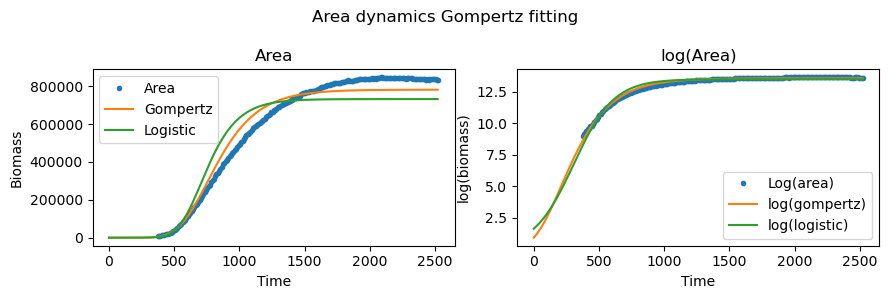

22
Gompertz Model:
  SSR: 1.3505
  R²: 0.9949
  AIC: -1090.1507
  BIC: -1080.0248

Logistic Model:
  SSR: 7.2454
  R²: 0.9728
  AIC: -727.3014
  BIC: -717.1756

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.34941262e+01 2.29653724e-02 5.17995303e-16]
Logistic params are: [1.34255936e+01 2.12888946e-02 7.69789486e-13]


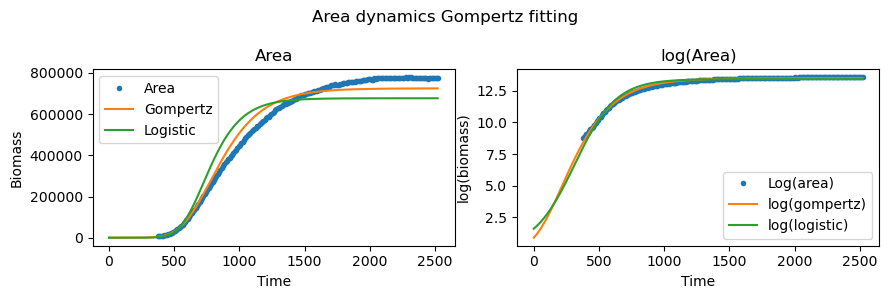

23
Gompertz Model:
  SSR: 0.3434
  R²: 0.9984
  AIC: -1385.9636
  BIC: -1375.8378

Logistic Model:
  SSR: 0.1470
  R²: 0.9993
  AIC: -1569.1530
  BIC: -1559.0271

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19788975e+01 2.93284501e-02 1.12902975e+02]
Logistic params are: [1.19713467e+01 2.24634230e-02 4.05304187e+01]


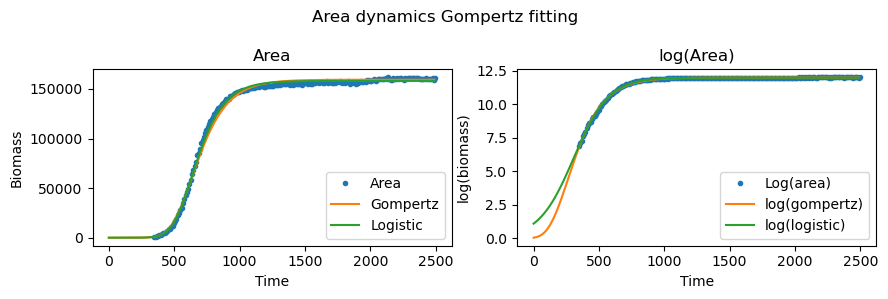

24
Gompertz Model:
  SSR: 0.7110
  R²: 0.9969
  AIC: -1228.7335
  BIC: -1218.6076

Logistic Model:
  SSR: 0.4230
  R²: 0.9981
  AIC: -1340.8922
  BIC: -1330.7664

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19899099e+01 2.96429774e-02 1.18683328e+02]
Logistic params are: [1.19821223e+01 2.27798588e-02 4.85666694e+01]


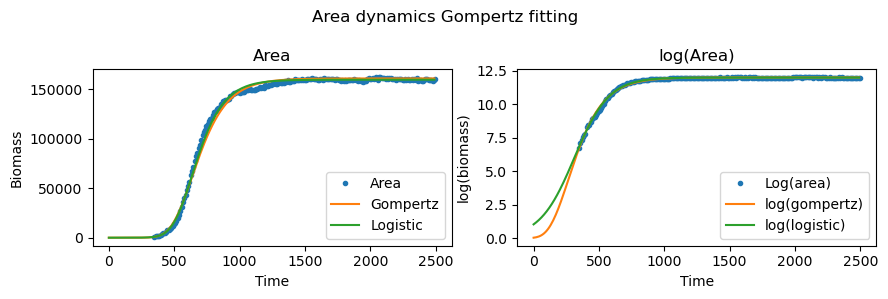

25
Gompertz Model:
  SSR: 0.1151
  R²: 0.9994
  AIC: -1622.0595
  BIC: -1611.9337

Logistic Model:
  SSR: 0.7558
  R²: 0.9962
  AIC: -1215.5267
  BIC: -1205.4009

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20284973e+01 2.46074008e-02 3.99305524e+01]
Logistic params are: [1.19994301e+01 2.07708226e-02 4.11389159e-19]


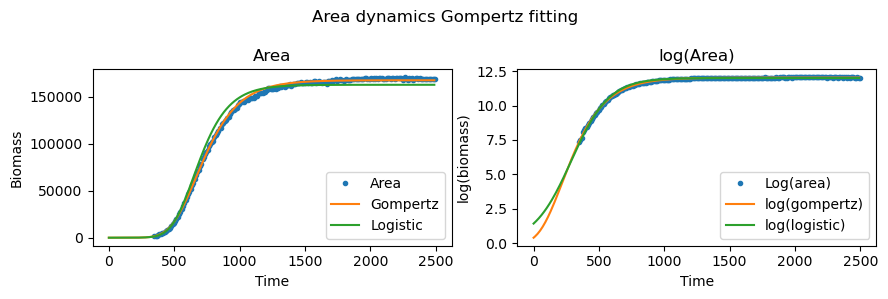

26
Gompertz Model:
  SSR: 0.2191
  R²: 0.9989
  AIC: -1482.9697
  BIC: -1472.8439

Logistic Model:
  SSR: 1.1682
  R²: 0.9940
  AIC: -1121.4770
  BIC: -1111.3511

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.20307572e+01 2.39244186e-02 2.67042645e+01]
Logistic params are: [1.19956411e+01 2.08065186e-02 6.45396471e-14]


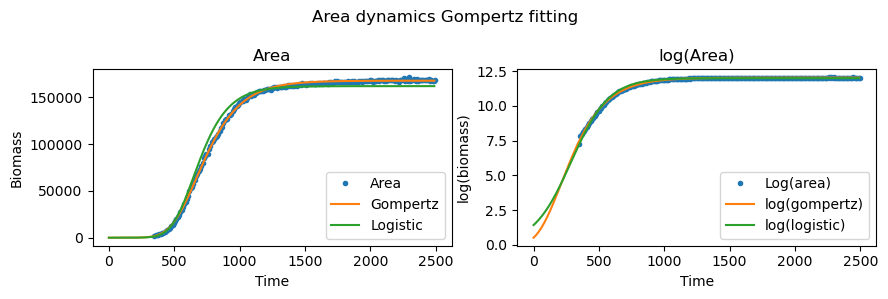

27
Gompertz Model:
  SSR: 0.1303
  R²: 0.9994
  AIC: -1595.2146
  BIC: -1585.0887

Logistic Model:
  SSR: 1.5751
  R²: 0.9930
  AIC: -1056.9213
  BIC: -1046.7955

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.10685514  0.02275994 18.66162961]
Logistic params are: [1.20634038e+01 2.02303782e-02 1.32827510e-16]


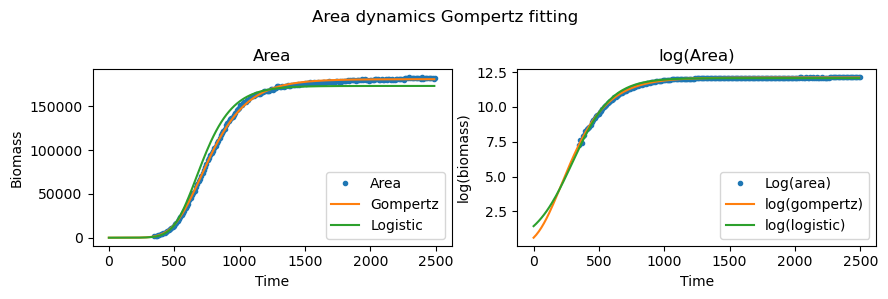

28
Gompertz Model:
  SSR: 0.0982
  R²: 0.9994
  AIC: -1656.3714
  BIC: -1646.2456

Logistic Model:
  SSR: 0.2935
  R²: 0.9983
  AIC: -1419.8510
  BIC: -1409.7252

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24662021e+01 2.83662838e-02 5.81634375e+01]
Logistic params are: [1.24490562e+01 2.27216197e-02 5.01358637e-19]


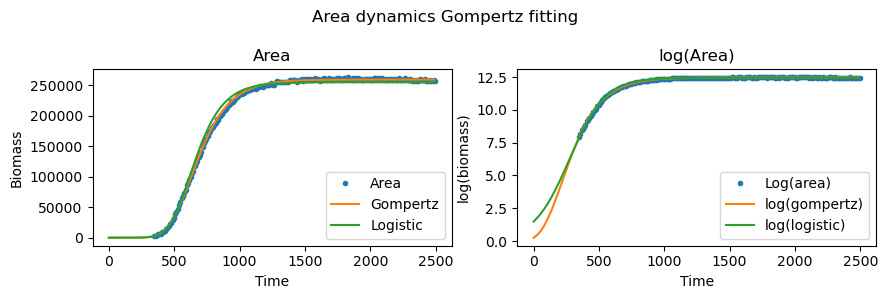

29
Gompertz Model:
  SSR: 0.2278
  R²: 0.9988
  AIC: -1474.6261
  BIC: -1464.5002

Logistic Model:
  SSR: 0.7976
  R²: 0.9958
  AIC: -1203.9081
  BIC: -1193.7823

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.28410441e+01 2.73487279e-02 3.66250191e+01]
Logistic params are: [1.28128211e+01 2.31196866e-02 2.49034446e-18]


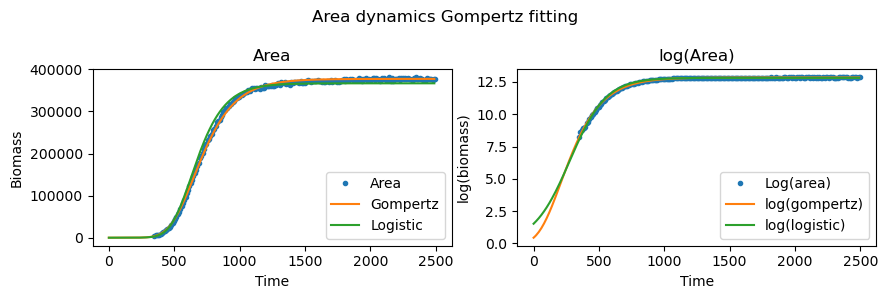

30
Gompertz Model:
  SSR: 0.1044
  R²: 0.9994
  AIC: -1643.1424
  BIC: -1633.0166

Logistic Model:
  SSR: 0.5024
  R²: 0.9973
  AIC: -1303.7431
  BIC: -1293.6172

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19946318e+01 2.52726434e-02 4.63212419e+01]
Logistic params are: [1.19703213e+01 2.09665592e-02 8.81142483e-18]


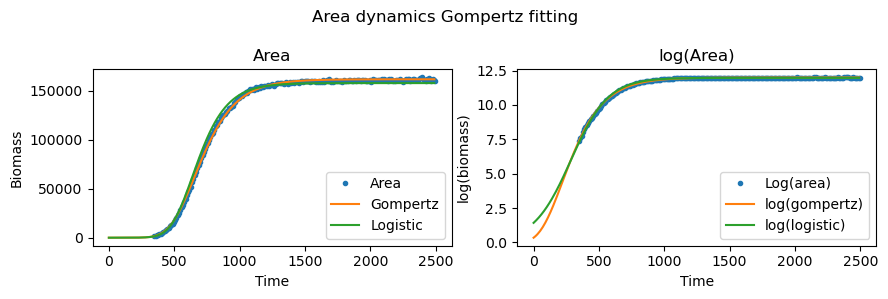

31
Gompertz Model:
  SSR: 0.1758
  R²: 0.9991
  AIC: -1530.5946
  BIC: -1520.4688

Logistic Model:
  SSR: 1.6739
  R²: 0.9912
  AIC: -1043.7915
  BIC: -1033.6657

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.0381379   0.02313197  9.4207409 ]
Logistic params are: [1.19947183e+01 2.08966899e-02 2.68705316e-16]


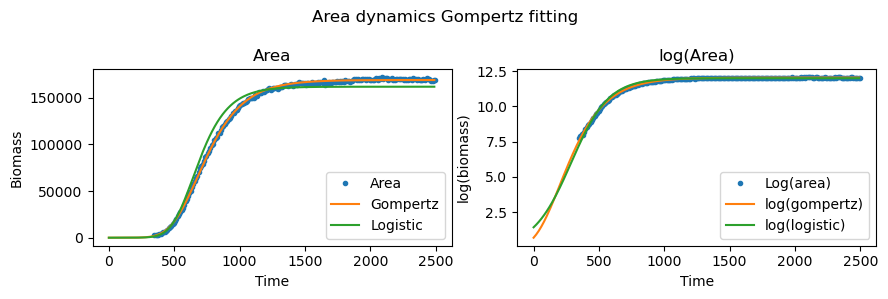

32
Gompertz Model:
  SSR: 0.3330
  R²: 0.9983
  AIC: -1392.5836
  BIC: -1382.4577

Logistic Model:
  SSR: 0.3056
  R²: 0.9984
  AIC: -1411.0956
  BIC: -1400.9698

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26450251e+01 2.87108121e-02 6.52140034e+01]
Logistic params are: [1.26303517e+01 2.26476490e-02 4.31794070e-19]


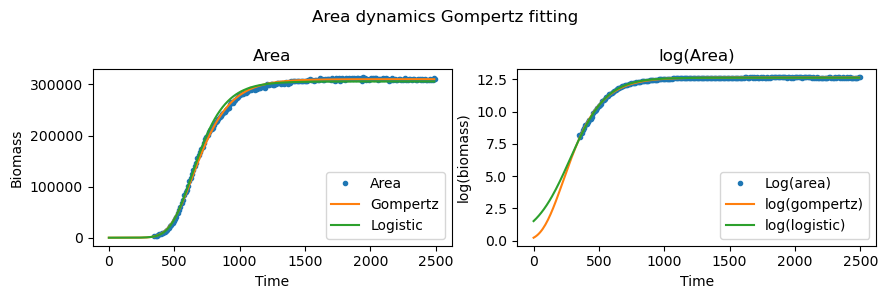

33
Gompertz Model:
  SSR: 0.2710
  R²: 0.9987
  AIC: -1437.0405
  BIC: -1426.9146

Logistic Model:
  SSR: 1.3441
  R²: 0.9935
  AIC: -1091.1901
  BIC: -1081.0642

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.91586804  0.02283315 21.09939664]
Logistic params are: [1.18764785e+01 2.01496346e-02 7.56276274e-16]


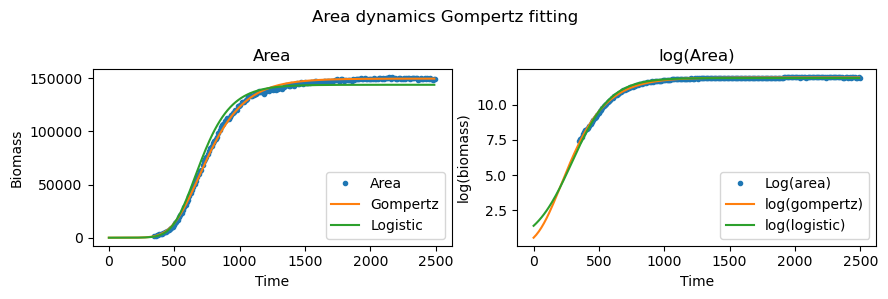

34
Gompertz Model:
  SSR: 0.0665
  R²: 0.9996
  AIC: -2405.6682
  BIC: -2394.6794

Logistic Model:
  SSR: 1.6530
  R²: 0.9903
  AIC: -1480.1862
  BIC: -1469.1973

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.45711054  0.02677444  8.202256  ]
Logistic params are: [1.34283445e+01 2.40076260e-02 8.26527871e-15]


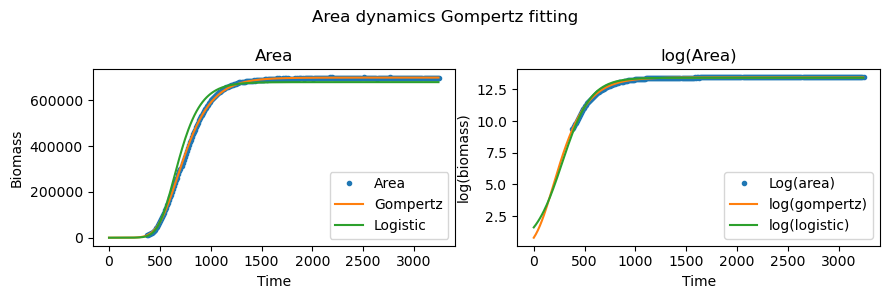

35
Gompertz Model:
  SSR: 0.1701
  R²: 0.9990
  AIC: -2135.1217
  BIC: -2124.1328

Logistic Model:
  SSR: 2.8635
  R²: 0.9827
  AIC: -1321.9394
  BIC: -1310.9505

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.31205029e+01 2.54336398e-02 1.42090888e-24]
Logistic params are: [1.30885341e+01 2.32340437e-02 1.03394937e-15]


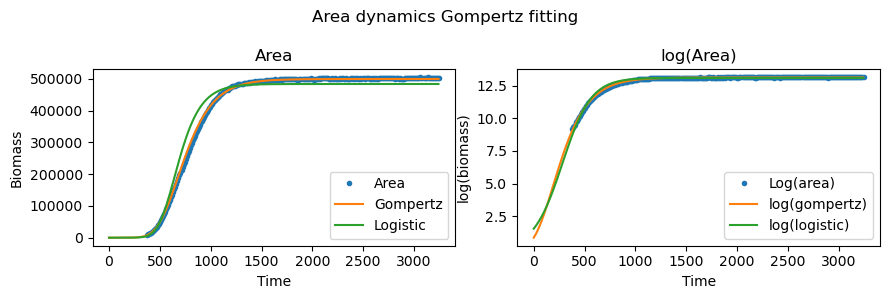

36
Gompertz Model:
  SSR: 0.1972
  R²: 0.9989
  AIC: -2092.4444
  BIC: -2081.4556

Logistic Model:
  SSR: 0.1076
  R²: 0.9994
  AIC: -2267.0019
  BIC: -2256.0130

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.32597023e+01 3.16084057e-02 8.96921621e+01]
Logistic params are: [13.25576284  0.0235969   2.29034372]


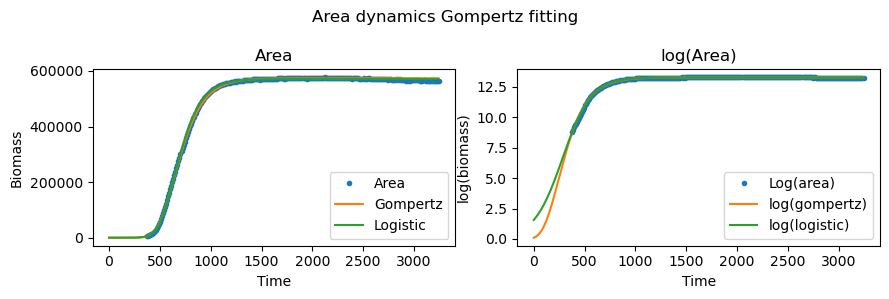

37
Gompertz Model:
  SSR: 0.0712
  R²: 0.9997
  AIC: -2385.7649
  BIC: -2374.7760

Logistic Model:
  SSR: 2.3901
  R²: 0.9890
  AIC: -1373.9863
  BIC: -1362.9975

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.32568797e+01 2.42464560e-02 1.98880433e-15]
Logistic params are: [1.32202340e+01 2.22534515e-02 2.63440372e-17]


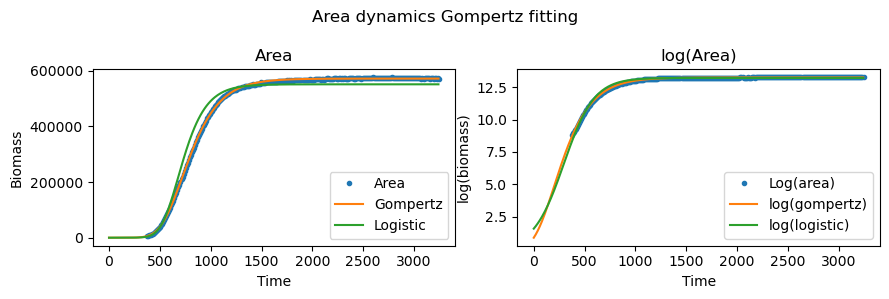

38
Gompertz Model:
  SSR: 0.0921
  R²: 0.9994
  AIC: -2311.6850
  BIC: -2300.6961

Logistic Model:
  SSR: 2.2440
  R²: 0.9855
  AIC: -1392.1506
  BIC: -1381.1617

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26945290e+01 2.46501493e-02 1.00809173e-20]
Logistic params are: [1.26637676e+01 2.25152100e-02 1.58405282e-16]


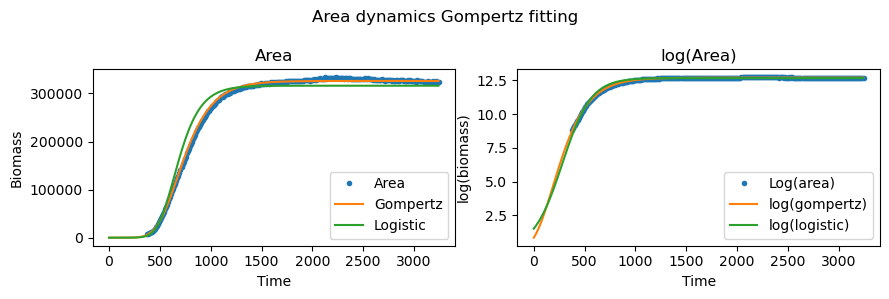

39
Gompertz Model:
  SSR: 0.1045
  R²: 0.9993
  AIC: -2275.4148
  BIC: -2264.4259

Logistic Model:
  SSR: 1.4015
  R²: 0.9911
  AIC: -1527.7255
  BIC: -1516.7366

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.11148835  0.02664665 14.79993236]
Logistic params are: [1.30855209e+01 2.35567748e-02 2.78946395e-12]


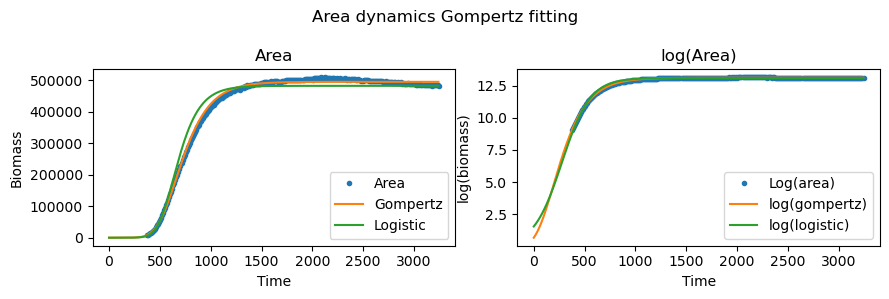

40
Gompertz Model:
  SSR: 4.9293
  R²: 0.9942
  AIC: -1165.5169
  BIC: -1154.5281

Logistic Model:
  SSR: 5.8398
  R²: 0.9931
  AIC: -1116.7005
  BIC: -1105.7116

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [13.41295131  0.01668069 16.57149106]
Logistic params are: [1.33434887e+01 1.52132950e-02 1.01081811e-15]


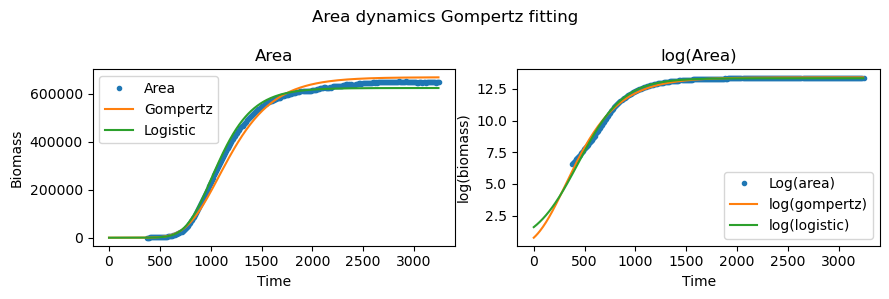

41
Gompertz Model:
  SSR: 0.2322
  R²: 0.9791
  AIC: -1470.4360
  BIC: -1460.3102

Logistic Model:
  SSR: 0.2418
  R²: 0.9782
  AIC: -1461.6728
  BIC: -1451.5469

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.12361345e+01 3.53659614e-02 9.86799126e+01]
Logistic params are: [11.23559777  0.02482528  3.53742593]


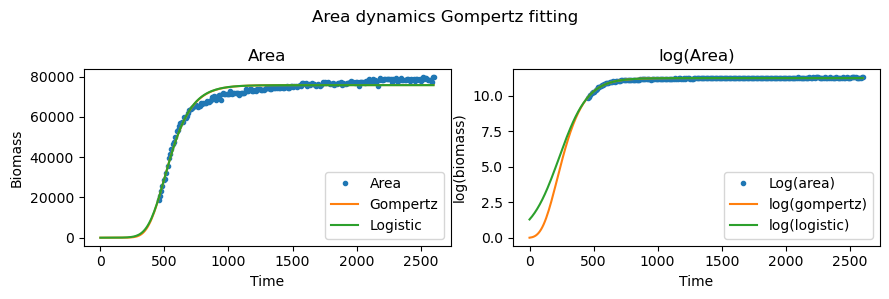

42
Gompertz Model:
  SSR: 0.1459
  R²: 0.9860
  AIC: -1570.7855
  BIC: -1560.6596

Logistic Model:
  SSR: 0.1526
  R²: 0.9854
  AIC: -1561.0769
  BIC: -1550.9510

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.13653822e+01 3.67027288e-02 1.04210267e+02]
Logistic params are: [11.36494908  0.02570915 10.42149277]


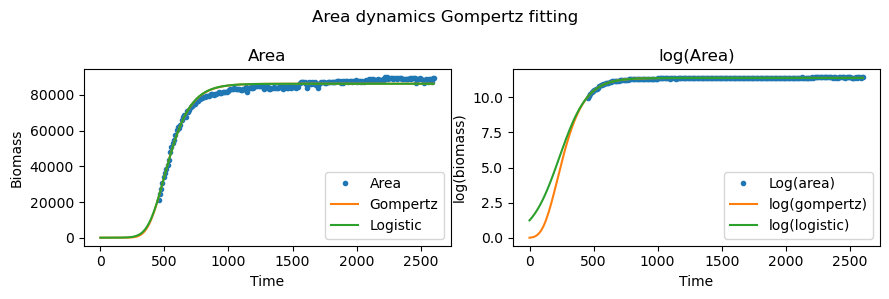

43
Gompertz Model:
  SSR: 0.0573
  R²: 0.9965
  AIC: -1772.8082
  BIC: -1762.6824

Logistic Model:
  SSR: 0.0879
  R²: 0.9947
  AIC: -1680.3532
  BIC: -1670.2273

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.08976628e+01 2.95084095e-02 6.62523628e+01]
Logistic params are: [1.08930658e+01 2.24517372e-02 1.84090987e-19]


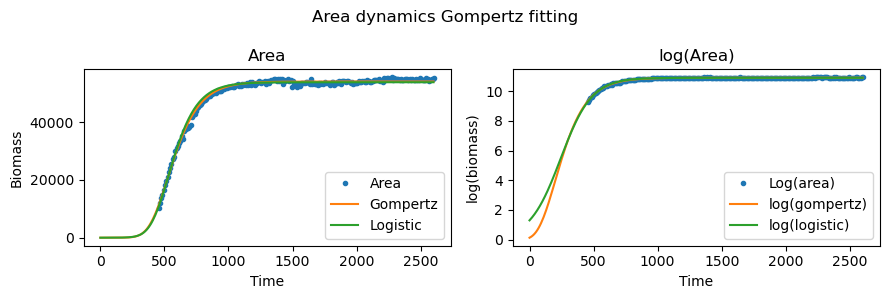

44
Gompertz Model:
  SSR: 0.1185
  R²: 0.9938
  AIC: -1615.7190
  BIC: -1605.5931

Logistic Model:
  SSR: 0.3414
  R²: 0.9823
  AIC: -1387.1694
  BIC: -1377.0435

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.08089459e+01 2.48099256e-02 1.22260056e-15]
Logistic params are: [1.07947135e+01 2.17057063e-02 4.84137975e-17]


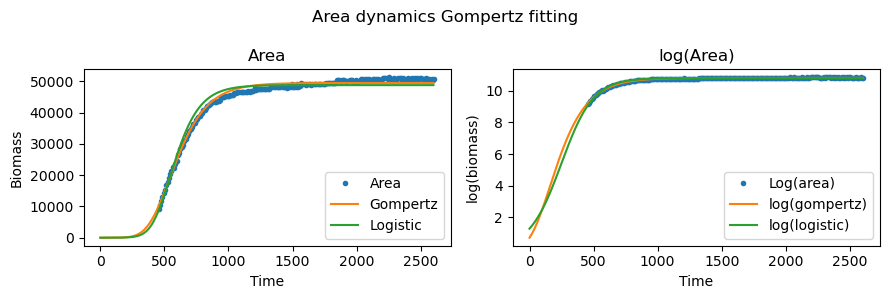

45
Gompertz Model:
  SSR: 0.0920
  R²: 0.9953
  AIC: -1670.3458
  BIC: -1660.2200

Logistic Model:
  SSR: 0.1486
  R²: 0.9924
  AIC: -1566.8122
  BIC: -1556.6864

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.07242946e+01 2.74998396e-02 5.68426196e+01]
Logistic params are: [1.07176669e+01 2.14764605e-02 1.25390282e-14]


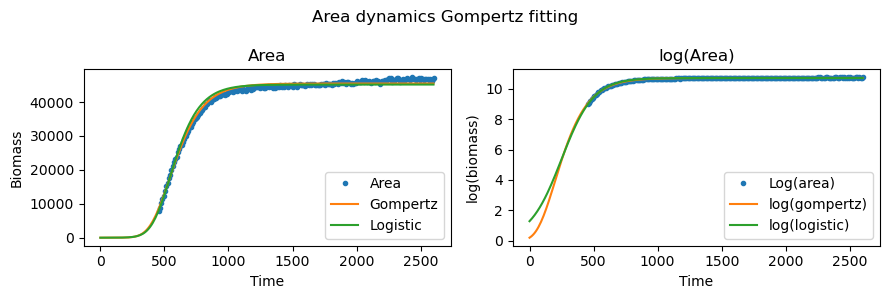

46
Gompertz Model:
  SSR: 0.0878
  R²: 0.9962
  AIC: -1680.6042
  BIC: -1670.4783

Logistic Model:
  SSR: 0.1110
  R²: 0.9952
  AIC: -1629.9235
  BIC: -1619.7976

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.07626794e+01 2.89313272e-02 8.91631546e+01]
Logistic params are: [1.07599627e+01 2.11273120e-02 6.37592253e-19]


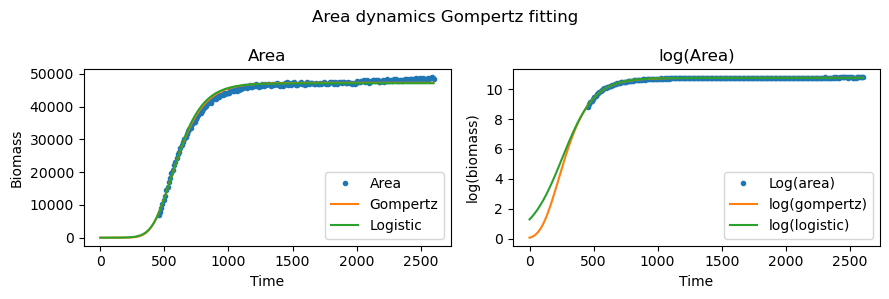

47
Gompertz Model:
  SSR: 0.0530
  R²: 0.9974
  AIC: -1789.3831
  BIC: -1779.2572

Logistic Model:
  SSR: 0.0895
  R²: 0.9956
  AIC: -1676.4262
  BIC: -1666.3004

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.08127041e+01 2.85011920e-02 7.08356171e+01]
Logistic params are: [1.08078426e+01 2.16046227e-02 2.32873380e-19]


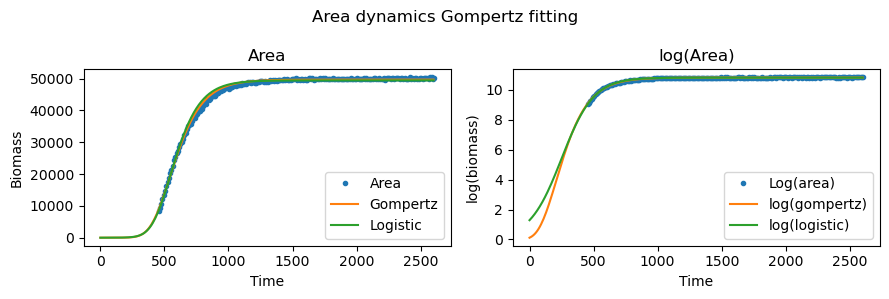

48
Gompertz Model:
  SSR: 0.1855
  R²: 0.9917
  AIC: -1518.9236
  BIC: -1508.7978

Logistic Model:
  SSR: 0.1944
  R²: 0.9913
  AIC: -1508.8769
  BIC: -1498.7511

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.09739160e+01 3.72235905e-02 1.71532893e+02]
Logistic params are: [1.09729644e+01 2.65511499e-02 9.10686092e+01]


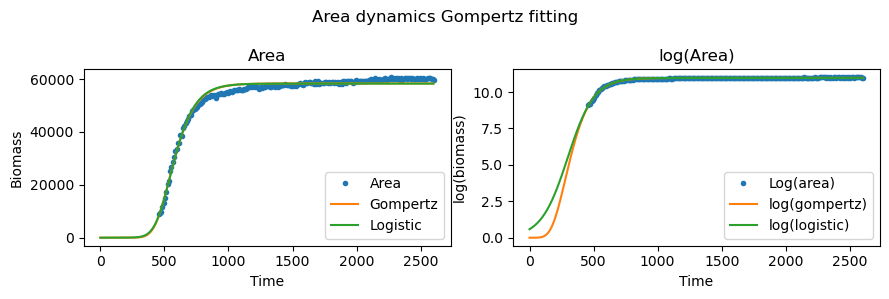

49
Gompertz Model:
  SSR: 0.2812
  R²: 0.9840
  AIC: -1429.1336
  BIC: -1419.0077

Logistic Model:
  SSR: 0.2975
  R²: 0.9831
  AIC: -1416.8988
  BIC: -1406.7729

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.12243102e+01 3.60394159e-02 1.34798471e+02]
Logistic params are: [1.12234934e+01 2.55187030e-02 4.60684753e+01]


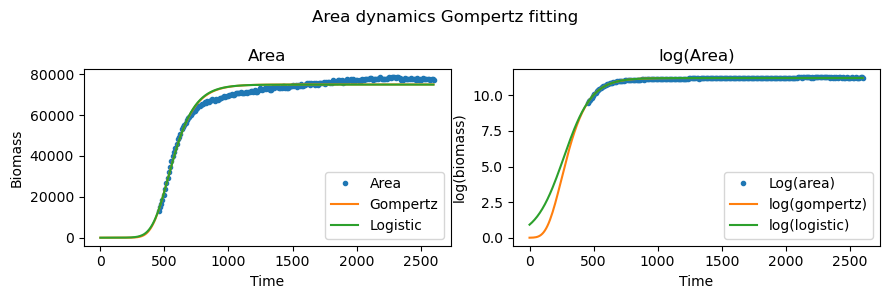

50
Gompertz Model:
  SSR: 0.0282
  R²: 0.9987
  AIC: -1925.4622
  BIC: -1915.3364

Logistic Model:
  SSR: 0.0297
  R²: 0.9986
  AIC: -1914.7446
  BIC: -1904.6188

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.12413921e+01 4.06846022e-02 1.88669730e+02]
Logistic params are: [1.12406870e+01 2.89307271e-02 1.12088722e+02]


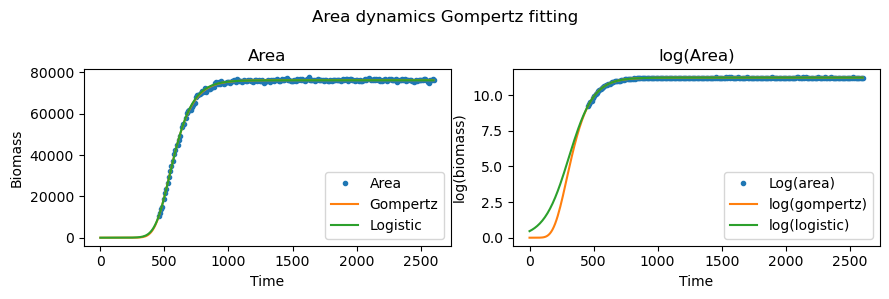

51
Gompertz Model:
  SSR: 0.1285
  R²: 0.9874
  AIC: -1598.3355
  BIC: -1588.2097

Logistic Model:
  SSR: 0.1350
  R²: 0.9868
  AIC: -1587.5781
  BIC: -1577.4522

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.13691483e+01 3.62859850e-02 9.83618778e+01]
Logistic params are: [11.36871043  0.02541276  3.35361221]


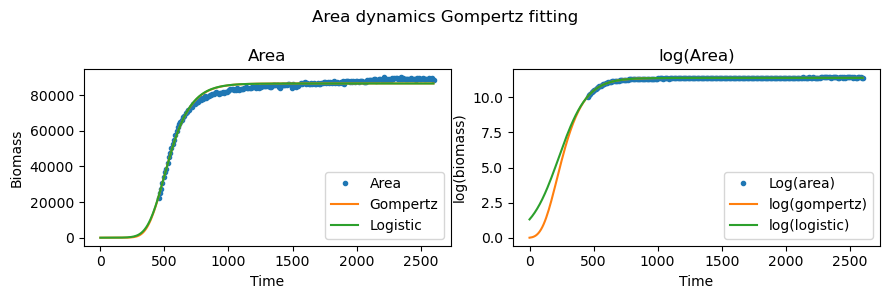

52
Gompertz Model:
  SSR: 0.1161
  R²: 0.9953
  AIC: -1620.1792
  BIC: -1610.0534

Logistic Model:
  SSR: 0.1326
  R²: 0.9946
  AIC: -1591.4020
  BIC: -1581.2761

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.01357947e+01 2.92558674e-02 1.30630919e+02]
Logistic params are: [1.01347304e+01 2.08827916e-02 3.65307033e+01]


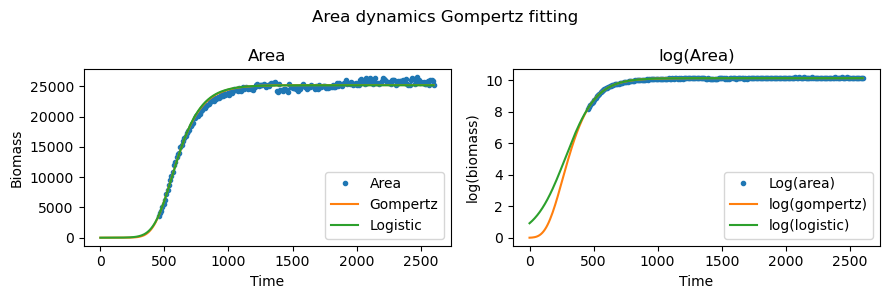

53
Gompertz Model:
  SSR: 0.0935
  R²: 0.9936
  AIC: -1666.9440
  BIC: -1656.8182

Logistic Model:
  SSR: 0.1742
  R²: 0.9881
  AIC: -1532.5260
  BIC: -1522.4001

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.09365944e+01 2.80057265e-02 3.05981469e+01]
Logistic params are: [1.09283387e+01 2.29026395e-02 1.99808295e-17]


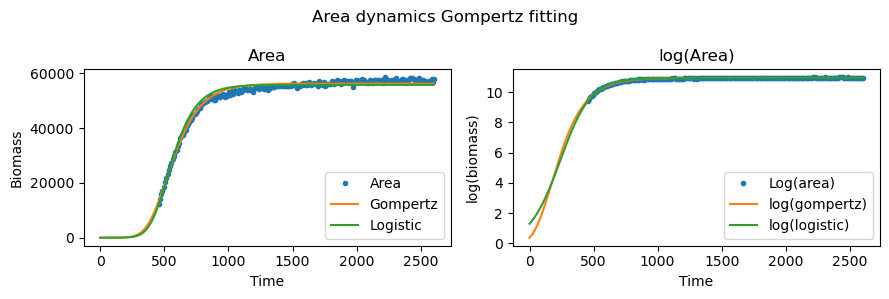

54
Gompertz Model:
  SSR: 0.1068
  R²: 0.9944
  AIC: -1638.1539
  BIC: -1628.0280

Logistic Model:
  SSR: 0.3209
  R²: 0.9832
  AIC: -1400.5546
  BIC: -1390.4288

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.08104762e+01 2.48508829e-02 3.05935662e-11]
Logistic params are: [1.07963421e+01 2.17362141e-02 1.27950686e-16]


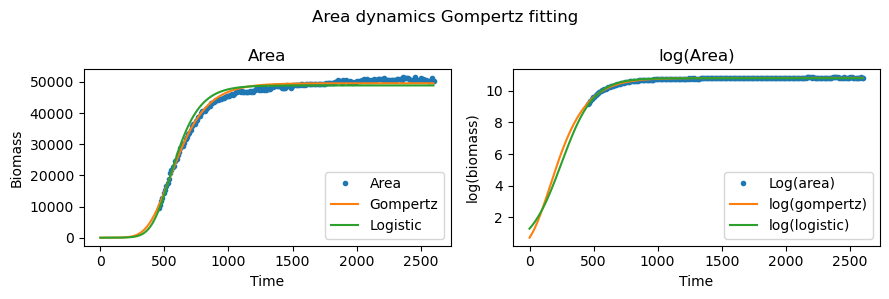

55
Gompertz Model:
  SSR: 0.1430
  R²: 0.9941
  AIC: -1575.0973
  BIC: -1564.9715

Logistic Model:
  SSR: 0.1749
  R²: 0.9928
  AIC: -1531.7264
  BIC: -1521.6005

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.03171017e+01 2.69294731e-02 8.60746386e+01]
Logistic params are: [1.03136361e+01 1.98831449e-02 5.71621508e-17]


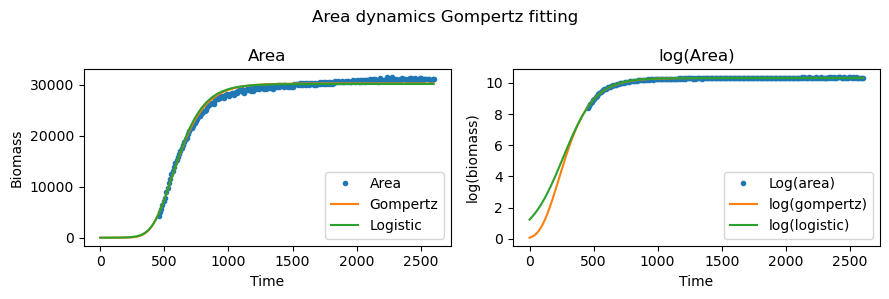

56
Gompertz Model:
  SSR: 0.4544
  R²: 0.9948
  AIC: -1325.4411
  BIC: -1315.3153

Logistic Model:
  SSR: 0.3595
  R²: 0.9959
  AIC: -1376.0282
  BIC: -1365.9024

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24256451e+01 3.18914373e-02 1.04551314e+02]
Logistic params are: [12.42239807  0.02340344 14.41381639]


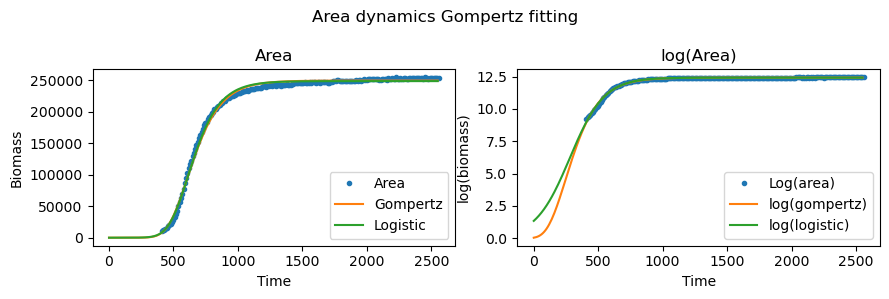

57
Gompertz Model:
  SSR: 0.2557
  R²: 0.9961
  AIC: -1449.6144
  BIC: -1439.4886

Logistic Model:
  SSR: 0.2542
  R²: 0.9962
  AIC: -1450.9055
  BIC: -1440.7797

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.26368208e+01 3.19230874e-02 7.26957586e+01]
Logistic params are: [1.26292861e+01 2.43460998e-02 6.64556904e-20]


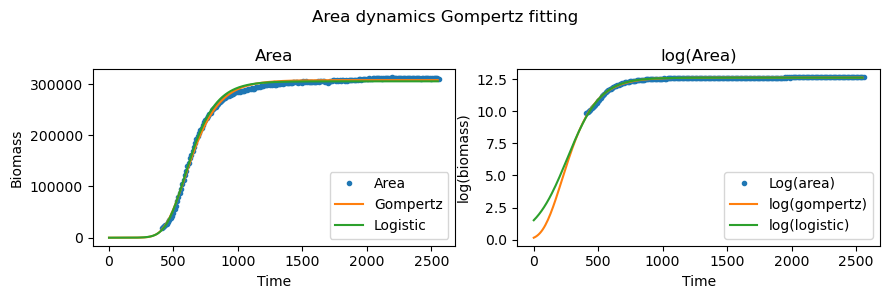

58
Gompertz Model:
  SSR: 0.4427
  R²: 0.9951
  AIC: -1331.0648
  BIC: -1320.9390

Logistic Model:
  SSR: 0.3676
  R²: 0.9959
  AIC: -1371.2443
  BIC: -1361.1185

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21569778e+01 3.15847284e-02 1.14632922e+02]
Logistic params are: [1.21534687e+01 2.32605790e-02 2.73660883e+01]


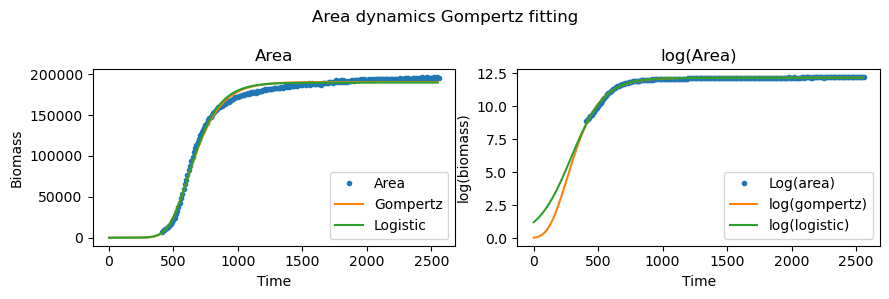

59
Gompertz Model:
  SSR: 0.4210
  R²: 0.9964
  AIC: -1341.9315
  BIC: -1331.8056

Logistic Model:
  SSR: 0.2814
  R²: 0.9976
  AIC: -1428.9315
  BIC: -1418.8057

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.28598507e+01 3.46027151e-02 1.38422495e+02]
Logistic params are: [1.28559460e+01 2.56359117e-02 5.72427412e+01]


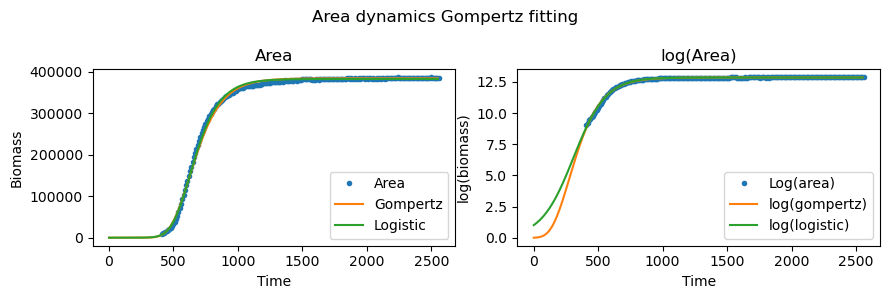

60
Gompertz Model:
  SSR: 0.4030
  R²: 0.9958
  AIC: -1351.3613
  BIC: -1341.2354

Logistic Model:
  SSR: 0.3019
  R²: 0.9969
  AIC: -1413.7833
  BIC: -1403.6575

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25132005e+01 3.16027108e-02 1.04635934e+02]
Logistic params are: [12.5097054   0.02323784 14.11604121]


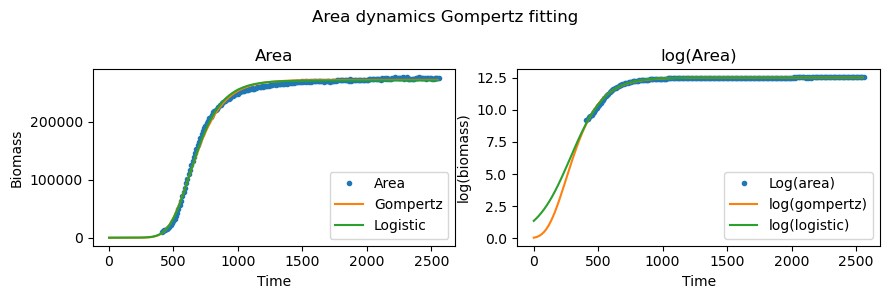

61
Gompertz Model:
  SSR: 0.2682
  R²: 0.9965
  AIC: -1439.3305
  BIC: -1429.2046

Logistic Model:
  SSR: 0.2353
  R²: 0.9969
  AIC: -1467.5453
  BIC: -1457.4194

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23214182e+01 3.05614273e-02 8.15766184e+01]
Logistic params are: [1.23152559e+01 2.29673331e-02 4.48325430e-26]


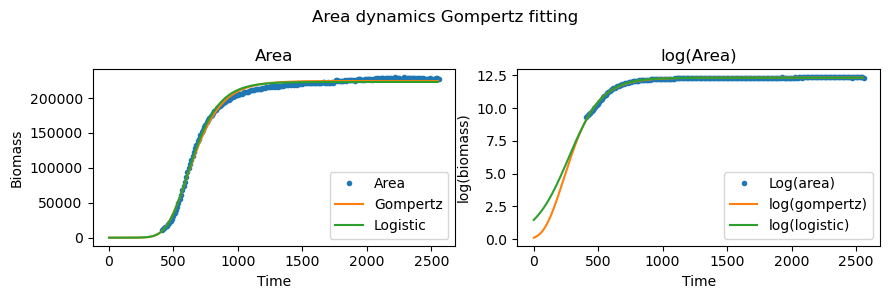

62
Gompertz Model:
  SSR: 0.1983
  R²: 0.9982
  AIC: -1504.5620
  BIC: -1494.4361

Logistic Model:
  SSR: 0.1459
  R²: 0.9987
  AIC: -1570.8172
  BIC: -1560.6914

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23784547e+01 2.85916098e-02 8.68946156e+01]
Logistic params are: [1.23715807e+01 2.15123454e-02 1.81753553e-27]


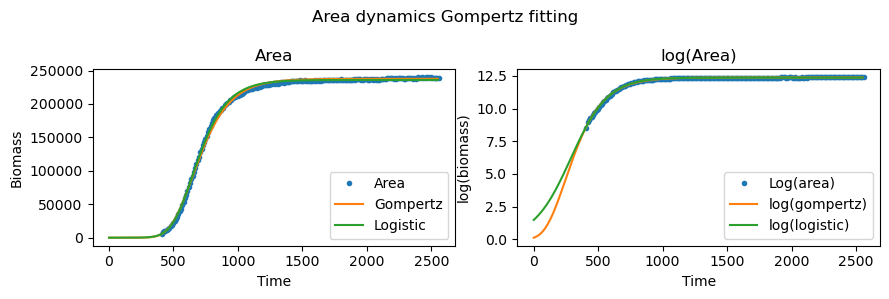

63
Gompertz Model:
  SSR: 0.0790
  R²: 0.9991
  AIC: -1703.4453
  BIC: -1693.3194

Logistic Model:
  SSR: 0.2742
  R²: 0.9968
  AIC: -1434.5410
  BIC: -1424.4151

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21800516e+01 2.73764188e-02 5.24488650e+01]
Logistic params are: [1.21642408e+01 2.21173861e-02 2.44873819e-19]


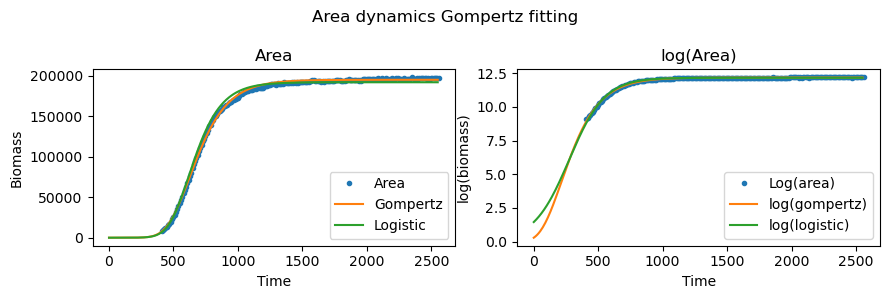

64
Gompertz Model:
  SSR: 0.1782
  R²: 0.9982
  AIC: -1527.5794
  BIC: -1517.4536

Logistic Model:
  SSR: 0.4025
  R²: 0.9960
  AIC: -1351.6383
  BIC: -1341.5125

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.23550996e+01 2.67326381e-02 4.96937349e+01]
Logistic params are: [1.23366789e+01 2.18219123e-02 1.15436548e-16]


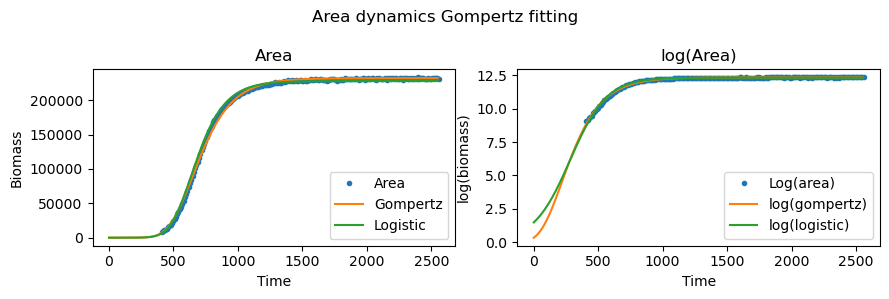

65
Gompertz Model:
  SSR: 0.4235
  R²: 0.9962
  AIC: -1340.6449
  BIC: -1330.5191

Logistic Model:
  SSR: 0.3227
  R²: 0.9971
  AIC: -1399.3483
  BIC: -1389.2224

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25236477e+01 2.88687483e-02 8.22242682e+01]
Logistic params are: [1.25155115e+01 2.19265796e-02 1.56570444e-19]


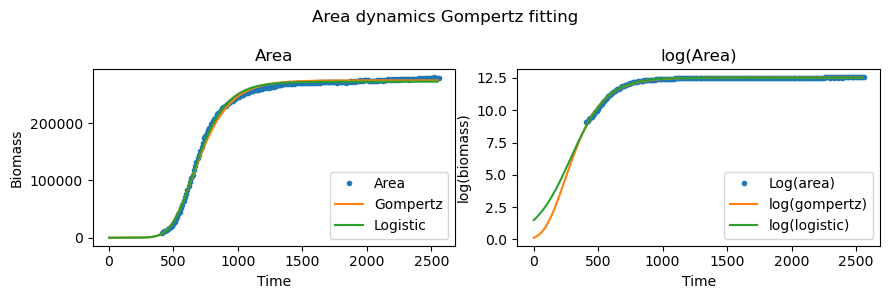

66
Gompertz Model:
  SSR: 0.3177
  R²: 0.9971
  AIC: -1402.7372
  BIC: -1392.6114

Logistic Model:
  SSR: 0.2394
  R²: 0.9978
  AIC: -1463.8227
  BIC: -1453.6969

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.23743298e+01 2.81643252e-02 7.94759859e+01]
Logistic params are: [1.23651617e+01 2.15510451e-02 3.67929936e-21]


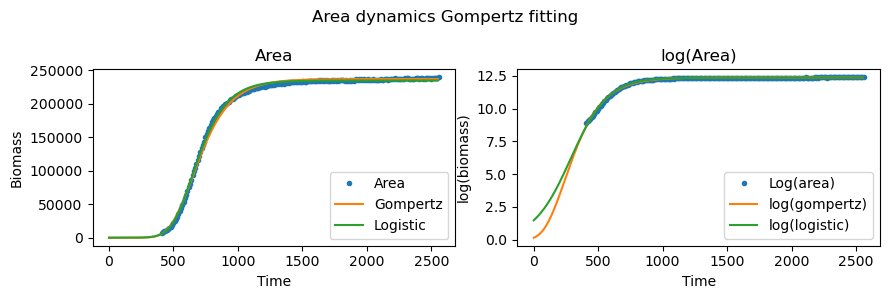

67
Gompertz Model:
  SSR: 0.2090
  R²: 0.9988
  AIC: -1493.1739
  BIC: -1483.0481

Logistic Model:
  SSR: 1.7570
  R²: 0.9901
  AIC: -1033.3208
  BIC: -1023.1950

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.73841644  0.02234901  8.58067175]
Logistic params are: [1.26906057e+01 2.01540496e-02 1.50115866e-16]


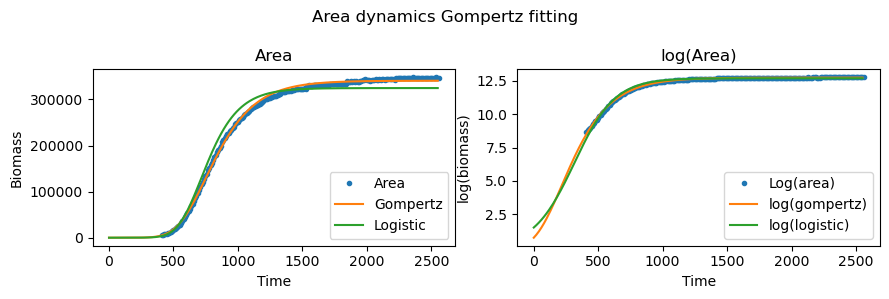

68
Gompertz Model:
  SSR: 0.2237
  R²: 0.9984
  AIC: -1478.5061
  BIC: -1468.3803

Logistic Model:
  SSR: 1.8203
  R²: 0.9867
  AIC: -1025.6729
  BIC: -1015.5470

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.24151183e+01 2.25237764e-02 1.85455548e-19]
Logistic params are: [1.23701094e+01 2.05594555e-02 1.11866792e-15]


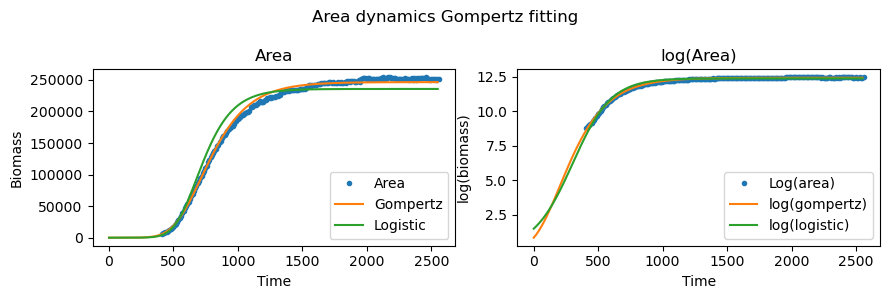

69
Gompertz Model:
  SSR: 0.2381
  R²: 0.9987
  AIC: -1465.0444
  BIC: -1454.9186

Logistic Model:
  SSR: 1.2053
  R²: 0.9932
  AIC: -1114.7282
  BIC: -1104.6024

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.25694857e+01 2.27948146e-02 2.69624472e+01]
Logistic params are: [1.25305936e+01 1.98396654e-02 7.47934518e-14]


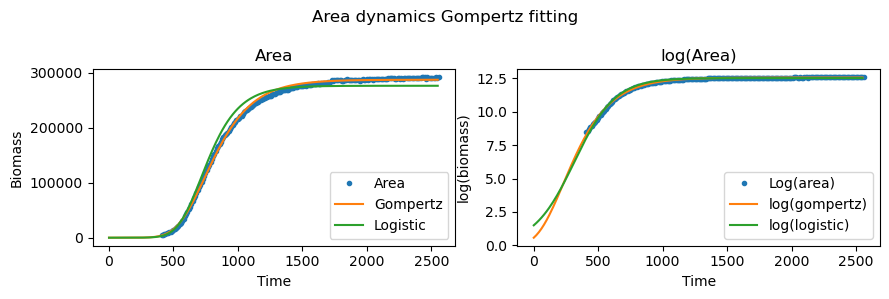

70
Gompertz Model:
  SSR: 0.3611
  R²: 0.9978
  AIC: -1375.1002
  BIC: -1364.9743

Logistic Model:
  SSR: 1.3885
  R²: 0.9917
  AIC: -1084.1598
  BIC: -1074.0340

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26028055e+01 2.30853612e-02 2.35892048e+01]
Logistic params are: [1.25636291e+01 2.01961857e-02 2.06889573e-13]


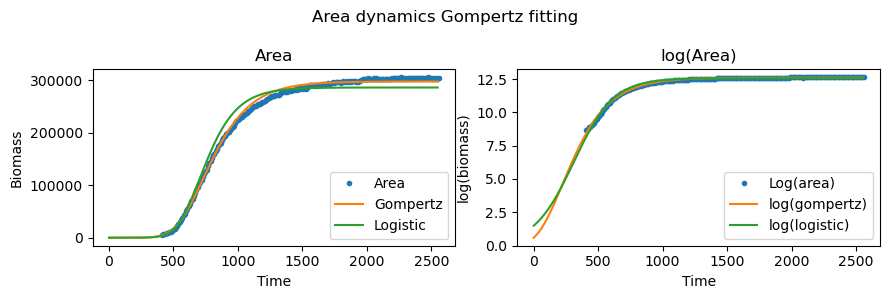

71
Gompertz Model:
  SSR: 0.2981
  R²: 0.9972
  AIC: -1416.5077
  BIC: -1406.3819

Logistic Model:
  SSR: 0.1770
  R²: 0.9984
  AIC: -1529.0823
  BIC: -1518.9565

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16628413e+01 3.25151794e-02 7.62916397e+01]
Logistic params are: [11.65914382  0.02420294  0.21752008]


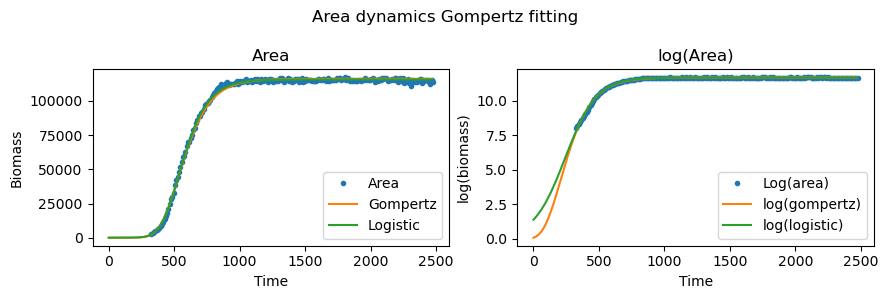

72
Gompertz Model:
  SSR: 0.4606
  R²: 0.9960
  AIC: -1322.4941
  BIC: -1312.3683

Logistic Model:
  SSR: 0.2895
  R²: 0.9975
  AIC: -1422.7884
  BIC: -1412.6626

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16475629e+01 3.14563386e-02 7.20558139e+01]
Logistic params are: [1.16421374e+01 2.37675977e-02 2.29167064e-14]


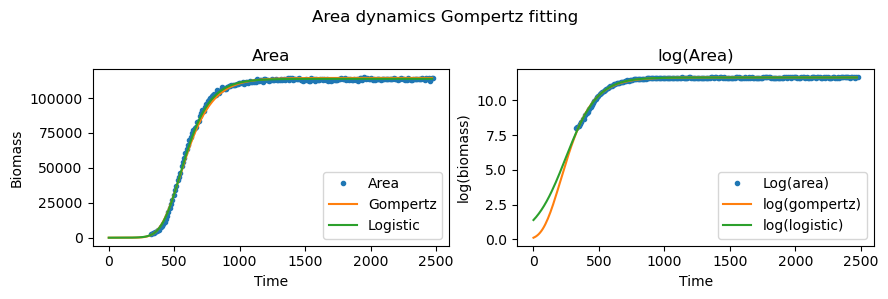

73
Gompertz Model:
  SSR: 0.6109
  R²: 0.9966
  AIC: -1261.5028
  BIC: -1251.3769

Logistic Model:
  SSR: 0.4340
  R²: 0.9976
  AIC: -1335.3621
  BIC: -1325.2362

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19072918e+01 3.18011687e-02 1.01891603e+02]
Logistic params are: [1.19012917e+01 2.41960574e-02 3.26687320e+01]


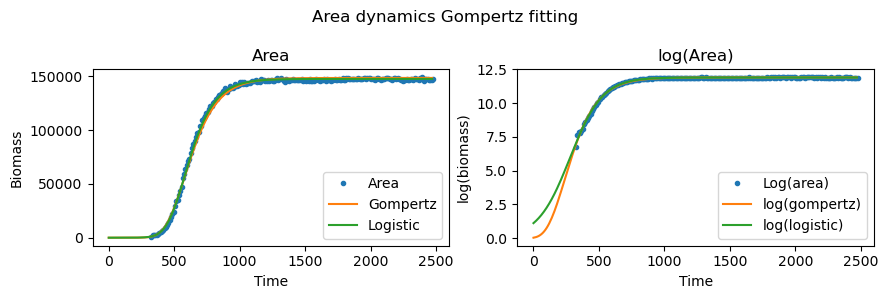

74
Gompertz Model:
  SSR: 0.6519
  R²: 0.9958
  AIC: -1247.4797
  BIC: -1237.3538

Logistic Model:
  SSR: 0.4129
  R²: 0.9973
  AIC: -1346.1377
  BIC: -1336.0119

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18563241e+01 3.16467138e-02 8.87309585e+01]
Logistic params are: [11.850795    0.02394942 16.90435672]


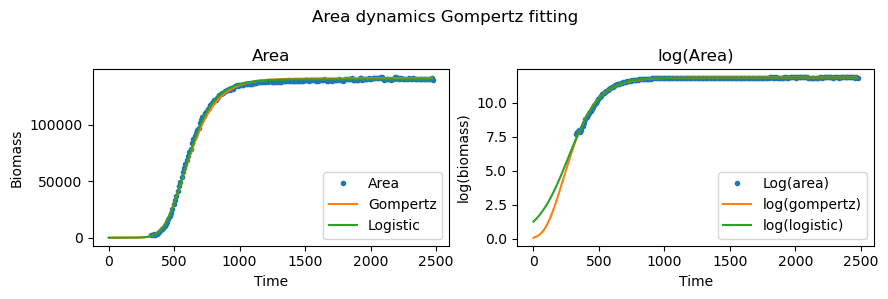

75
Gompertz Model:
  SSR: 0.3284
  R²: 0.9977
  AIC: -1395.5497
  BIC: -1385.4239

Logistic Model:
  SSR: 0.1755
  R²: 0.9988
  AIC: -1530.9139
  BIC: -1520.7881

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21161272e+01 3.31755229e-02 8.71179618e+01]
Logistic params are: [12.11125529  0.02494159 14.20128413]


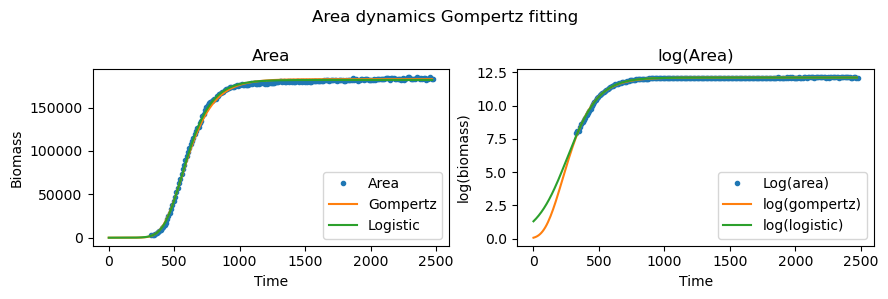

76
Gompertz Model:
  SSR: 0.2885
  R²: 0.9981
  AIC: -1423.5423
  BIC: -1413.4164

Logistic Model:
  SSR: 0.1146
  R²: 0.9993
  AIC: -1622.8944
  BIC: -1612.7686

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22288895e+01 3.33470437e-02 9.01072252e+01]
Logistic params are: [12.22385727  0.02511548 17.76093775]


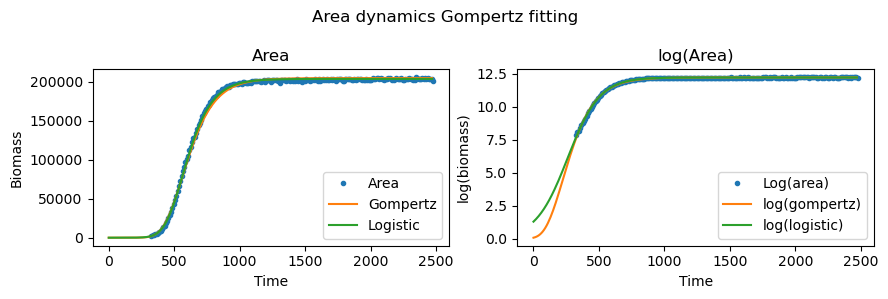

77
Gompertz Model:
  SSR: 0.4647
  R²: 0.9961
  AIC: -1320.6150
  BIC: -1310.4891

Logistic Model:
  SSR: 0.3221
  R²: 0.9973
  AIC: -1399.7984
  BIC: -1389.6726

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15203966e+01 3.02934771e-02 6.78027472e+01]
Logistic params are: [1.15130674e+01 2.32248843e-02 2.05356447e-16]


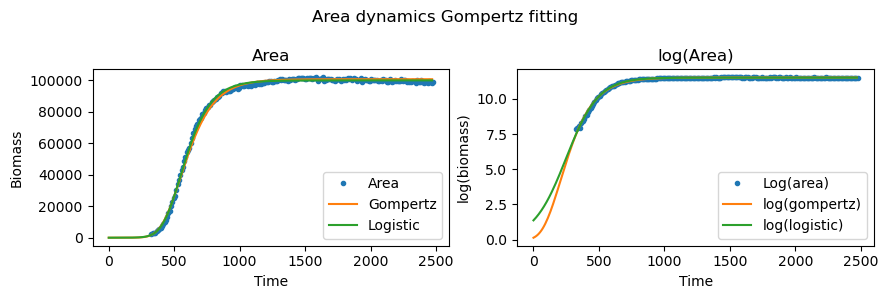

78
Gompertz Model:
  SSR: 0.4907
  R²: 0.9949
  AIC: -1308.8314
  BIC: -1298.7055

Logistic Model:
  SSR: 0.4771
  R²: 0.9951
  AIC: -1314.9196
  BIC: -1304.7938

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.13675328e+01 3.01338482e-02 5.54141913e+01]
Logistic params are: [1.13570942e+01 2.37701688e-02 1.40779986e-17]


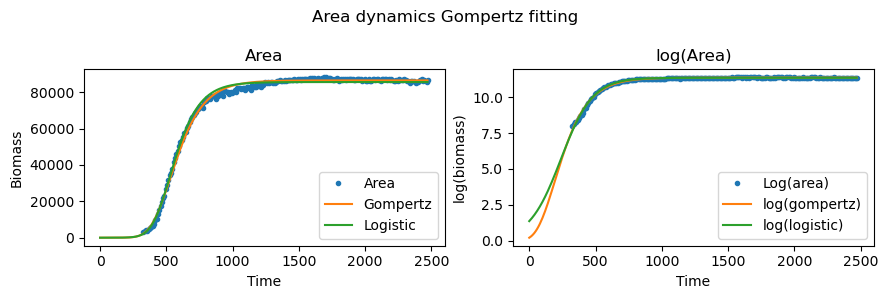

79
Gompertz Model:
  SSR: 0.2792
  R²: 0.9973
  AIC: -1430.6664
  BIC: -1420.5405

Logistic Model:
  SSR: 0.2967
  R²: 0.9971
  AIC: -1417.5345
  BIC: -1407.4087

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14062184e+01 3.00083244e-02 5.69101108e+01]
Logistic params are: [1.13958113e+01 2.36149854e-02 1.75784152e-17]


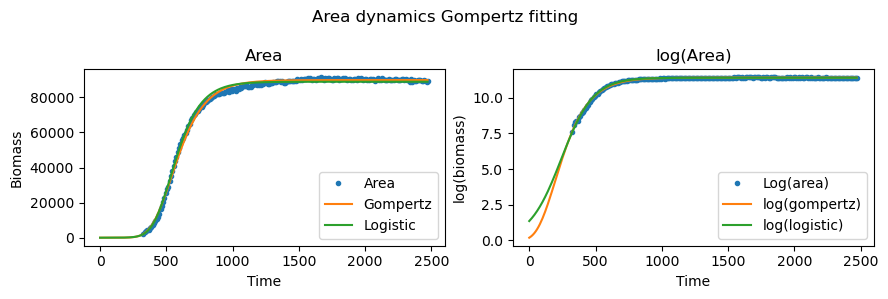

80
Gompertz Model:
  SSR: 0.1955
  R²: 0.9983
  AIC: -1507.6671
  BIC: -1497.5413

Logistic Model:
  SSR: 0.1773
  R²: 0.9984
  AIC: -1528.7598
  BIC: -1518.6340

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15914122e+01 3.11670591e-02 6.92813199e+01]
Logistic params are: [1.15847186e+01 2.37345031e-02 1.44998945e-25]


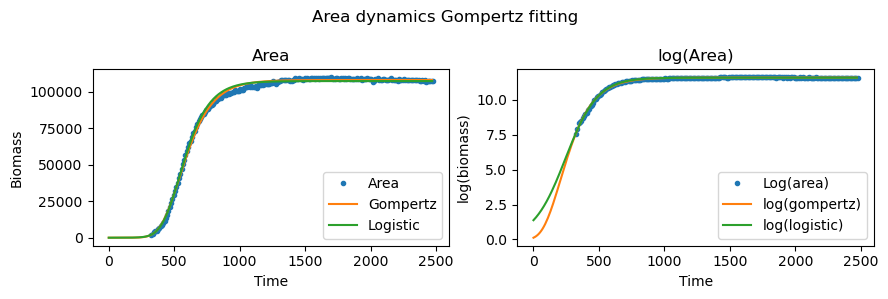

81
Gompertz Model:
  SSR: 0.9525
  R²: 0.9946
  AIC: -1165.5671
  BIC: -1155.4413

Logistic Model:
  SSR: 0.6719
  R²: 0.9962
  AIC: -1240.9489
  BIC: -1230.8231

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15968715e+01 2.72664602e-02 6.40432594e+01]
Logistic params are: [1.15850432e+01 2.14403486e-02 2.86168748e-16]


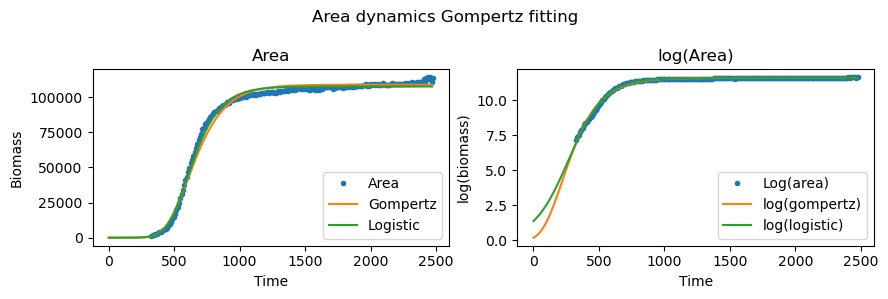

82
Gompertz Model:
  SSR: 0.8759
  R²: 0.9950
  AIC: -1183.6712
  BIC: -1173.5453

Logistic Model:
  SSR: 0.5354
  R²: 0.9970
  AIC: -1290.0185
  BIC: -1279.8927

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14500520e+01 2.76867622e-02 7.53620530e+01]
Logistic params are: [1.14432624e+01 2.11205059e-02 2.98832705e-10]


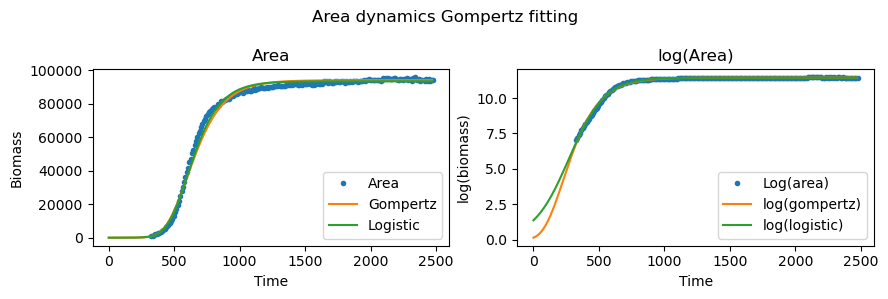

83
Gompertz Model:
  SSR: 0.9046
  R²: 0.9951
  AIC: -1176.7253
  BIC: -1166.5995

Logistic Model:
  SSR: 0.8900
  R²: 0.9952
  AIC: -1180.2248
  BIC: -1170.0990

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15714084e+01 2.98229420e-02 9.69155979e+01]
Logistic params are: [1.15652729e+01 2.26830016e-02 2.50639361e+01]


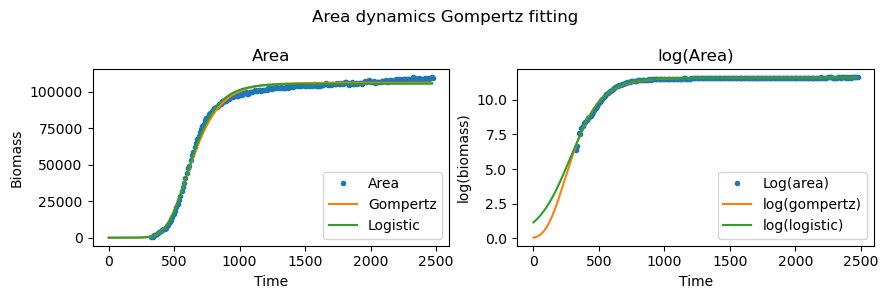

84
Gompertz Model:
  SSR: 1.3282
  R²: 0.9937
  AIC: -1093.7529
  BIC: -1083.6270

Logistic Model:
  SSR: 1.0433
  R²: 0.9951
  AIC: -1145.9000
  BIC: -1135.7742

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.17470007e+01 2.87169065e-02 9.07359378e+01]
Logistic params are: [11.73992008  0.02197974 18.0354668 ]


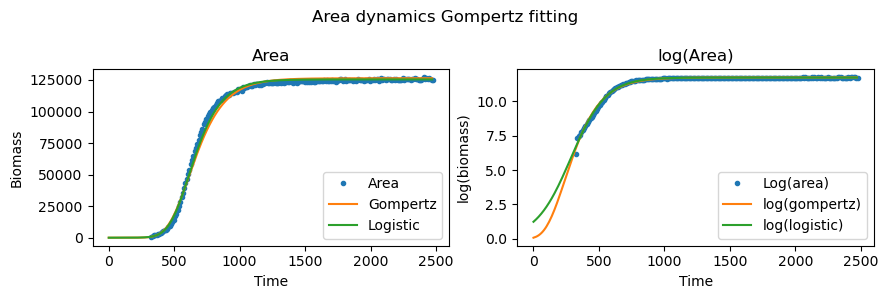

85
Gompertz Model:
  SSR: 1.7211
  R²: 0.9926
  AIC: -1037.7770
  BIC: -1027.6512

Logistic Model:
  SSR: 1.0766
  R²: 0.9954
  AIC: -1139.1097
  BIC: -1128.9838

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19135776e+01 2.75257617e-02 7.91517040e+01]
Logistic params are: [11.90523916  0.02119061  4.98228112]


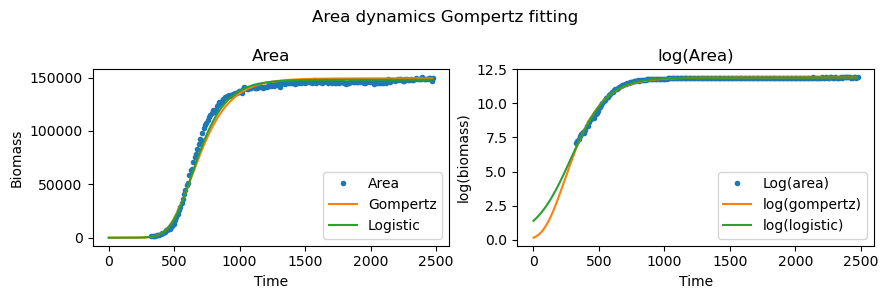

86
Gompertz Model:
  SSR: 0.8370
  R²: 0.9964
  AIC: -1193.4829
  BIC: -1183.3571

Logistic Model:
  SSR: 0.6988
  R²: 0.9970
  AIC: -1232.4586
  BIC: -1222.3327

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20761151e+01 3.08541171e-02 1.06977534e+02]
Logistic params are: [1.20688020e+01 2.36741619e-02 3.85652789e+01]


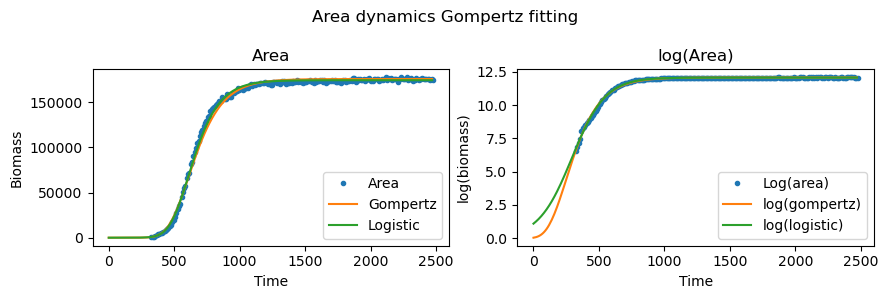

87
Gompertz Model:
  SSR: 1.0384
  R²: 0.9953
  AIC: -1146.9171
  BIC: -1136.7912

Logistic Model:
  SSR: 0.5462
  R²: 0.9975
  AIC: -1285.7094
  BIC: -1275.5836

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18257511e+01 2.74636988e-02 7.83749039e+01]
Logistic params are: [11.81770846  0.02109077  3.35713731]


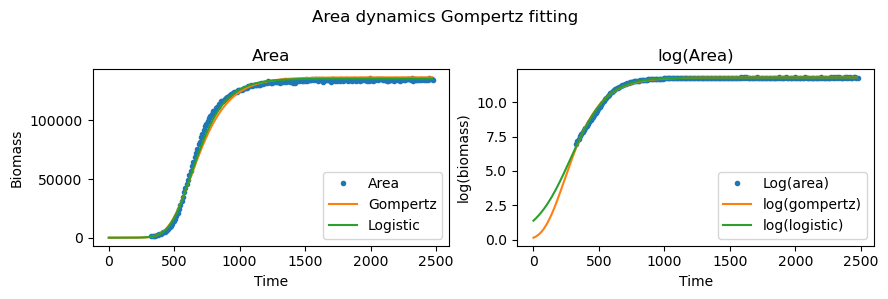

88
Gompertz Model:
  SSR: 0.9041
  R²: 0.9950
  AIC: -1176.8405
  BIC: -1166.7147

Logistic Model:
  SSR: 0.5470
  R²: 0.9970
  AIC: -1285.3680
  BIC: -1275.2421

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18045621e+01 2.82846889e-02 6.94344082e+01]
Logistic params are: [1.17952103e+01 2.19039289e-02 6.14906117e-17]


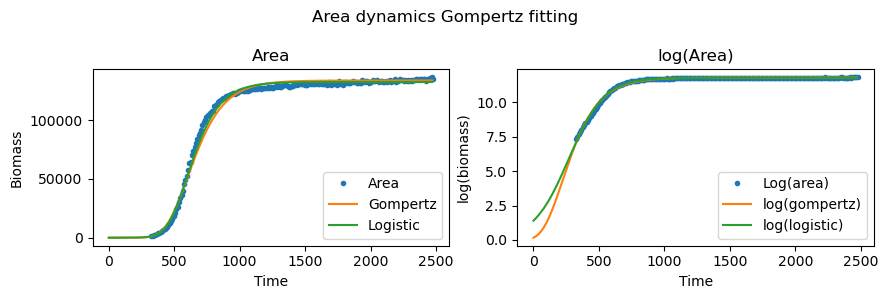

89
Gompertz Model:
  SSR: 1.8175
  R²: 0.9913
  AIC: -1026.0055
  BIC: -1015.8797

Logistic Model:
  SSR: 1.3582
  R²: 0.9935
  AIC: -1088.9236
  BIC: -1078.7978

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.17825174e+01 3.17196710e-02 1.16537052e+02]
Logistic params are: [1.17764892e+01 2.43263412e-02 5.16431569e+01]


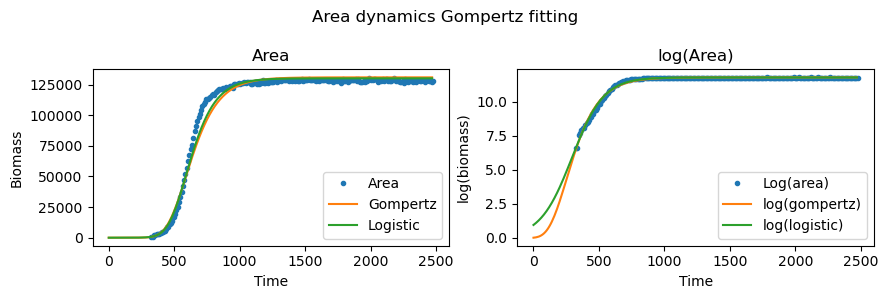

90
Gompertz Model:
  SSR: 0.7321
  R²: 0.9962
  AIC: -1222.4084
  BIC: -1212.2826

Logistic Model:
  SSR: 0.5110
  R²: 0.9974
  AIC: -1300.0930
  BIC: -1289.9671

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14766670e+01 3.17342262e-02 1.22788671e+02]
Logistic params are: [1.14710315e+01 2.42825888e-02 5.86861418e+01]


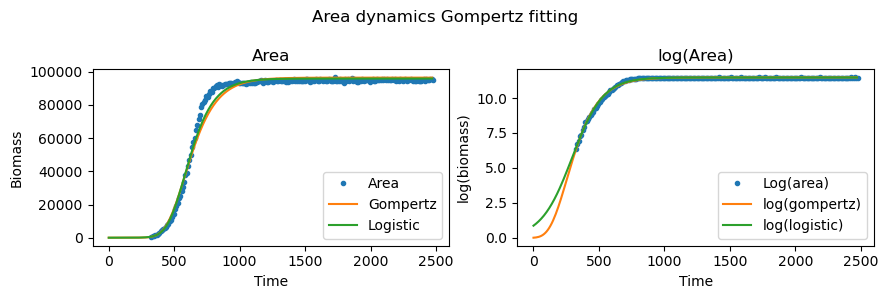

91
Gompertz Model:
  SSR: 1.8176
  R²: 0.9912
  AIC: -1025.9932
  BIC: -1015.8673

Logistic Model:
  SSR: 1.1715
  R²: 0.9943
  AIC: -1120.8720
  BIC: -1110.7462

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16321169e+01 2.90233704e-02 9.69003001e+01]
Logistic params are: [1.16252641e+01 2.22992109e-02 2.75195798e+01]


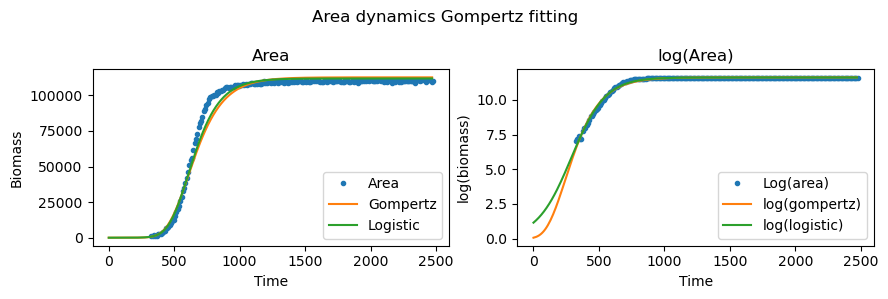

92
Gompertz Model:
  SSR: 0.2280
  R²: 0.9969
  AIC: -1474.3565
  BIC: -1464.2307

Logistic Model:
  SSR: 1.0662
  R²: 0.9857
  AIC: -1141.2096
  BIC: -1131.0837

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.11044448e+01 2.65156768e-02 5.10164048e-14]
Logistic params are: [1.10782181e+01 2.40469581e-02 6.61707518e-18]


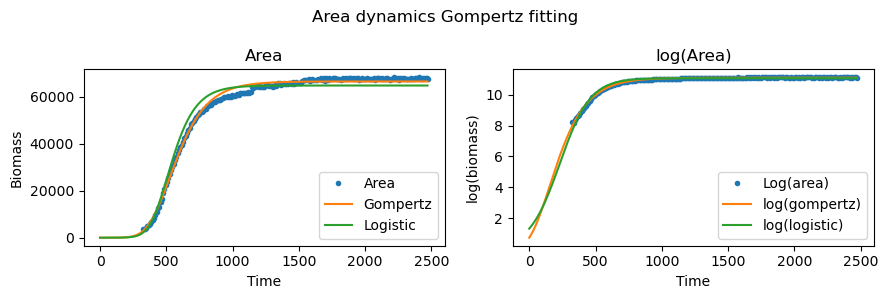

93
Gompertz Model:
  SSR: 0.8697
  R²: 0.9951
  AIC: -1185.2111
  BIC: -1175.0853

Logistic Model:
  SSR: 0.5397
  R²: 0.9969
  AIC: -1288.2855
  BIC: -1278.1597

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14365146e+01 2.79159858e-02 7.85017236e+01]
Logistic params are: [11.43003291  0.02126792  3.31747373]


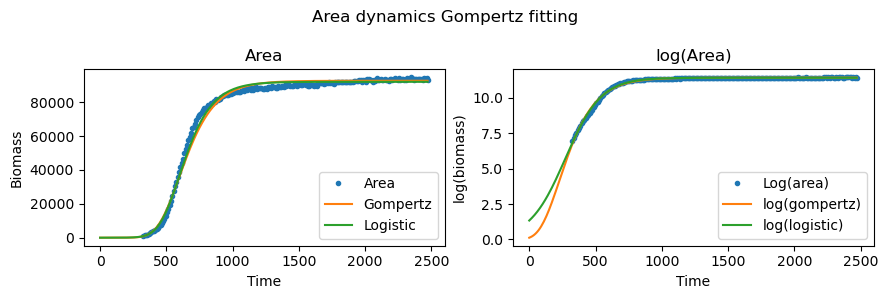

94
Gompertz Model:
  SSR: 0.7407
  R²: 0.9958
  AIC: -1219.8884
  BIC: -1209.7626

Logistic Model:
  SSR: 0.4375
  R²: 0.9975
  AIC: -1333.6243
  BIC: -1323.4985

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.13616370e+01 2.74450025e-02 7.57621249e+01]
Logistic params are: [1.13549528e+01 2.09210929e-02 3.55967986e-09]


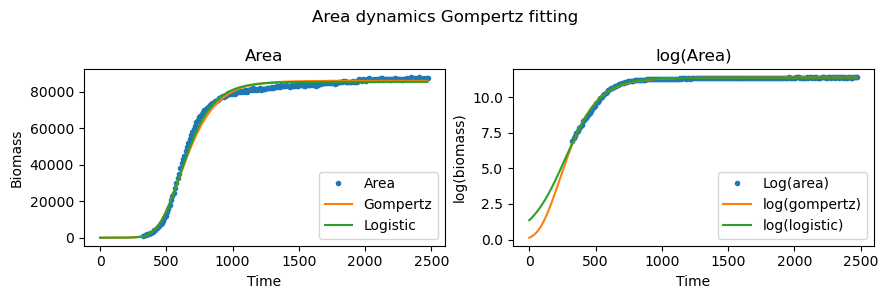

95
Gompertz Model:
  SSR: 0.9766
  R²: 0.9949
  AIC: -1160.1677
  BIC: -1150.0419

Logistic Model:
  SSR: 0.6843
  R²: 0.9964
  AIC: -1237.0027
  BIC: -1226.8769

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15832140e+01 2.83010249e-02 8.35732193e+01]
Logistic params are: [11.57617243  0.02162623  9.84774192]


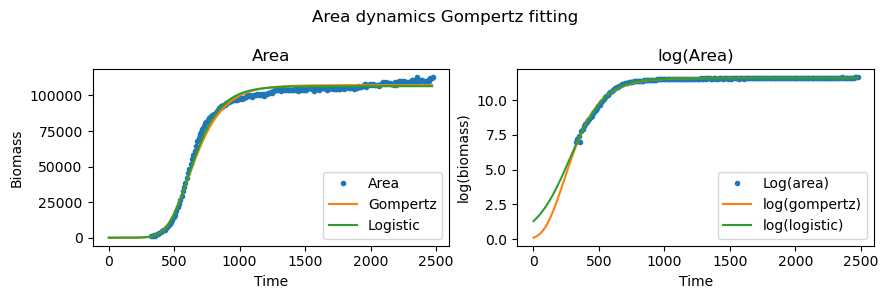

96
Gompertz Model:
  SSR: 0.1685
  R²: 0.9992
  AIC: -1539.7727
  BIC: -1529.6469

Logistic Model:
  SSR: 1.2956
  R²: 0.9936
  AIC: -1099.1143
  BIC: -1088.9884

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.63653509  0.02746463 22.78046433]
Logistic params are: [1.26023419e+01 2.39841375e-02 3.35883864e-15]


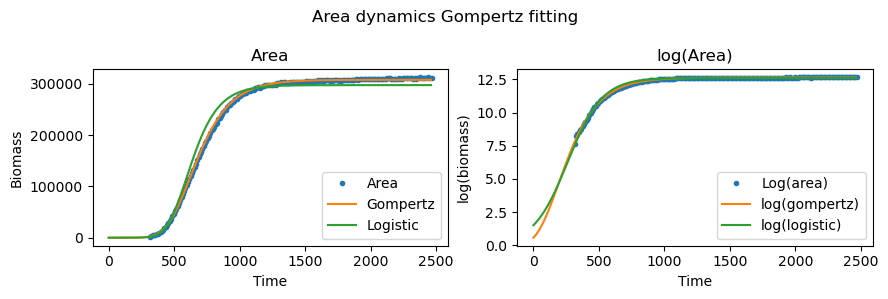

97
Gompertz Model:
  SSR: 0.1479
  R²: 0.9992
  AIC: -1567.8456
  BIC: -1557.7198

Logistic Model:
  SSR: 1.7352
  R²: 0.9907
  AIC: -1036.0118
  BIC: -1025.8859

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.42546859  0.02621889  7.23545967]
Logistic params are: [1.23850562e+01 2.37514195e-02 3.37407234e-15]


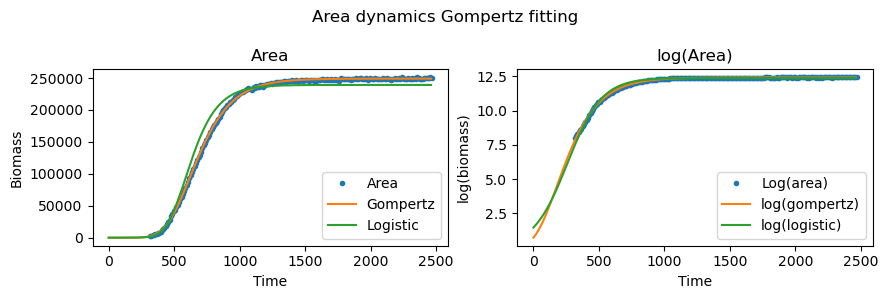

98
Gompertz Model:
  SSR: 0.1713
  R²: 0.9990
  AIC: -1536.1212
  BIC: -1525.9954

Logistic Model:
  SSR: 2.1391
  R²: 0.9880
  AIC: -990.8200
  BIC: -980.6941

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21230495e+01 2.50610758e-02 2.97009539e-23]
Logistic params are: [1.20792926e+01 2.31089474e-02 4.41949476e-16]


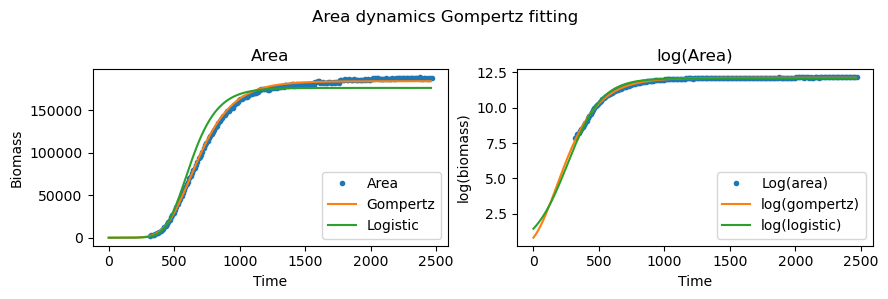

99
Gompertz Model:
  SSR: 0.2177
  R²: 0.9988
  AIC: -1484.3460
  BIC: -1474.2201

Logistic Model:
  SSR: 2.0285
  R²: 0.9891
  AIC: -1002.2877
  BIC: -992.1619

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.31935785  0.02549626  1.09320233]
Logistic params are: [1.22755205e+01 2.34487319e-02 1.20466380e-15]


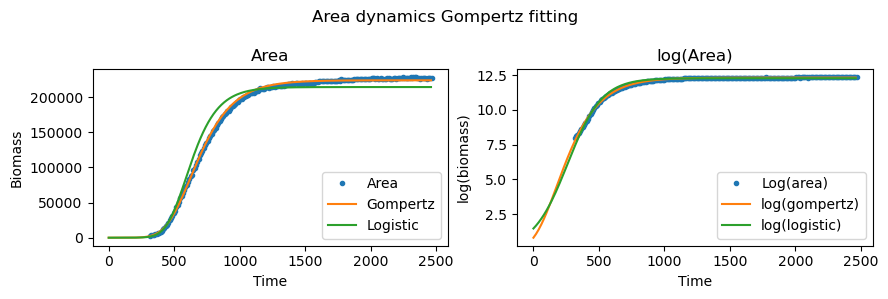

100
Gompertz Model:
  SSR: 0.3507
  R²: 0.9982
  AIC: -1381.4196
  BIC: -1371.2938

Logistic Model:
  SSR: 3.1930
  R²: 0.9836
  AIC: -904.2919
  BIC: -894.1660

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.21090443e+01 2.43322031e-02 1.20233158e-20]
Logistic params are: [1.20620991e+01 2.24882981e-02 7.55326025e-16]


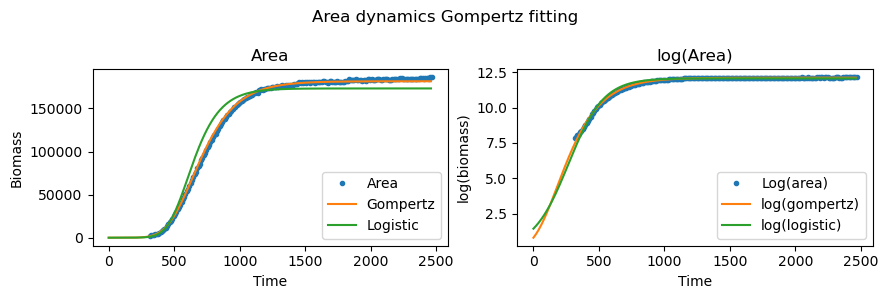

101
Gompertz Model:
  SSR: 0.8093
  R²: 0.9959
  AIC: -1200.7517
  BIC: -1190.6259

Logistic Model:
  SSR: 0.6461
  R²: 0.9967
  AIC: -1249.4121
  BIC: -1239.2863

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21602799e+01 3.25187507e-02 9.45708627e+01]
Logistic params are: [1.21543312e+01 2.47372278e-02 2.54775352e+01]


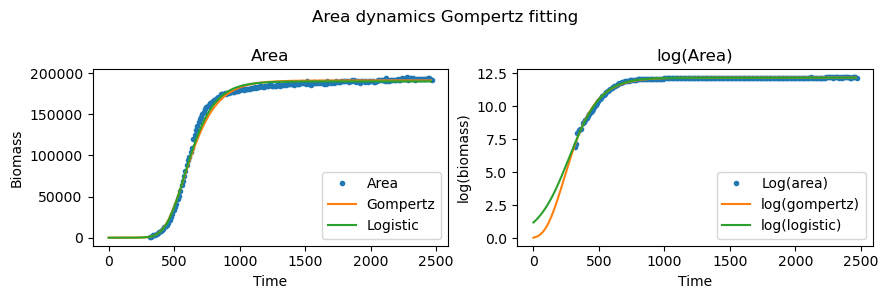

102
Gompertz Model:
  SSR: 0.8542
  R²: 0.9937
  AIC: -1189.1115
  BIC: -1178.9856

Logistic Model:
  SSR: 2.0668
  R²: 0.9849
  AIC: -998.2440
  BIC: -988.1182

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.82281404  0.02609524  3.34600592]
Logistic params are: [1.17895237e+01 2.36935000e-02 9.85319182e-18]


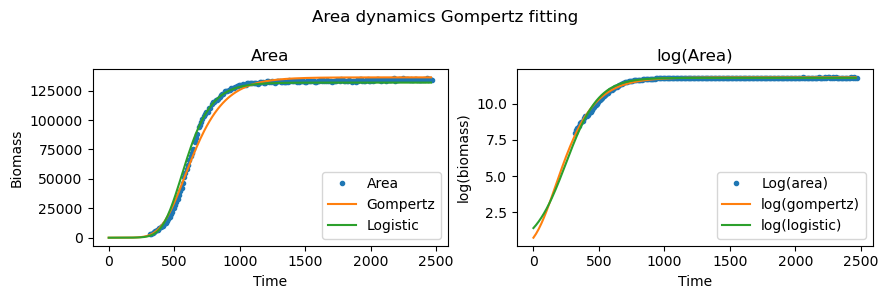

103
Gompertz Model:
  SSR: 0.6677
  R²: 0.9959
  AIC: -1242.3046
  BIC: -1232.1788

Logistic Model:
  SSR: 0.8690
  R²: 0.9947
  AIC: -1185.3913
  BIC: -1175.2654

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.18209954e+01 2.78473654e-02 4.36982581e+01]
Logistic params are: [1.18017715e+01 2.29520154e-02 1.02507778e-18]


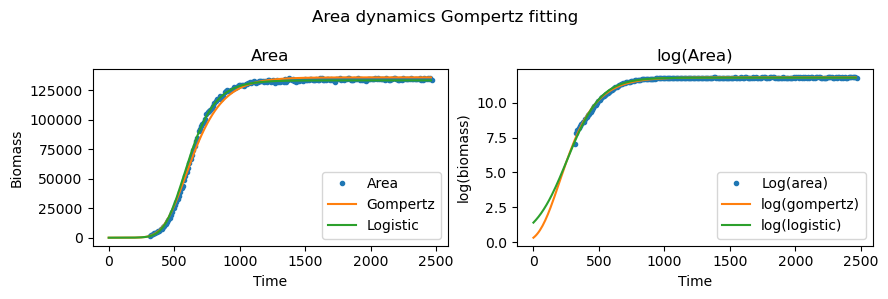

104
Gompertz Model:
  SSR: 0.9239
  R²: 0.9936
  AIC: -1172.1585
  BIC: -1162.0327

Logistic Model:
  SSR: 1.6924
  R²: 0.9882
  AIC: -1041.4167
  BIC: -1031.2909

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.81844637  0.02679922 18.39807885]
Logistic params are: [1.17904096e+01 2.34839366e-02 2.14540994e-15]


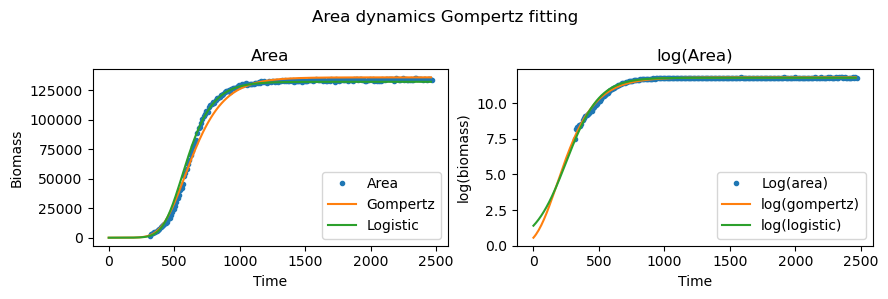

105
Gompertz Model:
  SSR: 0.6351
  R²: 0.9954
  AIC: -1253.1340
  BIC: -1243.0081

Logistic Model:
  SSR: 1.3876
  R²: 0.9901
  AIC: -1084.3027
  BIC: -1074.1769

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.57370703  0.0261202  17.92802339]
Logistic params are: [1.15454618e+01 2.29326903e-02 2.82812456e-15]


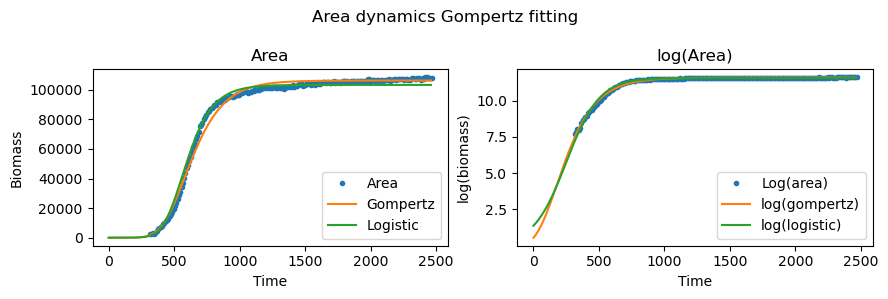

106
Gompertz Model:
  SSR: 0.5982
  R²: 0.9957
  AIC: -1266.0391
  BIC: -1255.9132

Logistic Model:
  SSR: 0.5157
  R²: 0.9963
  AIC: -1298.0845
  BIC: -1287.9587

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.13640572e+01 2.86741879e-02 5.85947387e+01]
Logistic params are: [1.13528719e+01 2.26109690e-02 2.65492101e-16]


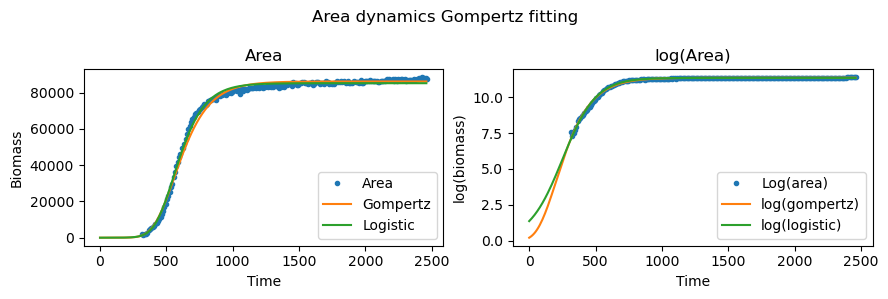

107
Gompertz Model:
  SSR: 0.8339
  R²: 0.9939
  AIC: -1194.2950
  BIC: -1184.1692

Logistic Model:
  SSR: 0.7399
  R²: 0.9946
  AIC: -1220.1372
  BIC: -1210.0114

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14516240e+01 2.84167011e-02 5.07795247e+01]
Logistic params are: [1.1437744e+01 2.2873436e-02 4.1152253e-15]


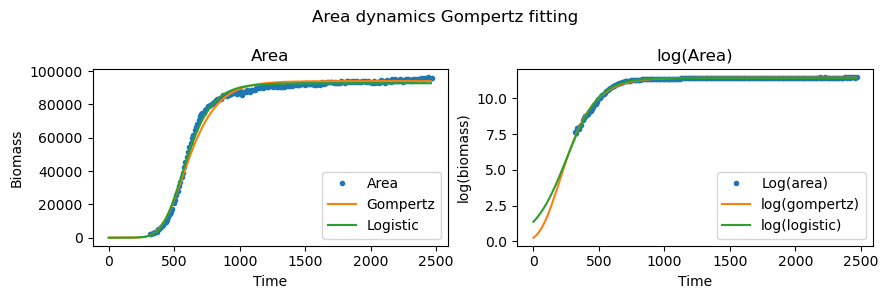

108
Gompertz Model:
  SSR: 1.8227
  R²: 0.9898
  AIC: -1025.3951
  BIC: -1015.2693

Logistic Model:
  SSR: 1.2285
  R²: 0.9932
  AIC: -1110.6159
  BIC: -1100.4901

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22118287e+01 3.96280986e-02 1.37348342e+02]
Logistic params are: [1.22073798e+01 3.02982801e-02 8.25427767e+01]


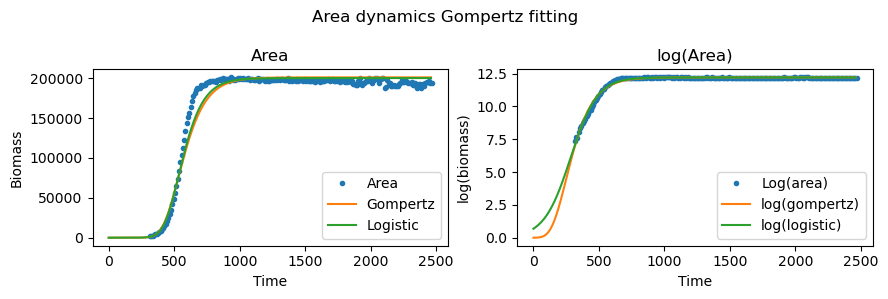

109
Gompertz Model:
  SSR: 1.0289
  R²: 0.9905
  AIC: -1148.9062
  BIC: -1138.7804

Logistic Model:
  SSR: 0.7540
  R²: 0.9930
  AIC: -1216.0597
  BIC: -1205.9338

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14764971e+01 3.49095597e-02 9.41028467e+01]
Logistic params are: [1.14733400e+01 2.60975136e-02 2.64473721e+01]


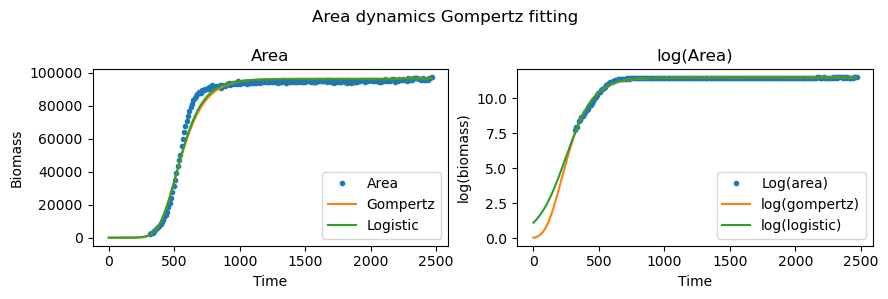

110
Gompertz Model:
  SSR: 0.7548
  R²: 0.9939
  AIC: -1215.8256
  BIC: -1205.6997

Logistic Model:
  SSR: 0.5118
  R²: 0.9958
  AIC: -1299.7280
  BIC: -1289.6022

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14966822e+01 3.63631642e-02 1.13543440e+02]
Logistic params are: [1.14931609e+01 2.73641041e-02 5.11087637e+01]


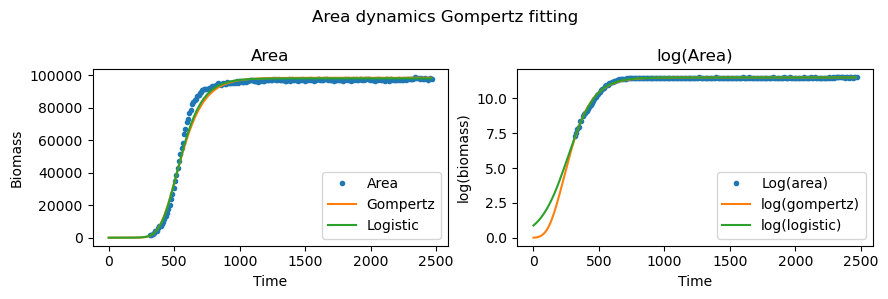

111
Gompertz Model:
  SSR: 1.6472
  R²: 0.9784
  AIC: -1047.2651
  BIC: -1037.1393

Logistic Model:
  SSR: 2.2210
  R²: 0.9709
  AIC: -982.7025
  BIC: -972.5767

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.59623366  0.02954931  8.39776373]
Logistic params are: [1.15755493e+01 2.61140832e-02 2.33581923e-17]


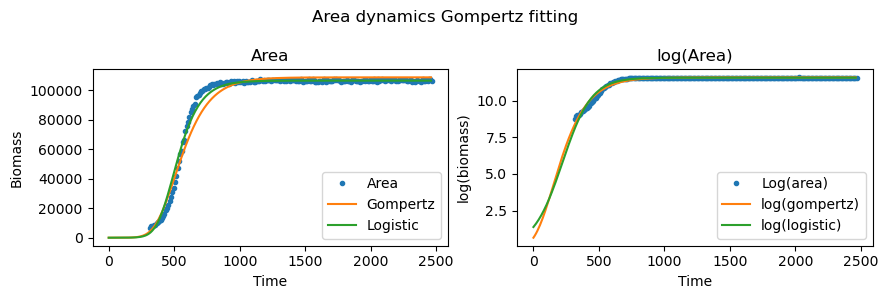

112
Gompertz Model:
  SSR: 1.3809
  R²: 0.9893
  AIC: -1085.3430
  BIC: -1075.2171

Logistic Model:
  SSR: 0.9755
  R²: 0.9924
  AIC: -1160.4180
  BIC: -1150.2921

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20903216e+01 3.81370341e-02 1.09011108e+02]
Logistic params are: [1.20868304e+01 2.86766900e-02 4.61229323e+01]


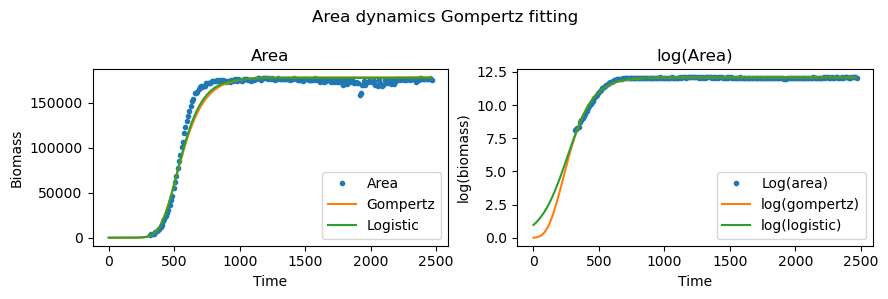

113
Gompertz Model:
  SSR: 1.0176
  R²: 0.9916
  AIC: -1151.2969
  BIC: -1141.1711

Logistic Model:
  SSR: 0.7536
  R²: 0.9938
  AIC: -1216.1596
  BIC: -1206.0338

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.17745494e+01 3.79392788e-02 1.14015846e+02]
Logistic params are: [1.17713802e+01 2.84533022e-02 5.15037392e+01]


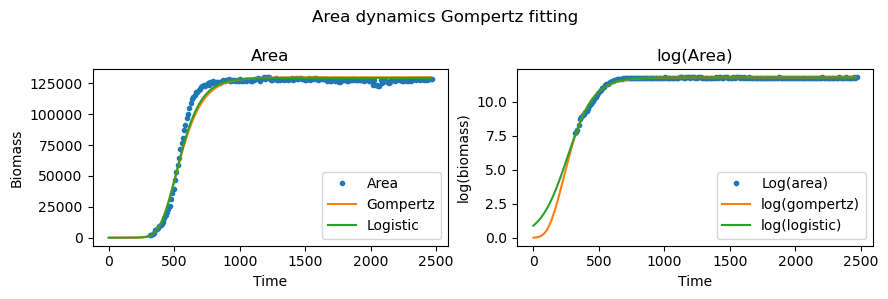

114
Gompertz Model:
  SSR: 0.5954
  R²: 0.9964
  AIC: -1267.0540
  BIC: -1256.9281

Logistic Model:
  SSR: 0.6692
  R²: 0.9960
  AIC: -1241.8251
  BIC: -1231.6992

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.18198214e+01 2.84978143e-02 5.37299657e+01]
Logistic params are: [1.18047579e+01 2.28791640e-02 4.78588869e-19]


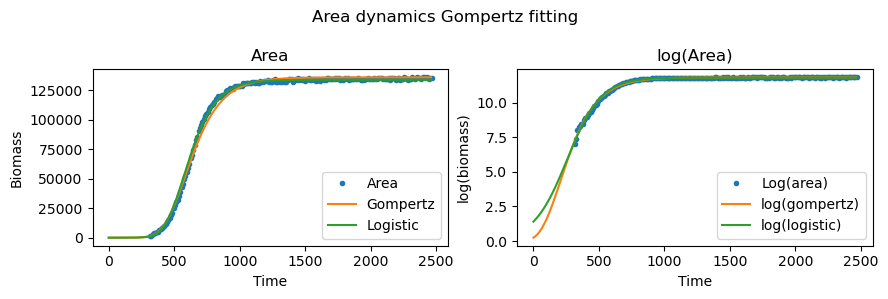

115
Gompertz Model:
  SSR: 0.9079
  R²: 0.9931
  AIC: -1175.9241
  BIC: -1165.7982

Logistic Model:
  SSR: 1.3018
  R²: 0.9901
  AIC: -1098.0944
  BIC: -1087.9686

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.11998890e+01 2.60184245e-02 2.89968066e+01]
Logistic params are: [1.11769727e+01 2.22152681e-02 2.07466533e-18]


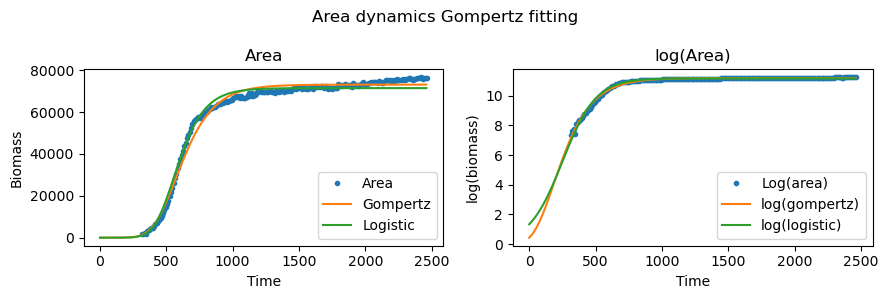

116
Gompertz Model:
  SSR: 0.3457
  R²: 0.9965
  AIC: -2799.3415
  BIC: -2787.3821

Logistic Model:
  SSR: 0.2434
  R²: 0.9975
  AIC: -2938.9951
  BIC: -2927.0357

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20396491e+01 3.20848495e-02 8.98078042e+01]
Logistic params are: [12.0381615   0.02359093  4.24716821]


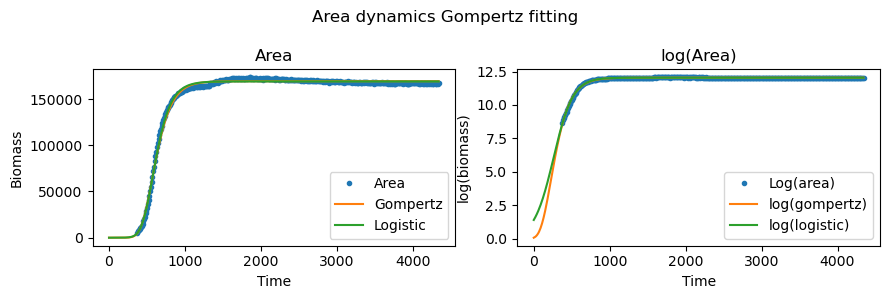

117
Gompertz Model:
  SSR: 0.4638
  R²: 0.9953
  AIC: -2682.3883
  BIC: -2670.4290

Logistic Model:
  SSR: 0.3389
  R²: 0.9966
  AIC: -2807.2194
  BIC: -2795.2601

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21061045e+01 3.42347771e-02 1.09641386e+02]
Logistic params are: [1.21046352e+01 2.52322366e-02 3.01711887e+01]


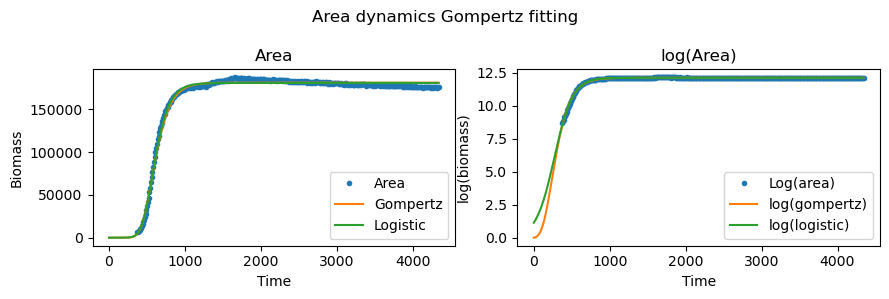

118
Gompertz Model:
  SSR: 0.5783
  R²: 0.9956
  AIC: -2594.5997
  BIC: -2582.6403

Logistic Model:
  SSR: 0.3710
  R²: 0.9972
  AIC: -2771.2066
  BIC: -2759.2473

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21994328e+01 3.30292108e-02 1.15874115e+02]
Logistic params are: [1.21975306e+01 2.45857113e-02 3.77118998e+01]


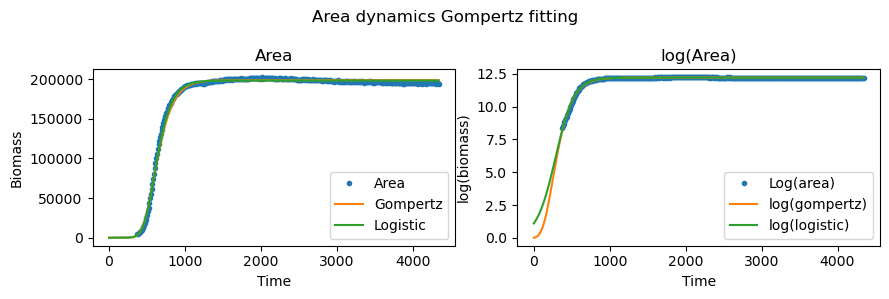

119
Gompertz Model:
  SSR: 0.6313
  R²: 0.9947
  AIC: -2559.6621
  BIC: -2547.7027

Logistic Model:
  SSR: 0.4316
  R²: 0.9964
  AIC: -2711.0502
  BIC: -2699.0909

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.19698473e+01 3.40897246e-02 1.27443977e+02]
Logistic params are: [1.19681006e+01 2.53675014e-02 5.30078008e+01]


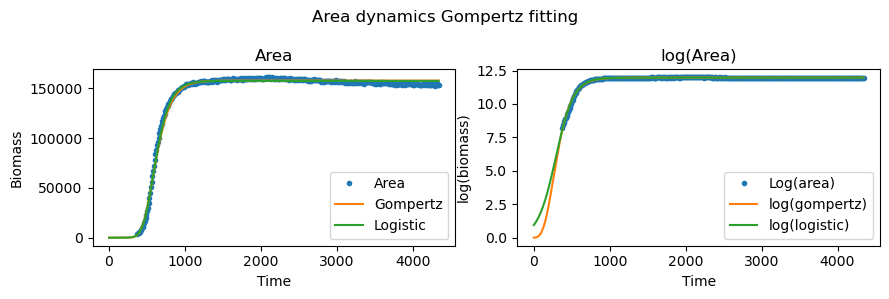

120
Gompertz Model:
  SSR: 1.4315
  R²: 0.9926
  AIC: -2233.8476
  BIC: -2221.8883

Logistic Model:
  SSR: 0.9386
  R²: 0.9952
  AIC: -2401.8187
  BIC: -2389.8593

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.17734580e+01 3.03465576e-02 1.38407167e+02]
Logistic params are: [1.17706278e+01 2.30979824e-02 6.70966635e+01]


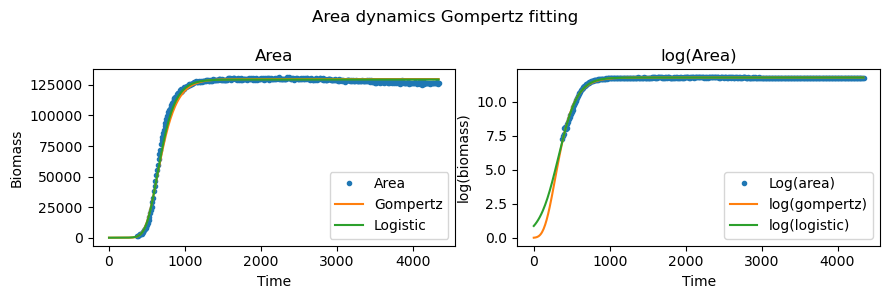

121
Gompertz Model:
  SSR: 1.0366
  R²: 0.9950
  AIC: -2362.2839
  BIC: -2350.3245

Logistic Model:
  SSR: 0.6316
  R²: 0.9969
  AIC: -2559.4954
  BIC: -2547.5360

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22136644e+01 2.67812500e-02 8.20605885e+01]
Logistic params are: [1.22094524e+01 2.04786951e-02 1.35726912e-14]


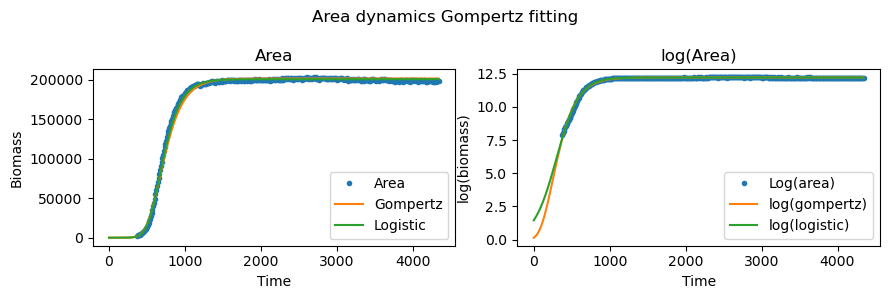

122
Gompertz Model:
  SSR: 0.4464
  R²: 0.9970
  AIC: -2697.6088
  BIC: -2685.6494

Logistic Model:
  SSR: 0.2713
  R²: 0.9982
  AIC: -2895.7863
  BIC: -2883.8269

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24136752e+01 3.00251196e-02 8.40265541e+01]
Logistic params are: [1.24108791e+01 2.25171933e-02 2.56420201e-13]


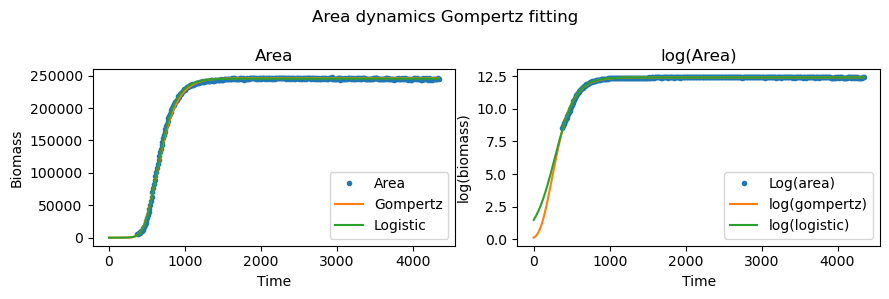

123
Gompertz Model:
  SSR: 0.6515
  R²: 0.9963
  AIC: -2547.1295
  BIC: -2535.1701

Logistic Model:
  SSR: 0.3835
  R²: 0.9978
  AIC: -2758.0321
  BIC: -2746.0727

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.25456546e+01 3.14058106e-02 1.09681380e+02]
Logistic params are: [1.25430771e+01 2.35750163e-02 2.93599882e+01]


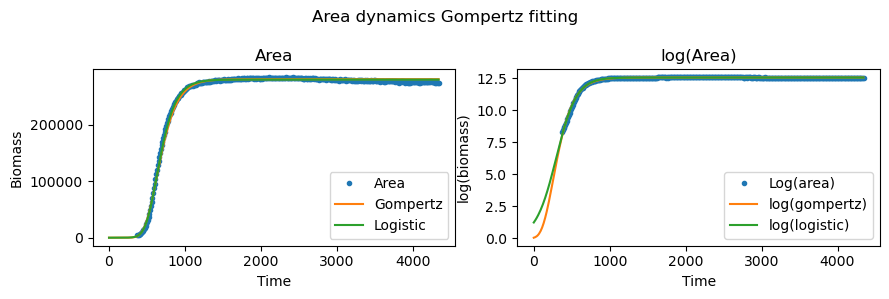

124
Gompertz Model:
  SSR: 0.4868
  R²: 0.9965
  AIC: -2663.1559
  BIC: -2651.1965

Logistic Model:
  SSR: 0.3069
  R²: 0.9978
  AIC: -2846.6906
  BIC: -2834.7313

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.24913531e+01 3.18801894e-02 9.80426630e+01]
Logistic params are: [12.48925211  0.02370582 14.51770274]


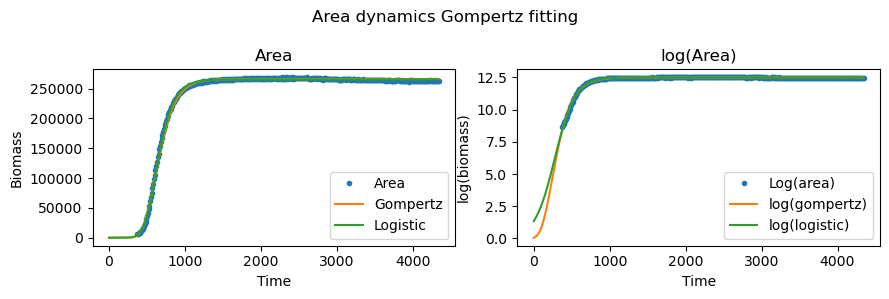

125
Gompertz Model:
  SSR: 7.4309
  R²: 0.9879
  AIC: -1578.3588
  BIC: -1566.3995

Logistic Model:
  SSR: 5.2751
  R²: 0.9914
  AIC: -1714.7385
  BIC: -1702.7791

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.13969816e+01 1.54691170e-02 4.38282896e+01]
Logistic params are: [1.13731305e+01 1.33926199e-02 3.96581126e-18]


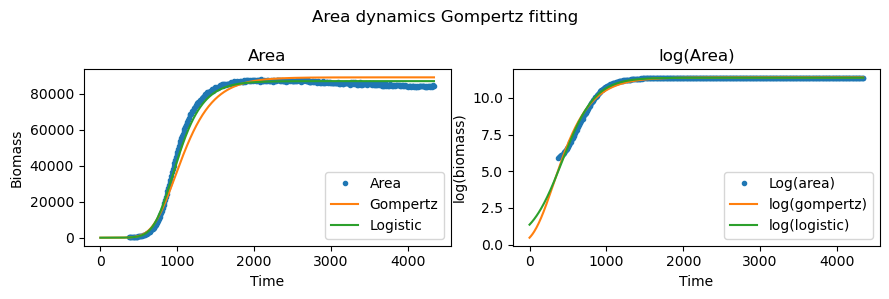

126
Gompertz Model:
  SSR: 3.7523
  R²: 0.9903
  AIC: -1850.3007
  BIC: -1838.3413

Logistic Model:
  SSR: 5.8044
  R²: 0.9850
  AIC: -1676.6770
  BIC: -1664.7176

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.80091155  0.01773369  5.24762556]
Logistic params are: [1.17716900e+01 1.62688310e-02 1.24546939e-14]


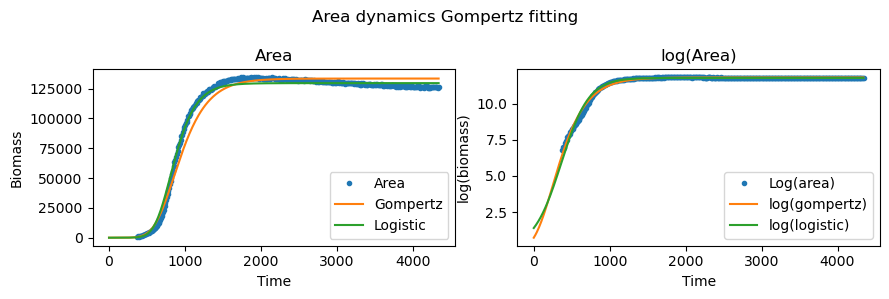

127
Gompertz Model:
  SSR: 2.5989
  R²: 0.9930
  AIC: -1996.4787
  BIC: -1984.5194

Logistic Model:
  SSR: 3.7146
  R²: 0.9900
  AIC: -1854.3231
  BIC: -1842.3638

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.19717971e+01 1.90095553e-02 2.17357456e+01]
Logistic params are: [1.19474574e+01 1.69041197e-02 4.99446543e-13]


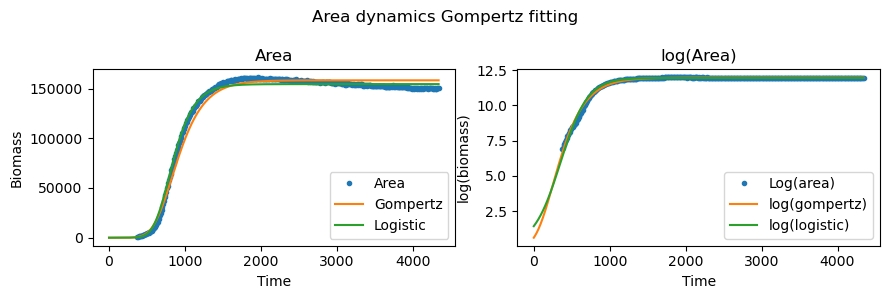

128
Gompertz Model:
  SSR: 2.2621
  R²: 0.9941
  AIC: -2051.7232
  BIC: -2039.7639

Logistic Model:
  SSR: 2.1354
  R²: 0.9944
  AIC: -2074.6676
  BIC: -2062.7082

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20054328e+01 2.00180497e-02 4.77182738e+01]
Logistic params are: [1.19882551e+01 1.69278099e-02 3.94830001e-14]


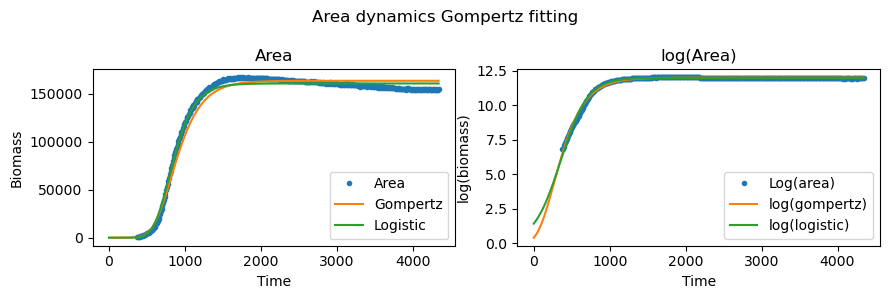

129
Gompertz Model:
  SSR: 2.3246
  R²: 0.9964
  AIC: -2040.8680
  BIC: -2028.9087

Logistic Model:
  SSR: 10.4168
  R²: 0.9839
  AIC: -1443.9287
  BIC: -1431.9693

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.27569611e+01 1.66757625e-02 8.54175070e-20]
Logistic params are: [1.27104122e+01 1.55904383e-02 1.36158314e-16]


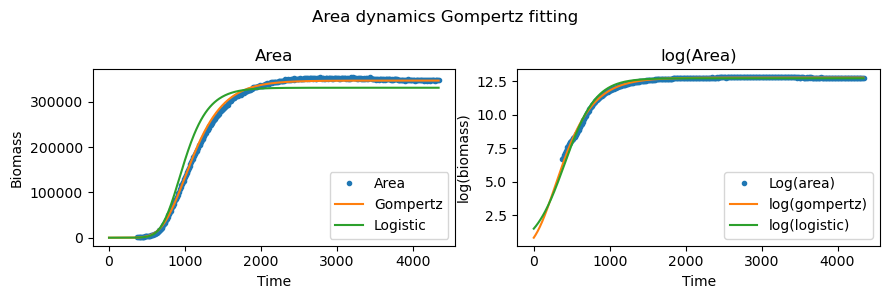

130
Gompertz Model:
  SSR: 2.7592
  R²: 0.9957
  AIC: -1972.6627
  BIC: -1960.7033

Logistic Model:
  SSR: 6.2506
  R²: 0.9904
  AIC: -1647.2040
  BIC: -1635.2446

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.45394669  0.0163985   7.58751669]
Logistic params are: [1.24114401e+01 1.51403936e-02 2.97421580e-15]


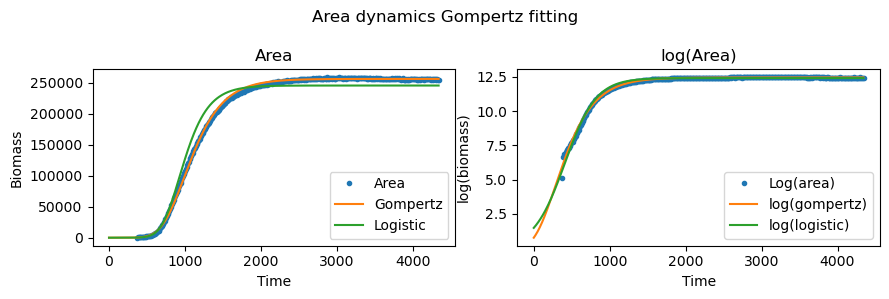

131
Gompertz Model:
  SSR: 2.3234
  R²: 0.9964
  AIC: -2041.0859
  BIC: -2029.1265

Logistic Model:
  SSR: 6.1538
  R²: 0.9904
  AIC: -1653.4118
  BIC: -1641.4525

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.44843652  0.01663107 12.62200894]
Logistic params are: [1.24076995e+01 1.52277188e-02 3.52686360e-15]


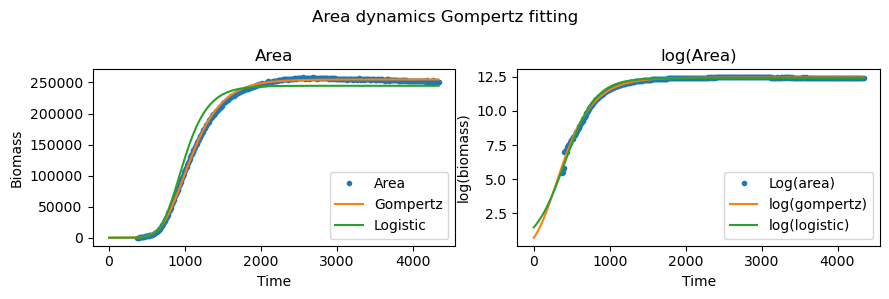

132
Gompertz Model:
  SSR: 3.5698
  R²: 0.9947
  AIC: -1870.1532
  BIC: -1858.1939

Logistic Model:
  SSR: 5.9379
  R²: 0.9911
  AIC: -1667.6315
  BIC: -1655.6721

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.26092982e+01 1.71773233e-02 2.53527911e+01]
Logistic params are: [1.25743871e+01 1.53649218e-02 2.09253136e-19]


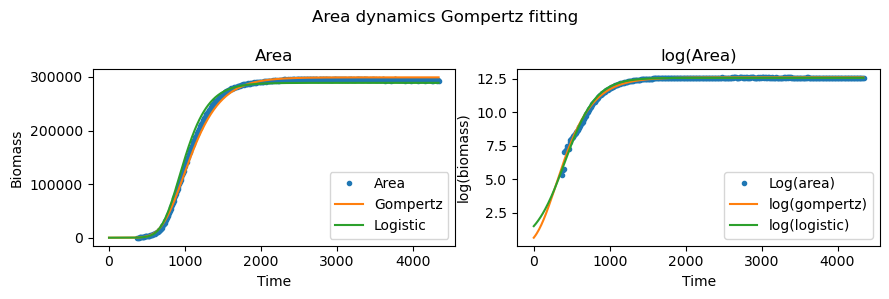

133
Gompertz Model:
  SSR: 2.8224
  R²: 0.9955
  AIC: -1963.6456
  BIC: -1951.6862

Logistic Model:
  SSR: 8.6015
  R²: 0.9863
  AIC: -1520.1358
  BIC: -1508.1764

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.29605371e+01 1.73833747e-02 7.89851676e-18]
Logistic params are: [1.29175911e+01 1.62039880e-02 2.00806332e-17]


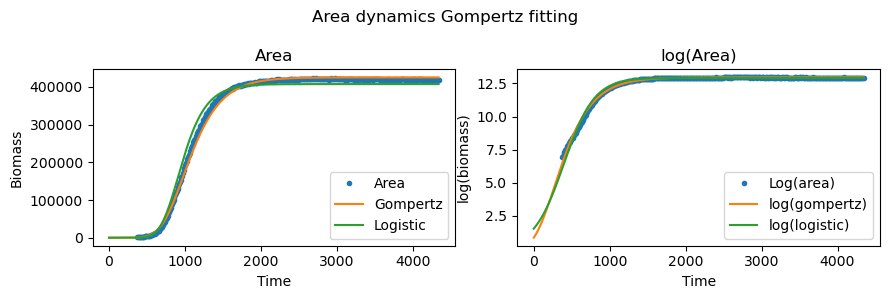

134
Gompertz Model:
  SSR: 3.1802
  R²: 0.9948
  AIC: -1916.1387
  BIC: -1904.1793

Logistic Model:
  SSR: 6.9739
  R²: 0.9886
  AIC: -1603.6236
  BIC: -1591.6643

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.29742575e+01 1.76537191e-02 3.81785212e-21]
Logistic params are: [1.29332700e+01 1.64347250e-02 2.02002851e-19]


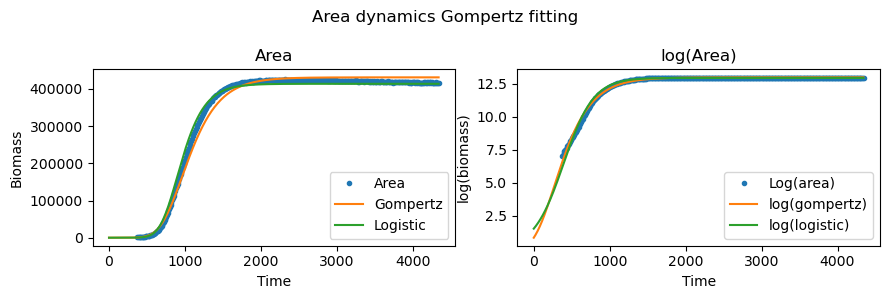

135
Gompertz Model:
  SSR: 0.8271
  R²: 0.9945
  AIC: -2452.1460
  BIC: -2440.1867

Logistic Model:
  SSR: 0.5379
  R²: 0.9964
  AIC: -2623.4055
  BIC: -2611.4461

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.21322247e+01 3.38769828e-02 1.36661791e+02]
Logistic params are: [1.21300790e+01 2.54357998e-02 6.48314188e+01]


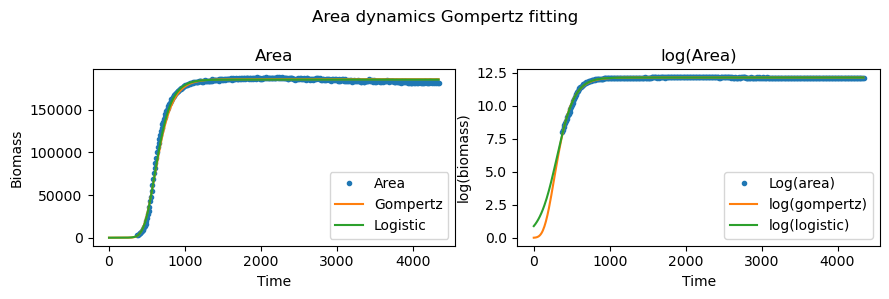

136
Gompertz Model:
  SSR: 0.2699
  R²: 0.9976
  AIC: -2964.2509
  BIC: -2952.2318

Logistic Model:
  SSR: 0.2276
  R²: 0.9980
  AIC: -3033.4743
  BIC: -3021.4553

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16161176e+01 3.45319670e-02 5.88050308e+01]
Logistic params are: [1.16127580e+01 2.65526965e-02 8.78031706e-17]


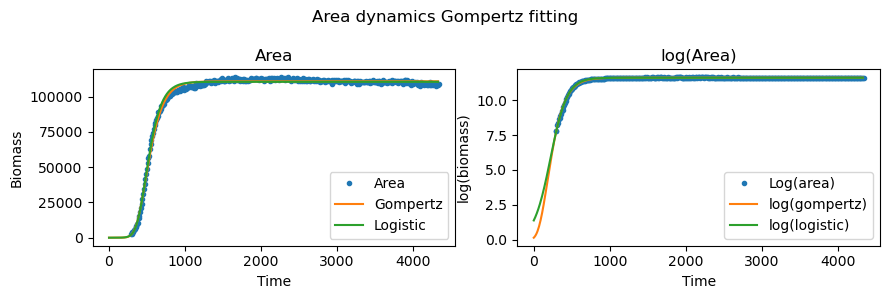

137
Gompertz Model:
  SSR: 0.2980
  R²: 0.9967
  AIC: -2924.0637
  BIC: -2912.0447

Logistic Model:
  SSR: 1.0362
  R²: 0.9886
  AIC: -2418.1372
  BIC: -2406.1182

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.52194568  0.03073889  8.18096369]
Logistic params are: [1.15109123e+01 2.72917783e-02 5.43269017e-17]


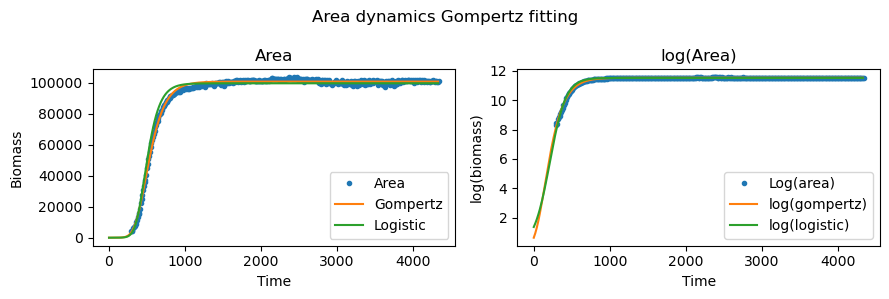

138
Gompertz Model:
  SSR: 0.4549
  R²: 0.9959
  AIC: -2752.4150
  BIC: -2740.3959

Logistic Model:
  SSR: 0.3845
  R²: 0.9965
  AIC: -2820.6811
  BIC: -2808.6621

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.16877470e+01 3.42448122e-02 5.14393833e+01]
Logistic params are: [1.16833269e+01 2.69035114e-02 8.20415341e-29]


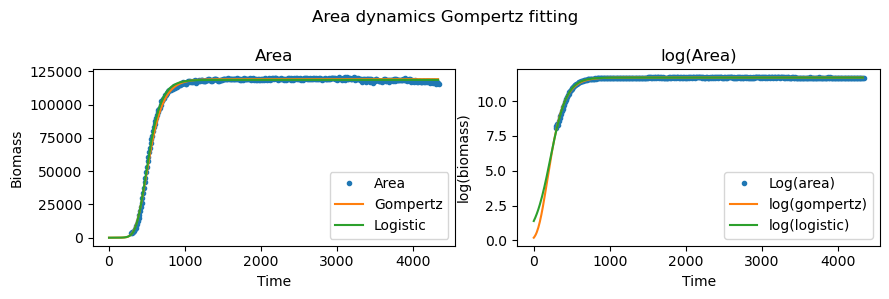

139
Gompertz Model:
  SSR: 0.4700
  R²: 0.9956
  AIC: -2739.1614
  BIC: -2727.1423

Logistic Model:
  SSR: 0.8312
  R²: 0.9923
  AIC: -2507.6186
  BIC: -2495.5995

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.78482256  0.03219937 25.61861141]
Logistic params are: [1.17761274e+01 2.72833667e-02 3.29542304e-18]


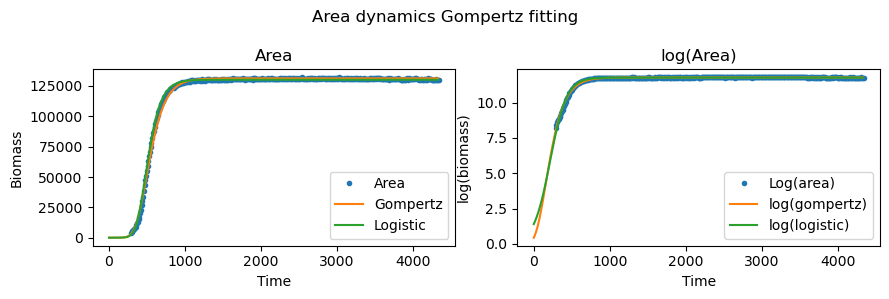

140
Gompertz Model:
  SSR: 0.9830
  R²: 0.9937
  AIC: -2439.5318
  BIC: -2427.5128

Logistic Model:
  SSR: 0.7011
  R²: 0.9955
  AIC: -2576.7373
  BIC: -2564.7183

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15663668e+01 3.18559628e-02 5.99871572e+01]
Logistic params are: [1.15625463e+01 2.46896107e-02 8.88951460e-18]


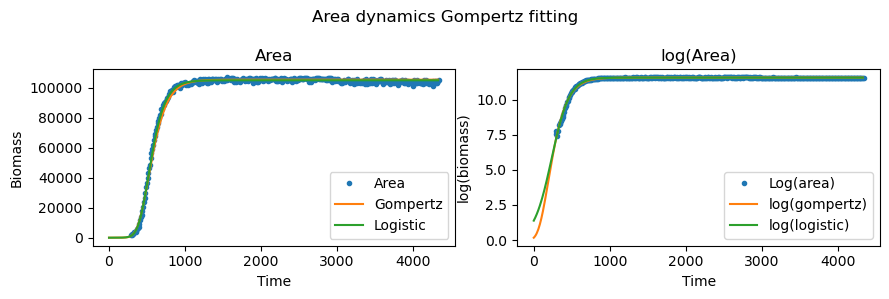

141
Gompertz Model:
  SSR: 0.6946
  R²: 0.9952
  AIC: -2580.5282
  BIC: -2568.5092

Logistic Model:
  SSR: 0.5458
  R²: 0.9962
  AIC: -2678.4399
  BIC: -2666.4209

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.15756611e+01 3.15141872e-02 5.02626490e+01]
Logistic params are: [1.15702078e+01 2.50880265e-02 9.77640497e-20]


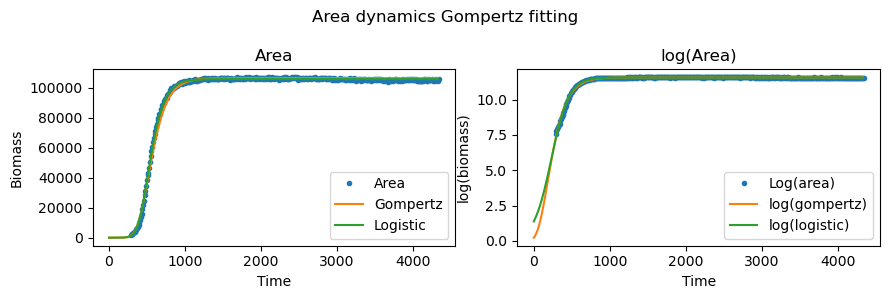

142
Gompertz Model:
  SSR: 0.2866
  R²: 0.9974
  AIC: -2939.9520
  BIC: -2927.9329

Logistic Model:
  SSR: 0.1744
  R²: 0.9984
  AIC: -3141.5135
  BIC: -3129.4945

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.22828785e+01 4.02737785e-02 7.59247739e+01]
Logistic params are: [12.28134486  0.02994087 10.86573651]


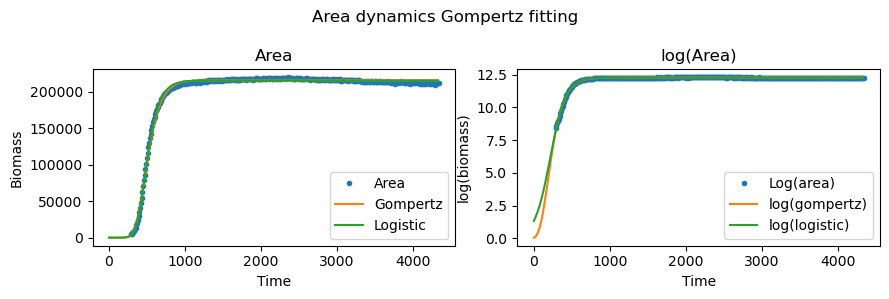

143
Gompertz Model:
  SSR: 0.2972
  R²: 0.9971
  AIC: -2925.1337
  BIC: -2913.1146

Logistic Model:
  SSR: 0.1766
  R²: 0.9983
  AIC: -3136.4156
  BIC: -3124.3966

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.20895505e+01 4.02486665e-02 7.72254468e+01]
Logistic params are: [12.08814621  0.02987345 12.55214122]


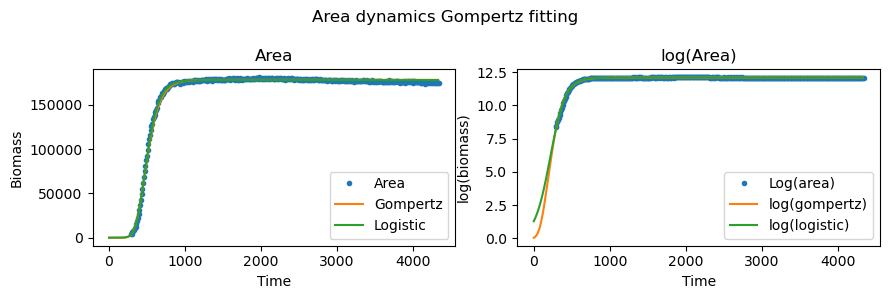

144
Gompertz Model:
  SSR: 0.5304
  R²: 0.9960
  AIC: -2690.0576
  BIC: -2678.0385

Logistic Model:
  SSR: 0.3399
  R²: 0.9974
  AIC: -2870.6674
  BIC: -2858.6484

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.18240562e+01 3.61725973e-02 7.40246756e+01]
Logistic params are: [11.82210251  0.02717231  8.57221214]


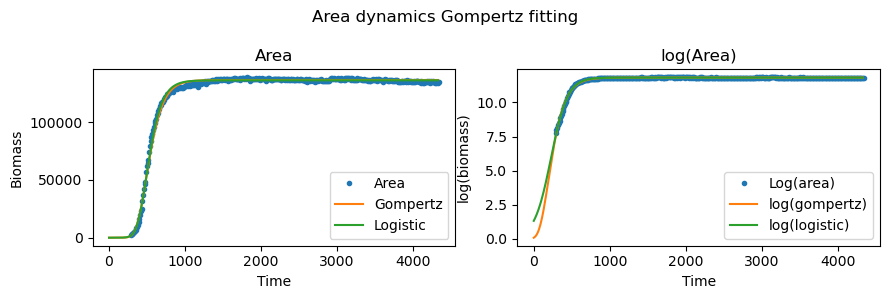

145
Gompertz Model:
  SSR: 5.1378
  R²: 0.9915
  AIC: -1768.1118
  BIC: -1756.0928

Logistic Model:
  SSR: 6.9459
  R²: 0.9885
  AIC: -1645.6897
  BIC: -1633.6706

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [12.11627051  0.01929522  7.17166078]
Logistic params are: [1.20865828e+01 1.77410573e-02 4.00510648e-13]


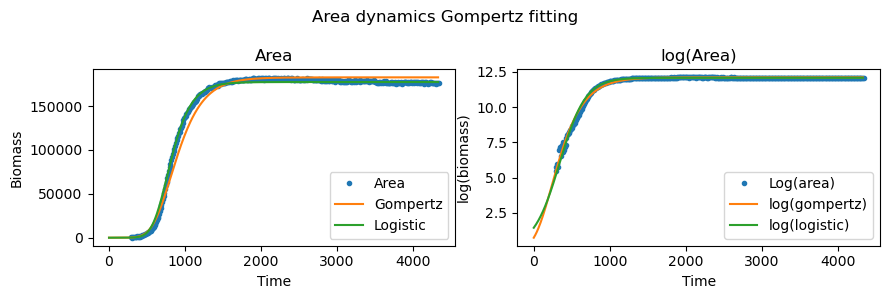

146
Gompertz Model:
  SSR: 18.8729
  R²: 0.9704
  AIC: -1231.7290
  BIC: -1219.7248

Logistic Model:
  SSR: 20.6483
  R²: 0.9676
  AIC: -1195.4084
  BIC: -1183.4041

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.12839070e+01 1.90749120e-02 7.33626688e+01]
Logistic params are: [1.12744811e+01 1.53276365e-02 4.20599012e-15]


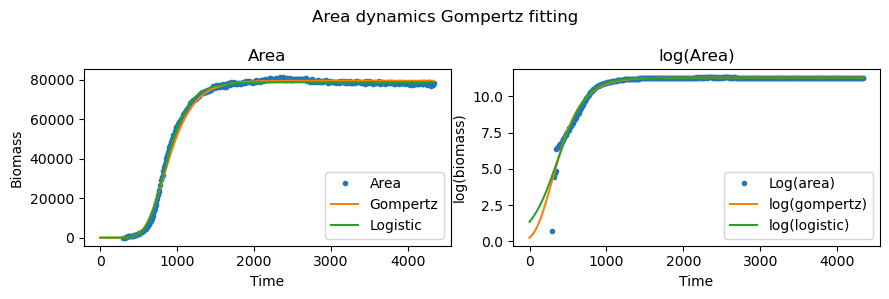

147
Gompertz Model:
  SSR: 9.3687
  R²: 0.9768
  AIC: -1514.6712
  BIC: -1502.6670

Logistic Model:
  SSR: 17.9493
  R²: 0.9555
  AIC: -1252.0016
  BIC: -1239.9974

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.09181591e+01 1.71523933e-02 3.10549147e-15]
Logistic params are: [1.08890132e+01 1.59698605e-02 3.32628902e-14]


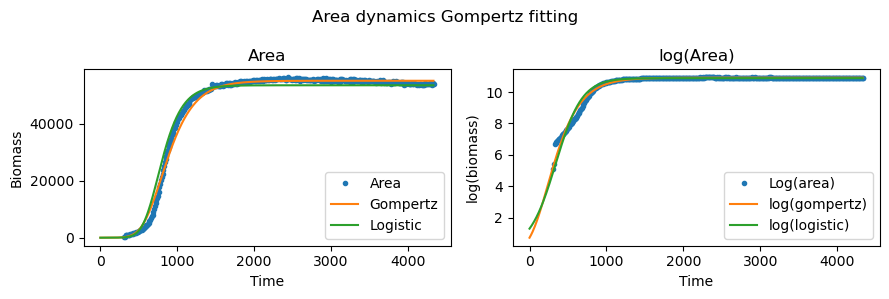

148
Gompertz Model:
  SSR: 16.6152
  R²: 0.9637
  AIC: -1291.5903
  BIC: -1279.5712

Logistic Model:
  SSR: 30.6090
  R²: 0.9331
  AIC: -1043.5340
  BIC: -1031.5149

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.09583477e+01 1.70536975e-02 1.56749390e-13]
Logistic params are: [1.09283762e+01 1.58918033e-02 2.70531336e-14]


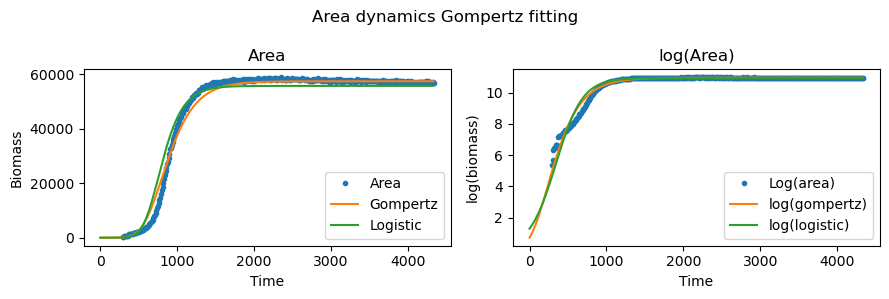

149
Gompertz Model:
  SSR: 2.0492
  R²: 0.9917
  AIC: -2016.0107
  BIC: -2004.1432

Logistic Model:
  SSR: 1.3762
  R²: 0.9945
  AIC: -2169.7003
  BIC: -2157.8328

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.12232295e+01 1.94951393e-02 1.43624836e+02]
Logistic params are: [1.12186097e+01 1.48632596e-02 3.86825752e+01]


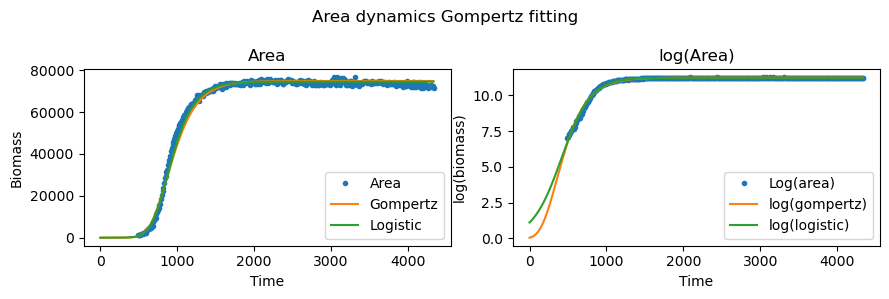

150
Gompertz Model:
  SSR: 5.0301
  R²: 0.9914
  AIC: -1776.7146
  BIC: -1764.6955

Logistic Model:
  SSR: 8.6230
  R²: 0.9853
  AIC: -1557.8774
  BIC: -1545.8584

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.13695553e+01 1.70162522e-02 2.28653401e-21]
Logistic params are: [1.13379524e+01 1.58747020e-02 8.52666526e-16]


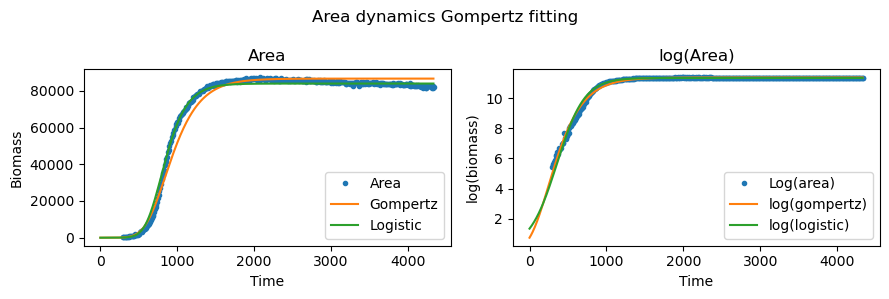

151
Gompertz Model:
  SSR: 7.6079
  R²: 0.9859
  AIC: -1608.7301
  BIC: -1596.7111

Logistic Model:
  SSR: 7.8338
  R²: 0.9855
  AIC: -1596.8481
  BIC: -1584.8290

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [11.71494965  0.01935458 15.05316175]
Logistic params are: [1.16909227e+01 1.74655576e-02 4.58681263e-17]


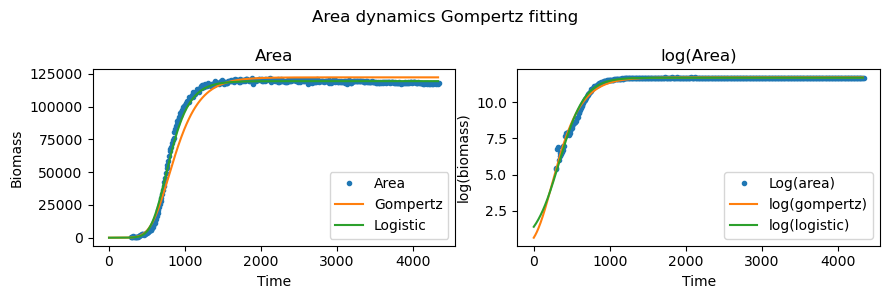

152
Gompertz Model:
  SSR: 7.6155
  R²: 0.9857
  AIC: -1598.3753
  BIC: -1586.3711

Logistic Model:
  SSR: 6.2849
  R²: 0.9882
  AIC: -1675.9609
  BIC: -1663.9566

The Logistic model is preferred based on AIC.
The Logistic model is preferred based on BIC.
Gompertz params are: [1.14821238e+01 1.97982416e-02 5.33375185e+01]
Logistic params are: [1.14687297e+01 1.65019646e-02 1.95724940e-15]


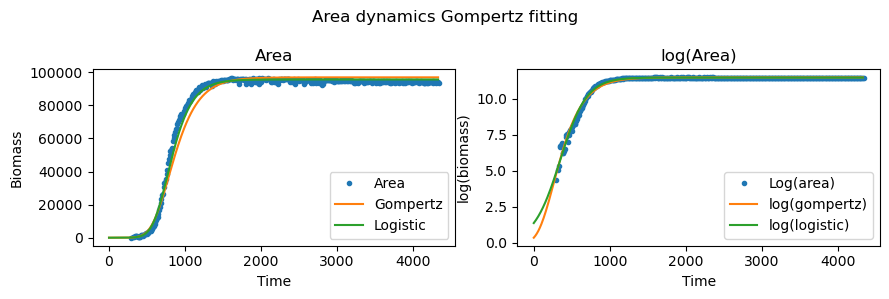

153
Gompertz Model:
  SSR: 28.5668
  R²: 0.9645
  AIC: -1056.9709
  BIC: -1044.9816

Logistic Model:
  SSR: 34.9140
  R²: 0.9566
  AIC: -976.3134
  BIC: -964.3240

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14108140e+01 2.66127788e-02 2.06033954e+02]
Logistic params are: [1.14010475e+01 2.20414333e-02 1.65744188e+02]


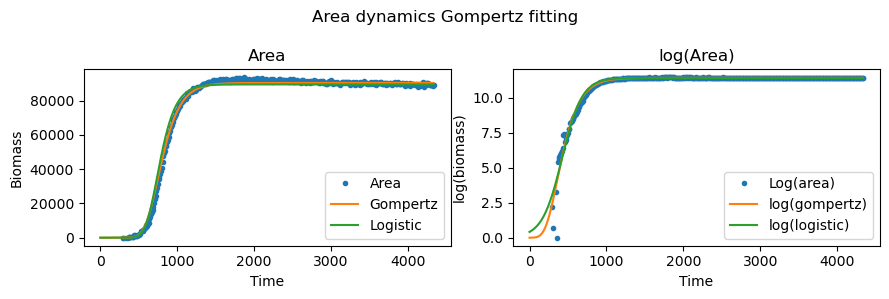

154
Gompertz Model:
  SSR: 3.0300
  R²: 0.9893
  AIC: -1982.4983
  BIC: -1970.4793

Logistic Model:
  SSR: 6.5292
  R²: 0.9769
  AIC: -1670.8104
  BIC: -1658.7913

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.13457962e+01 2.17598048e-02 9.40134990e-15]
Logistic params are: [1.13236864e+01 2.01556505e-02 8.72484261e-21]


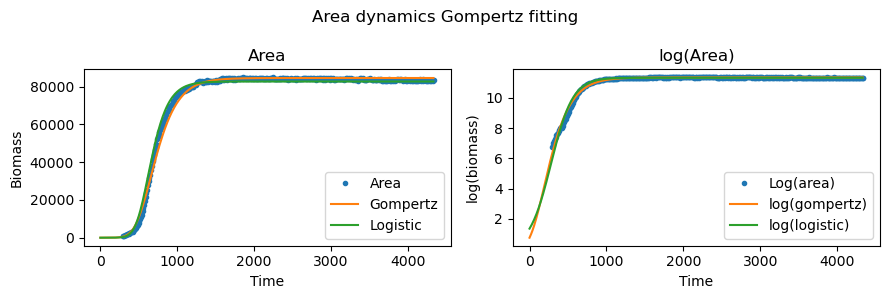

155
Gompertz Model:
  SSR: 2.6936
  R²: 0.9902
  AIC: -2030.2858
  BIC: -2018.2667

Logistic Model:
  SSR: 5.5735
  R²: 0.9797
  AIC: -1735.0647
  BIC: -1723.0456

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.14945113e+01 2.24632839e-02 1.95938408e-23]
Logistic params are: [1.14730251e+01 2.07836126e-02 2.87195256e-17]


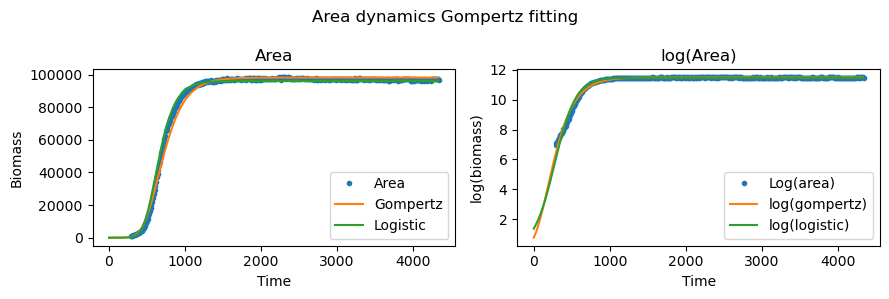

156
Gompertz Model:
  SSR: 3.0064
  R²: 0.9908
  AIC: -1985.6715
  BIC: -1973.6524

Logistic Model:
  SSR: 5.5940
  R²: 0.9829
  AIC: -1733.5695
  BIC: -1721.5504

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.15801217e+01 2.16001971e-02 1.04588848e-12]
Logistic params are: [1.15563980e+01 2.00401712e-02 1.52376016e-18]


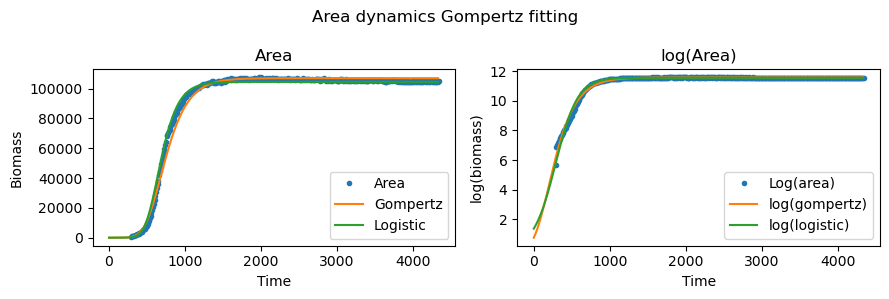

157
Gompertz Model:
  SSR: 0.5126
  R²: 0.9957
  AIC: -2703.9114
  BIC: -2691.8924

Logistic Model:
  SSR: 0.6267
  R²: 0.9947
  AIC: -2622.2718
  BIC: -2610.2528

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.16760438e+01 3.22175167e-02 3.77210093e+01]
Logistic params are: [1.16689903e+01 2.64437946e-02 3.24130747e-20]


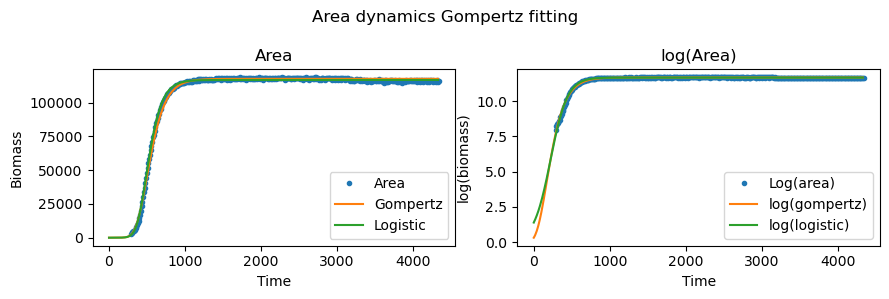

158
Gompertz Model:
  SSR: 10.7261
  R²: 0.9794
  AIC: -1469.2703
  BIC: -1457.2513

Logistic Model:
  SSR: 15.9930
  R²: 0.9693
  AIC: -1307.0856
  BIC: -1295.0665

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.15807246e+01 1.82468975e-02 1.07386526e-16]
Logistic params are: [1.15518657e+01 1.69764182e-02 2.37610282e-15]


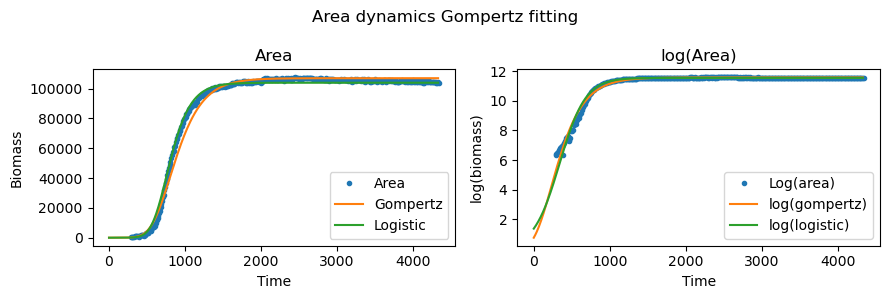

159
Gompertz Model:
  SSR: 36.5103
  R²: 0.8902
  AIC: -971.9558
  BIC: -959.9367

Logistic Model:
  SSR: 56.7964
  R²: 0.8292
  AIC: -792.5533
  BIC: -780.5342

The Gompertz model is preferred based on AIC.
The Gompertz model is preferred based on BIC.
Gompertz params are: [1.00479244e+01 1.61378129e-02 1.74191816e-13]
Logistic params are: [1.00196840e+01 1.50438943e-02 1.00158830e-13]


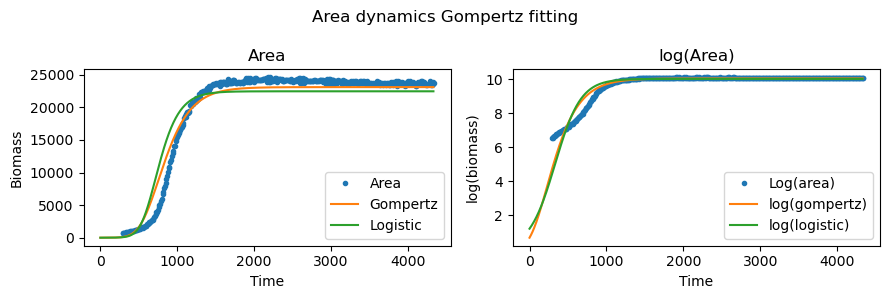

In [70]:
aic_gomp = 0
aic_log = 0
bic_gomp = 0
bic_log = 0

gomp_params = np.zeros((len(df.index.values),3))
log_params = np.zeros((len(df.index.values),3))

for i in df.index.values:
    print(i)
    # Fit the model
    incub_time_s = datetime.strptime(df.loc[i,'t_im'], '%H:%M:%S') - datetime.strptime(df.loc[i,'t_incub'], '%H:%M:%S')
    incub_time_n = incub_time_s.seconds / 60
    area = extract_array(df.loc[i,'area_px'])
    #area = extract_array(df.loc[i,'area_px']) * df.loc[i,'um_px']**2
    time_points = np.arange(0, df.loc[i, 'exp length'])*10 + incub_time_n

    # this is for positions i in [146,147,149,152,153] that contain area = 0 then log(a) = inf
    valid_indices = area > 0
    time_points = time_points[valid_indices]
    area = area[valid_indices]
    
    #p0_gomp=[area[-1], 200, incub_time_n]
    #p0_log=[np.log(area[-1]), 0.1, incub_time_n]

    p0_gomp=[np.log(area[-1]), 0.02, 300]
    p0_log=[np.log(area[-1]), 0.02, 300]

    # Fit both models   
    ## gomp
    bounds_gomp = ([0, 0, 0], [np.inf, np.inf, np.inf])
    bounds_log = ([0, 0, 0], [np.inf, np.inf, np.inf])
    
    #try:
    params_gompertz, cov_gompertz = curve_fit(gompertz, time_points, np.log(area), p0_gomp, bounds=bounds_gomp, maxfev=10000)
    #except:
    #    idx = np.where(np.isfinite(np.log(area)))[0]
    #    params_gompertz, cov_gompertz = curve_fit(gompertz, time_points[idx], np.log(area)[idx], p0_gomp, bounds=bounds_gomp, maxfev = 10000)#, bounds=([1, 0, 0], [np.inf, np.inf, np.inf]), max_nfev=10000)
    
    ## logistic
    #try:
    params_logistic, cov_logistic = curve_fit(logistic, time_points, np.log(area), p0_log, bounds=bounds_log, maxfev=10000)     
    #except:
    #    idx = np.where(np.isfinite(np.log(area)))[0]
    #    params_logistic, cov_logistic = curve_fit(logistic, time_points[idx], np.log(area)[idx], p0_log, bounds=bounds_log, maxfev=10000)#, bounds=([1, 0, 0], [np.inf, np.inf, np.inf]), max_nfev=10000)

    gomp_params[i,:] = params_gompertz
    log_params[i,:] = params_logistic
    
     # Calculate predicted values
    pred_gompertz = gompertz(time_points, *params_gompertz)
    pred_logistic = logistic(time_points, *params_logistic)
    
    # Calculate residuals
    residuals_gompertz = np.log(area) - pred_gompertz
    residuals_logistic = np.log(area) - pred_logistic
    
    # Calculate SSR (Sum of Squared Residuals)
    ssr_gompertz = np.sum(residuals_gompertz**2)
    ssr_logistic = np.sum(residuals_logistic**2)
    
    # Calculate R²
    r2_gompertz = r2_score(np.log(area), pred_gompertz)
    r2_logistic = r2_score(np.log(area), pred_logistic)
    
    # Calculate AIC
    n = len(area)
    aic_gompertz = n * np.log(ssr_gompertz/n) + 2 * len(params_gompertz)
    aic_logistic = n * np.log(ssr_logistic/n) + 2 * len(params_logistic)
    
    # Calculate BIC
    bic_gompertz = n * np.log(ssr_gompertz/n) + len(params_gompertz) * np.log(n)
    bic_logistic = n * np.log(ssr_logistic/n) + len(params_logistic) * np.log(n)
    
    # Print results
    print("Gompertz Model:")
    print(f"  SSR: {ssr_gompertz:.4f}")
    print(f"  R²: {r2_gompertz:.4f}")
    print(f"  AIC: {aic_gompertz:.4f}")
    print(f"  BIC: {bic_gompertz:.4f}")
    
    print("\nLogistic Model:")
    print(f"  SSR: {ssr_logistic:.4f}")
    print(f"  R²: {r2_logistic:.4f}")
    print(f"  AIC: {aic_logistic:.4f}")
    print(f"  BIC: {bic_logistic:.4f}")
    
    # Determine which model is better
    if aic_gompertz < aic_logistic:
        print("\nThe Gompertz model is preferred based on AIC.")
        aic_gomp = aic_gomp + 1
        
    else:
        print("\nThe Logistic model is preferred based on AIC.")
        aic_log = aic_log + 1
    
    if bic_gompertz < bic_logistic:
        print("The Gompertz model is preferred based on BIC.")
        bic_gomp = bic_gomp + 1
        
    else:
        print("The Logistic model is preferred based on BIC.")
        bic_log = bic_log + 1

    print(f"Gompertz params are: {params_gompertz}")
    print(f"Logistic params are: {params_logistic}")

    ## store fitting results in data_processed file
    pars_gomp_dict = {'A': params_gompertz[0], 'mu_m': params_gompertz[1], 'lambda': params_gompertz[2]}
    pars_log_dict = {'A': params_logistic[0], 'mu_m': params_logistic[1], 'lambda': params_logistic[2]}
    df.at[i, 'gompertz_params_px'] = json.dumps(pars_gomp_dict)
    df.at[i, 'logistic_params_px'] = json.dumps(pars_log_dict)

    time = np.arange(0, time_points[-1], 10, like=time_points)
    #params = list(json.loads(df.loc[i,'logistic_params']).values())
    #params_gomp = list(json.loads(df.loc[i,'gomp_params']).values())
    
    gompertz_full = gompertz(time, *params_gompertz)
    logistic_full = logistic(time, *params_logistic)

    # create subplots
    fig, axes = plt.subplots(1, 2, figsize=(9,3))

    # plot data
    axes[0].plot(time_points, area, '.', label='Area')
    axes[0].plot(time, np.exp(gompertz_full), label='Gompertz')
    axes[0].plot(time, np.exp(logistic_full), label='Logistic')
    axes[0].set_xlabel('Time')
    axes[0].set_ylabel('Biomass')
    axes[0].set_title('Area')
    axes[0].legend()

    # log area
    axes[1].plot(time_points, np.log(area), '.', label='Log(area)')
    axes[1].plot(time, gompertz_full, label='log(gompertz)')
    axes[1].plot(time, logistic_full, label='log(logistic)')
    axes[1].set_xlabel('Time')
    axes[1].set_ylabel('log(biomass)')
    axes[1].set_title('log(Area)')
    axes[1].legend()
    
    plt.suptitle('Area dynamics Gompertz fitting')
    plt.tight_layout()
    plt.show()

In [71]:
df.to_excel('../data_processed.xlsx', index=False)

In [64]:
aic_gomp

89

In [65]:
bic_gomp

89

In [73]:
df = pd.read_excel('../data_processed.xlsx')

##### $\mu m$ fitting vs pixels

In [74]:
gomp_params_px = np.zeros((160,3))
gomp_params_um = np.zeros((160,3))
log_params_px = np.zeros((160,3))
log_params_um = np.zeros((160,3))
for i in df.index.values:
    gomp_px = json.loads(df.loc[i,'gompertz_params_px'])
    gomp_params_px[i,0] = gomp_px['A']
    gomp_params_px[i,1] = gomp_px['mu_m']
    gomp_params_px[i,2] = gomp_px['lambda']

    gomp_um = json.loads(df.loc[i,'gompertz_params_um'])
    gomp_params_um[i,0] = gomp_um['A']
    gomp_params_um[i,1] = gomp_um['mu_m']
    gomp_params_um[i,2] = gomp_um['lambda']

    log_px = json.loads(df.loc[i,'logistic_params_px'])
    log_params_px[i,0] = log_px['A']
    log_params_px[i,1] = log_px['mu_m']
    log_params_px[i,2] = log_px['lambda']

    log_um = json.loads(df.loc[i,'logistic_params_um'])
    log_params_um[i,0] = log_um['A']
    log_params_um[i,1] = log_um['mu_m']
    log_params_um[i,2] = log_um['lambda']

In [76]:
np.linalg.norm(gomp_params_px-gomp_params_um)

104.30034842750784

In [78]:
np.linalg.norm(log_params_px-log_params_um)

72.13079962277197

#### Computing t_m $\mu m$ & pixels

In [ ]:
df = pd.read_excel('../data_processed.xlsx')

In [81]:
for i in df.index.values:
    pars_gomp_px = json.loads(df.loc[i,'gompertz_params_px'])
    t_m_gomp_px = tm_gomp(pars_gomp_px['A'], pars_gomp_px['mu_m'], pars_gomp_px['lambda'])
    
    pars_gomp_um = json.loads(df.loc[i,'gompertz_params_um'])
    t_m_gomp_um = tm_gomp(pars_gomp_um['A'], pars_gomp_um['mu_m'], pars_gomp_um['lambda'])
    
    pars_logistic_px = json.loads(df.loc[i,'logistic_params_px'])
    t_m_logistic_px = tm_logistic(pars_logistic_px['A'], pars_logistic_px['mu_m'], pars_logistic_px['lambda'])

    pars_logistic_um = json.loads(df.loc[i,'logistic_params_um'])
    t_m_logistic_um = tm_logistic(pars_logistic_um['A'], pars_logistic_um['mu_m'], pars_logistic_um['lambda'])

    df.at[i, 't_m_gomp_px'] = t_m_gomp_px
    df.at[i, 't_m_gomp_um'] = t_m_gomp_um
    
    df.at[i, 't_m_logistic_px'] = t_m_logistic_px
    df.at[i, 't_m_logistic_um'] = t_m_logistic_um
    
    print(f'Colony: {i}, tm_gomp_px: {t_m_gomp_px}, tm_gomp_um: {t_m_gomp_um}, t_m_logistic_px: {t_m_logistic_px}, t_m_logistic_um: {t_m_logistic_um}')

Colony: 0, tm_gomp_px: 196.23390190126986, tm_gomp_um: 192.65225688597317, t_m_logistic_px: 225.21958209332928, t_m_logistic_um: 222.19259582024122
Colony: 1, tm_gomp_px: 189.07135430439905, tm_gomp_um: 185.7591507961924, t_m_logistic_px: 216.25472701733372, t_m_logistic_um: 214.61629572251323
Colony: 2, tm_gomp_px: 180.60896841221168, tm_gomp_um: 177.38356352842527, t_m_logistic_px: 209.42839534555003, t_m_logistic_um: 207.88246671221057
Colony: 3, tm_gomp_px: 151.43910459139005, tm_gomp_um: 148.04561552453396, t_m_logistic_px: 199.9044225215117, t_m_logistic_um: 198.4369910456967
Colony: 4, tm_gomp_px: 186.95402049153427, tm_gomp_um: 183.77360312790168, t_m_logistic_px: 211.5737186855637, t_m_logistic_um: 208.80417399643457
Colony: 5, tm_gomp_px: 192.85300674166376, tm_gomp_um: 189.48087275377455, t_m_logistic_px: 219.23741818804282, t_m_logistic_um: 215.5179005553303
Colony: 6, tm_gomp_px: 182.81373011206642, tm_gomp_um: 178.0506429186527, t_m_logistic_px: 241.7055522502598, t_m_log

In [82]:
df.to_excel('../data_processed.xlsx', index=False)

### Growth rate

In [23]:
df = pd.read_excel('../data_processed.xlsx')

In [ ]:
for pos in df.index.values:
    df_pos = df.loc[pos,:]
    print(f"Date: {df_pos['Date']}, Machine: {df_pos['Machine']}, Position: {df_pos['Position']}")
    gparams = json.loads(df_pos['gompertz_params_um'])
    lparams = json.loads(df_pos['logistic_params_um'])
    
    gA = gparams['A']
    gmu = gparams['mu_m']
    gl = gparams['lambda']
    lA = lparams['A']
    lmu = lparams['mu_m']
    ll = lparams['lambda']
    
    idx = pos
    area = extract_array(df.loc[idx,'area'])
    incub_time_s = datetime.strptime(df.loc[idx,'t_im'], '%H:%M:%S') - datetime.strptime(df.loc[idx,'t_incub'], '%H:%M:%S')
    incub_time_n = incub_time_s.seconds / 60
    time_points = np.arange(0, df.loc[idx, 'exp length'])*10 + incub_time_n
    t = np.arange(0, time_points[-1]+1, 10)

    gg = gompertz(t,gA,gmu,gl)
    lg = logistic(t,lA,lmu,ll)
    plt.plot(t,np.exp(gg), label='Gompertz')
    plt.plot(t,np.exp(lg), label='Logistic')
    plt.plot(time_points,area, label='Area')
    plt.legend()
    plt.show()

    ggr = gompertz_growth_rate(t,gA,gmu,gl)
    lgr = logistic_growth_rate(t,lA,lmu,ll)
    
    rel_a = savgol_filter(np.log(area), 21, 3, deriv=1) / 10# / savgol_filter(np.log(area), 21, 3), delta t
    
    plt.plot(t, ggr, label='Gompertz')
    plt.plot(t, lgr, label='Logistic')
    #plt.plot(time_points, ggr[(len(ggr)-len(area)):] / np.log(area), label='Gompertz')
    #plt.plot(time_points, lgr[(len(lgr)-len(area)):] / np.log(area), label='Logistic')
    plt.plot(time_points, rel_a, label='1/log(A) dlog(A)/dt')
    #plt.plot(time_points,area, label='Area')
    plt.legend()
    plt.show()